# import packges

In [19]:
library(DESeq2)
library(data.table)
library(dplyr)
library(TxDb.Hsapiens.UCSC.hg38.knownGene)
#library(EnsDb.Hsapiens.v86)
library(clusterProfiler)
library(AnnotationDbi)
library(org.Hs.eg.db)
library(ggplot2)
library(gridExtra)
library(RColorBrewer)
library(IRdisplay)
library(GGally)
library(ChIPpeakAnno)
library(universalmotif)
library(IRdisplay)
library(ggpubr)
library(DiffBind)
library(kableExtra)
library(tidyverse)
library(ggraph)
library(tidygraph)
library(readxl)
library(corrplot)
library(ggrepel)
library(msigdbr)
library(fgsea)
library(ggvenn)
library(ComplexHeatmap)
library(ggVennDiagram)
library(sva)
library(DT)
library(tools)
library(tidyverse)
library(RSQLite)
library(minfi)
library(eulerr)
library(IlluminaHumanMethylationEPICmanifest)
#library(IlluminaHumanMethylationEPICanno.ilm10b5.hg38)
library(ChIPseeker)


library(edgeR)

txdb <- TxDb.Hsapiens.UCSC.hg38.knownGene

source('~/script/utils.r')
data_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Genomics/DNA_Methylation/2024-08-05_xu_lyu_methylepicv2_832573/'
base_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Junhua/'
setwd(base_dir)


# RNA-Seq data process

## design table

In [9]:
dsn_hsa_rna = fread('rnaseq/human/samplesheet_human.csv')
dsn_hsa_rna[, group := sub('JL_(.*)_\\d_S.*', '\\1', sample)]
dsn_hsa_rna[, group := factor(group) ]
dsn_hsa_rna = relocate(dsn_hsa_rna, group, sample)
dsn_hsa_rna[, sample_name := sub('JL_(.*_\\d)_S.*', '\\1', sample)]
dsn_hsa_rna = relocate(dsn_hsa_rna, sample_name, sample)

dsn_hsa_rna[group %in% c('K562'), genotype := 'WT'] 
dsn_hsa_rna[group %in% c('B1_C11', 'B1_C3'), genotype := 'KO'] 
dsn_hsa_rna[group %in% c('B1B2_A23', 'B1B2_A9'), genotype := 'DKO'] 
dsn_hsa_rna[group %in% c('B1B2_A23_B1', 'B1B2_A9_B1'), genotype := 'DKO_B1'] 
dsn_hsa_rna[group %in% c('B1B2_A23_B1_K222A', 'B1B2_A9_B1_K222A'), genotype := 'DKO_B1K222A'] 
dsn_hsa_rna[group %in% c('B1B2_A23_B1_SXXS', 'B1B2_A9_B1_SXXS'), genotype := 'DKO_B1SxxS'] 
dsn_hsa_rna[group %in% c('B1B2_A23_B1M', 'B1B2_A9_B1M'), genotype := 'DKO_B1M'] 

dsn_hsa_rna_df = setDF(copy(dsn_hsa_rna), rownames = dsn_hsa_rna$sample_name)
setkey(dsn_hsa_rna, 'sample_name')
head(dsn_hsa_rna) 


sample_name,sample,group,fastq_1,fastq_2,strandedness,genotype
<chr>,<chr>,<fct>,<chr>,<chr>,<chr>,<chr>
B1B2_A23_1,JL_B1B2_A23_1_S55,B1B2_A23,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_B1B2_A23_1_S55_R1_001.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_B1B2_A23_1_S55_R2_001.fastq.gz,auto,DKO
B1B2_A23_2,JL_B1B2_A23_2_S56,B1B2_A23,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_B1B2_A23_2_S56_R1_001.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_B1B2_A23_2_S56_R2_001.fastq.gz,auto,DKO
B1B2_A23_3,JL_B1B2_A23_3_S57,B1B2_A23,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_B1B2_A23_3_S57_R1_001.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_B1B2_A23_3_S57_R2_001.fastq.gz,auto,DKO
B1B2_A23_B1M_1,JL_B1B2_A23_B1M_1_S61,B1B2_A23_B1M,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_B1B2_A23_B1M_1_S61_R1_001.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_B1B2_A23_B1M_1_S61_R2_001.fastq.gz,auto,DKO_B1M
B1B2_A23_B1M_2,JL_B1B2_A23_B1M_2_S62,B1B2_A23_B1M,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_B1B2_A23_B1M_2_S62_R1_001.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_B1B2_A23_B1M_2_S62_R2_001.fastq.gz,auto,DKO_B1M
B1B2_A23_B1M_3,JL_B1B2_A23_B1M_3_S63,B1B2_A23_B1M,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_B1B2_A23_B1M_3_S63_R1_001.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_B1B2_A23_B1M_3_S63_R2_001.fastq.gz,auto,DKO_B1M


In [232]:
head(dsn_hsa_rna_df) 

,sample_name,sample,group,fastq_1,fastq_2,strandedness
,<chr>,<chr>,<fct>,<chr>,<chr>,<chr>
B1B2_A23_1,B1B2_A23_1,JL_B1B2_A23_1_S55,B1B2_A23,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_B1B2_A23_1_S55_R1_001.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_B1B2_A23_1_S55_R2_001.fastq.gz,auto
B1B2_A23_2,B1B2_A23_2,JL_B1B2_A23_2_S56,B1B2_A23,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_B1B2_A23_2_S56_R1_001.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_B1B2_A23_2_S56_R2_001.fastq.gz,auto
B1B2_A23_3,B1B2_A23_3,JL_B1B2_A23_3_S57,B1B2_A23,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_B1B2_A23_3_S57_R1_001.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_B1B2_A23_3_S57_R2_001.fastq.gz,auto
B1B2_A23_B1M_1,B1B2_A23_B1M_1,JL_B1B2_A23_B1M_1_S61,B1B2_A23_B1M,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_B1B2_A23_B1M_1_S61_R1_001.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_B1B2_A23_B1M_1_S61_R2_001.fastq.gz,auto
B1B2_A23_B1M_2,B1B2_A23_B1M_2,JL_B1B2_A23_B1M_2_S62,B1B2_A23_B1M,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_B1B2_A23_B1M_2_S62_R1_001.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_B1B2_A23_B1M_2_S62_R2_001.fastq.gz,auto
B1B2_A23_B1M_3,B1B2_A23_B1M_3,JL_B1B2_A23_B1M_3_S63,B1B2_A23_B1M,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_B1B2_A23_B1M_3_S63_R1_001.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/projects/NextSeq2000/common/Run84_JL_KW_JX_11-05-2024/241105_VH01570_85_2225HH3NX/Data/Intensities/BaseCalls/fastq_files/JL_B1B2_A23_B1M_3_S63_R2_001.fastq.gz,auto


In [12]:
table(dsn_hsa_rna_df$group)


           B1_C11             B1_C3          B1B2_A23       B1B2_A23_B1 B1B2_A23_B1_K222A  B1B2_A23_B1_SXXS      B1B2_A23_B1M           B1B2_A9        B1B2_A9_B1 
                3                 3                 3                 3                 3                 3                 3                 3                 3 
 B1B2_A9_B1_K222A   B1B2_A9_B1_SXXS       B1B2_A9_B1M              K562 
                3                 3                 3                 3 

In [11]:
options(width = 166)

## gene coordination

In [6]:
# import gene regions
gene_bed = fread('rnaseq/human/output/genes.bed')
# import gene_id w/ transcript id
gene_id = fread('rnaseq/human/output/star_rsem/JL_B1_C11_1_S37.genes.results')
setnames(gene_id, 2, 'tx')
gene_id = separate_rows(gene_id, 'tx', sep = ',')
gene_bed = merge(gene_bed, gene_id, by.x = 'V4', by.y = 'tx', all.x = T) 
gene_bed = relocate(gene_bed, 'gene_id', .before = 'V1')
setnames(gene_bed, 1, 'tx')
setnames(gene_bed, 3, 'chr')
setnames(gene_bed, 4, 'start')
setnames(gene_bed, 5, 'end')
setnames(gene_bed, 7, 'strand')
head(gene_bed) 


tx,gene_id,chr,start,end,V5,strand,V7,V8,V9,V10,V11,V12,length,effective_length,expected_count,TPM,FPKM
<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
NM_000014.4,A2M,chr12,9067707,9115962,0,-,9067707,9115962,0,36,"132,42,103,69,91,128,219,224,181,75,157,88,177,84,52,122,127,229,115,112,162,150,143,64,228,162,110,115,121,85,169,21,53,160,184,199,","0,475,1032,2037,2780,4651,4945,6852,9048,9638,9993,11536,11931,12386,21492,22194,22648,23493,25757,27265,27831,30899,31673,33436,33739,36531,38528,38783,39816,41613,42159,42606,44451,44669,45652,48056,",4811.50,4629.80,0,0.00,0.00
NM_000015.2,NAT2,chr8,18391244,18401213,0,+,18391244,18401213,0,2,"101,1216,","0,8753,",1317.00,1135.30,0,0.00,0.00
NM_000016.5,ACADM,chr1,75724346,75763679,0,+,75724346,75763679,0,12,"471,88,98,70,101,81,131,109,141,96,249,988,","0,4054,8297,8506,9181,10444,15633,21459,25072,26104,36775,38345,",2612.08,2430.38,1853,78.99,49.84
NM_000017.2,ACADS,chr12,120725767,120740008,0,+,120725767,120740008,0,10,"164,164,150,112,152,171,138,96,57,713,","0,1258,11218,11588,12069,12512,12765,13052,13372,13528,",1917.00,1735.30,245,14.63,9.23
NM_000018.3,ACADVL,chr17,7219830,7225267,0,+,7219830,7225267,0,20,"216,76,66,73,65,135,145,130,126,199,105,87,63,102,98,73,73,73,76,311,","0,291,633,773,935,1093,1707,2121,2346,2836,3302,3813,3982,4137,4315,4490,4649,4811,4978,5126,",2301.06,2119.36,2090,102.17,64.46
NM_000019.3,ACAT1,chr11,108121530,108148168,0,+,108121530,108148168,0,12,"148,48,118,96,101,144,151,96,114,65,158,899,","0,10376,12289,12690,13611,17367,18534,20074,20906,22452,24671,25739,",1689.48,1507.78,1543,106.03,66.89


In [91]:
fwrite(gene_bed, file = 'rnaseq/human/output/gene_bed.tsv', sep = '\t')


In [13]:
hsa_gene_bed = fread('rnaseq/human/output/gene_bed.tsv')

In [7]:
head(hsa_gene_bed)

tx,gene_id,chr,start,end,V5,strand,V7,V8,V9,V10,V11,V12,length,effective_length,expected_count,TPM,FPKM
<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<int>,<int>,<int>,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
NM_000014.4,A2M,chr12,9067707,9115962,0,-,9067707,9115962,0,36,"132,42,103,69,91,128,219,224,181,75,157,88,177,84,52,122,127,229,115,112,162,150,143,64,228,162,110,115,121,85,169,21,53,160,184,199,","0,475,1032,2037,2780,4651,4945,6852,9048,9638,9993,11536,11931,12386,21492,22194,22648,23493,25757,27265,27831,30899,31673,33436,33739,36531,38528,38783,39816,41613,42159,42606,44451,44669,45652,48056,",4811.50,4629.80,0,0.00,0.00
NM_000015.2,NAT2,chr8,18391244,18401213,0,+,18391244,18401213,0,2,"101,1216,","0,8753,",1317.00,1135.30,0,0.00,0.00
NM_000016.5,ACADM,chr1,75724346,75763679,0,+,75724346,75763679,0,12,"471,88,98,70,101,81,131,109,141,96,249,988,","0,4054,8297,8506,9181,10444,15633,21459,25072,26104,36775,38345,",2612.08,2430.38,1853,78.99,49.84
NM_000017.2,ACADS,chr12,120725767,120740008,0,+,120725767,120740008,0,10,"164,164,150,112,152,171,138,96,57,713,","0,1258,11218,11588,12069,12512,12765,13052,13372,13528,",1917.00,1735.30,245,14.63,9.23
NM_000018.3,ACADVL,chr17,7219830,7225267,0,+,7219830,7225267,0,20,"216,76,66,73,65,135,145,130,126,199,105,87,63,102,98,73,73,73,76,311,","0,291,633,773,935,1093,1707,2121,2346,2836,3302,3813,3982,4137,4315,4490,4649,4811,4978,5126,",2301.06,2119.36,2090,102.17,64.46
NM_000019.3,ACAT1,chr11,108121530,108148168,0,+,108121530,108148168,0,12,"148,48,118,96,101,144,151,96,114,65,158,899,","0,10376,12289,12690,13611,17367,18534,20074,20906,22452,24671,25739,",1689.48,1507.78,1543,106.03,66.89


## DEG list

In [235]:
options(width = 168)

In [8]:
setkey(dsn_hsa_rna, 'sample_name')


In [7]:
load('rnaseq/human/output/star_rsem/deseq2_qc/deseq2.dds.RData')                      
dds

class: DESeqDataSet 
dim: 29972 39 
metadata(1): version
assays(2): counts vst
rownames(29972): A1BG A1BG-AS1 ... ZZEF1 ZZZ3
rowData names(0):
colnames(39): JL_B1B2_A23_1_S55 JL_B1B2_A23_2_S56 ... JL_K562_2_S32
  JL_K562_3_S33
colData names(2): sample sizeFactor

In [325]:
all(colData(dds)$sample == dsn_hsa_rna$sample)
#colData(dds)$sample == dsn_hsa_rna$sample

[1] TRUE

In [344]:
table(dsn_hsa_rna$genotype)


        DKO      DKO_B1 DKO_B1K222A     DKO_B1M  DKO_B1SxxS          KO          WT 
          6           6           6           6           6           6           3 

In [326]:
colData(dds)$genotype = factor(dsn_hsa_rna$genotype)
dds@design = ~ genotype
dds = DESeq(dds)


using pre-existing size factors

estimating dispersions

found already estimated dispersions, replacing these

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing



In [23]:
logcpm_hsa <- counts(dds, normalized=TRUE)
logcpm_hsa = log2(logcpm_hsa + 1)
head(logcpm_hsa) 


,JL_B1B2_A23_1_S55,JL_B1B2_A23_2_S56,JL_B1B2_A23_3_S57,JL_B1B2_A23_B1M_1_S61,JL_B1B2_A23_B1M_2_S62,JL_B1B2_A23_B1M_3_S63,JL_B1B2_A23_B1_1_S58,JL_B1B2_A23_B1_2_S59,JL_B1B2_A23_B1_3_S60,JL_B1B2_A23_B1_K222A_1_S64,⋯,JL_B1B2_A9_B1_SXXS_3_S54,JL_B1_C11_1_S37,JL_B1_C11_2_S38,JL_B1_C11_3_S39,JL_B1_C3_1_S34,JL_B1_C3_2_S35,JL_B1_C3_3_S36,JL_K562_1_S31,JL_K562_2_S32,JL_K562_3_S33
A1BG,5.087208,5.0952390,5.005941,5.995229,5.675466,6.367455,6.4221133,6.49449,6.302117,6.183187,⋯,5.373933,6.110883,5.451165,5.334659,5.0587890,5.1944026,4.870141,6.232865,6.228953,7.302736
A1BG-AS1,4.785472,5.4996867,5.088262,5.198675,5.512895,4.631671,5.3286504,5.04698,5.213508,5.370674,⋯,3.442318,5.682132,5.272750,4.403077,5.0971470,4.9968267,5.237224,5.152340,5.148487,5.655718
A1CF,0.000000,0.0000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.00000,0.000000,0.000000,⋯,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.000000,0.000000,0.000000,0.000000
A2M,2.480911,0.9424364,0.000000,2.680958,0.000000,1.707387,0.0000000,0.00000,0.000000,1.006740,⋯,0.000000,0.000000,0.000000,0.000000,0.9245415,0.0000000,0.000000,0.000000,0.000000,0.000000
A2M-AS1,0.000000,0.0000000,0.000000,1.058361,0.000000,0.000000,0.0000000,0.00000,0.000000,0.000000,⋯,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.000000,0.000000,0.000000,0.000000
A2ML1,3.058663,1.5076891,1.529466,2.086679,2.093522,1.092779,0.9345704,0.00000,0.000000,1.006740,⋯,1.572433,1.986021,1.602004,0.000000,0.0000000,0.9540201,1.527586,0.000000,0.000000,1.160481


Bin width defaults to 1/30 of the range of the data. Pick better value with `binwidth`.


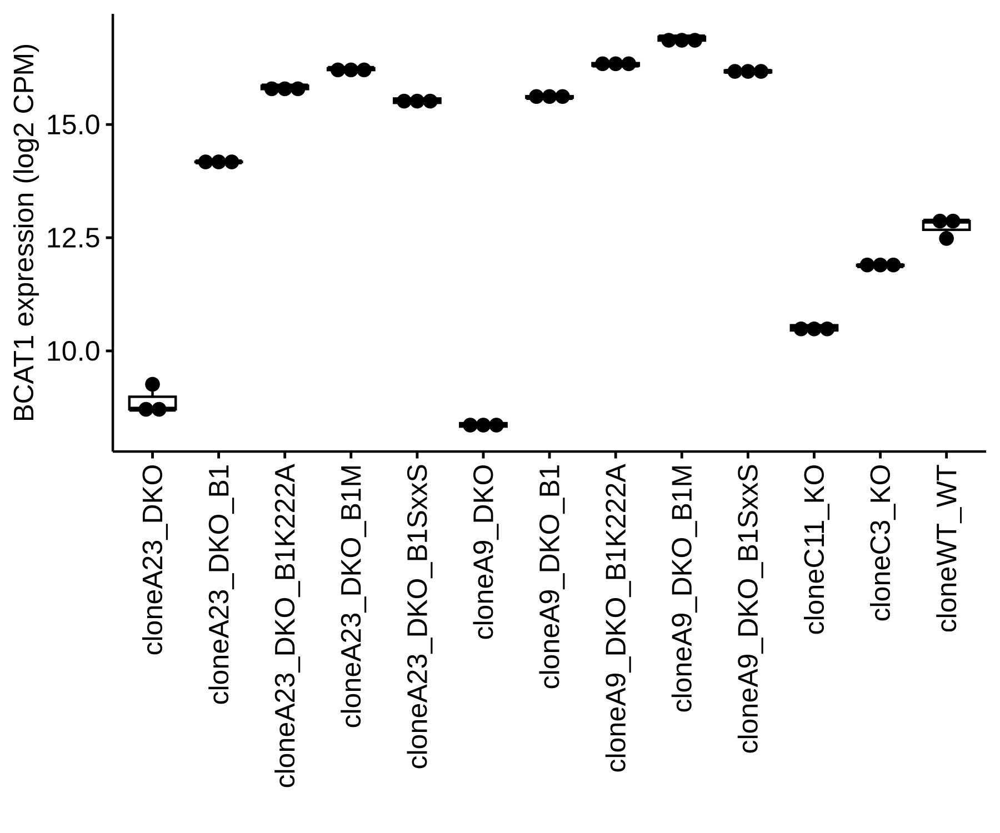

In [334]:
plotdat = as.data.table(logcpm_hsa['BCAT1',], keep.rownames = T)
plotdat = merge(plotdat, dsn_hsa_rna[, .(sample, genotype, group2)], by.x = 'V1', by.y = 'sample')
plotdat = plotdat[order(group2), ]
options(repr.plot.width = 6, repr.plot.height = 5, repr.plot.res = 300)
ggboxplot(plotdat, x = 'group2', y = 'V2', add = 'dotplot') + rotate_x_text(90) + ylab('BCAT1 expression (log2 CPM)') + xlab('')


Bin width defaults to 1/30 of the range of the data. Pick better value with `binwidth`.


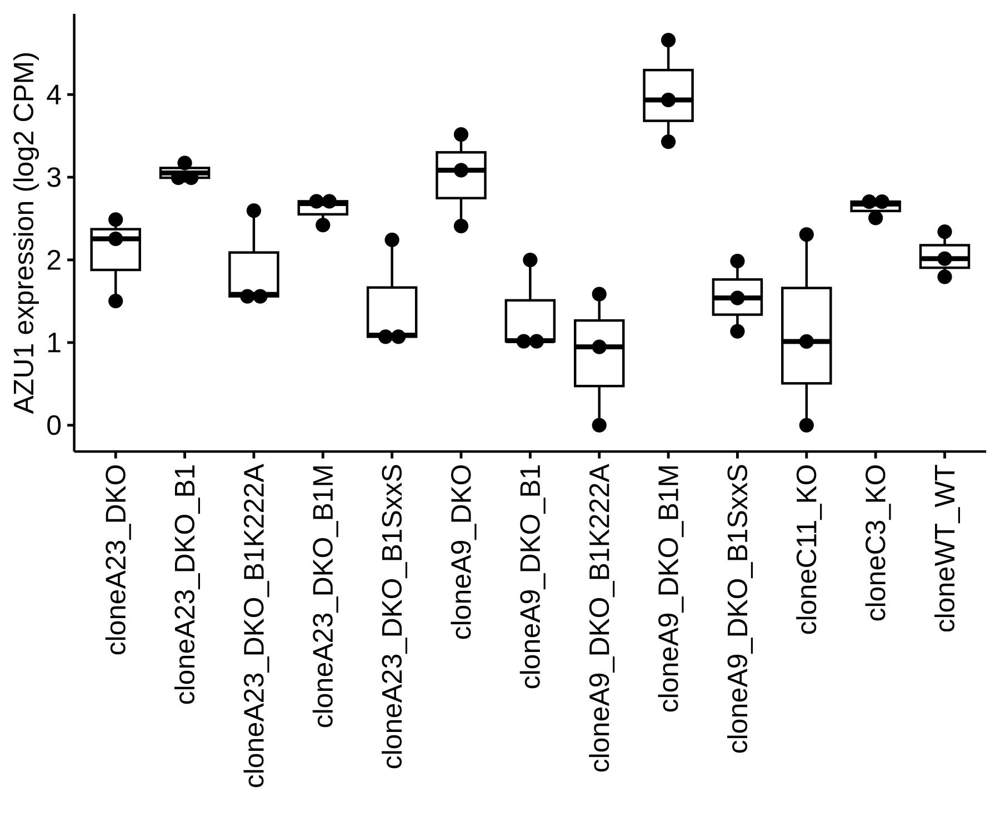

In [337]:
plotdat = as.data.table(logcpm_hsa['AZU1',], keep.rownames = T)
plotdat = merge(plotdat, dsn_hsa_rna[, .(sample, genotype, group2)], by.x = 'V1', by.y = 'sample')
plotdat = plotdat[order(group2), ]
options(repr.plot.width = 6, repr.plot.height = 5, repr.plot.res = 300)
ggboxplot(plotdat, x = 'group2', y = 'V2', add = 'dotplot') + rotate_x_text(90) + ylab('AZU1 expression (log2 CPM)') + xlab('')


Bin width defaults to 1/30 of the range of the data. Pick better value with `binwidth`.


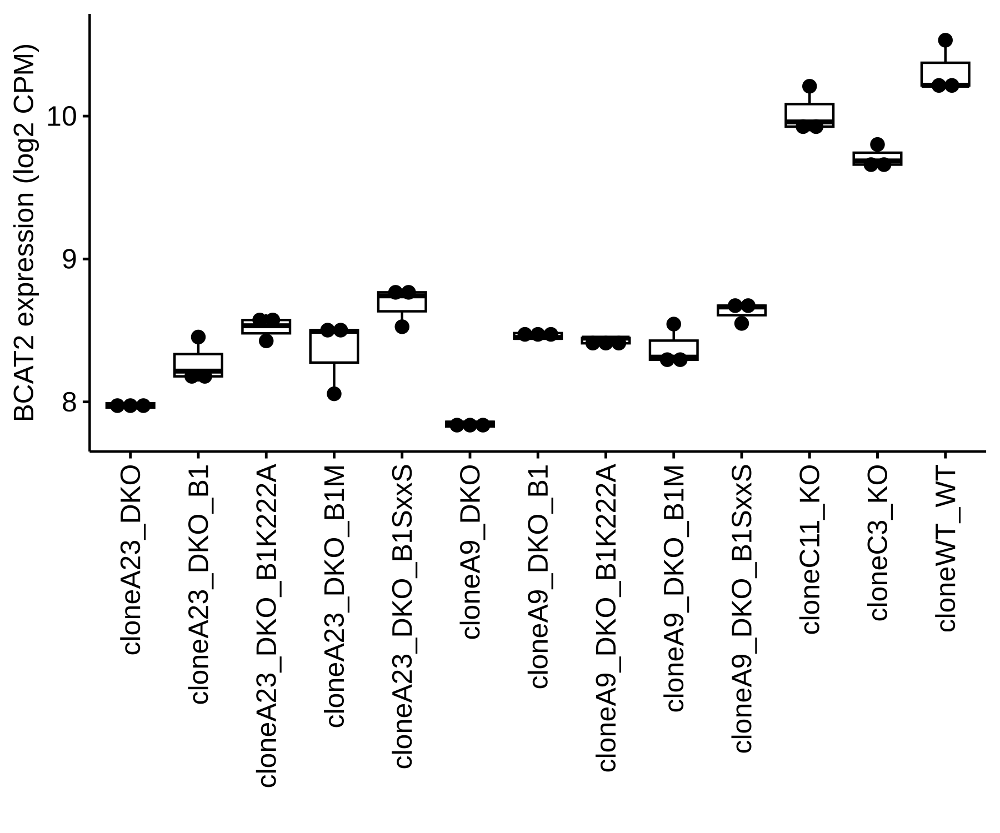

In [340]:
plotdat = as.data.table(logcpm_hsa['BCAT2',], keep.rownames = T)
plotdat = merge(plotdat, dsn_hsa_rna[, .(sample, genotype, group2)], by.x = 'V1', by.y = 'sample')
plotdat = plotdat[order(group2), ]
options(repr.plot.width = 6, repr.plot.height = 5, repr.plot.res = 300)
ggboxplot(plotdat, x = 'group2', y = 'V2', add = 'dotplot') + rotate_x_text(90) + ylab('BCAT2 expression (log2 CPM)') + xlab('')


In [341]:
table(colData(dds)$genotype)


        cloneA23_DKO      cloneA23_DKO_B1 cloneA23_DKO_B1K222A     cloneA23_DKO_B1M  cloneA23_DKO_B1SxxS          cloneA9_DKO       cloneA9_DKO_B1 
                   3                    3                    3                    3                    3                    3                    3 
 cloneA9_DKO_B1K222A      cloneA9_DKO_B1M   cloneA9_DKO_B1SxxS          cloneC11_KO           cloneC3_KO           cloneWT_WT 
                   3                    3                    3                    3                    3                    3 

In [342]:
groups = as.character(unique(colData(dds)$genotype))
comb = combn(groups, 2, simplify = F) 
comb = as.data.table(t(as.data.table(comb)), keep.rownames = T)
comb[, tag := paste0(V1, '__', V2) ]
comb$rn = 1:nrow(comb)
head(comb)
dim(comb)


rn,V1,V2,tag
<int>,<chr>,<chr>,<chr>
1,DKO,DKO_B1M,DKO__DKO_B1M
2,DKO,DKO_B1,DKO__DKO_B1
3,DKO,DKO_B1K222A,DKO__DKO_B1K222A
4,DKO,DKO_B1SxxS,DKO__DKO_B1SxxS
5,DKO,KO,DKO__KO
6,DKO,WT,DKO__WT


[1] 21  4

In [50]:
deg_list = lapply(comb$rn, function(ii){
    grp1 = comb[ii, V1]
    grp2 = comb[ii, V2]
    as.data.table(results(dds, contrast = c('genotype', grp1, grp2)), keep.rownames = T)
})
names(deg_list) = comb$tag
deg_dt = rbindlist(deg_list, idcol = T)


Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”
Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”
Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”
Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”
Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”
Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”
Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”
Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”
Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”
Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”
Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”
Warning message in .local(x, row.names, optional, ...):
“Argument

In [47]:
deg_dt = merge(deg_dt, hsa_gene_bed[!duplicated(gene_id), .(gene_id, chr, start, end, strand)], by.x = 'rn', by.y = 'gene_id', all.x = T)
deg_dt[log2FoldChange > 0, updn := 'up' ]
deg_dt[log2FoldChange < 0, updn := 'dn' ]
deg_dt[, updn := factor(updn, levels = c('up', 'dn') )]
deg_dt = deg_dt[order(padj), ]
head(deg_dt)

rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,batch,chr,start,end,strand,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<int>,<int>,<chr>,<fct>
LOC102724908,KO__WT,5491.416,5.775858,0.1751951,32.96814,2.325567e-238,3.785558e-234,batch1,chr19,28606687,28615229,+,up
LOC102724908,DKO__WT,5491.416,5.691842,0.1752001,32.48767,1.592226e-231,2.591826e-227,batch1,chr19,28606687,28615229,+,up
LOC102724908,DKO_B1SxxS__WT,5491.416,5.587917,0.1752265,31.88969,3.711288e-223,5.745073e-219,batch1,chr19,28606687,28615229,+,up
LOC102724908,DKO_B1K222A__WT,5491.416,5.368348,0.1752416,30.63398,4.319204e-206,6.858464e-202,batch1,chr19,28606687,28615229,+,up
LOC102724908,DKO_B1__WT,5491.416,5.168412,0.1752678,29.48866,4.024318e-191,6.550785e-187,batch1,chr19,28606687,28615229,+,up
LOC102724908,DKO_B1M__WT,5491.416,5.013759,0.1753017,28.60074,6.577697e-180,9.920482e-176,batch1,chr19,28606687,28615229,+,up


In [361]:
head(deg_dt)

rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,chr,start,end,strand,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>,<chr>,<fct>
LOC102724908,KO__WT,5491.416,5.775858,0.1751951,32.96814,2.325567e-238,3.785558e-234,chr19,28606687,28615229,+,up
LOC102724908,DKO__WT,5491.416,5.691842,0.1752001,32.48767,1.592226e-231,2.591826e-227,chr19,28606687,28615229,+,up
LOC102724908,DKO_B1SxxS__WT,5491.416,5.587917,0.1752265,31.88969,3.711288e-223,5.745073e-219,chr19,28606687,28615229,+,up
LOC102724908,DKO_B1K222A__WT,5491.416,5.368348,0.1752416,30.63398,4.319204e-206,6.858464e-202,chr19,28606687,28615229,+,up
LOC102724908,DKO_B1__WT,5491.416,5.168412,0.1752678,29.48866,4.024318e-191,6.550785e-187,chr19,28606687,28615229,+,up
LOC102724908,DKO_B1M__WT,5491.416,5.013759,0.1753017,28.60074,6.577697e-180,9.920482e-176,chr19,28606687,28615229,+,up


In [466]:
fwrite(deg_dt, file = 'rnaseq/human/output/deg_dt_genotype_Jan21.tsv', sep = '\t')

In [51]:
hsa_deg_dt = fread('rnaseq/human/output/deg_dt_genotype.tsv')


In [384]:
getwd()

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Junhua"

In [467]:
hsa_deg_dt = deg_dt

In [52]:
head(hsa_deg_dt)

rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,chr,start,end,strand,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>,<chr>,<chr>
LOC102724908,KO__WT,5491.416,5.775858,0.1751951,32.96814,2.325567e-238,3.785558e-234,chr19,28606687,28615229,+,up
LOC102724908,DKO__WT,5491.416,5.691842,0.1752001,32.48767,1.592226e-231,2.591826e-227,chr19,28606687,28615229,+,up
LOC102724908,DKO_B1SxxS__WT,5491.416,5.587917,0.1752265,31.88969,3.711288e-223,5.745073e-219,chr19,28606687,28615229,+,up
LOC102724908,DKO_B1K222A__WT,5491.416,5.368348,0.1752416,30.63398,4.319204e-206,6.858464e-202,chr19,28606687,28615229,+,up
LOC102724908,DKO_B1__WT,5491.416,5.168412,0.1752678,29.48866,4.024318e-191,6.550785e-187,chr19,28606687,28615229,+,up
LOC102724908,DKO_B1M__WT,5491.416,5.013759,0.1753017,28.60074,6.577697e-180,9.920482e-176,chr19,28606687,28615229,+,up


In [56]:
plotdat = hsa_deg_dt[padj < 0.05 & abs(log2FoldChange) > 1, ]
plotdat = as.data.table(table(plotdat$.id), keep.rownames = T)
plotdat


V1,N
<chr>,<int>
DKO__DKO_B1,1286
DKO__DKO_B1K222A,329
DKO__DKO_B1M,1141
DKO__DKO_B1SxxS,892
DKO__KO,749
DKO__WT,2318
DKO_B1__DKO_B1K222A,918
DKO_B1__DKO_B1SxxS,1434
DKO_B1__KO,1593


## DEG list 2

In [36]:
dsn_hsa_rna[, clone := 'cloneWT']
dsn_hsa_rna[grep('A23', sample), clone := 'cloneA23' ]
dsn_hsa_rna[grep('A9', sample),  clone := 'cloneA9' ]
dsn_hsa_rna[grep('C11', sample), clone := 'cloneC11' ]
dsn_hsa_rna[grep('C3', sample),  clone := 'cloneC3' ]
table(dsn_hsa_rna$clone)


cloneA23  cloneA9 cloneC11  cloneC3  cloneWT 
      15       15        3        3        3 

In [37]:
dsn_hsa_rna[, group2 := paste0(clone, '_', genotype) ]

In [38]:
colData(dds)$group2 = factor(dsn_hsa_rna$group2)
dds@design = ~ group2
dds = DESeq(dds)


using pre-existing size factors

estimating dispersions

found already estimated dispersions, replacing these

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing



In [39]:
groups = as.character(unique(colData(dds)$group2))
comb = combn(groups, 2, simplify = F) 
comb = as.data.table(t(as.data.table(comb)), keep.rownames = T)
comb[, tag := paste0(V1, '__', V2) ]
comb$rn = 1:nrow(comb)
head(comb)
dim(comb)


rn,V1,V2,tag
<int>,<chr>,<chr>,<chr>
1,cloneA23_DKO,cloneA23_DKO_B1M,cloneA23_DKO__cloneA23_DKO_B1M
2,cloneA23_DKO,cloneA23_DKO_B1,cloneA23_DKO__cloneA23_DKO_B1
3,cloneA23_DKO,cloneA23_DKO_B1K222A,cloneA23_DKO__cloneA23_DKO_B1K222A
4,cloneA23_DKO,cloneA23_DKO_B1SxxS,cloneA23_DKO__cloneA23_DKO_B1SxxS
5,cloneA23_DKO,cloneA9_DKO,cloneA23_DKO__cloneA9_DKO
6,cloneA23_DKO,cloneA9_DKO_B1M,cloneA23_DKO__cloneA9_DKO_B1M


[1] 78  4

In [40]:
# cloneA9_DKO_B1 vs cloneA9_DKO  : cloneA9_DKO_B1__cloneA9_DKO
# cloneA23_DKO_B1 vs cloneA23_DKO vs  : cloneA23_DKO_B1__cloneA23_DKO
# cloneA9_DKO_B1M vs cloneA9_DKO : cloneA9_DKO_B1M__cloneA9_DKO
# cloneA23_DKO_B1M vs cloneA23_DKO :  cloneA23_DKO_B1M__cloneA23_DKO 
# these comparisons all included
comb[V1 == 'cloneA9_DKO' & V2 == 'cloneA9_DKO_B1', ]
comb[V1 == 'cloneA23_DKO' & V2 == 'cloneA23_DKO_B1', ]
comb[V1 == 'cloneA9_DKO' & V2 == 'cloneA9_DKO_B1M', ]
comb[V1 == 'cloneA23_DKO' & V2 == 'cloneA23_DKO_B1M', ]

rn,V1,V2,tag
<int>,<chr>,<chr>,<chr>
52,cloneA9_DKO,cloneA9_DKO_B1,cloneA9_DKO__cloneA9_DKO_B1


rn,V1,V2,tag
<int>,<chr>,<chr>,<chr>
2,cloneA23_DKO,cloneA23_DKO_B1,cloneA23_DKO__cloneA23_DKO_B1


rn,V1,V2,tag
<int>,<chr>,<chr>,<chr>
51,cloneA9_DKO,cloneA9_DKO_B1M,cloneA9_DKO__cloneA9_DKO_B1M


rn,V1,V2,tag
<int>,<chr>,<chr>,<chr>
1,cloneA23_DKO,cloneA23_DKO_B1M,cloneA23_DKO__cloneA23_DKO_B1M


In [ ]:
deg_list2 = lapply(comb$rn, function(ii){
    grp1 = comb[ii, V1]
    grp2 = comb[ii, V2]
    as.data.table(results(dds, contrast = c('group2', grp1, grp2)), keep.rownames = T)
})
names(deg_list2) = comb$tag
deg_dt2 = rbindlist(deg_list2, idcol = T)
deg_dt2 = merge(deg_dt2, hsa_gene_bed[!duplicated(gene_id), .(gene_id, chr, start, end, strand)], by.x = 'rn', by.y = 'gene_id', all.x = T)
deg_dt2[log2FoldChange > 0, updn := 'up' ]
deg_dt2[log2FoldChange < 0, updn := 'dn' ]
deg_dt2[, updn := factor(updn, levels = c('up', 'dn') )]
deg_dt2 = deg_dt2[order(padj), ]
head(deg_dt2)
fwrite(deg_dt2, file = 'rnaseq/human/output/deg_dt2_genotype_Mar10.tsv', sep = '\t')

In [355]:
intersect(deg_dt$.id, deg_dt2$.id)


character(0)

In [42]:
deg_dt$batch  = 'batch1' 
deg_dt2$batch = 'batch2' 


In [48]:
deg_dt3 = rbindlist(list(deg_dt, deg_dt2) )

Column 14 ['batch'] of item 2 appears in position 9 in item 1. Set use.names=TRUE to match by column name, or use.names=FALSE to ignore column names. use.names='check' (default from v1.12.2) emits this message and proceeds as if use.names=FALSE for  backwards compatibility. See news item 5 in v1.12.2 for options to control this message.



In [49]:
head(deg_dt3)

rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,batch,chr,start,end,strand,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<int>,<chr>,<fct>,<fct>
LOC102724908,KO__WT,5491.416,5.775858,0.1751951,32.96814,2.325567e-238,3.785558e-234,batch1,chr19,28606687,28615229,+,up
LOC102724908,DKO__WT,5491.416,5.691842,0.1752001,32.48767,1.592226e-231,2.591826e-227,batch1,chr19,28606687,28615229,+,up
LOC102724908,DKO_B1SxxS__WT,5491.416,5.587917,0.1752265,31.88969,3.711288e-223,5.745073e-219,batch1,chr19,28606687,28615229,+,up
LOC102724908,DKO_B1K222A__WT,5491.416,5.368348,0.1752416,30.63398,4.319204e-206,6.858464e-202,batch1,chr19,28606687,28615229,+,up
LOC102724908,DKO_B1__WT,5491.416,5.168412,0.1752678,29.48866,4.024318e-191,6.550785e-187,batch1,chr19,28606687,28615229,+,up
LOC102724908,DKO_B1M__WT,5491.416,5.013759,0.1753017,28.60074,6.577697e-180,9.920482e-176,batch1,chr19,28606687,28615229,+,up


## pathway analysis 

In [172]:
#pathwaysDF <- msigdbr(species = "Homo sapiens", category="C7") #, subcategory = 'IMMUNESIGDB') 
#pathwaysDF <- msigdbr(species = "Homo sapiens", category="C7") #, subcategory = 'VAX') 
#pathwaysDF <- msigdbr(species = "Homo sapiens", category="H") #, subcategory = 'immunesigdb') 
pathwaysDF <- msigdbr(species = "Homo sapiens") 
pathways <- split(as.character(pathwaysDF$gene_symbol), pathwaysDF$gs_name)
length(pathways)


[1] 32880

In [232]:
hsa_deg_dt[rn %in% c('ITGB6', 'AZU1', 'BCAT1') , ]

rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,chr,start,end,strand,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>,<chr>,<chr>
BCAT1,DKO__DKO_B1M,41533.233246,-7.9255882,0.2848683,-27.821936,2.354899e-170,3.739345e-166,chr12,24810023,24949459,-,dn
BCAT1,DKO__DKO_B1K222A,41533.233246,-7.4301054,0.2848705,-26.082397,5.774886e-150,8.017274e-146,chr12,24810023,24949459,-,dn
BCAT1,DKO__DKO_B1SxxS,41533.233246,-7.2202430,0.2848725,-25.345528,1.006669e-141,1.518258e-137,chr12,24810023,24949459,-,dn
BCAT1,DKO__DKO_B1,41533.233246,-6.3994897,0.2848794,-22.463853,9.369946e-112,1.487854e-107,chr12,24810023,24949459,-,dn
BCAT1,DKO_B1M__KO,41533.233246,5.2316513,0.2836817,18.441980,6.048523e-76,2.461446e-72,chr12,24810023,24949459,-,up
BCAT1,DKO_B1K222A__KO,41533.233246,4.7361685,0.2836838,16.695236,1.419566e-62,2.084207e-58,chr12,24810023,24949459,-,up
BCAT1,DKO_B1SxxS__KO,41533.233246,4.5263061,0.2836858,15.955349,2.615063e-57,3.735094e-53,chr12,24810023,24949459,-,up
BCAT1,DKO_B1__KO,41533.233246,3.7055529,0.2836928,13.061850,5.438986e-39,2.272780e-36,chr12,24810023,24949459,-,up
BCAT1,DKO__WT,41533.233246,-4.0846405,0.3484661,-11.721774,9.858570e-32,1.002986e-29,chr12,24810023,24949459,-,dn


In [140]:
head(pathwaysDF[, 1:4])

gs_cat,gs_subcat,gs_name,gene_symbol
<chr>,<chr>,<chr>,<chr>
C3,MIR:MIR_Legacy,AAACCAC_MIR140,ABCC4
C3,MIR:MIR_Legacy,AAACCAC_MIR140,ABRAXAS2
C3,MIR:MIR_Legacy,AAACCAC_MIR140,ACTN4
C3,MIR:MIR_Legacy,AAACCAC_MIR140,ACTN4
C3,MIR:MIR_Legacy,AAACCAC_MIR140,ACVR1
C3,MIR:MIR_Legacy,AAACCAC_MIR140,ADAM9


Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (0.12% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”


pathway,pval,padj,log2err,ES,NES,size,leadingEdge
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>
CUI_DEVELOPING_HEART_C5_VALVAR_CELL,3.546684e-05,0.3814459,0.5573322,-0.8302124,-1.727968,144,"TSPYL2, ...."
GSE10325_CD4_TCELL_VS_BCELL_DN,2.774583e-05,0.3814459,0.5756103,-0.8441066,-1.752835,139,"HDAC9, O...."
GAO_LARGE_INTESTINE_ADULT_CA_ENTEROENDOCRINE_CELLS,1.573965e-04,0.5642663,0.5188481,-0.8123662,-1.731888,159,"HDAC9, B...."
HOLLMANN_APOPTOSIS_VIA_CD40_DN,1.075899e-04,0.5642663,0.5384341,-0.7749147,-1.703308,219,"HDAC9, S...."
ONKEN_UVEAL_MELANOMA_DN,1.427609e-04,0.5642663,0.5188481,-0.6852600,-1.609804,454,"HDAC9, O...."
PAX2_01,1.052752e-04,0.5642663,0.5384341,-0.9495911,-1.715040,42,"HDAC9, C...."


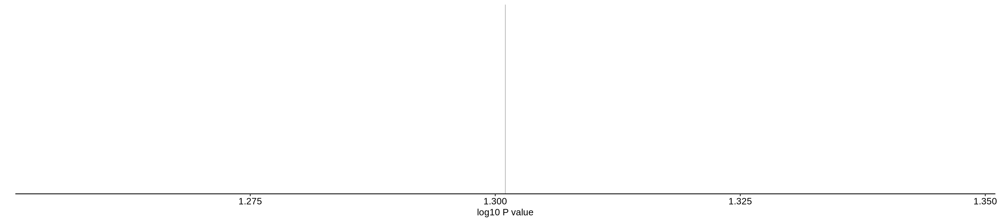

In [215]:
plotdat = hsa_deg_dt[.id == 'KO__WT', ]
plotdat = plotdat[!is.na(padj), ]
plotdat = plotdat[order(padj), ]

plotdat[, ranking := -log2FoldChange*log10(padj)]
r_top = max(plotdat$ranking[is.finite(plotdat$ranking)])
r_bot = min(plotdat$ranking[is.finite(plotdat$ranking)])
xx = plotdat[ranking > r_top, ]
plotdat[ranking > r_top, ranking := r_top + 1:nrow(xx)]
xx = plotdat[ranking < r_bot, ]
plotdat[ranking < r_bot, ranking := r_bot - 1:nrow(xx)]
xx = plotdat[!is.na(ranking), ] 

ranked = plotdat$ranking
names(ranked) = plotdat$rn
ranked = sort(ranked, decreasing = TRUE)

fgsea <- fgsea(pathways = pathways, stats = ranked, eps = 0.0, minSize = 15, maxSize = 500)
fgseaRes = as.data.table(fgsea)
fgseaRes = fgseaRes[order(padj), ]
head(fgseaRes)

fgseaRes[, logFDR := -log(pval, 10)] 
fgseaRes[NES > 0, updn := 'UP']
fgseaRes[NES < 0, updn := 'DN']
fgseaRes[, updn := factor(updn, levels = c('UP', 'DN'))]
plotdat = fgseaRes[padj < 0.1, ]
plotdat[, pathway := factor(pathway, levels = plotdat$pathway)] 


options(repr.plot.width = 18, repr.plot.height = 4, repr.plot.res = 200)
ggplot(plotdat, aes(pathway, logFDR, fill = updn)) + geom_bar(stat = 'identity') + coord_flip() + theme_pubr() + geom_hline(yintercept = -log(0.05, 10), color = 'grey')  + ylab('log10 P value') + xlab('')


In [216]:
tmp = as.data.table(pathwaysDF[, c('gs_cat', 'gs_subcat', 'gs_name')])
tmp = unique(tmp)
fgsea_dt = merge(fgseaRes, tmp, by.x = 'pathway', by.y = 'gs_name', all.x = T) 
fgsea_dt = fgsea_dt[order(pval), ]
head(fgsea_dt) 

plotdat1 = as.data.table(table(fgsea_dt[pval < 0.05, gs_subcat]), keep.rownames = T)
setnames(plotdat1, c('gs_subcat', 'cnt_sig'))
tmp = as.data.table(pathwaysDF[, c('gs_cat', 'gs_subcat', 'gs_name')])
tmp = unique(tmp)
plotdat2 = as.data.table(table(tmp[, gs_subcat]), keep.rownames = T)
setnames(plotdat2, c('gs_subcat', 'cnt_all'))
plotdat = merge(plotdat1, plotdat2, by = 'gs_subcat')
plotdat[, per := cnt_sig / cnt_all ] 
plotdat = plotdat[order(per, decreasing = T), ]
plotdat = plotdat[!is.na(gs_subcat) & gs_subcat != '', ]
(plotdat)


pathway,pval,padj,log2err,ES,NES,size,leadingEdge,logFDR,updn,gs_cat,gs_subcat
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>,<dbl>,<fct>,<chr>,<chr>
GSE10325_CD4_TCELL_VS_BCELL_DN,2.774583e-05,0.3814459,0.5756103,-0.8441066,-1.752835,139,"HDAC9, O....",4.556802,DN,C7,IMMUNESIGDB
CUI_DEVELOPING_HEART_C5_VALVAR_CELL,3.546684e-05,0.3814459,0.5573322,-0.8302124,-1.727968,144,"TSPYL2, ....",4.450177,DN,C8,
PAX2_01,1.052752e-04,0.5642663,0.5384341,-0.9495911,-1.715040,42,"HDAC9, C....",3.977674,DN,C3,TFT:TFT_Legacy
HOLLMANN_APOPTOSIS_VIA_CD40_DN,1.075899e-04,0.5642663,0.5384341,-0.7749147,-1.703308,219,"HDAC9, S....",3.968228,DN,C2,CGP
ONKEN_UVEAL_MELANOMA_DN,1.427609e-04,0.5642663,0.5188481,-0.6852600,-1.609804,454,"HDAC9, O....",3.845391,DN,C2,CGP
GAO_LARGE_INTESTINE_ADULT_CA_ENTEROENDOCRINE_CELLS,1.573965e-04,0.5642663,0.5188481,-0.8123662,-1.731888,159,"HDAC9, B....",3.803005,DN,C8,


gs_subcat,cnt_sig,cnt_all,per
<chr>,<int>,<int>,<dbl>
CP,3,29,0.10344828
TFT:TFT_Legacy,59,610,0.09672131
IMMUNESIGDB,355,4872,0.07286535
MIR:MIRDB,153,2377,0.06436685
CGP,216,3384,0.06382979
CGN,27,427,0.06323185
CM,26,431,0.06032483
MIR:MIR_Legacy,12,221,0.05429864
VAX,15,347,0.04322767


In [224]:
fgsea_dt[pval < 0.05 & gs_subcat == 'CGP', ][order(pval), ]

pathway,pval,padj,log2err,ES,NES,size,leadingEdge,logFDR,updn,gs_cat,gs_subcat
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>,<dbl>,<fct>,<chr>,<chr>
HOLLMANN_APOPTOSIS_VIA_CD40_DN,0.0001075899,0.5642663,0.5384341,-0.7749147,-1.703308,219,"HDAC9, S....",3.968228,DN,C2,CGP
ONKEN_UVEAL_MELANOMA_DN,0.0001427609,0.5642663,0.5188481,-0.6852600,-1.609804,454,"HDAC9, O....",3.845391,DN,C2,CGP
CHARAFE_BREAST_CANCER_LUMINAL_VS_BASAL_DN,0.0006346081,0.5916833,0.4772708,-0.6969686,-1.601518,356,"RBMS1, F....",3.197494,DN,C2,CGP
ONDER_CDH1_TARGETS_2_DN,0.0007328151,0.5916833,0.4772708,-0.7071041,-1.607286,314,"HDAC9, G....",3.135006,DN,C2,CGP
ZHAN_MULTIPLE_MYELOMA_CD1_VS_CD2_DN,0.0008436190,0.5916833,0.4772708,-0.9053799,-1.662326,44,"OSBPL10,....",3.073854,DN,C2,CGP
TAVAZOIE_METASTASIS,0.0010220527,0.5916833,0.4550599,0.9079065,1.756817,65,"SSX1, SS....",2.990527,UP,C2,CGP
CERVERA_SDHB_TARGETS_2,0.0016631488,0.5916833,0.4550599,-0.8478575,-1.657584,74,"HDAC9, U....",2.779069,DN,C2,CGP
YAGI_AML_WITH_11Q23_REARRANGED,0.0019272805,0.5916833,0.4550599,-0.6878101,-1.551460,273,"HDAC9, A....",2.715055,DN,C2,CGP
KINSEY_TARGETS_OF_EWSR1_FLII_FUSION_DN,0.0019404810,0.5916833,0.4550599,-0.7082242,-1.592442,269,"SATB1, T....",2.712091,DN,C2,CGP


In [ ]:
#pathwaysDF <- msigdbr(species = "Homo sapiens", category="C7") #, subcategory = 'IMMUNESIGDB') 
#pathwaysDF <- msigdbr(species = "Homo sapiens", category="C7") #, subcategory = 'VAX') 
#pathwaysDF <- msigdbr(species = "Homo sapiens", category="H") #, subcategory = 'immunesigdb') 
pathwaysDF <- msigdbr(species = "Homo sapiens", category="C7", subcategory = 'IMMUNESIGDB') 
pathways <- split(as.character(pathwaysDF$gene_symbol), pathwaysDF$gs_name)
pathways[1]
length(pathways)

plotdat = hsa_deg_dt[.id == 'KO__WT', ]
plotdat = plotdat[!is.na(padj), ]
plotdat = plotdat[order(padj), ]

plotdat[, ranking := -log2FoldChange*log10(padj)]
r_top = max(plotdat$ranking[is.finite(plotdat$ranking)])
r_bot = min(plotdat$ranking[is.finite(plotdat$ranking)])
xx = plotdat[ranking > r_top, ]
plotdat[ranking > r_top, ranking := r_top + 1:nrow(xx)]
xx = plotdat[ranking < r_bot, ]
plotdat[ranking < r_bot, ranking := r_bot - 1:nrow(xx)]
xx = plotdat[!is.na(ranking), ] 

ranked = plotdat$ranking
names(ranked) = plotdat$rn
ranked = sort(ranked, decreasing = TRUE)

fgsea <- fgsea(pathways = pathways, stats = ranked, eps = 0.0, minSize = 15, maxSize = 500)
fgseaRes = as.data.table(fgsea)
fgseaRes = fgseaRes[order(padj), ]
head(fgseaRes)

fgseaRes[, logFDR := -log(pval, 10)] 
fgseaRes[NES > 0, updn := 'UP']
fgseaRes[NES < 0, updn := 'DN']
fgseaRes[, updn := factor(updn, levels = c('UP', 'DN'))]
plotdat = fgseaRes[padj < 0.1, ]
plotdat[, pathway := factor(pathway, levels = plotdat$pathway)] 


options(repr.plot.width = 18, repr.plot.height = 4, repr.plot.res = 200)
ggplot(plotdat, aes(pathway, logFDR, fill = updn)) + geom_bar(stat = 'identity') + coord_flip() + theme_pubr() + geom_hline(yintercept = -log(0.05, 10), color = 'grey')  + ylab('log10 P value') + xlab('')


$GOLDRATH_EFF_VS_MEMORY_CD8_TCELL_DN
  [1] "ABCA2"    "ABCC5"    "ABHD14A"  "ACADM"    "ACP5"     "ACP6"     "ADAM22"   "ADCY7"    "ADGRG3"   "AKAP9"    "ANKRD10"  "ARL4C"    "ASH1L"    "B3GALT6" 
 [15] "BCKDHB"   "BCL2"     "BCL2L11"  "BRD3"     "C12orf57" "C5orf51"  "C6orf136" "C6orf136" "C6orf136" "C6orf136" "C6orf136" "C6orf136" "C6orf136" "CA12"    
 [29] "CANT1"    "CCND2"    "CCNL2"    "CCR7"     "CD7"      "CD96"     "CHCHD7"   "CIPC"     "COQ9"     "COX7A2L"  "CRLF3"    "CST7"     "CTSW"     "CYP4V2"  
 [43] "DALRD3"   "DBNDD2"   "DBP"      "DDIT3"    "DDX51"    "DDX51"    "DGKA"     "DIAPH2"   "DNAAF10"  "DPH5"     "DUSP12"   "EIF2AK4"  "ELP3"     "EMB"     
 [57] "EML5"     "EOMES"    "EPS15L1"  "EVL"      "EZH1"     "FAM189B"  "FAM189B"  "FAM189B"  "FAM8A1"   "GALNT11"  "GBE1"     "GMIP"     "GNL2"     "GSTK1"   
 [71] "GTF2I"    "H2AJ"     "HSD17B11" "HSD17B8"  "HSD17B8"  "HSD17B8"  "HSD17B8"  "HSD17B8"  "HSD17B8"  "HSF1"     "HSF1"     "IAPP"     "ICE1"     "IFITM10" 
 [85] "IFITM10"  "IL4R"     "IL6R"     "IL6ST"    "IL7R"     "ITM2C"    "ITPR2"    "JUN"      "KCNJ8"    "KLF17"    "KLF2"     "LAMP1"    "LTB"      "LTB"     
 [99] "LTB"      "LTB"      "LTB"      "LTB"      "LTB"      "LTB"      "LYSMD1"   "LYSMD2"   "MAN2C1"   "MAP4K3"   "MBP"      "MCOLN2"   "MECP2"    "METTL3"  
[113] "MFNG"     "MLYCD"    "MRPL23"   "MRPL23"   "MTFR1L"   "NACC2"    "NCKAP1"   "NDUFA7"   "NECAP1"   "NEDD4"    "NEDD4L"   "NOTCH4"   "NOTCH4"   "NOTCH4"  
[127] "NOTCH4"   "NOTCH4"   "NOTCH4"   "NOTCH4"   "NSG2"     "PAQR7"    "PDGFB"    "PDK1"     "PDRG1"    "PHLDB1"   "PISD"     "PLEKHA1"  "PLEKHA5"  "POLR1B"  
[141] "POLR3A"   "PPOX"     "PPP1R14B" "PRKACB"   "PRMT3"    "PRSS12"   "PSME2"    "PSME2"    "PTPN22"   "PURA"     "QDPR"     "RABAC1"   "RAD52"    "RASA4"   
[155] "RASSF5"   "RERE"     "RFLNB"    "RFLNB"    "RGS10"    "RNASE4"   "RPL14"    "RPL19"    "RPL39"    "RPLP0"    "RPLP1"    "RPP14"    "RPS16"    "RPS18"   
[169] "RPS18"    "RPS18"    "RPS18"    "RPS18"    "RPS18"    "RPS18"    "RPS19"    "RPS23"    "RPS7"     "RPS8"     "RRP1B"    "RTKN"     "RTTN"     "SBDS"    
[183] "SELL"     "SEMA4B"   "SESN1"    "SETD4"    "SH3BP5"   "SHISA5"   "SIAH1"    "SIPA1L2"  "SIT1"     "SIX6"     "SLC11A2"  "SLC12A7"  "SLC12A7"  "SLC26A2" 
[197] "SLTM"     "SNRK"     "SPICE1"   "STAT4"    "SUPT6H"   "SURF2"    "SURF2"    "SUSD6"    "TAF1A"    "TAF1C"    "TCF7"     "TDRP"     "TESK1"    "TK2"     
[211] "TLK2"     "TMC6"     "TMED4"    "TNIP1"    "TRAF1"    "TRAF3IP2" "TRAF5"    "TRMT1"    "TSEN34"   "TSEN34"   "TSEN34"   "TSEN34"   "TSEN34"   "TSEN34"  
[225] "TSEN34"   "TSEN34"   "TSEN34"   "TSEN34"   "TSR1"     "TTC14"    "TTC27"    "TTC3"     "TXK"      "UBLCP1"   "USP18"    "VKORC1"   "WDR13"    "WDR43"   
[239] "WDR75"    "XPC"      "XRCC5"    "YPEL3"    "ZBTB20"   "ZEB1"     "ZFP1"     "ZFP1"     "ZFP90"    "ZKSCAN3"  "ZNF274"   "ZNF692"

[1] 4872

Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (0.12% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”


In [221]:
head(fgsea_dt)

pathway,pval,padj,log2err,ES,NES,size,leadingEdge,logFDR,updn,gs_cat,gs_subcat
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>,<dbl>,<fct>,<chr>,<chr>
GSE10325_CD4_TCELL_VS_BCELL_DN,2.774583e-05,0.3814459,0.5756103,-0.8441066,-1.752835,139,"HDAC9, O....",4.556802,DN,C7,IMMUNESIGDB
CUI_DEVELOPING_HEART_C5_VALVAR_CELL,3.546684e-05,0.3814459,0.5573322,-0.8302124,-1.727968,144,"TSPYL2, ....",4.450177,DN,C8,
PAX2_01,1.052752e-04,0.5642663,0.5384341,-0.9495911,-1.715040,42,"HDAC9, C....",3.977674,DN,C3,TFT:TFT_Legacy
HOLLMANN_APOPTOSIS_VIA_CD40_DN,1.075899e-04,0.5642663,0.5384341,-0.7749147,-1.703308,219,"HDAC9, S....",3.968228,DN,C2,CGP
ONKEN_UVEAL_MELANOMA_DN,1.427609e-04,0.5642663,0.5188481,-0.6852600,-1.609804,454,"HDAC9, O....",3.845391,DN,C2,CGP
GAO_LARGE_INTESTINE_ADULT_CA_ENTEROENDOCRINE_CELLS,1.573965e-04,0.5642663,0.5188481,-0.8123662,-1.731888,159,"HDAC9, B....",3.803005,DN,C8,


In [220]:
options(repr.plot.width = 3, repr.plot.height = 3, repr.plot.res = 300)
plotdat = fgsea_dt[gs_subcat == 'CGP' & .id == 'KO__WT', ][pval < 1,  ]
plotdat[, logFDR := -log(pval, 10) ]
plotdat[logFDR > 2.7, lbl := pathway ]
dim(plotdat)
gg = ggplot(plotdat, aes(x = NES, y = logFDR)) +
geom_point(color = 'grey30', size = 1) +
geom_text_repel(aes(label = lbl),  size = 1,  box.padding = 0.2,   point.padding = 0.2,
                  max.overlaps = 10,  min.segment.length = 0.5, force = 1) +  
xlab('Normalized Enrichment Score (NES)') + ylab('log10(p value)') +
theme_cowplot() +
theme(axis.title.x = element_text(size = 8), 
        axis.title.y = element_text(size = 8),
        axis.text.x = element_text(size = 6),  # Reduce x-axis tick label size
        axis.text.y = element_text(size = 6),  # Reduce y-axis tick label size
        axis.ticks.length = unit(1, "mm"))  # Reduce tick mark size
ggsave(gg, file = '~/WenhuoHu/plot/tcga_bcat1_hi_vs_lo_gsea_CGP.pdf', width = 3, height = 3)
gg


ERROR: Error: Object '.id' not found amongst [pathway, pval, padj, log2err, ES, NES, size, leadingEdge, logFDR, updn, ...]


In [161]:
dim(fgseaRes)

[1] 21510    10

## MAplot

In [185]:
head(hsa_deg_dt)

rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,chr,start,end,strand,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>,<chr>,<chr>
LOC102724908,KO__WT,5491.416,5.775858,0.1751951,32.96814,2.325567e-238,3.785558e-234,chr19,28606687,28615229,+,up
LOC102724908,DKO__WT,5491.416,5.691842,0.1752001,32.48767,1.592226e-231,2.591826e-227,chr19,28606687,28615229,+,up
LOC102724908,DKO_B1SxxS__WT,5491.416,5.587917,0.1752265,31.88969,3.711288e-223,5.745073e-219,chr19,28606687,28615229,+,up
LOC102724908,DKO_B1K222A__WT,5491.416,5.368348,0.1752416,30.63398,4.319204e-206,6.858464e-202,chr19,28606687,28615229,+,up
LOC102724908,DKO_B1__WT,5491.416,5.168412,0.1752678,29.48866,4.024318e-191,6.550785e-187,chr19,28606687,28615229,+,up
LOC102724908,DKO_B1M__WT,5491.416,5.013759,0.1753017,28.60074,6.577697e-180,9.920482e-176,chr19,28606687,28615229,+,up


[1] 29972    15


Not Significant     Significant 
          17515            2318 

rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,chr,start,end,strand,updn,logFDR,significance
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>,<chr>,<chr>,<dbl>,<chr>
LOC102724908,DKO__WT,5491.41626,5.691842,0.17520006,32.48767,1.592226e-231,2.591826e-227,chr19,28606687,28615229,+,up,226.5864,Significant
SSX1,DKO__WT,1706.83887,7.747924,0.32550585,23.80272,3.130186e-125,2.547659e-121,chrX,48255316,48267444,+,up,120.5939,Significant
TSPYL2,DKO__WT,389.48814,-1.780308,0.07902111,-22.52952,2.132416e-112,1.157049e-108,chrX,53082359,53088546,+,dn,107.9366,Significant
MPP1,DKO__WT,6024.43306,1.207490,0.05400570,22.35856,9.966838e-111,4.056005e-107,chrX,154778683,154805527,-,up,106.3919,Significant
BCAT2,DKO__WT,498.79465,-2.421548,0.10845706,-22.32725,2.009066e-110,6.540716e-107,chr19,48795061,48811063,-,dn,106.1844,Significant
HDAC9,DKO__WT,89.45197,-4.881090,0.22192427,-21.99440,3.258489e-107,8.840281e-104,chr7,18086948,18668843,+,dn,103.0535,Significant


Warning message:
“Removed 13694 rows containing missing values or values outside the scale range (`geom_point()`).”
Warning message:
“ggrepel: 1123 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


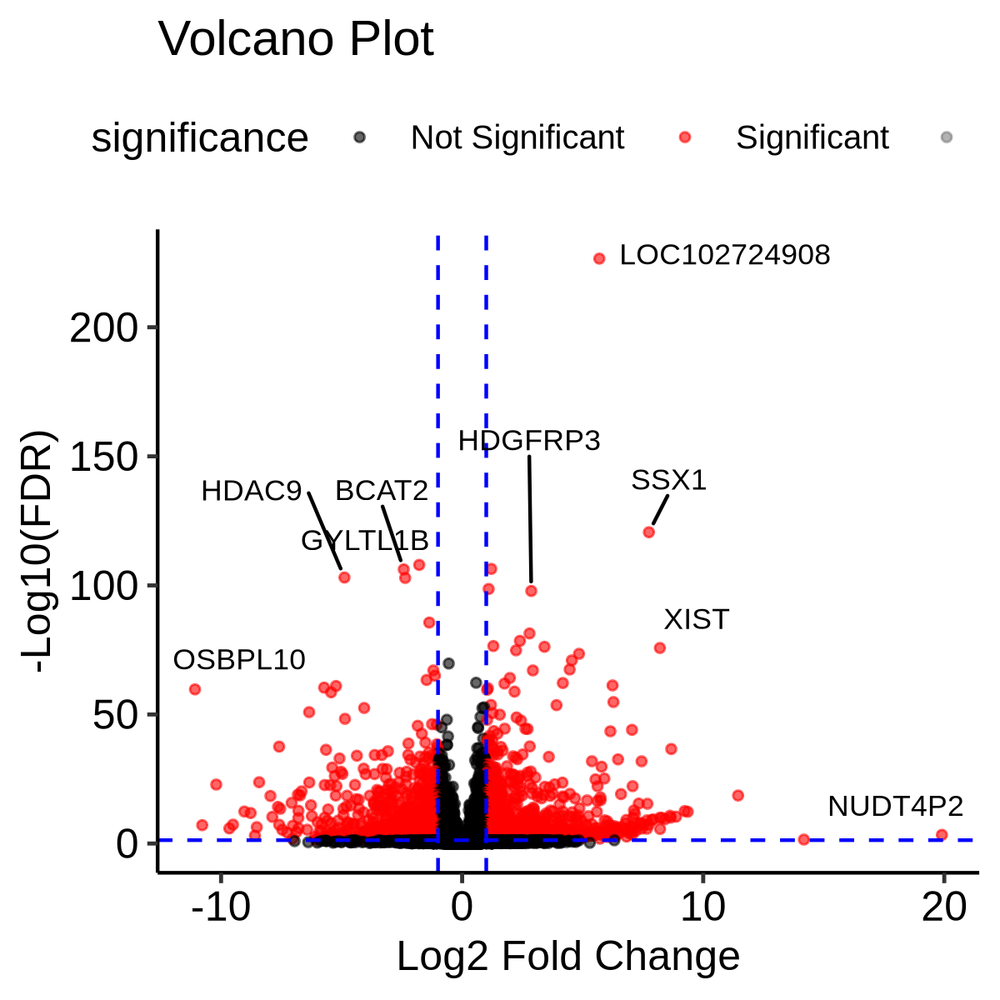

In [214]:
plotdat = hsa_deg_dt[.id == 'DKO__WT', ]
plotdat[, logFDR := -log(padj, 10) ]
plotdat$significance <- ifelse(plotdat$padj < 0.05 & abs(plotdat$log2FoldChange) > 1, "Significant", "Not Significant")

dim(plotdat)
table(plotdat$significance)
head(plotdat)

# Define top genes to label (adjust the threshold as needed)
top_genes <- plotdat %>%
  filter(logFDR > -log10(0.05) & abs(log2FoldChange) > 2)  # More stringent filtering

# Volcano plot with gene labels
p <- ggscatter(plotdat, 
               x = "log2FoldChange", 
               y = "logFDR", 
               color = "significance", 
               palette = c("black", "red"), 
               size = 1, alpha = 0.6) +
  geom_hline(yintercept = -log10(0.05), linetype = "dashed", color = "blue") +  # P-value threshold line
  geom_vline(xintercept = c(-1, 1), linetype = "dashed", color = "blue") +  # Log2FC thresholds
  geom_text_repel(data = top_genes, 
                  aes(x = log2FoldChange, y = logFDR, label = rn),  # Ensure 'gene' column exists
                  size = 3, max.overlaps = 10, 
                  box.padding = 0.3, point.padding = 0.3) +  # Avoid overlap
  theme_pubr() +
  labs(title = "Volcano Plot", x = "Log2 Fold Change", y = "-Log10(FDR)") 

options(repr.plot.width = 4, repr.plot.height = 4, repr.plot.res = 300)
print(p)


In [213]:
hsa_deg_dt[rn %in% c('AZU1', 'ITGB6') & .id == 'DKO__WT', ]

rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,chr,start,end,strand,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>,<chr>,<chr>
AZU1,DKO__WT,4.54738343,0.7380149,0.7801305,0.94601464,0.3441411,0.4653925,chr19,827830,832017,+,up
ITGB6,DKO__WT,0.02418962,0.2692081,6.5316151,0.04121616,0.9671236,NA,chr2,160099665,160200313,-,up


## PCA

In [34]:
gene_sel = unique(hsa_deg_dt[padj < .05 & abs(log2FoldChange) > 1, ][!duplicated(rn), ]) 
dim(gene_sel)
plotdat = logcpm_hsa[unique(gene_sel$rn), ]
plotdat = pca_fun(plotdat) 
plotdat$plotdat = merge(plotdat$plotdat, dsn_hsa_rna[, .(`sample`, group)], by.x = 'rn', by.y = 'sample')


[1] 7130   25

In [35]:
options(repr.plot.width = 16, repr.plot.height = 5, repr.plot.res = 300)
fname = '~/WenhuoHu/plot/test.pdf'
pdf(file = fname, width = 6, height = 5) 
ggscatter(plotdat$plotdat, x = "PC1", y = "PC2", color = 'group') + xlab(plotdat$labx) +  ylab(plotdat$laby) + ggrepel::geom_text_repel(aes(label = group))
dev.off()


Warning message:
“ggrepel: 22 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


pdf 
  2

## heatmap

[1] 6198   39

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



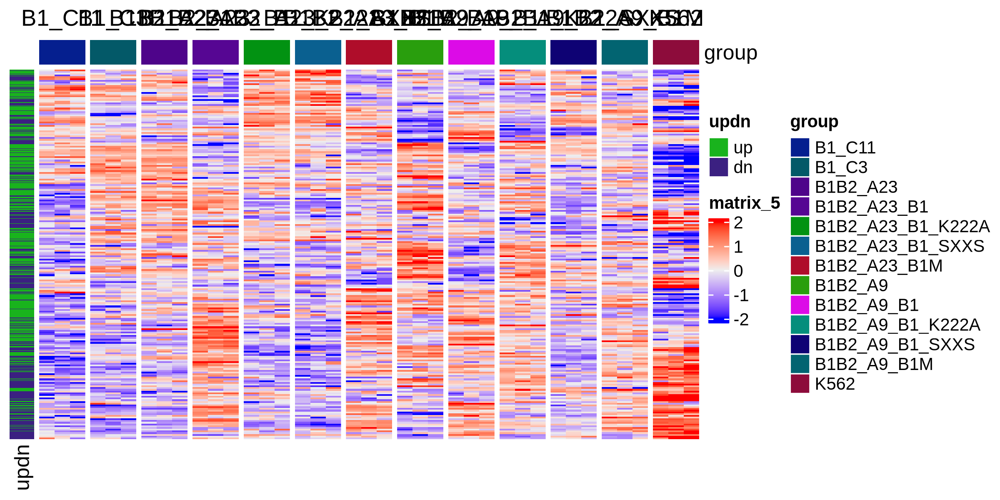

In [40]:
gene_sel = deg_dt[padj < .01 & abs(log2FoldChange) > 1, ][!duplicated(rn), ]
plotdat = logcpm_hsa[unique(gene_sel$rn), dsn_hsa_rna$sample]
plotdat = scale_fun(plotdat)
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
dim(plotdat)

column_ha = HeatmapAnnotation(df = dsn_hsa_rna[, "group", drop = F])
row_ha = rowAnnotation(df = gene_sel[, .(updn)])
args = list(matrix = plotdat, top_annotation = column_ha, left_annotation = row_ha,
                column_split = factor(dsn_hsa_rna$group), show_column_names = F, 
                show_row_names = F, show_column_dend = F, cluster_rows = T, cluster_columns = F, 
                row_names_gp = grid::gpar(fontsize = 7), show_row_dend = F)

options(repr.plot.width = 8, repr.plot.height=4, repr.plot.res = 300)
hp = do.call(Heatmap, args)
draw(hp)

## barplot

Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(plotdat). In the next version, this warning will become an error.”


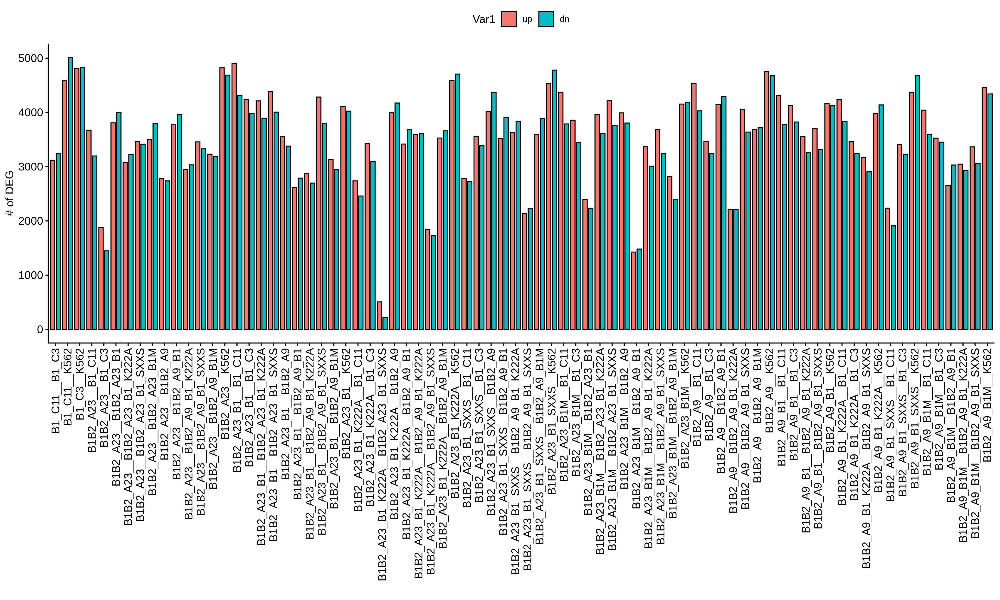

In [45]:
plotdat = deg_dt[padj < .1 & abs(log2FoldChange) > 0, ] 
plotdat = table(plotdat$updn, plotdat$.id)
plotdat = as.data.table(melt(plotdat))
plotdat[, Var2 := factor(Var2)]

options(repr.plot.width = 15, repr.plot.height=9, repr.plot.res = 300)
ggbarplot(plotdat, x = 'Var2', y = 'value', fill = 'Var1', position = position_dodge()) + rotate_x_text(90) + xlab('') + ylab('# of DEG') 


# import bead array meta data (deprecated)

In [ ]:
# https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GPL33022

In [ ]:
gpl_set1 = fread("/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Genomics/DNA_Methylation/2024-08-05_xu_lyu_methylepicv2_832573/MethylationEPIC v2.0 Files/EPIC-8v2-0_A1.csv", skip = 7)
gpl_set2 = fread("/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Genomics/DNA_Methylation/2024-08-05_xu_lyu_methylepicv2_832573/MethylationEPIC v2.0 Files/EPIC-8v2-0_A2.csv", skip = 7)
ov = intersect(colnames(gpl_set1), colnames(gpl_set2))
gpl_set = rbind(gpl_set1[, ov, with = F], gpl_set2[, ov, with = F]) 


In [579]:
head(gpl_set)
dim(gpl_set)

IlmnID,Name,AddressA_ID,AlleleA_ProbeSeq,AddressB_ID,AlleleB_ProbeSeq,Next_Base,Color_Channel,col,Probe_Type,⋯,OpenChromatin_NAME,OpenChromatin_Evidence_Count,Methyl450_Loci,Methyl27_Loci,EPICv1_Loci,Manifest_probe_match,SNP_ID,SNP_DISTANCE,SNP_MinorAlleleFrequency,symbol
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
cg25324105_BC11,cg25324105,1754126,ATTTATAAACTAATAACCCAAAATACATTTCCCAAAAACCTTCACAACCA,99753217,GTTTATAAACTAATAACCCGAAATACATTTCCCAAAAACCTTCGCGACCG,A,Red,R,cg,⋯,Het;Quies;TssA;TxWk;TssFlnkU;ZNF/Rpts;TssFlnk;Tx;TssBiv;EnhA2;TssFlnkD,261;34;540;408;120;186;50;42;12;3;7,cg25324105,,cg25324105,TRUE,,,,ZNF781
cg25383568_TC11,cg25383568,79792482,AAACCAAAAAAATAACAAACTACTCACCTTATCAAAATAATTAAAAAACA,69667133,AAACCGAAAAAATAACAAACTACTCACCTTATCGAAATAATTAAAAAACG,C,Grn,G,cg,⋯,Quies;EnhG1;Tx;TxWk;ReprPCWk;EnhG2;ReprPC;EnhA1;EnhA2,689;198;536;49;138;49;1;1;2,cg25383568,,cg25383568,TRUE,rs1394936871;rs1415497516;rs1488301961;rs192382222;rs374240053;rs377626307;rs539072997;rs760946329;rs765587455;rs768749756;rs777566567;rs949297283,39;44;27;1;48;45;16;0;40;38;51;37,0;0;0;0;0;0;0;0;0;0;0;0,ACTN4
cg25455143_BC11,cg25455143,80699190,ATAAAAAAAAATATACAACTAATCCCCCTTTTTCCCACAACTCAAAATCA,7659147,ATAAAAAAAAATATACGACTAATCCCCCTTTTTCCCACAACTCGAAATCG,T,Red,R,cg,⋯,TssFlnkU;TssFlnkD;TssA;TssFlnk;EnhWk;EnhA1;EnhG2;TxWk,1215;124;240;40;16;14;10;4,cg25455143,,cg25455143,TRUE,rs1047130013;rs1051458573;rs1235675713;rs1330158019;rs1372890585;rs181027148;rs35919258;rs563928941;rs72618597;rs745973733;rs899683679;rs913579702;rs920397045;rs926523552;rs941159426;rs982469986,51;34;25;31;29;41;1;33;8;28;26;4;39;24;9;23,0;0;0;0;0;0;0;0.002;0.041;0;0;0;0;0;0;0,
cg25459778_BC11,cg25459778,60797262,AAAAATTTAAAACAAACAACAACAACCATATTAAAAACACATCAAAACCA,65710482,AAAAATTTAAAACAAACAACGACGACCATATTAAAAACGCGTCGAAACCG,C,Grn,G,cg,⋯,TxWk;ReprPCWk;TssA;Quies;TssBiv;TssFlnk;EnhA2;EnhWk;Tx;EnhBiv;ReprPC,510;3;323;268;18;457;31;4;41;4;4,cg25459778,cg25459778,cg25459778,TRUE,rs1028295962;rs1042852826;rs1054305051;rs1163979757;rs1198001812;rs1272891563;rs1286657226;rs1299033407;rs1326019391;rs1332148215;rs1337457517;rs1360222555;rs1421713513;rs1423183448;rs1487797917;rs533763932;rs891630084;rs901281519;rs998695726,1;34;48;46;29;27;5;19;3;2;8;15;32;39;28;6;45;5;0,0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0,
cg25487775_BC11,cg25487775,5799427,AAAAACAACCTAAAAAACAACCCCCTACCCTACTCTACAAAAAAAACACA,89606481,AAAAACAACCTAAAAAACAACCCCCTACCCTACTCTACAAAAAAAACGCG,A,Red,R,cg,⋯,EnhWk;Quies;TssFlnkU;TssBiv;TxWk;TssFlnkD;EnhA1;TssA;TssFlnk;EnhA2;ReprPCWk;EnhBiv;ReprPC;Tx;ZNF/Rpts;EnhG1;EnhG2;Het,356;89;254;75;188;325;186;6;25;133;3;9;3;2;1;4;3;1,cg25487775,,cg25487775,TRUE,rs1026366085;rs1044940275;rs1229309650;rs1257308158;rs1284032264;rs1286589749;rs1354547188;rs1473120976;rs558558303;rs889057000;rs907409584;rs949027946,12;31;1;40;9;2;0;51;41;18;22;38,0;0;0;0;0;0;0;0;0;0;0;0,
cg25595446_BC11,cg25595446,65640459,AATAAAAATAACAACAACCAAAACCACAAACTACATCATAAAAATAAACA,39619855,AATAAAAATAACGACAACCGAAACCGCGAACTACATCATAAAAATAAACG,C,Grn,G,cg,⋯,Quies;TxWk;TssA;EnhA2;Tx;ReprPCWk;TssFlnk;TssFlnkU;ReprPC,424;241;820;1;144;19;9;3;2,cg25595446,cg25595446,cg25595446,TRUE,rs1010805679;rs1033981140;rs1190261920;rs1330249664;rs1339967373;rs1376247430;rs1379324397;rs1428461806;rs368170311;rs371508595;rs374334189;rs539647606;rs543913812;rs557979749;rs576649607;rs745946763;rs754139419;rs757408833;rs758492716;rs769181104;rs779115593,48;0;15;44;51;16;49;27;42;29;26;50;21;40;24;31;39;36;30;22;32,0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0,


[1] 1875382      50

In [73]:
library(GEOquery)

In [ ]:
gpl = getGEO('GPL33022')

In [ ]:
saveRDS(gpl, file = 'GPL33022.rds')

In [16]:
gpl = readRDS('GPL33022.rds')
gpl33022_dt = as.data.table(gpl@dataTable@table)
head(gpl33022_dt)
dim(gpl33022_dt)
colnames(gpl33022_dt)


ID,SPOT_ID,Name,AddressA_ID,AlleleA_ProbeSeq,AddressB_ID,AlleleB_ProbeSeq,Next_Base,Color_Channel,col,⋯,Encode_CisReg_Site_Evid,OpenChromatin_NAME,OpenChromatin_Evidence_Count,Methyl450_Loci,Methyl27_Loci,EPICv1_Loci,Manifest_probe_match,SNP_ID,SNP_DISTANCE,SNP_MinorAlleleFrequency
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
cg25324105_BC11,cg25324105_BC11,cg25324105,1754126,ATTTATAAACTAATAACCCAAAATACATTTCCCAAAAACCTTCACAACCA,99753217,GTTTATAAACTAATAACCCGAAATACATTTCCCAAAAACCTTCGCGACCG,A,Red,R,⋯,1;18;46;22,Het;Quies;TssA;TxWk;TssFlnkU;ZNF/Rpts;TssFlnk;Tx;TssBiv;EnhA2;TssFlnkD,261;34;540;408;120;186;50;42;12;3;7,cg25324105,,cg25324105,TRUE,,,
cg25383568_TC11,cg25383568_TC11,cg25383568,79792482,AAACCAAAAAAATAACAAACTACTCACCTTATCAAAATAATTAAAAAACA,69667133,AAACCGAAAAAATAACAAACTACTCACCTTATCGAAATAATTAAAAAACG,C,Grn,G,⋯,5;1;81,Quies;EnhG1;Tx;TxWk;ReprPCWk;EnhG2;ReprPC;EnhA1;EnhA2,689;198;536;49;138;49;1;1;2,cg25383568,,cg25383568,TRUE,rs1394936871;rs1415497516;rs1488301961;rs192382222;rs374240053;rs377626307;rs539072997;rs760946329;rs765587455;rs768749756;rs777566567;rs949297283,39;44;27;1;48;45;16;0;40;38;51;37,0;0;0;0;0;0;0;0;0;0;0;0
cg25455143_BC11,cg25455143_BC11,cg25455143,80699190,ATAAAAAAAAATATACAACTAATCCCCCTTTTTCCCACAACTCAAAATCA,7659147,ATAAAAAAAAATATACGACTAATCCCCCTTTTTCCCACAACTCGAAATCG,T,Red,R,⋯,,TssFlnkU;TssFlnkD;TssA;TssFlnk;EnhWk;EnhA1;EnhG2;TxWk,1215;124;240;40;16;14;10;4,cg25455143,,cg25455143,TRUE,rs1047130013;rs1051458573;rs1235675713;rs1330158019;rs1372890585;rs181027148;rs35919258;rs563928941;rs72618597;rs745973733;rs899683679;rs913579702;rs920397045;rs926523552;rs941159426;rs982469986,51;34;25;31;29;41;1;33;8;28;26;4;39;24;9;23,0;0;0;0;0;0;0;0.002;0.041;0;0;0;0;0;0;0
cg25459778_BC11,cg25459778_BC11,cg25459778,60797262,AAAAATTTAAAACAAACAACAACAACCATATTAAAAACACATCAAAACCA,65710482,AAAAATTTAAAACAAACAACGACGACCATATTAAAAACGCGTCGAAACCG,C,Grn,G,⋯,67;20,TxWk;ReprPCWk;TssA;Quies;TssBiv;TssFlnk;EnhA2;EnhWk;Tx;EnhBiv;ReprPC,510;3;323;268;18;457;31;4;41;4;4,cg25459778,cg25459778,cg25459778,TRUE,rs1028295962;rs1042852826;rs1054305051;rs1163979757;rs1198001812;rs1272891563;rs1286657226;rs1299033407;rs1326019391;rs1332148215;rs1337457517;rs1360222555;rs1421713513;rs1423183448;rs1487797917;rs533763932;rs891630084;rs901281519;rs998695726,1;34;48;46;29;27;5;19;3;2;8;15;32;39;28;6;45;5;0,0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0
cg25487775_BC11,cg25487775_BC11,cg25487775,5799427,AAAAACAACCTAAAAAACAACCCCCTACCCTACTCTACAAAAAAAACACA,89606481,AAAAACAACCTAAAAAACAACCCCCTACCCTACTCTACAAAAAAAACGCG,A,Red,R,⋯,,EnhWk;Quies;TssFlnkU;TssBiv;TxWk;TssFlnkD;EnhA1;TssA;TssFlnk;EnhA2;ReprPCWk;EnhBiv;ReprPC;Tx;ZNF/Rpts;EnhG1;EnhG2;Het,356;89;254;75;188;325;186;6;25;133;3;9;3;2;1;4;3;1,cg25487775,,cg25487775,TRUE,rs1026366085;rs1044940275;rs1229309650;rs1257308158;rs1284032264;rs1286589749;rs1354547188;rs1473120976;rs558558303;rs889057000;rs907409584;rs949027946,12;31;1;40;9;2;0;51;41;18;22;38,0;0;0;0;0;0;0;0;0;0;0;0
cg25595446_BC11,cg25595446_BC11,cg25595446,65640459,AATAAAAATAACAACAACCAAAACCACAAACTACATCATAAAAATAAACA,39619855,AATAAAAATAACGACAACCGAAACCGCGAACTACATCATAAAAATAAACG,C,Grn,G,⋯,2;65;20,Quies;TxWk;TssA;EnhA2;Tx;ReprPCWk;TssFlnk;TssFlnkU;ReprPC,424;241;820;1;144;19;9;3;2,cg25595446,cg25595446,cg25595446,TRUE,rs1010805679;rs1033981140;rs1190261920;rs1330249664;rs1339967373;rs1376247430;rs1379324397;rs1428461806;rs368170311;rs371508595;rs374334189;rs539647606;rs543913812;rs557979749;rs576649607;rs745946763;rs754139419;rs757408833;rs758492716;rs769181104;rs779115593,48;0;15;44;51;16;49;27;42;29;26;50;21;40;24;31;39;36;30;22;32,0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0


[1] 937691     50

[1] "ID"                           "SPOT_ID"                     
 [3] "Name"                         "AddressA_ID"                 
 [5] "AlleleA_ProbeSeq"             "AddressB_ID"                 
 [7] "AlleleB_ProbeSeq"             "Next_Base"                   
 [9] "Color_Channel"                "col"                         
[11] "Probe_Type"                   "Strand_FR"                   
[13] "Strand_TB"                    "Strand_CO"                   
[15] "Infinium_Design"              "Infinium_Design_Type"        
[17] "CHR"                          "MAPINFO"                     
[19] "Species"                      "Genome_Build"                
[21] "Source_Seq"                   "Forward_Sequence"            
[23] "Top_Sequence"                 "Rep_Num"                     
[25] "UCSC_RefGene_Group"           "UCSC_RefGene_Name"           
[27] "UCSC_RefGene_Accession"       "UCSC_CpG_Islands_Name"       
[29] "Relation_to_UCSC_CpG_Island"  "GencodeV41_Group"            
[31] "GencodeV41_Name"              "GencodeV41_Accession"        
[33] "Phantom5_Enhancers"           "HMM_Island"                  
[35] "Regulatory_Feature_Name"      "Regulatory_Feature_Group"    
[37] "450k_Enhancer"                "DMR"                         
[39] "DNase_Hypersensitivity_NAME"  "Encode_CisReg_Site"          
[41] "Encode_CisReg_Site_Evid"      "OpenChromatin_NAME"          
[43] "OpenChromatin_Evidence_Count" "Methyl450_Loci"              
[45] "Methyl27_Loci"                "EPICv1_Loci"                 
[47] "Manifest_probe_match"         "SNP_ID"                      
[49] "SNP_DISTANCE"                 "SNP_MinorAlleleFrequency"

In [17]:
dim(gpl33022_dt)

[1] 937691     50

In [547]:
head(gpl33022_dt[, .(ID, Name, CHR, MAPINFO)]) 

ID,Name,CHR,MAPINFO
<chr>,<chr>,<chr>,<int>
cg25324105_BC11,cg25324105,chr19,37692358
cg25383568_TC11,cg25383568,chr19,38727081
cg25455143_BC11,cg25455143,chr19,1591515
cg25459778_BC11,cg25459778,chr16,1614581
cg25487775_BC11,cg25487775,chr2,161237458
cg25595446_BC11,cg25595446,chr19,49677322


In [554]:
# comparing the TCGA meta with this data
# conclusion: these are the same probe names
tcga_meth_row_meta = readRDS(file = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/tcga_meth_row_meta.rds') 
tcga_meth_row_meta = as.data.table(tcga_meth_row_meta, keep.rownames = T)


In [556]:
plotdat = merge(tcga_meth_row_meta[, .(rn, seqnames, start, end)], gpl33022_dt[, .(ID, Name, CHR, MAPINFO)], by.x = 'rn', by.y = 'Name') 

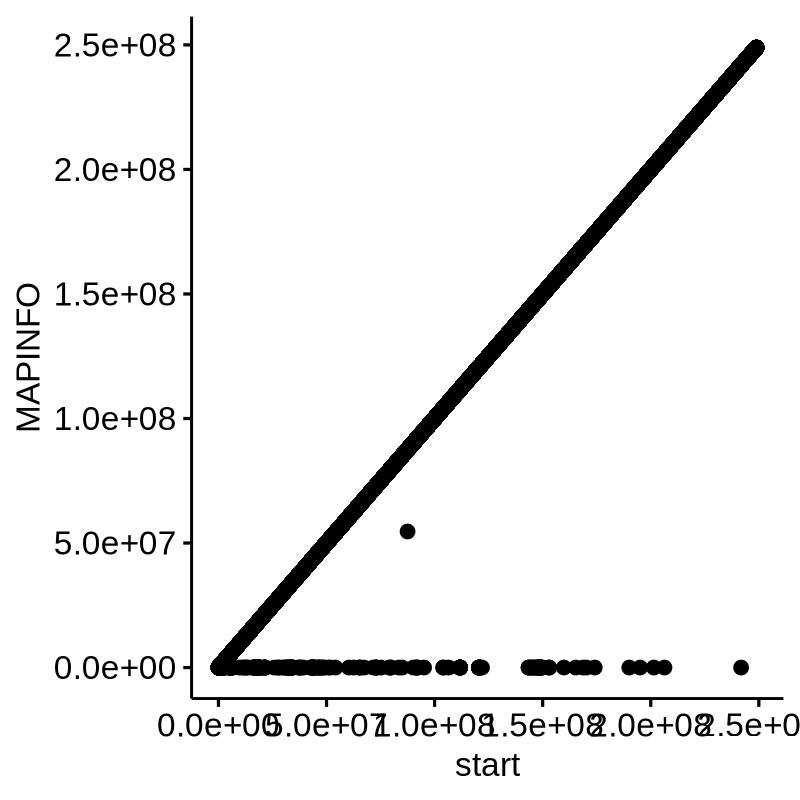

In [559]:
ggscatter(plotdat, x = 'start', y = 'MAPINFO')

In [558]:
head(plotdat)
dim(plotdat)

rn,seqnames,start,end,ID,CHR,MAPINFO
<chr>,<fct>,<int>,<int>,<chr>,<chr>,<int>
cg00000029,chr16,53434200,53434201,cg00000029_TC21,chr16,53434200
cg00000109,chr3,172198247,172198248,cg00000109_TC21,chr3,172198247
cg00000165,chr1,90729117,90729118,cg00000165_TC21,chr1,90729117
cg00000236,chr8,42405776,42405777,cg00000236_TC21,chr8,42405776
cg00000289,chr14,68874422,68874423,cg00000289_TC21,chr14,68874422
cg00000292,chr16,28878779,28878780,cg00000292_BC21,chr16,28878779


[1] 399178      7

# import methylation data

In [502]:
data_dir

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Genomics/DNA_Methylation/2024-08-05_xu_lyu_methylepicv2_832573/"

In [15]:
# import design table
dsn = as.data.table(read_excel(paste0(data_dir, '2024-08-05_xu_lyu_methylepicv2_832573_sample_information_8-22-24.xlsx'), skip = 7))
dsn[, sample_name := paste0(Sentrix_ID, '_', Sentrix_Position) ]
datatable(dsn)


HTML widgets cannot be represented in plain text (need html)

In [19]:
#fname = paste0(data_dir, '2024-08-05_xu_lyu_methylepicv2_832573_sample_methylation_profile.txt')
#meth = fread(fname) 


In [504]:
meth = read.metharray.exp(base = data_dir, recursive = T)

In [580]:
#sampleNames(meth) = dsn$sample_name
sampleNames(meth)

[1] "208356090086_R01C01" "208356090086_R02C01" "208356090086_R03C01" "208356090086_R04C01" "208356090086_R05C01"
 [6] "208356090086_R06C01" "208356090086_R07C01" "208356090086_R08C01" "208356090115_R01C01" "208356090115_R02C01"
[11] "208356090115_R03C01" "208356090115_R04C01" "208356090115_R05C01" "208356090115_R06C01" "208356090115_R07C01"
[16] "208356090115_R08C01" "208356090128_R01C01" "208356090128_R02C01" "208356090128_R03C01" "208356090128_R04C01"
[21] "208356090128_R05C01" "208356090128_R06C01" "208356090128_R07C01" "208356090128_R08C01" "208356090131_R01C01"
[26] "208356090131_R02C01" "208356090131_R03C01" "208356090131_R04C01" "208356090131_R05C01" "208356090131_R06C01"
[31] "208356090131_R07C01" "208356090131_R08C01" "208375650084_R01C01" "208375650084_R02C01" "208375650084_R03C01"
[36] "208375650084_R04C01" "208375650084_R05C01" "208375650084_R06C01" "208375650084_R07C01" "208375650084_R08C01"
[41] "208375650102_R07C01" "208375650102_R08C01"

In [594]:
head(meth@assays@data$Red)
head(meth@assays@data$Green)

,208356090086_R01C01,208356090086_R02C01,208356090086_R03C01,208356090086_R04C01,208356090086_R05C01,208356090086_R06C01,208356090086_R07C01,208356090086_R08C01,208356090115_R01C01,208356090115_R02C01,⋯,208375650084_R01C01,208375650084_R02C01,208375650084_R03C01,208375650084_R04C01,208375650084_R05C01,208375650084_R06C01,208375650084_R07C01,208375650084_R08C01,208375650102_R07C01,208375650102_R08C01
1600157,9671,10119,12195,11241,12233,11615,12023,12849,9977,9523,⋯,10981,11336,12815,13981,14179,14274,14104,3798,3801,3689
1600179,473,537,372,482,511,477,426,490,460,359,⋯,413,340,395,608,683,493,670,1088,1024,1317
1600219,6990,7551,8208,9552,10415,9212,10365,10770,7193,8003,⋯,8681,9828,10145,9886,10440,12153,11519,1687,1804,1918
1600225,2619,2987,2612,3544,3516,3502,3718,3816,2810,2850,⋯,3167,2785,3489,3809,3387,4118,3639,9858,10573,10697
1600283,7021,6763,7725,8231,8133,8736,9440,9091,7038,7087,⋯,8253,8183,8628,9981,9381,10438,10155,9673,9374,11227
1600411,4428,6807,6004,6343,4305,3728,6879,8444,4382,3565,⋯,5512,5689,7186,5180,4124,7062,7026,2203,2769,2413


,208356090086_R01C01,208356090086_R02C01,208356090086_R03C01,208356090086_R04C01,208356090086_R05C01,208356090086_R06C01,208356090086_R07C01,208356090086_R08C01,208356090115_R01C01,208356090115_R02C01,⋯,208375650084_R01C01,208375650084_R02C01,208375650084_R03C01,208375650084_R04C01,208375650084_R05C01,208375650084_R06C01,208375650084_R07C01,208375650084_R08C01,208375650102_R07C01,208375650102_R08C01
1600157,1462,1519,1763,1737,1782,1372,1589,1588,1823,1297,⋯,1275,1406,1844,1404,1854,1861,1529,9949,11026,10710
1600179,8644,8261,7455,9650,8115,8746,8932,8643,8248,7174,⋯,7690,7853,8509,7230,5812,8893,8042,10654,13122,11737
1600219,2862,1045,2955,1506,1271,4574,1873,1666,1193,1208,⋯,1447,1688,1134,1243,974,1662,1548,9493,11195,10706
1600225,11209,13043,14311,14320,14937,14501,14001,12255,12969,13114,⋯,12283,12139,13764,13338,12994,14699,12966,10057,11724,10867
1600283,723,792,926,1010,882,890,852,699,655,943,⋯,621,827,718,940,693,966,994,465,678,704
1600411,5501,2512,5961,5540,9845,10232,5752,6819,4489,7483,⋯,4015,5414,6051,9780,11307,6188,5863,9751,13332,10211


In [25]:
#annotation(rgSet)["array"] = "IlluminaHumanMethylationEPIC"
rgSet = copy(meth)
rgSet@annotation <- c(array = "IlluminaHumanMethylationEPICv2", annotation = "20a1.hg38")



In [57]:
saveRDS(meth, file = 'meth_cell_line_BCAT1KO_human.rds')
saveRDS(rgSet, file = 'rgSet.rds')
#hsa_meth = readRDS(file = 'meth_cell_line_BCAT1KO_human.rds')

In [613]:
saveRDS(rgSet, file = 'rgSet.rds')


In [16]:
meth = readRDS('meth_cell_line_BCAT1KO_human.rds')

In [58]:
saveRDS(dsn, file = 'dsn_cell_line_BCAT1KO_human.rds')

In [509]:
rgSet = readRDS('meth_cell_line_BCAT1KO.rds')
hsa_dsn_meth = readRDS('dsn_cell_line_BCAT1KO_human.rds')


In [22]:
rgSet

class: RGChannelSet 
dim: 1105209 42 
metadata(0):
assays(2): Green Red
rownames(1105209): 1600157 1600179 ... 99810982 99810990
rowData names(0):
colnames(42): 208356090086_R01C01 208356090086_R02C01 ...
  208375650102_R07C01 208375650102_R08C01
colData names(0):
Annotation
  array: IlluminaHumanMethylationEPICv2
  annotation: 20a1.hg38

In [23]:
meth

class: RGChannelSet 
dim: 1105209 42 
metadata(0):
assays(2): Green Red
rownames(1105209): 1600157 1600179 ... 99810982 99810990
rowData names(0):
colnames(42): 208356090086_R01C01 208356090086_R02C01 ...
  208375650102_R07C01 208375650102_R08C01
colData names(0):
Annotation
  array: Unknown
  annotation: Unknown

# QC

NULL

NULL

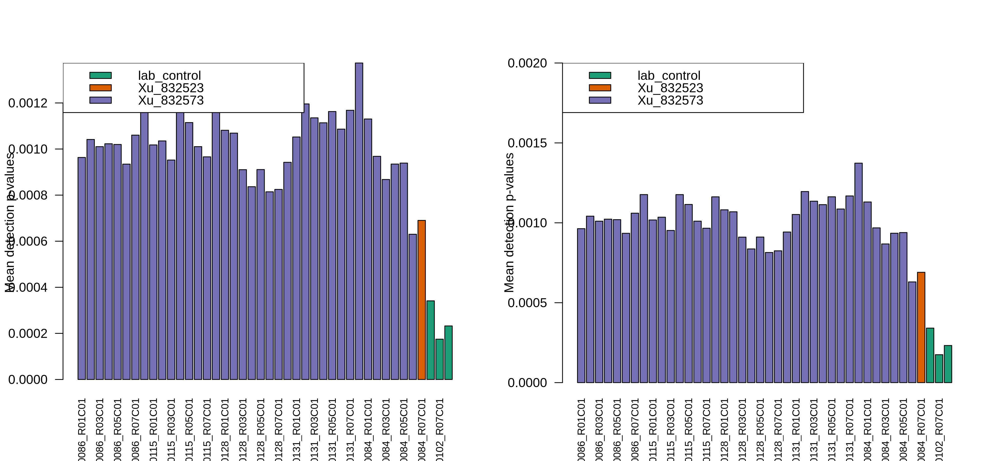

In [614]:
options(repr.plot.width = 13, repr.plot.height = 6, repr.plot.res = 300)
detP <- detectionP(rgSet)
pal <- brewer.pal(8,"Dark2")
par(mfrow=c(1,2))
barplot(colMeans(detP), col=pal[factor(hsa_dsn_meth$Sample_Group)], las=2, 
        cex.names=0.8, ylab="Mean detection p-values") + xlim(0, .2)
abline(h=0.05,col="red")
legend("topleft", legend=levels(factor(hsa_dsn_meth$Sample_Group)), fill=pal,
       bg="white")

barplot(colMeans(detP), col=pal[factor(hsa_dsn_meth$Sample_Group)], las=2, 
        cex.names=0.8, ylim=c(0,0.002), ylab="Mean detection p-values") + xlim(0, .2)
abline(h=0.05,col="red")
legend("topleft", legend=levels(factor(hsa_dsn_meth$Sample_Group)), fill=pal, 
       bg="white")


In [615]:
detP <- detectionP(rgSet)
dim(detP)
head(detP)

[1] 936990     42

,208356090086_R01C01,208356090086_R02C01,208356090086_R03C01,208356090086_R04C01,208356090086_R05C01,208356090086_R06C01,208356090086_R07C01,208356090086_R08C01,208356090115_R01C01,208356090115_R02C01,⋯,208375650084_R01C01,208375650084_R02C01,208375650084_R03C01,208375650084_R04C01,208375650084_R05C01,208375650084_R06C01,208375650084_R07C01,208375650084_R08C01,208375650102_R07C01,208375650102_R08C01
cg25324105_BC11,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
cg25383568_TC11,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
cg25455143_BC11,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
cg25459778_BC11,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
cg25487775_BC11,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
cg25595446_BC11,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


In [620]:
keep <- colMeans(t(detP)) < 0.05
head(keep)


cg25324105_BC11 cg25383568_TC11 cg25455143_BC11 cg25459778_BC11 cg25487775_BC11 cg25595446_BC11 
           TRUE            TRUE            TRUE            TRUE            TRUE            TRUE

In [619]:
length(keep)


[1] 936990

# normalization

In [27]:
library(minfi)

In [30]:
library(IlluminaHumanMethylationEPICv2manifest)

In [91]:
hsa_dsn_meth = readRDS('dsn_cell_line_BCAT1KO_human.rds')


In [92]:
hsa_dsn_meth = hsa_dsn_meth[hsa_dsn_meth$Sample_Group != 'lab_control', ]
rgSet = rgSet[, hsa_dsn_meth$sample_name]
rgSet

class: RGChannelSet 
dim: 1105209 39 
metadata(0):
assays(2): Green Red
rownames(1105209): 1600157 1600179 ... 99810982 99810990
rowData names(0):
colnames(39): 208356090086_R01C01 208356090086_R02C01 ... 208375650084_R06C01 208375650084_R07C01
colData names(0):
Annotation
  array: IlluminaHumanMethylationEPICv2
  annotation: 20a1.hg38

In [63]:
saveRDS(rgSet, file = 'rgSet_1.rds')

In [84]:
rgSet = readRDS('rgSet_1.rds')

In [37]:
getwd()

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Junhua"

In [ ]:
mSetSq <- preprocessQuantile(rgSet) 


In [82]:
# mSetSq = readRDS('mSetSq.rds')

In [85]:
mSetSq

class: GenomicRatioSet 
dim: 930075 39 
metadata(0):
assays(2): M CN
rownames(930075): cg00381604_BC11 cg21870274_BC21 ... cg27912920_TC21 cg16855331_BC21
rowData names(0):
colnames(39): 208356090086_R01C01 208356090086_R02C01 ... 208375650084_R06C01 208375650084_R07C01
colData names(3): xMed yMed predictedSex
Annotation
  array: IlluminaHumanMethylationEPICv2
  annotation: 20a1.hg38
Preprocessing
  Method: Raw (no normalization or bg correction)
  minfi version: 1.52.1
  Manifest version: 1.0.0

In [86]:
mSetRaw <- preprocessRaw(rgSet)


Loading required package: IlluminaHumanMethylationEPICv2manifest



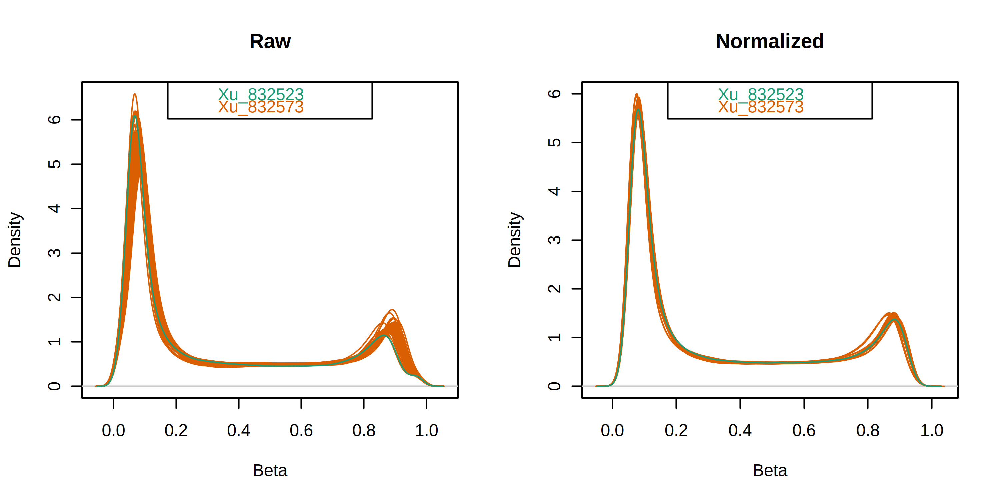

In [66]:
options(repr.plot.width = 10, repr.plot.height = 5, repr.plot.res = 300)
par(mfrow=c(1,2))
densityPlot(rgSet, sampGroups=hsa_dsn_meth$Sample_Group,main="Raw", legend=FALSE)
legend("top", legend = levels(factor(hsa_dsn_meth$Sample_Group)),  text.col=brewer.pal(8,"Dark2"))
densityPlot(getBeta(mSetSq), sampGroups=hsa_dsn_meth$Sample_Group, main="Normalized", legend=FALSE)
legend("top", legend = levels(factor(hsa_dsn_meth$Sample_Group)),  text.col=brewer.pal(8,"Dark2"))


In [93]:
targets = copy(hsa_dsn_meth)

In [514]:
head(plotdat)

,208356090086_R01C01,208356090086_R02C01,208356090086_R03C01,208356090086_R04C01,208356090086_R05C01,208356090086_R06C01,208356090086_R07C01,208356090086_R08C01,208356090115_R01C01,208356090115_R02C01,⋯,208375650084_R01C01,208375650084_R02C01,208375650084_R03C01,208375650084_R04C01,208375650084_R05C01,208375650084_R06C01,208375650084_R07C01,208375650084_R08C01,208375650102_R07C01,208375650102_R08C01
cg14817997,0.58053995,0.5952878,0.50323842,0.66416312,0.53722827,0.62309217,0.63468141,0.65820076,0.47761091,0.5392100,⋯,0.63010808,0.61269119,0.48159658,0.5495567,0.53285477,0.49907257,0.53608139,0.03756300,0.03960801,0.04002899
cg01803908,0.86325423,0.8956900,0.87571791,0.89498250,0.88815169,0.86620425,0.90504706,0.87884102,0.90000071,0.8911727,⋯,0.90179195,0.90420110,0.90285151,0.8634666,0.88504272,0.87434294,0.90500028,0.44121641,0.27271816,0.33426200
cg15174812,0.86659176,0.8771695,0.86539567,0.85225935,0.87767454,0.84575556,0.90106191,0.89181173,0.90188623,0.8826851,⋯,0.87970958,0.88056934,0.86696803,0.8752262,0.85271432,0.87932162,0.89215182,0.71123593,0.68124708,0.70012013
cg05001044,0.16046240,0.1473014,0.18007322,0.13858528,0.13229634,0.13202773,0.12977363,0.14078286,0.14253078,0.1209620,⋯,0.13340829,0.11481840,0.14622374,0.1373881,0.13584319,0.11779043,0.15379330,0.67031091,0.69472335,0.71063097
cg17501828,0.07783401,0.1052236,0.07784738,0.08158618,0.08666302,0.07325923,0.07223814,0.08268699,0.08810865,0.0877876,⋯,0.07520276,0.06863003,0.08309484,0.0838547,0.08777394,0.08459277,0.05579347,0.03656362,0.03827391,0.03685826
cg23917638,0.38785684,0.5251219,0.28789861,0.46269120,0.30828086,0.55525873,0.50318518,0.53431178,0.35398201,0.4141032,⋯,0.41664298,0.20552815,0.48683761,0.2805929,0.44841541,0.29086229,0.35515914,0.49087357,0.23431906,0.32936280


In [515]:
head(targets)

Sample_Name,Sample_Well,Sample_Plate,Sample_Group,Pool_ID,Sentrix_ID,Sentrix_Position,Sample Name,genotype,replication,sample_name
<chr>,<chr>,<chr>,<chr>,<lgl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<chr>
WT-1_3174159__methylepicv2,A01,Plate 01_08-13-24,Xu_832573,NA,208356090086,R01C01,WT-1,WT,1,208356090086_R01C01
B1-C3-1_3174160__methylepicv2,B01,Plate 01_08-13-24,Xu_832573,NA,208356090086,R02C01,B1-C3-1,BCAT1 KO,1,208356090086_R02C01
B1-C11-1_3174161__methylepicv2,C01,Plate 01_08-13-24,Xu_832573,NA,208356090086,R03C01,B1-C11-1,BCAT1 KO,1,208356090086_R03C01
DKO-A9-1_3174162__methylepicv2,D01,Plate 01_08-13-24,Xu_832573,NA,208356090086,R04C01,DKO-A9-1,BCAT1/2 KO,1,208356090086_R04C01
A9-B1-1_3174163__methylepicv2,E01,Plate 01_08-13-24,Xu_832573,NA,208356090086,R05C01,A9-B1-1,BCAT1/2 KO + BCAT1,1,208356090086_R05C01
A9-B1M-1_3174164__methylepicv2,F01,Plate 01_08-13-24,Xu_832573,NA,208356090086,R06C01,A9-B1M-1,BCAT1/2 KO + BCAT1Mito,1,208356090086_R06C01


In [94]:
targets[, clone := 'wt' ]
targets[grep('A9', Sample_Name), clone := 'A9' ]
targets[grep('A23', Sample_Name), clone := 'A23' ]
targets[grep('C3', Sample_Name), clone := 'C3' ]
targets[grep('C11', Sample_Name), clone := 'C11' ]

In [95]:
table(targets$genotype, targets$clone)

                          
                           A23 A9 C11 C3 wt
  BCAT1 KO                   0  0   3  3  0
  BCAT1/2 KO                 3  3   0  0  0
  BCAT1/2 KO + BCAT1         3  3   0  0  0
  BCAT1/2 KO + BCAT1_K222A   3  3   0  0  0
  BCAT1/2 KO + BCAT1_SXXS    2  3   0  0  1
  BCAT1/2 KO + BCAT1Mito     3  3   0  0  0
  WT                         0  0   0  0  3

In [96]:
targets_sel = targets[Sample_Group != 'lab_control', ]
plotdat = getM(mSetSq)
plotdat = plotdat[, targets_sel$sample_name]


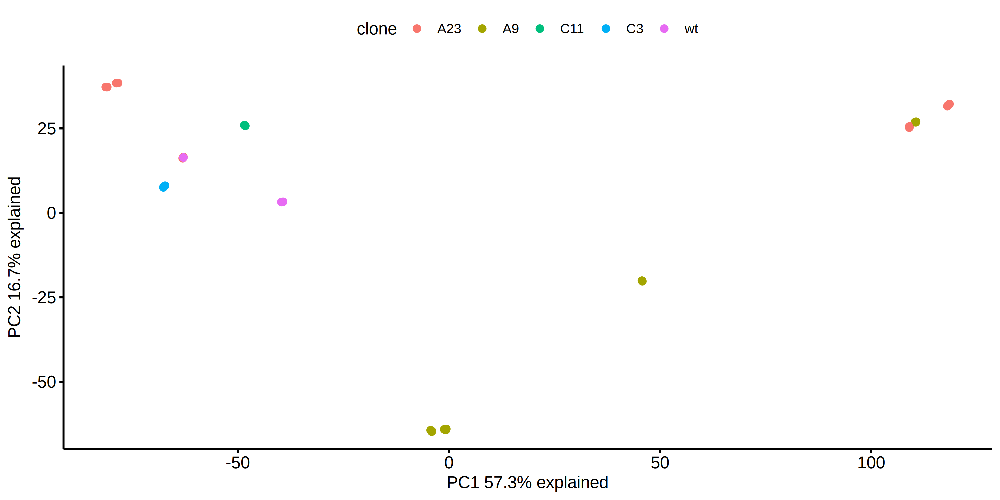

In [71]:
res = pca_fun(plotdat, ntop=9000, if_plot = T, col = 'genotype', dsn = targets_sel[, .(sample_name, genotype, clone)])
ggsave(res$gg, file = '~/WenhuoHu/plot/test1.pdf', width = 5, height = 5)
res = pca_fun(plotdat, ntop=9000, if_plot = T, col = 'clone', dsn = targets_sel[, .(sample_name, genotype, clone)])
ggsave(res$gg, file = '~/WenhuoHu/plot/test2.pdf', width = 5, height = 5)
res$gg

In [100]:
source('~/script/utils.r')

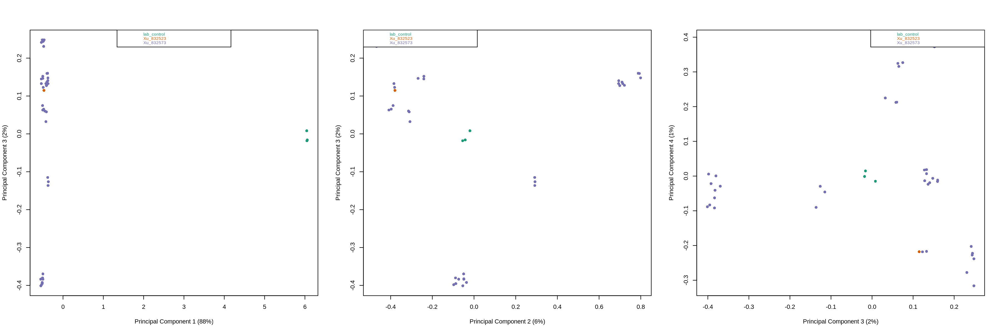

In [109]:
options(repr.plot.width = 18, repr.plot.height = 6, repr.plot.res = 200)
par(mfrow=c(1,3))
plotMDS(getM(mSetSq), top=1000, gene.selection="common", pch = 16,  col=pal[factor(targets$Sample_Group)], dim=c(1,3))
legend("top", legend=levels(factor(targets$Sample_Group)), text.col=pal,  cex=0.7, bg="white")

plotMDS(getM(mSetSq), top=1000, gene.selection="common", pch = 16,  col=pal[factor(targets$Sample_Group)], dim=c(2,3))
legend("topleft", legend=levels(factor(targets$Sample_Group)), text.col=pal, cex=0.7, bg="white")

plotMDS(getM(mSetSq), top=1000, gene.selection="common", pch = 16,  col=pal[factor(targets$Sample_Group)], dim=c(3,4))
legend("topright", legend=levels(factor(targets$Sample_Group)), text.col=pal, cex=0.7, bg="white")


# if tcga probes has the similar methylation intensity in K562 cells

In [97]:
targets_sel = targets[Sample_Group != 'lab_control', ]
plotdat = getM(mSetSq)
plotdat = plotdat[, targets_sel$sample_name]


In [74]:
top_probes = readRDS('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/top_probes.rds') 
int_probes = readRDS('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/int_probes.rds') 
bot_probes = readRDS('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/bot_probes.rds') 
length(bot_probes) 
length(int_probes) 
length(top_probes) 


[1] 133637

[1] 12834

[1] 159714

In [76]:
head(bot_probes)

[1] "cg13371836" "cg04407431" "cg11851804" "cg08132177" "cg27050229"
[6] "cg01980454"

In [73]:
tcga_met_assay = readRDS('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/met_assay.rds') 

In [98]:
plotdat <- getBeta(mSetSq[, targets_sel$sample_name])
top_probes_sel = intersect(top_probes, sub("_.*", '', rownames(plotdat)))
int_probes_sel = intersect(int_probes, sub("_.*", '', rownames(plotdat)))
bot_probes_sel = intersect(bot_probes, sub("_.*", '', rownames(plotdat)))
length(bot_probes_sel) 
length(int_probes_sel) 
length(top_probes_sel) 

[1] 121982

[1] 11859

[1] 148250

In [95]:
head(tcga_met_assay)

,TCGA-AB-2820,TCGA-AB-2834,TCGA-AB-2907,TCGA-AB-2860,TCGA-AB-2987,TCGA-AB-2802,TCGA-AB-2912,TCGA-AB-2937,TCGA-AB-3009,TCGA-AB-2822,⋯,TCGA-AB-2893,TCGA-AB-2991,TCGA-AB-2883,TCGA-AB-2868,TCGA-AB-2933,TCGA-AB-2815,TCGA-AB-2806,TCGA-AB-2803,TCGA-AB-2816,TCGA-AB-2858
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
cg21870274,0.9468636,0.8917181,0.7279987,0.7142758,0.6254675,0.9422213,0.9076475,0.9321413,0.9434045,0.8910656,⋯,0.8643214,0.7672789,0.6292331,0.6047219,0.9199514,0.8075438,0.9383901,0.9561515,0.7167662,0.7819337
cg08258224,0.9341366,0.8625047,0.8866142,0.8111682,0.7640439,0.7741067,0.8155077,0.9513121,0.9328338,0.9481954,⋯,0.8425006,0.5549990,0.9078151,0.8850148,0.8478841,0.6457341,0.7690907,0.9227901,0.8957913,0.8753022
cg16619049,0.1759337,0.5853813,0.3973959,0.6689342,0.4779156,0.7952200,0.2380224,0.2362806,0.9282960,0.5750057,⋯,0.1229066,0.7444135,0.2618014,0.6840850,0.2461930,0.6182981,0.1320708,0.9801954,0.8217208,0.3043563
cg18147296,0.8646709,0.8298466,0.8074146,0.8075105,0.6797458,0.6152393,0.8561870,0.8891721,0.8827631,0.8941376,⋯,0.8041969,0.8429980,0.8205765,0.8052135,0.8550889,0.8423599,0.8707798,0.8662713,0.9108702,0.8649698
cg13938959,0.5630350,0.4943619,0.7319818,0.4261075,0.3460068,0.5409752,0.2182752,0.5029939,0.5255058,0.5336407,⋯,0.8676097,0.5002222,0.4997751,0.7599573,0.6315971,0.4723376,0.1888177,0.8236412,0.5066883,0.3380445
cg12445832,0.4059090,0.1395645,0.2508933,0.2931942,0.2761562,0.4867122,0.1015120,0.4580122,0.1984021,0.4615292,⋯,0.4304769,0.3141716,0.2818025,0.5076546,0.4667413,0.3080670,0.1009109,0.6856354,0.4617594,0.2574826


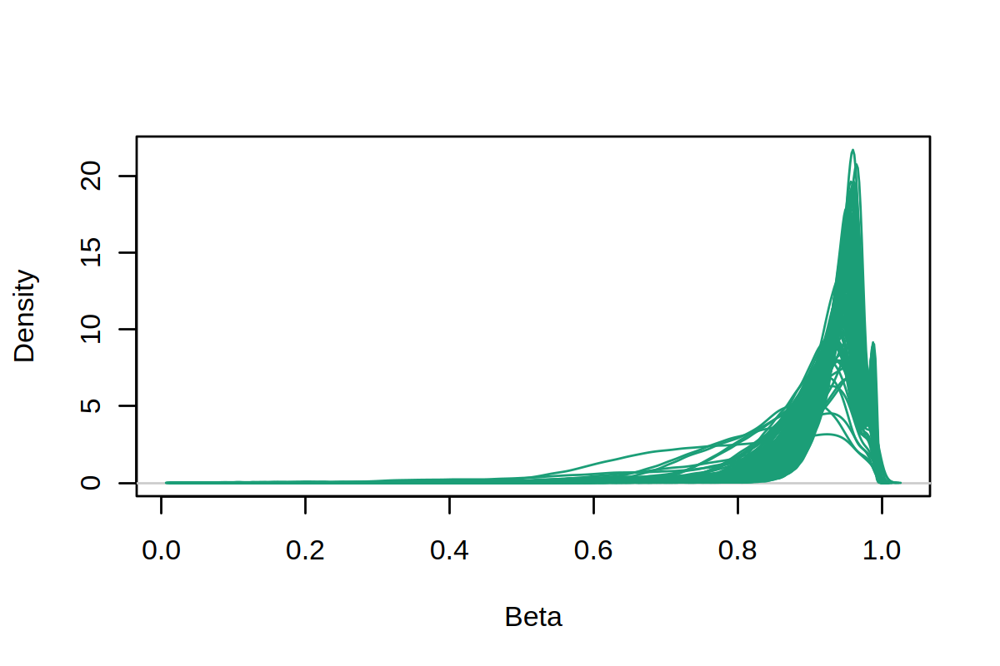

In [98]:
densityPlot(as.matrix(tcga_met_assay[top_probes, ]))

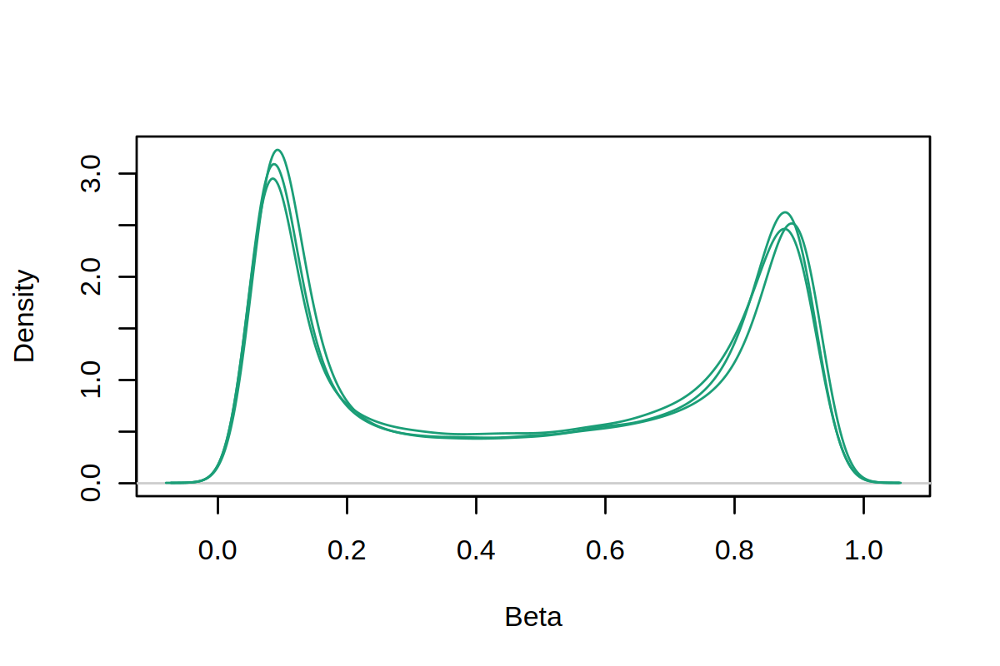

In [102]:
options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 200)
plotdat1 = plotdat[sub("_.*", '', rownames(plotdat)) %in% top_probes_sel, 1:3]
densityPlot(plotdat1)


In [ ]:
options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 200)
plotdat1 = plotdat[sub("_.*", '', rownames(plotdat)) %in% top_probes_sel, ]
plotdat2 = plotdat[sub("_.*", '', rownames(plotdat)) %in% int_probes_sel, ]
plotdat3 = plotdat[sub("_.*", '', rownames(plotdat)) %in% bot_probes_sel, ]
dim(plotdat1)
dim(plotdat2)
dim(plotdat3)
densityPlot(plotdat1)
densityPlot(plotdat2)
densityPlot(plotdat3)

[1] 149810     39

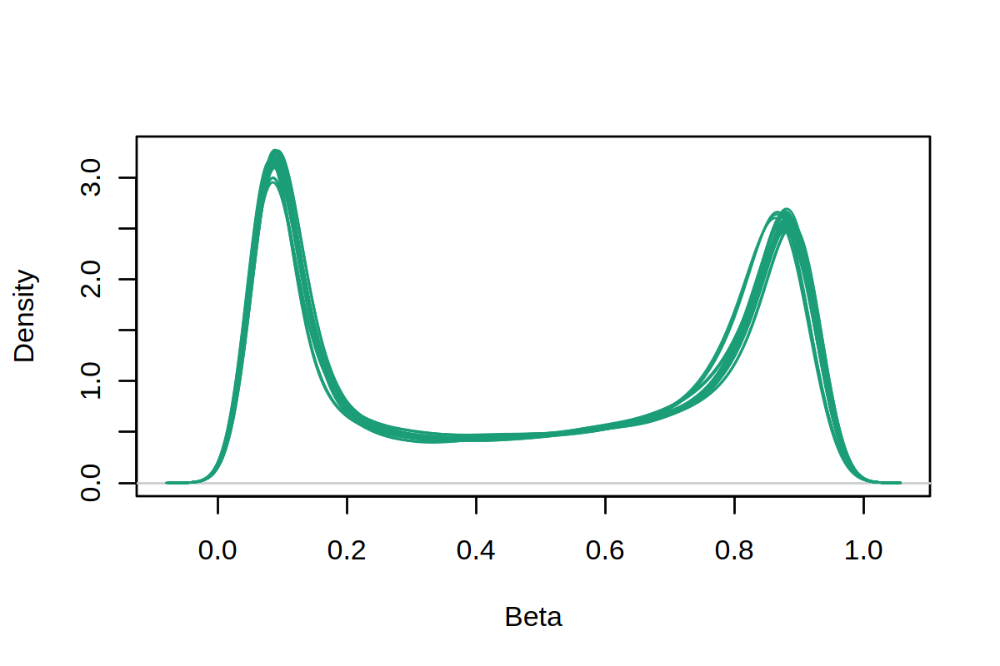

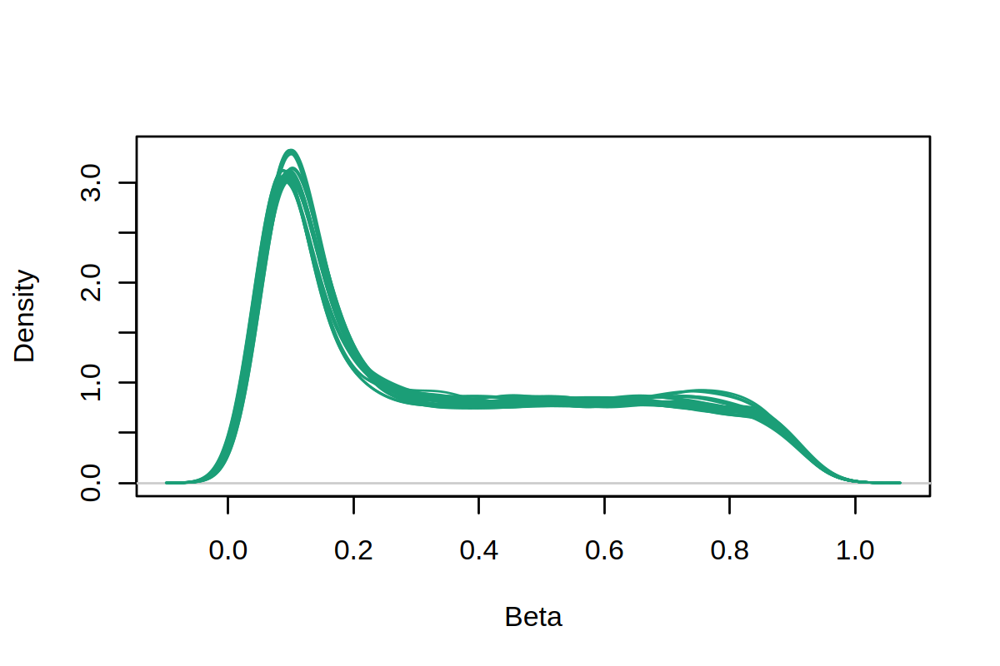

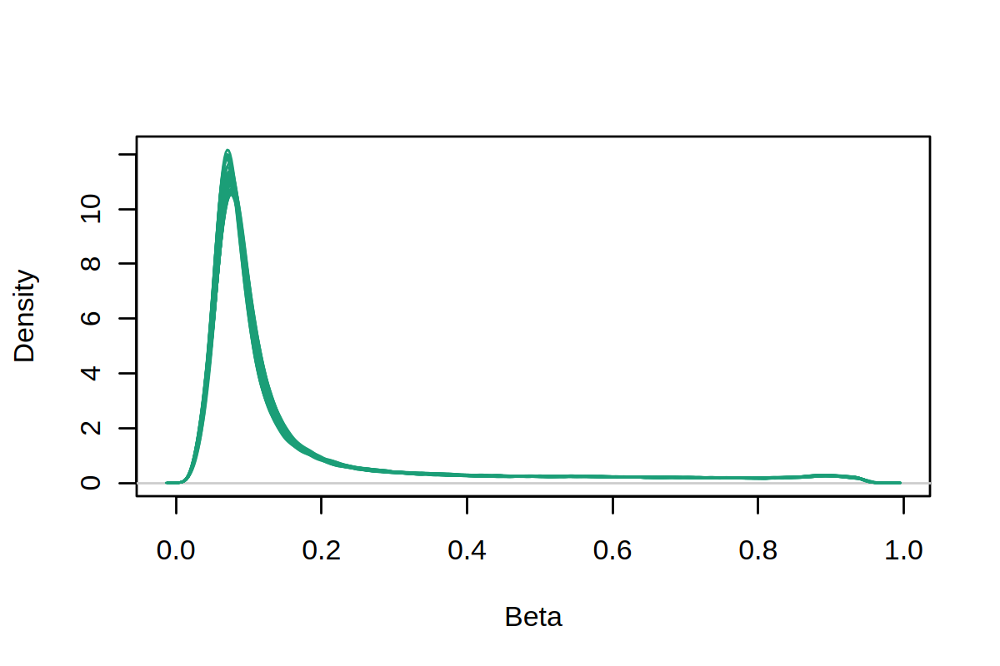

In [101]:
options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 200)
plotdat1 = plotdat[sub("_.*", '', rownames(plotdat)) %in% top_probes_sel, ]
plotdat2 = plotdat[sub("_.*", '', rownames(plotdat)) %in% int_probes_sel, ]
plotdat3 = plotdat[sub("_.*", '', rownames(plotdat)) %in% bot_probes_sel, ]
dim(plotdat1)
dim(plotdat2)
dim(plotdat3)
densityPlot(plotdat1)
densityPlot(plotdat2)
densityPlot(plotdat3)

In [537]:
tcga_probe_mean = as.data.table(as.data.frame(apply(tcga_met_assay, 1, mean)), keep.rownames = T)
plotdat <- getBeta(mSetSq[, targets_sel$sample_name])
k562_probe_mean = as.data.table(as.data.frame(apply(plotdat, 1, mean)), keep.rownames = T)
setnames(tcga_probe_mean, 2, 'tcga')
setnames(k562_probe_mean, 2, 'k562')
plotdat = merge(tcga_probe_mean, k562_probe_mean, by = 'rn') 
head(plotdat)


rn,tcga,k562
<chr>,<dbl>,<dbl>
cg00000957,0.92552323,0.3595625
cg00001809,0.81887881,0.2750107
cg00002660,0.04638070,0.2909109
cg00002930,0.06238191,0.8871084
cg00003784,0.03034927,0.3477538
cg00004207,0.09897406,0.8383632


In [520]:
head(int_probes)

[1] "cg06324192" "cg23207077" "cg15489799" "cg07119157" "cg17970390" "cg17132079"

In [521]:
head(plotdat)
dim(plotdat)

,208356090086_R01C01,208356090086_R02C01,208356090086_R03C01,208356090086_R04C01,208356090086_R05C01,208356090086_R06C01,208356090086_R07C01,208356090086_R08C01,208356090115_R01C01,208356090115_R02C01,⋯,208356090131_R06C01,208356090131_R07C01,208356090131_R08C01,208375650084_R01C01,208375650084_R02C01,208375650084_R03C01,208375650084_R04C01,208375650084_R05C01,208375650084_R06C01,208375650084_R07C01
cg14817997,0.58053995,0.5952878,0.50323842,0.66416312,0.53722827,0.62309217,0.63468141,0.65820076,0.47761091,0.5392100,⋯,0.63504997,0.54451492,0.59413290,0.63010808,0.61269119,0.48159658,0.5495567,0.53285477,0.49907257,0.53608139
cg01803908,0.86325423,0.8956900,0.87571791,0.89498250,0.88815169,0.86620425,0.90504706,0.87884102,0.90000071,0.8911727,⋯,0.90474320,0.88176206,0.88605282,0.90179195,0.90420110,0.90285151,0.8634666,0.88504272,0.87434294,0.90500028
cg15174812,0.86659176,0.8771695,0.86539567,0.85225935,0.87767454,0.84575556,0.90106191,0.89181173,0.90188623,0.8826851,⋯,0.87023968,0.88720453,0.84911678,0.87970958,0.88056934,0.86696803,0.8752262,0.85271432,0.87932162,0.89215182
cg05001044,0.16046240,0.1473014,0.18007322,0.13858528,0.13229634,0.13202773,0.12977363,0.14078286,0.14253078,0.1209620,⋯,0.14692757,0.11881978,0.12351765,0.13340829,0.11481840,0.14622374,0.1373881,0.13584319,0.11779043,0.15379330
cg17501828,0.07783401,0.1052236,0.07784738,0.08158618,0.08666302,0.07325923,0.07223814,0.08268699,0.08810865,0.0877876,⋯,0.08174426,0.08074092,0.07976716,0.07520276,0.06863003,0.08309484,0.0838547,0.08777394,0.08459277,0.05579347
cg23917638,0.38785684,0.5251219,0.28789861,0.46269120,0.30828086,0.55525873,0.50318518,0.53431178,0.35398201,0.4141032,⋯,0.36257802,0.43906511,0.50515561,0.41664298,0.20552815,0.48683761,0.2805929,0.44841541,0.29086229,0.35515914


[1] 125373     39

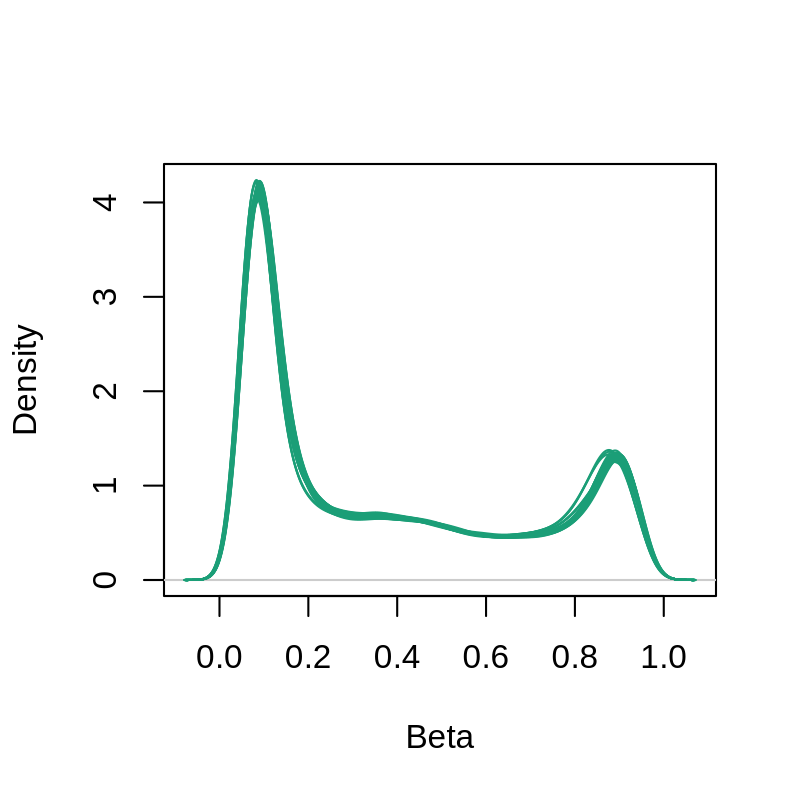

In [526]:
densityPlot(plotdat)

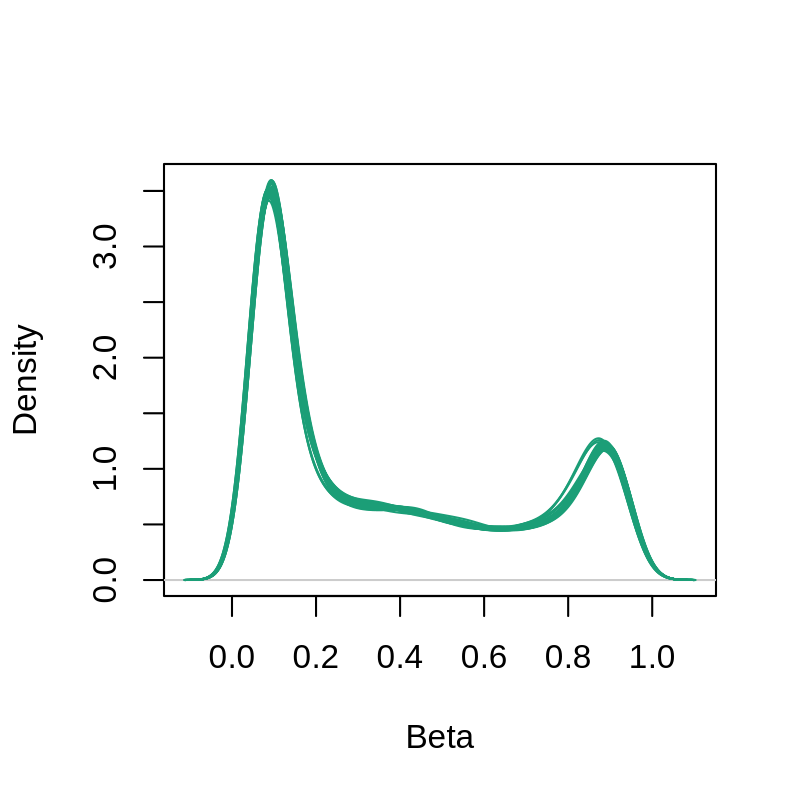

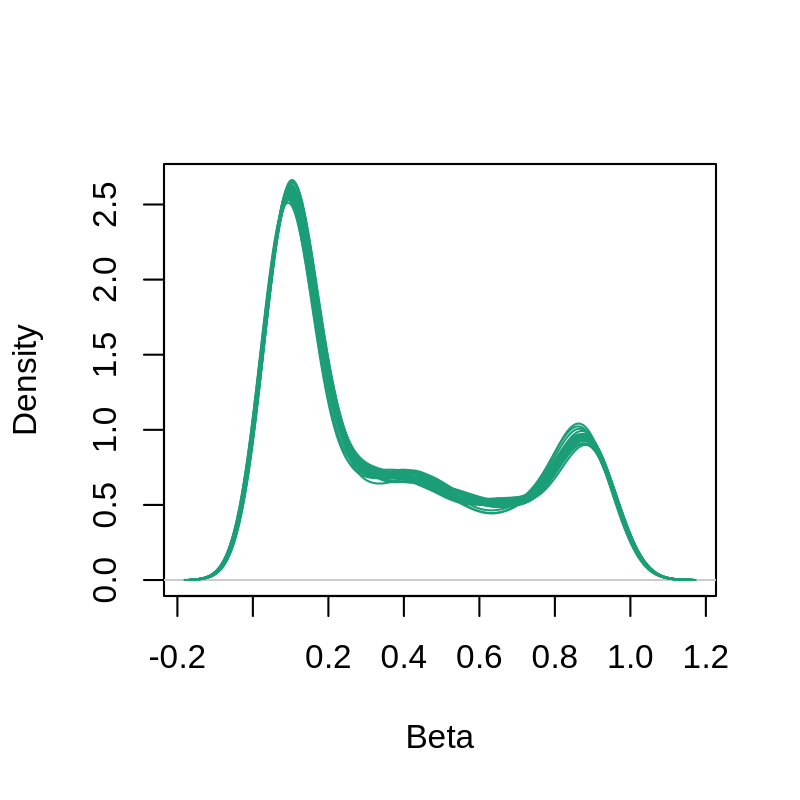

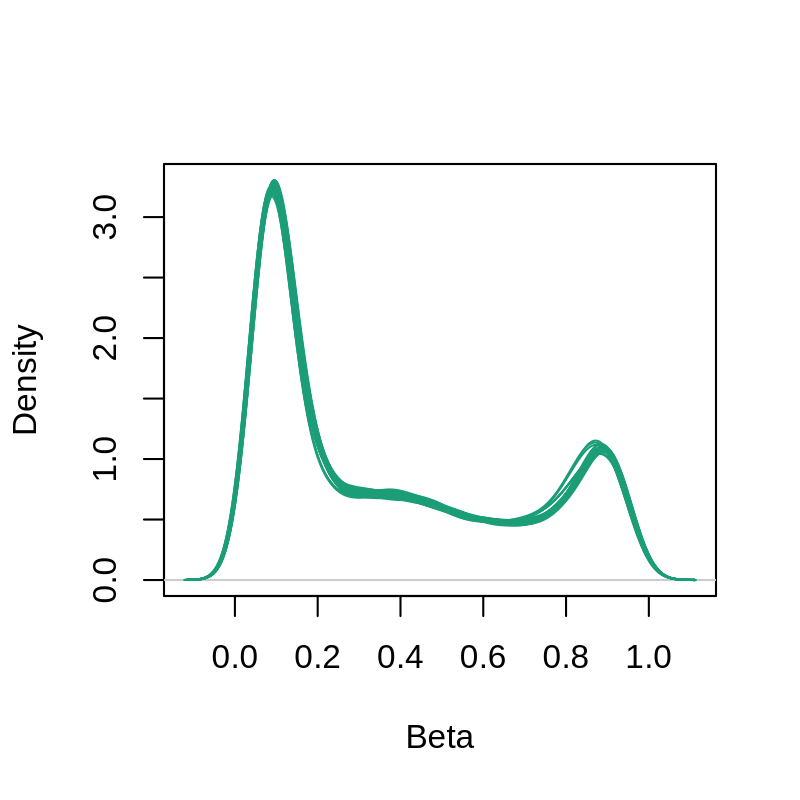

In [522]:
options(repr.plot.width = 4, repr.plot.height = 4, repr.plot.res = 200)
densityPlot(plotdat[top_probes, ])
densityPlot(plotdat[int_probes, ])
densityPlot(plotdat[bot_probes, ])

# filter data

In [110]:
rgSet

class: RGChannelSet 
dim: 1105209 39 
metadata(0):
assays(2): Green Red
rownames(1105209): 1600157 1600179 ... 99810982 99810990
rowData names(0):
colnames(39): 208356090086_R01C01 208356090086_R02C01 ...
  208375650084_R06C01 208375650084_R07C01
colData names(0):
Annotation
  array: IlluminaHumanMethylationEPICv2
  annotation: 20a1.hg38

In [107]:
detP <- detectionP(rgSet)
detP <- detP[match(featureNames(rgSet),rownames(detP)),] 


< table of extent 0 >

In [109]:
head(detP)

,208356090086_R01C01,208356090086_R02C01,208356090086_R03C01,208356090086_R04C01,208356090086_R05C01,208356090086_R06C01,208356090086_R07C01,208356090086_R08C01,208356090115_R01C01,208356090115_R02C01,⋯,208356090131_R06C01,208356090131_R07C01,208356090131_R08C01,208375650084_R01C01,208375650084_R02C01,208375650084_R03C01,208375650084_R04C01,208375650084_R05C01,208375650084_R06C01,208375650084_R07C01
NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA


In [108]:
# remove any probes that have failed in one or more samples
keep <- rowSums(detP < 0.01) > .5 * ncol(mSetSq) 
table(keep)

< table of extent 0 >

In [86]:
mSetSqFlt <- mSetSq[keep,]
mSetSqFlt


class: GenomicRatioSet 
dim: 115021 42 
metadata(0):
assays(2): M CN
rownames(115021): cg14817997 cg01803908 ... cg02600718 cg09748881
rowData names(0):
colnames(42): 208356090086_R01C01 208356090086_R02C01 ...
  208375650102_R07C01 208375650102_R08C01
colData names(3): xMed yMed predictedSex
Annotation
  array: IlluminaHumanMethylationEPIC
  annotation: ilm10b5.hg38
Preprocessing
  Method: Raw (no normalization or bg correction)
  minfi version: 1.48.0
  Manifest version: 1.0.0

In [ ]:
#keep <- !(featureNames(mSetSqFlt) %in% ann450k$Name[ann450k$chr %in%  c("chrX","chrY")])
#table(keep)
#mSetSqFlt <- mSetSqFlt[keep,]


In [87]:
mSetSqFlt <- dropLociWithSnps(mSetSqFlt)
mSetSqFlt


class: GenomicRatioSet 
dim: 114003 42 
metadata(0):
assays(2): M CN
rownames(114003): cg14817997 cg01803908 ... cg02600718 cg09748881
rowData names(0):
colnames(42): 208356090086_R01C01 208356090086_R02C01 ...
  208375650102_R07C01 208375650102_R08C01
colData names(3): xMed yMed predictedSex
Annotation
  array: IlluminaHumanMethylationEPIC
  annotation: ilm10b5.hg38
Preprocessing
  Method: Raw (no normalization or bg correction)
  minfi version: 1.48.0
  Manifest version: 1.0.0

In [69]:
class(rgSet)

[1] "RGChannelSet"
attr(,"package")
[1] "minfi"

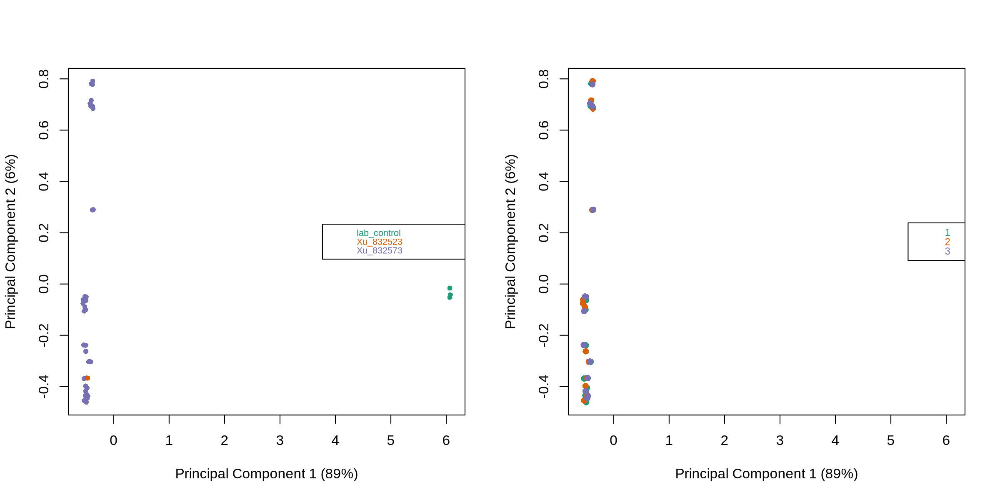

In [88]:
options(repr.plot.width = 12, repr.plot.height = 6, repr.plot.res = 200)

par(mfrow=c(1,2))
plotMDS(getM(mSetSqFlt), top=1000, pch = 16, gene.selection="common",  col=pal[factor(targets$Sample_Group)], cex=0.8)
legend("right", legend=levels(factor(targets$Sample_Group)), text.col=pal, cex=0.65, bg="white")

plotMDS(getM(mSetSqFlt), top=1000, pch = 16, gene.selection="common",  col=pal[factor(targets$replication)])
legend("right", legend=levels(factor(targets$replication)), text.col=pal, cex=0.7, bg="white")


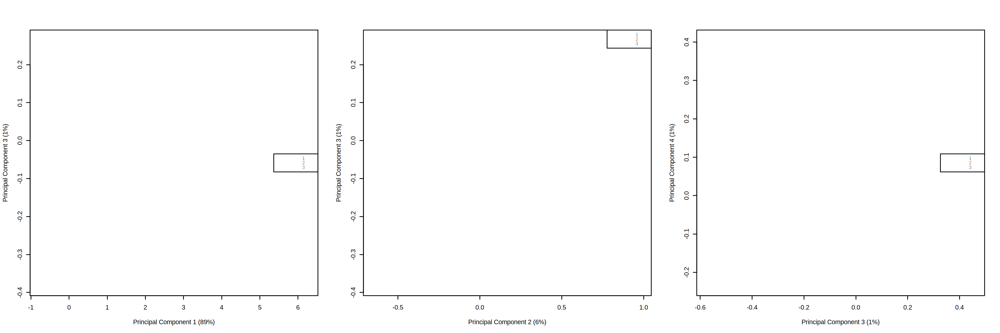

In [104]:
options(repr.plot.width = 18, repr.plot.height = 6, repr.plot.res = 200)

par(mfrow=c(1,3))
# Examine higher dimensions to look at other sources of variation
plotMDS(getM(mSetSqFlt), top=1000, gene.selection="common",  col=pal[factor(targets$Sample_Source)], dim=c(1,3))
legend("right", legend=levels(factor(targets$replication)), text.col=pal, cex=0.7, bg="white")

plotMDS(getM(mSetSqFlt), top=1000, gene.selection="common",  col=pal[factor(targets$Sample_Source)], dim=c(2,3))
legend("topright", legend=levels(factor(targets$replication)), text.col=pal, cex=0.7, bg="white")

plotMDS(getM(mSetSqFlt), top=1000, gene.selection="common",  col=pal[factor(targets$Sample_Source)], dim=c(3,4))
legend("right", legend=levels(factor(targets$replication)), text.col=pal, cex=0.7, bg="white")


In [113]:
mVals <- getM(mSetSq)
head(mVals[,1:5])


,208356090086_R01C01,208356090086_R02C01,208356090086_R03C01,208356090086_R04C01,208356090086_R05C01
cg00381604_BC11,-3.47235600,-3.32939725,-3.4841030,-3.839616870,-4.12811954
cg21870274_BC21,0.07926122,0.42550281,0.5797056,0.023459814,0.03387918
cg00002271_BC21,0.89110046,1.23011728,1.0661012,1.061359142,0.80747609
cg08058514_BC21,0.11021858,0.29454619,0.3793218,0.755446409,0.73827228
cg00004581_TC21,0.20982121,-0.01369059,0.0157430,0.007599787,0.02627791
cg09261435_BC21,-2.90940685,-2.30697856,-2.7201790,-2.561270140,-2.71785713


In [114]:
bVals <- getBeta(mSetSq)
head(bVals[,1:5])


,208356090086_R01C01,208356090086_R02C01,208356090086_R03C01,208356090086_R04C01,208356090086_R05C01
cg00381604_BC11,0.08265155,0.09048213,0.08203629,0.06528865,0.05409531
cg21870274_BC21,0.51373147,0.57320413,0.59912517,0.50406519,0.50587055
cg00002271_BC21,0.64968702,0.70112323,0.67676949,0.67605005,0.63638307
cg08058514_BC21,0.51909014,0.55086441,0.56535540,0.62799749,0.62521225
cg00004581_TC21,0.53629529,0.49762762,0.50272803,0.50131694,0.50455349
cg09261435_BC21,0.11746613,0.16811084,0.13176020,0.14487985,0.13194442


In [385]:
dim(bVals)

[1] 114003     42

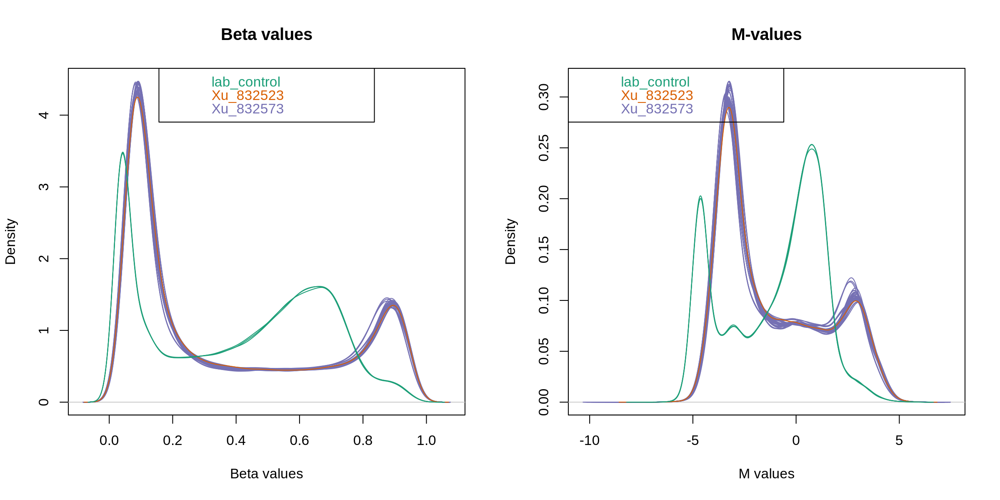

In [121]:
options(repr.plot.width = 12, repr.plot.height = 6, repr.plot.res = 200)

par(mfrow=c(1,2))
densityPlot(bVals, sampGroups=targets$Sample_Group, main="Beta values",  legend=FALSE, xlab="Beta values")
legend("top", legend = levels(factor(targets$Sample_Group)),  text.col=brewer.pal(8,"Dark2"))
densityPlot(mVals, sampGroups=targets$Sample_Group, main="M-values",  legend=FALSE, xlab="M values")
legend("topleft", legend = levels(factor(targets$Sample_Group)),  text.col=brewer.pal(8,"Dark2"))


# probe groups

In [113]:
# this will re-group the probes based on K562 cells. 
# then cross validate these probes with TCGA probes
# make sure these probes are mostly consistent with the TCGA methylation datasets


In [99]:
targets_sel = targets[!is.na(genotype), ]
dim(targets_sel) 


[1] 39 12

In [103]:
# only use the wt k562 results to separate probe groups
bVals <- getBeta(mSetSq) 
bval_sel = bVals[, targets_sel$genotype == 'WT'] 
head(bval_sel) 
dim(bval_sel) 

# how many probes main at low, intermediate and high levels
met_assay = bval_sel
lvl_assay = copy(met_assay)
lvl_assay[,] = F

row_names = rownames(met_assay) 
for(ii in 1:ncol(met_assay)){
    lvl_assay[, ii] = met_assay[, ii] < .2 | is.na(met_assay[, ii])
}

bot_probes_k562 = row_names[rowSums(lvl_assay) > ncol(lvl_assay) * .8]

# how many probes main at low, intermediate and high levels
lvl_assay = copy(met_assay)
lvl_assay[,] = F

row_names = rownames(met_assay) 
for(ii in 1:ncol(met_assay)){
    lvl_assay[, ii] = met_assay[, ii] > .8 | is.na(met_assay[, ii])
}

top_probes_k562 = row_names[rowSums(lvl_assay) > ncol(lvl_assay) * .8]

# how many probes main at low, intermediate and high levels
lvl_assay = copy(met_assay)
lvl_assay[,] = F

row_names = rownames(met_assay) 
for(ii in 1:ncol(met_assay)){
    lvl_assay[, ii] = (met_assay[, ii] < .8 & met_assay[, ii] > .2) | is.na(met_assay[, ii])
}

int_probes_k562 = row_names[rowSums(lvl_assay) > ncol(lvl_assay) * .8]


,208356090086_R01C01,208356090115_R06C01,208356090131_R03C01
cg00381604_BC11,0.08265155,0.07501826,0.0801665
cg21870274_BC21,0.51373147,0.49527593,0.5413950
cg00002271_BC21,0.64968702,0.64852630,0.6438758
cg08058514_BC21,0.51909014,0.57284388,0.4434366
cg00004581_TC21,0.53629529,0.54180463,0.5522135
cg09261435_BC21,0.11746613,0.11655048,0.1180789


[1] 930075      3

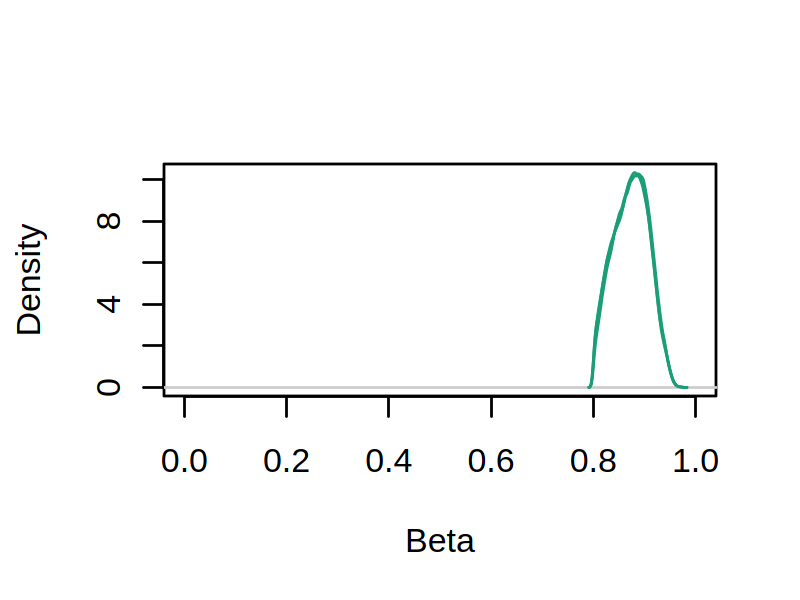

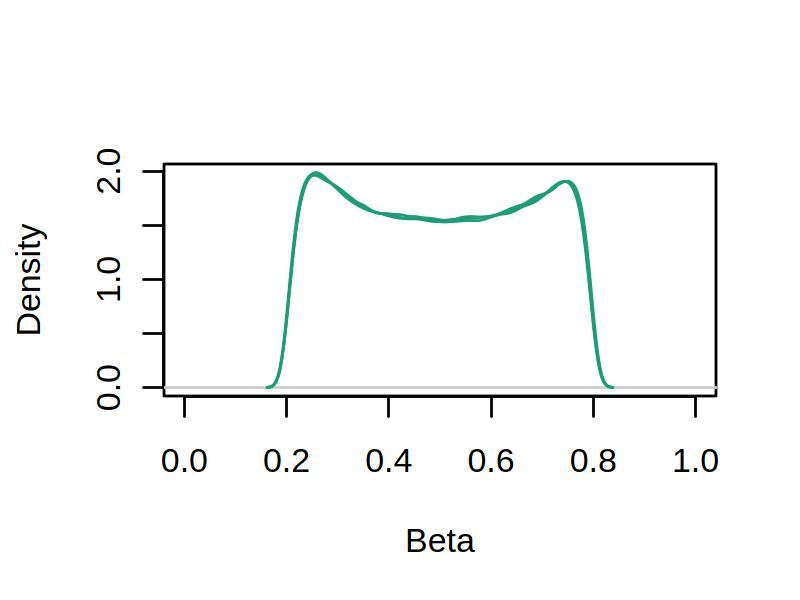

logical(0)

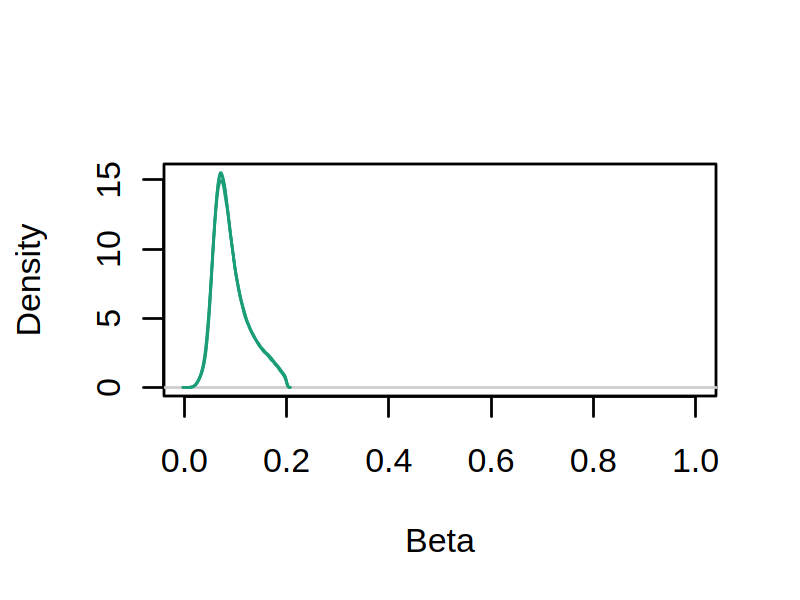

In [126]:
# test k562 probe groups
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 200)

densityPlot(as.matrix(bval_sel[top_probes_k562, ]), xlim = c(0, 1)) | 
densityPlot(as.matrix(bval_sel[int_probes_k562, ]), xlim = c(0, 1)) |
densityPlot(as.matrix(bval_sel[bot_probes_k562, ]), xlim = c(0, 1))

In [129]:
# overlapped with TCGa probe groups
length(int_probes)
length(int_probes_k562)
length(intersect(int_probes, sub('_.*', '', int_probes_k562)))

length(top_probes)
length(top_probes_k562)
length(intersect(top_probes, sub('_.*', '', top_probes_k562)))

length(bot_probes)
length(bot_probes_k562)
length(intersect(bot_probes, sub('_.*', '', bot_probes_k562)))

[1] 12834

[1] 297508

[1] 5893

[1] 159714

[1] 130338

[1] 41851

[1] 133637

[1] 455301

[1] 94794

In [104]:
# select the probes that were in the same group in both k562 and tcga datasets
int_probes_sel = intersect(int_probes, sub('_.*', '', int_probes_k562))
top_probes_sel = intersect(top_probes, sub('_.*', '', top_probes_k562))
bot_probes_sel = intersect(bot_probes, sub('_.*', '', bot_probes_k562))

int_probes_k562_sel = int_probes_k562[sub('_.*', '', int_probes_k562) %in% int_probes_sel]
top_probes_k562_sel = top_probes_k562[sub('_.*', '', top_probes_k562) %in% top_probes_sel]
bot_probes_k562_sel = bot_probes_k562[sub('_.*', '', bot_probes_k562) %in% bot_probes_sel]

length(int_probes_sel)
length(int_probes_k562_sel)

[1] 5893

[1] 5923

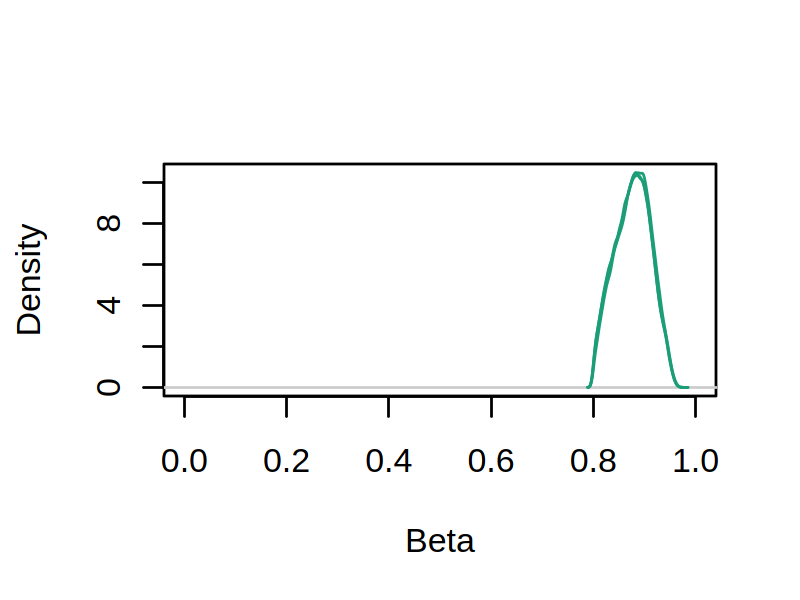

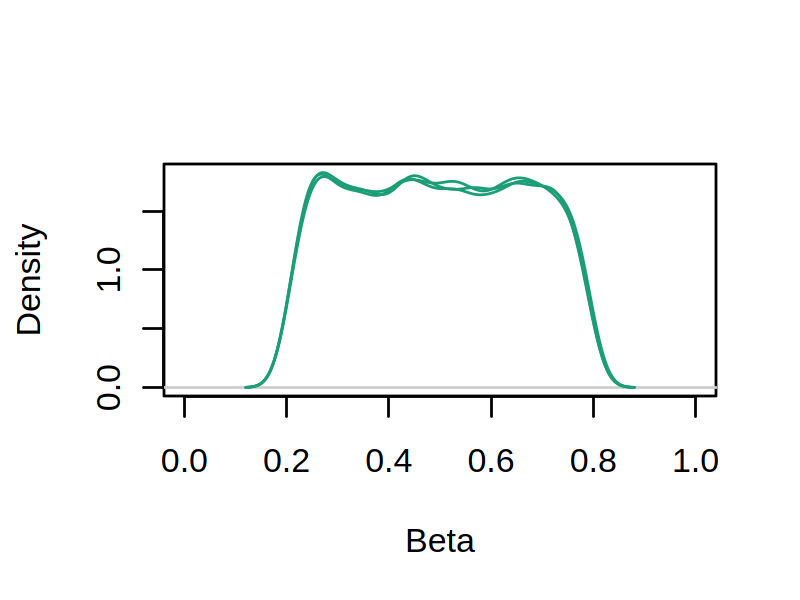

logical(0)

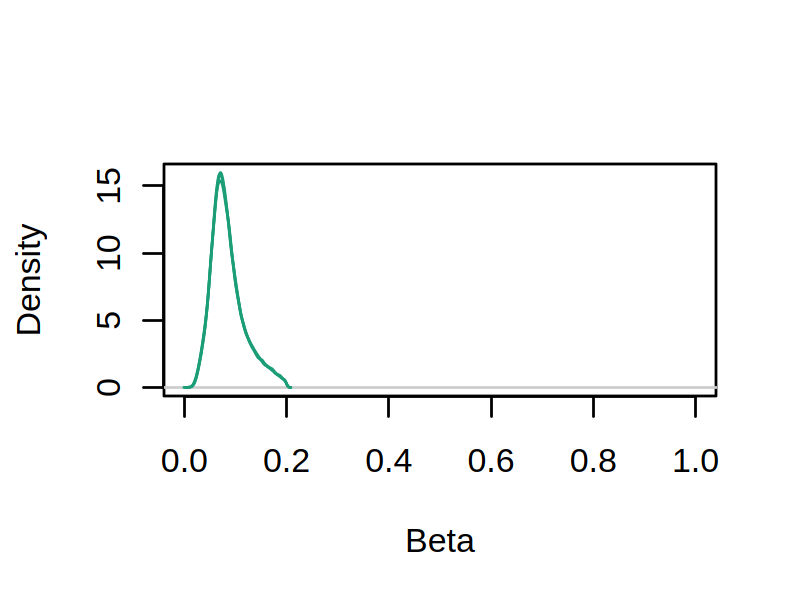

In [131]:
# test k562 probe groups
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 200)

densityPlot(as.matrix(bval_sel[top_probes_k562_sel, ]), xlim = c(0, 1)) | 
densityPlot(as.matrix(bval_sel[int_probes_k562_sel, ]), xlim = c(0, 1)) |
densityPlot(as.matrix(bval_sel[bot_probes_k562_sel, ]), xlim = c(0, 1))

In [193]:
length(top_probes_k562_sel)
length(int_probes_k562_sel)
length(bot_probes_k562_sel)


[1] 42404

[1] 5923

[1] 95238

In [ ]:
# how these probe groups changed with BCAT1 KO
# go to next section: Probe-wise differential methylation


In [423]:
ov = intersect(int_probes, gpl_set$Name)
length(ov)


[1] 23901

In [425]:
int_probe_dt = gpl_set[Name %in% int_probes, ] 
int_probe_dt[, symbol := sub(';.*', '', UCSC_RefGene_Name) ]
datatable(head(int_probe_dt))

HTML widgets cannot be represented in plain text (need html)

In [432]:
int_probe_dt[, chr := CHR ]
int_probe_dt[, start := MAPINFO ]
int_probe_dt[, end :=  start + 1]
dim(int_probe_dt[, .(Name, chr, start, end, symbol)])
head(int_probe_dt[, .(Name, chr, start, end, symbol)])


[1] 48114     5

Name,chr,start,end,symbol
<chr>,<chr>,<int>,<dbl>,<chr>
cg15742605,chr1,944003,944004,SAMD11
cg15309223,chr1,54053418,54053419,TMEM59
cg01856141,chr3,52770928,52770929,NEK4
cg00031165,chr7,87629044,87629045,RUNDC3B
cg13389502,chr17,2058146,2058147,HIC1
cg24000218,chrX,19122816,19122817,ADGRG2


In [443]:
gpl_set[, symbol := sub(';.*', '', UCSC_RefGene_Name) ]
length(unique(gpl_set[Name %in% int_probes, symbol] )) 
length(unique(gpl_set[Name %in% top_probes, symbol] )) 
length(unique(gpl_set[Name %in% bot_probes, symbol] )) 


[1] 6829

[1] 4548

[1] 10573

In [ ]:
length(intersect(deg_dt[.id == 'KO__WT' & log2FoldChange> 0 & padj < 0.1, rn], gpl_set[Name %in% int_probes, symbol]) )
length(intersect(deg_dt[.id == 'KO__WT' & log2FoldChange> 0 & padj < 0.1, rn], gpl_set[Name %in% top_probes, symbol]) )
length(intersect(deg_dt[.id == 'KO__WT' & log2FoldChange> 0 & padj < 0.1, rn], gpl_set[Name %in% bot_probes, symbol]) )


In [434]:
upset_df = readRDS(file = '~/a.rds')
head(upset_df) 


,promoter,enhancer,bcat1_KO_dn,bcat1_KO_up
,<dbl>,<dbl>,<dbl>,<dbl>
SAMD11,1,0,1,0
KLHL17,1,0,0,0
MIR200B,1,0,0,0
CPTP,1,0,0,0
AURKAIP1,1,0,0,0
TMEM88B,1,0,0,0


In [436]:
length(unique(int_probe_dt$symbol))
dim(int_probe_dt[symbol %in% rownames(upset_df), ])


[1] 6829

[1] 4640   53

In [402]:
probe_dt = as.data.table(IlluminaHumanMethylation450kprobe[int_probes, ])
head2(probe_dt) 


# Probe-wise differential methylation analysis

In [376]:
table(dsn_hsa_rna$genotype)



        DKO      DKO_B1 DKO_B1K222A     DKO_B1M  DKO_B1SxxS          KO          WT 
          6           6           6           6           6           6           3 

In [105]:
targets = targets[Sample_Name != 'JXUgrp_BCAT_8-5-24_3173826__methylepicv2', ]
#targets[genotype == 'BCAT1/2 KO + BCAT1_SXXS', genotype := 'DKO_B1SXXS']

In [106]:
targets[grep('^WT', Sample_Name), genotype   := 'WT' ]
targets[grep('C3', Sample_Name), genotype    := 'KO' ]
targets[grep('C11', Sample_Name), genotype   := 'KO' ]
targets[grep('A9', Sample_Name), genotype    := 'DKO' ]
targets[grep('A9-B1', Sample_Name), genotype := 'DKO_B1' ]
targets[grep('A23', Sample_Name), genotype   := 'DKO' ]
targets[grep('A23-B1', Sample_Name), genotype:= 'DKO_B1' ]
targets[grep('K222A', Sample_Name), genotype := 'DKO_B1K222A' ]
targets[grep('SXXS', Sample_Name), genotype  := 'DKO_B1SXXS' ]
targets[grep('B1M', Sample_Name), genotype   := 'DKO_B1M' ]


In [10]:
targets[, clone := 'cloneWT']
targets[grep('A23', Sample_Name), clone := 'cloneA23' ]
targets[grep('A9', Sample_Name),  clone := 'cloneA9' ]
targets[grep('C11', Sample_Name), clone := 'cloneC11' ]
targets[grep('C3', Sample_Name),  clone := 'cloneC3' ]
table(targets$clone)


cloneA23  cloneA9 cloneC11  cloneC3  cloneWT 
      14       15        3        3        3 

In [11]:
targets[, group2 := paste0(clone, '_', genotype) ]

In [378]:
datatable(targets[, .(Sample_Name, genotype, group2)])


HTML widgets cannot be represented in plain text (need html)

In [379]:
datatable(targets[grep('SXXS', genotype), .(Sample_Name, clone, genotype)])


HTML widgets cannot be represented in plain text (need html)

In [380]:
table(targets$genotype, targets$clone)


             
              cloneA23 cloneA9 cloneC11 cloneC3 cloneWT
  DKO                3       3        0       0       0
  DKO_B1             3       3        0       0       0
  DKO_B1K222A        3       3        0       0       0
  DKO_B1M            3       3        0       0       0
  DKO_B1SXXS         2       3        0       0       0
  KO                 0       0        3       3       0
  WT                 0       0        0       0       3

In [381]:
dim(targets)

[1] 38 13

In [382]:
targets2 = copy(targets) 


In [155]:
options(width = 166)

In [383]:
table(targets2$group2)



        cloneA23_DKO      cloneA23_DKO_B1 cloneA23_DKO_B1K222A     cloneA23_DKO_B1M  cloneA23_DKO_B1SXXS          cloneA9_DKO       cloneA9_DKO_B1 
                   3                    3                    3                    3                    2                    3                    3 
 cloneA9_DKO_B1K222A      cloneA9_DKO_B1M   cloneA9_DKO_B1SXXS          cloneC11_KO           cloneC3_KO           cloneWT_WT 
                   3                    3                    3                    3                    3                    3 

In [111]:
design = model.matrix(~0+genotype, data=targets)
dim(design)
colnames(design) = gsub('genotype', '', colnames(design)) 
head(design)


[1] 38  7

,DKO,DKO_B1,DKO_B1K222A,DKO_B1M,DKO_B1SXXS,KO,WT
1,0,0,0,0,0,0,1
2,0,0,0,0,0,1,0
3,0,0,0,0,0,1,0
4,1,0,0,0,0,0,0
5,0,1,0,0,0,0,0
6,0,0,0,1,0,0,0


In [116]:
mVals2 = mVals[, targets2$sample_name]
bVals2 = bVals[, targets2$sample_name]


In [162]:
contMatrix <- makeContrasts(KO__WT = KO - WT, 
                            KO__DKO = KO - DKO, 
                            DKO__WT = DKO - WT, 
                            DKO_B1__DKO = DKO_B1 - DKO, 
                            DKO_B1M__DKO = DKO_B1M - DKO, 
                            DKO_B1K222A__DKO = DKO_B1K222A - DKO, 
                            DKO_B1SXXS__DKO = DKO_B1SXXS - DKO, 
                            DKO_B1__WT = DKO_B1 - WT, 
                            DKO_B1M__WT = DKO_B1M - WT, 
                            DKO_B1K222A__WT = DKO_B1K222A - WT, 
                            DKO_B1SXXS__WT = DKO_B1SXXS - WT, 
                            levels=design)


In [163]:
fit <- lmFit(mVals2, design)
fit2 <- contrasts.fit(fit, contMatrix)
fit2 <- eBayes(fit2)

# look at the numbers of DM CpGs at FDR < 0.05
summary(decideTests(fit2))


       KO__WT KO__DKO DKO__WT DKO_B1__DKO DKO_B1M__DKO DKO_B1K222A__DKO DKO_B1SXXS__DKO DKO_B1__WT DKO_B1M__WT DKO_B1K222A__WT DKO_B1SXXS__WT
Down    71444   42951   56561      128551        98167             1482            1809     139371       87473           55039          52885
NotSig 801512  842929  835895      693894       729386           917526          918757     661664      757401          826165         832601
Up      57119   44195   37619      107630       102522            11067            9509     129040       85201           48871          44589

In [ ]:
fit <- lmFit(mVals2, design)
fit2 <- contrasts.fit(fit, contMatrix)
fit2 <- eBayes(fit2)


In [165]:
dmp_list = lapply(1:11, function(ii){as.data.table(topTable(fit2, num=Inf, coef=ii), keep.rownames = T)}) 
names(dmp_list) = colnames(contMatrix) 
hsa_dmp_dt = rbindlist(dmp_list, idcol = T)
dim(hsa_dmp_dt) 
head(hsa_dmp_dt) 


[1] 10230825        8

.id,rn,logFC,AveExpr,t,P.Value,adj.P.Val,B
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
KO__WT,cg26524256_TC11,-3.377215,-0.8469927,-31.35870,4.764440e-27,4.431286e-21,48.64726
KO__WT,cg15701979_BC21,2.572078,-0.4105545,28.75086,8.690863e-26,4.041577e-20,46.34768
KO__WT,cg07235511_BC21,-3.523661,-2.7785288,-28.17089,1.713389e-25,5.311934e-20,45.79775
KO__WT,cg14648688_TC21,-2.595118,-2.8165511,-27.66353,3.135804e-25,7.291332e-20,45.30430
KO__WT,cg18477666_TC21,-2.066124,-2.4339522,-26.92760,7.674296e-25,1.427534e-19,44.56727
KO__WT,cg17763682_BC21,-3.438624,-3.1611567,-26.77115,9.309292e-25,1.443057e-19,44.40725


In [128]:
hsa_dmp_dt[rn %in% top_probes_k562_sel, probe_grp := 'top' ]
hsa_dmp_dt[rn %in% int_probes_k562_sel, probe_grp := 'int' ]
hsa_dmp_dt[rn %in% bot_probes_k562_sel, probe_grp := 'bot' ]

hsa_dmp_dt[SPOT_ID %in% top_probes_k562, probe_grp2 := 'top' ]
hsa_dmp_dt[SPOT_ID %in% int_probes_k562, probe_grp2 := 'int' ]
hsa_dmp_dt[SPOT_ID %in% bot_probes_k562, probe_grp2 := 'bot' ]

In [126]:
head(hsa_dmp_dt)

rn,.id,logFC,AveExpr,t,P.Value,adj.P.Val,B,ID,SPOT_ID,⋯,Methyl27_Loci,EPICv1_Loci,Manifest_probe_match,SNP_ID,SNP_DISTANCE,SNP_MinorAlleleFrequency,name,updn,probe_grp,probe_grp2
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<fct>,<chr>,<chr>
cg11418112,DKO__KO,-3.287126,-1.78329326,-40.82326,8.400113e-32,9.576381e-27,55.29182,cg11418112_TC21,cg11418112_TC21,⋯,,cg11418112,TRUE,rs1039214762;rs1057303439;rs113864012;rs1243693977;rs1254753237;rs1436793199;rs1481449611;rs527493974;rs768879058;rs888184317;rs900632836;rs994964088,20;6;12;34;45;10;29;9;44;48;23;39,0;0;0.004;0;0;0;0;0.004;0;0;0;0,dmp_name_558792,dn,NA,NA
cg16634661,DKO_BCAT1K222A__DKO,-4.789178,0.04008265,-37.23801,2.149478e-30,2.450470e-25,48.95547,cg16634661_BC21,cg16634661_BC21,⋯,,cg16634661,TRUE,rs1018056446;rs1256452865;rs1481974086;rs575008128;rs61783061;rs760877755;rs941224101;rs957082965,1;6;28;23;29;36;21;1,0;0;0;0;0.020;0;0;0,dmp_name_805140,dn,NA,NA
cg16634661,DKO_BCAT1SXXS__DKO,-4.713494,0.04008265,-36.64953,3.764597e-30,4.291754e-25,48.56911,cg16634661_BC21,cg16634661_BC21,⋯,,cg16634661,TRUE,rs1018056446;rs1256452865;rs1481974086;rs575008128;rs61783061;rs760877755;rs941224101;rs957082965,1;6;28;23;29;36;21;1,0;0;0;0;0.020;0;0;0,dmp_name_805141,dn,NA,NA
cg21833338,DKO_BCAT1__DKO,3.221634,-1.00634146,32.38304,2.880943e-28,3.284361e-23,52.75194,cg21833338_TC21,cg21833338_TC21,⋯,,cg21833338,FALSE,rs1003863856;rs1014807102;rs1023444483;rs1023871831;rs1171470399;rs1195090995;rs1250538412;rs1365477197;rs1438542286;rs1453608507;rs1454188574;rs1568331318;rs185052609;rs539953099;rs960621782;rs991926739,34;45;2;44;12;1;50;21;46;1;21;39;0;30;40;38,0;0;0;0;0;0;0;0;0;0;0;0;0.008;0;0;0,dmp_name_1017284,up,NA,NA
cg21833338,DKO_BCAT1Mito__DKO,3.201605,-1.00634146,32.18172,3.581691e-28,4.083235e-23,52.11564,cg21833338_TC21,cg21833338_TC21,⋯,,cg21833338,FALSE,rs1003863856;rs1014807102;rs1023444483;rs1023871831;rs1171470399;rs1195090995;rs1250538412;rs1365477197;rs1438542286;rs1453608507;rs1454188574;rs1568331318;rs185052609;rs539953099;rs960621782;rs991926739,34;45;2;44;12;1;50;21;46;1;21;39;0;30;40;38,0;0;0;0;0;0;0;0;0;0;0;0;0.008;0;0;0,dmp_name_1017285,up,NA,NA
cg16634661,DKO_BCAT1K222A__WT,-4.907053,0.04008265,-31.15305,1.111710e-27,1.267383e-22,48.99729,cg16634661_BC21,cg16634661_BC21,⋯,,cg16634661,TRUE,rs1018056446;rs1256452865;rs1481974086;rs575008128;rs61783061;rs760877755;rs941224101;rs957082965,1;6;28;23;29;36;21;1,0;0;0;0;0.020;0;0;0,dmp_name_805144,dn,NA,NA


In [ ]:
hsa_dmp_dt = merge(hsa_dmp_dt, gpl33022_dt[!duplicated(ID), ], by.x = 'rn', by.y = 'ID', all.x = T) 
hsa_dmp_dt[, name := paste0('dmp_name_', 1:nrow(hsa_dmp_dt)) ]
hsa_dmp_dt[, chr := CHR ]
hsa_dmp_dt[, start := MAPINFO ]
hsa_dmp_dt[, end := start + 1 ]
hsa_dmp_dt[, tag := paste0(chr, '_', start, '_', end) ]
hsa_dmp_dt[, ID := rn ]

# Probe_wise differential methylation based on Junhua

In [72]:
table(targets$group2)


        cloneA23_DKO      cloneA23_DKO_B1 cloneA23_DKO_B1K222A 
                   3                    3                    3 
    cloneA23_DKO_B1M  cloneA23_DKO_B1SXXS          cloneA9_DKO 
                   3                    2                    3 
      cloneA9_DKO_B1  cloneA9_DKO_B1K222A      cloneA9_DKO_B1M 
                   3                    3                    3 
  cloneA9_DKO_B1SXXS          cloneC11_KO           cloneC3_KO 
                   3                    3                    3 
          cloneWT_WT 
                   3 

In [ ]:
# cloneA9_DKO_B1 vs cloneA9_DKO  : cloneA9_DKO_B1__cloneA9_DKO
# cloneA23_DKO_B1 vs cloneA23_DKO vs  : cloneA23_DKO_B1__cloneA23_DKO
# cloneA9_DKO_B1M vs cloneA9_DKO_B1 : cloneA9_DKO_B1M__cloneA9_DKO_B1
# cloneA23_DKO_B1M vs cloneA23_DKO_B1 :  cloneA23_DKO_B1M__cloneA23_DKO_B1
# these comparisons all included
#comb[V1 == 'cloneA9_DKO' & V2 == 'cloneA9_DKO_B1', ]
#comb[V1 == 'cloneA23_DKO' & V2 == 'cloneA23_DKO_B1', ]
#comb[V1 == 'cloneA9_DKO' & V2 == 'cloneA9_DKO_B1M', ]
#comb[V1 == 'cloneA23_DKO' & V2 == 'cloneA23_DKO_B1M', ]

In [73]:
design = model.matrix(~0+group2, data=targets)
dim(design)
colnames(design) = gsub('group2', '', colnames(design)) 
head(design)
contMatrix <- makeContrasts(cloneA9_DKO_B1__cloneA9_DKO = cloneA9_DKO_B1 - cloneA9_DKO, 
                            cloneA23_DKO_B1__cloneA23_DKO = cloneA23_DKO_B1 - cloneA23_DKO, 
                            cloneA9_DKO_B1M__cloneA9_DKO = cloneA9_DKO_B1M - cloneA9_DKO, 
                            cloneA23_DKO_B1M__cloneA23_DKO = cloneA23_DKO_B1M - cloneA23_DKO, 
                            cloneA9_DKO_B1M__cloneA9_DKO_B1 = cloneA9_DKO_B1M - cloneA9_DKO_B1, 
                            cloneA23_DKO_B1M__cloneA23_DKO_B1 = cloneA23_DKO_B1M - cloneA23_DKO_B1, 
                            cloneA9_DKO_B1K222A__cloneA9_DKO = cloneA9_DKO_B1K222A - cloneA9_DKO, 
                            cloneA23_DKO_B1K222A__cloneA23_DKO = cloneA23_DKO_B1K222A - cloneA23_DKO, 
                            cloneA9_DKO_B1SXXS__cloneA9_DKO = cloneA9_DKO_B1SXXS - cloneA9_DKO, 
                            cloneA23_DKO_B1SXXS__cloneA23_DKO = cloneA23_DKO_B1SXXS - cloneA23_DKO, 
                            cloneA9_DKO_B1K222A__cloneA9_DKO_B1 = cloneA9_DKO_B1K222A - cloneA9_DKO_B1,    ###
                            cloneA23_DKO_B1K222A__cloneA23_DKO_B1 = cloneA23_DKO_B1K222A - cloneA23_DKO_B1,    ###
                            cloneA9_DKO_B1SXXS__cloneA9_DKO_B1 = cloneA9_DKO_B1SXXS - cloneA9_DKO_B1,    ###
                            cloneA23_DKO_B1SXXS__cloneA23_DKO_B1 = cloneA23_DKO_B1SXXS - cloneA23_DKO_B1,    ###
                            
                            levels=design)
fit <- lmFit(mVals2, design)
fit2 <- contrasts.fit(fit, contMatrix)
fit2 <- eBayes(fit2)

# look at the numbers of DM CpGs at FDR < 0.05
summary(decideTests(fit2))


[1] 38 13

,cloneA23_DKO,cloneA23_DKO_B1,cloneA23_DKO_B1K222A,cloneA23_DKO_B1M,cloneA23_DKO_B1SXXS,cloneA9_DKO,cloneA9_DKO_B1,cloneA9_DKO_B1K222A,cloneA9_DKO_B1M,cloneA9_DKO_B1SXXS,cloneC11_KO,cloneC3_KO,cloneWT_WT
1,0,0,0,0,0,0,0,0,0,0,0,0,1
2,0,0,0,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,1,0,0,0,0,0,0,0
5,0,0,0,0,0,0,1,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,1,0,0,0,0


       cloneA9_DKO_B1__cloneA9_DKO cloneA23_DKO_B1__cloneA23_DKO
Down                        161563                        174427
NotSig                      631334                        607607
Up                          137178                        148041
       cloneA9_DKO_B1M__cloneA9_DKO cloneA23_DKO_B1M__cloneA23_DKO
Down                         140888                         183319
NotSig                       624507                         585468
Up                           164680                         161288
       cloneA9_DKO_B1M__cloneA9_DKO_B1 cloneA23_DKO_B1M__cloneA23_DKO_B1
Down                            180240                             95014
NotSig                          557848                            732305
Up                              191987                            102756
       cloneA9_DKO_B1K222A__cloneA9_DKO cloneA23_DKO_B1K222A__cloneA23_DKO
Down                               4241                               4253
NotSig                        

In [74]:
dmp_list2 = lapply(1:ncol(contMatrix), function(ii){as.data.table(topTable(fit2, num=Inf, coef=ii), keep.rownames = T)}) 
names(dmp_list2) = colnames(contMatrix) 
hsa_dmp_dt2 = rbindlist(dmp_list2, idcol = T)
dim(hsa_dmp_dt2) 
head(hsa_dmp_dt2) 
hsa_dmp_dt2[rn %in% top_probes_k562_sel, probe_grp := 'top' ]
hsa_dmp_dt2[rn %in% int_probes_k562_sel, probe_grp := 'int' ]
hsa_dmp_dt2[rn %in% bot_probes_k562_sel, probe_grp := 'bot' ]

hsa_dmp_dt2[rn %in% top_probes_k562, probe_grp2 := 'top' ]
hsa_dmp_dt2[rn %in% int_probes_k562, probe_grp2 := 'int' ]
hsa_dmp_dt2[rn %in% bot_probes_k562, probe_grp2 := 'bot' ]

hsa_dmp_dt2 = merge(hsa_dmp_dt2, gpl33022_dt[!duplicated(ID), ], by.x = 'rn', by.y = 'ID', all.x = T) 
hsa_dmp_dt2[, name := paste0('dmp_name_', 1:nrow(hsa_dmp_dt2)) ]
hsa_dmp_dt2[, chr := CHR ]
hsa_dmp_dt2[, start := MAPINFO ]
hsa_dmp_dt2[, end := start + 1 ]
hsa_dmp_dt2[, tag := paste0(chr, '_', start, '_', end) ]
hsa_dmp_dt2[, ID := rn ]

#hsa_dmp_dt2[SPOT_ID %in% top_probes_k562, probe_grp2 := 'top' ]
#hsa_dmp_dt2[SPOT_ID %in% int_probes_k562, probe_grp2 := 'int' ]
#hsa_dmp_dt2[SPOT_ID %in% bot_probes_k562, probe_grp2 := 'bot' ]


[1] 13021050        8

.id,rn,logFC,AveExpr,t,P.Value,adj.P.Val,B
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
cloneA9_DKO_B1__cloneA9_DKO,cg07712717_BC21,5.699720,-1.24917570,71.05369,2.056475e-33,1.912676e-27,64.47325
cloneA9_DKO_B1__cloneA9_DKO,cg20265411_BC21,3.868320,-1.84464010,62.50452,7.536823e-32,3.504905e-26,61.49804
cloneA9_DKO_B1__cloneA9_DKO,cg17740822_TC22,3.901253,0.01728506,59.24273,3.390756e-31,1.051219e-25,60.21256
cloneA9_DKO_B1__cloneA9_DKO,cg27563485_BC21,4.182512,-1.01967566,57.06464,9.692556e-31,1.986030e-25,59.30105
cloneA9_DKO_B1__cloneA9_DKO,cg24450814_TC21,4.519896,-0.04782976,56.86810,1.067672e-30,1.986030e-25,59.21657
cloneA9_DKO_B1__cloneA9_DKO,cg22063720_BC11,4.129124,-2.02629057,55.92868,1.702849e-30,2.337692e-25,58.80756


In [419]:
length(int_probes_k562)
length(bot_probes_k562)
length(top_probes_k562)

[1] 297508

[1] 455301

[1] 130338

In [420]:
table(hsa_dmp_dt2[!is.na(probe_grp), probe_grp2]) 


   bot    int    top 
380952  23692 169616 

In [75]:
hsa_dmp_dt3 = rbind(hsa_dmp_dt2, hsa_dmp_dt)

# add annotation for CpG

In [20]:
gpl33022_dt[, chr := CHR ]
gpl33022_dt[, start := MAPINFO ]
gpl33022_dt[, end := start + 1]

probes_gr = gpl33022_dt[!is.na(start), .(chr, start, end, ID) ]
probes_gr = makeGRangesFromDataFrame(probes_gr, keep.extra.columns = T)
probes_ann = annotatePeak(peak = probes_gr, tssRegion = c(-3000, 3000),  TxDb = txdb, annoDb = "org.Hs.eg.db")
gpl33022_ann = as.data.table(probes_ann)
gpl33022_ann[, ann := annotation] 
gpl33022_ann[grep('Intron', annotation), ann := 'distal'] 
gpl33022_ann[grep('Promoter', annotation), ann := 'promoter'] 
gpl33022_ann[grep('Exon', annotation), ann := 'exon'] 
gpl33022_ann[grep('UTR', annotation), ann := 'UTR'] 
gpl33022_ann[grep('Distal', annotation), ann := 'distal'] 
gpl33022_ann[grep('Downstream', annotation), ann := 'downstream'] 
table(gpl33022_ann$ann)

>> preparing features information...		 2025-03-11 01:25:49 PM 
>> identifying nearest features...		 2025-03-11 01:25:50 PM 


Warning message in .merge_two_Seqinfo_objects(x, y):
“Each of the 2 combined objects has sequence levels not in the other:
  - in 'x': chr0
  - in 'y': chr1_GL383518v1_alt, chr1_GL383519v1_alt, chr1_GL383520v2_alt, chr1_KI270759v1_alt, chr1_KI270760v1_alt, chr1_KI270761v1_alt, chr1_KI270762v1_alt, chr1_KI270763v1_alt, chr1_KI270764v1_alt, chr1_KI270765v1_alt, chr1_KI270766v1_alt, chr1_KI270892v1_alt, chr2_GL383521v1_alt, chr2_GL383522v1_alt, chr2_GL582966v2_alt, chr2_KI270767v1_alt, chr2_KI270768v1_alt, chr2_KI270769v1_alt, chr2_KI270770v1_alt, chr2_KI270771v1_alt, chr2_KI270772v1_alt, chr2_KI270773v1_alt, chr2_KI270774v1_alt, chr2_KI270775v1_alt, chr2_KI270776v1_alt, chr2_KI270893v1_alt, chr2_KI270894v1_alt, chr3_GL383526v1_alt, chr3_JH636055v2_alt, chr3_KI270777v1_alt, chr3_KI270778v1_alt, chr3_KI270779v1_alt, chr3_KI270780v1_alt, chr3_KI270781v1_alt, chr3_KI270782v1_alt, chr3_KI270783v1_alt, chr3_KI270784v1_alt, chr3_KI270895v1_alt, chr3_KI270924v1_alt, chr3_KI270934v1_alt, chr3_KI2

>> calculating distance from peak to TSS...	 2025-03-11 01:26:04 PM 
>> assigning genomic annotation...		 2025-03-11 01:26:04 PM 


Warning message in .merge_two_Seqinfo_objects(x, y):
“Each of the 2 combined objects has sequence levels not in the other:
  - in 'x': chr0
  - in 'y': chr1_GL383518v1_alt, chr1_GL383519v1_alt, chr1_GL383520v2_alt, chr1_KI270759v1_alt, chr1_KI270760v1_alt, chr1_KI270761v1_alt, chr1_KI270762v1_alt, chr1_KI270763v1_alt, chr1_KI270764v1_alt, chr1_KI270765v1_alt, chr1_KI270766v1_alt, chr1_KI270892v1_alt, chr2_GL383521v1_alt, chr2_GL383522v1_alt, chr2_GL582966v2_alt, chr2_KI270767v1_alt, chr2_KI270768v1_alt, chr2_KI270769v1_alt, chr2_KI270770v1_alt, chr2_KI270771v1_alt, chr2_KI270772v1_alt, chr2_KI270773v1_alt, chr2_KI270774v1_alt, chr2_KI270775v1_alt, chr2_KI270776v1_alt, chr2_KI270893v1_alt, chr2_KI270894v1_alt, chr3_GL383526v1_alt, chr3_JH636055v2_alt, chr3_KI270777v1_alt, chr3_KI270778v1_alt, chr3_KI270779v1_alt, chr3_KI270780v1_alt, chr3_KI270781v1_alt, chr3_KI270782v1_alt, chr3_KI270783v1_alt, chr3_KI270784v1_alt, chr3_KI270895v1_alt, chr3_KI270924v1_alt, chr3_KI270934v1_alt, chr3_KI2

>> adding gene annotation...			 2025-03-11 01:26:28 PM 


'select()' returned 1:many mapping between keys and columns



>> assigning chromosome lengths			 2025-03-11 01:26:29 PM 
>> done...					 2025-03-11 01:26:29 PM 



    distal downstream       exon   promoter        UTR 
    409039        709      28068     469453      22871 

In [22]:
colnames(gpl33022_ann)

[1] "seqnames"      "start"         "end"           "width"        
 [5] "strand"        "ID"            "annotation"    "geneChr"      
 [9] "geneStart"     "geneEnd"       "geneLength"    "geneStrand"   
[13] "geneId"        "transcriptId"  "distanceToTSS" "ENSEMBL"      
[17] "SYMBOL"        "GENENAME"      "ann"

In [76]:
hsa_dmp_dt4 = merge(hsa_dmp_dt3, gpl33022_ann[, .(SYMBOL, distanceToTSS, ann, geneStart, geneEnd, geneChr, ID)], by.x = 'ID', by.y = 'ID', all.x = T)

# summary DMC

In [131]:
table(hsa_dmp_dt$probe_grp2)


   bot    int    top 
529980 326172 156376 

## KO vs WT

[1] 63098    65

[1] 112928     65

Warning message:
“Removed 4 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 6 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 5 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 6 rows containing missing values or values outside the scale range
(`geom_bar()`).”


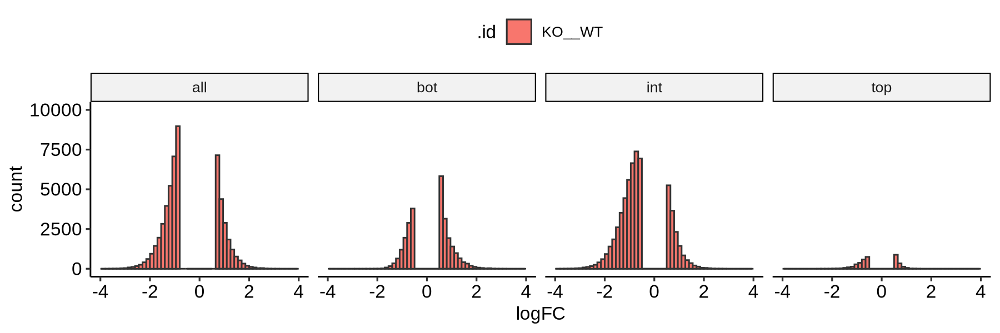

In [99]:
##### mar
# based on m value
cut = .5
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
#hsa_dmp_dt[, .id := factor(.id, levels = colnames(contMatrix)) ]
plotdat1 = hsa_dmp_dt[ logFC > cut  & adj.P.Val < 0.05 & !is.na(probe_grp2) & .id == 'KO__WT', ]
plotdat2 = hsa_dmp_dt[ logFC < -cut & adj.P.Val < 0.05 & !is.na(probe_grp2) & .id == 'KO__WT', ]
plotdat11 = copy(plotdat1)
plotdat22 = copy(plotdat2)
plotdat11$probe_grp2 = 'all'
plotdat22$probe_grp2 = 'all'
plotdat1 = rbind(plotdat1, plotdat11)
plotdat2 = rbind(plotdat2, plotdat22)

dim(plotdat1) 
dim(plotdat2) 
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1) + ylim(0, 10000)
fname = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_B1KO.pdf'
ggsave(gg, file = fname, width = 9, height = 3)
gg


Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(table(sign(plotdat$logFC), plotdat$probe_grp2)). In the next version, this warning will become an error.”


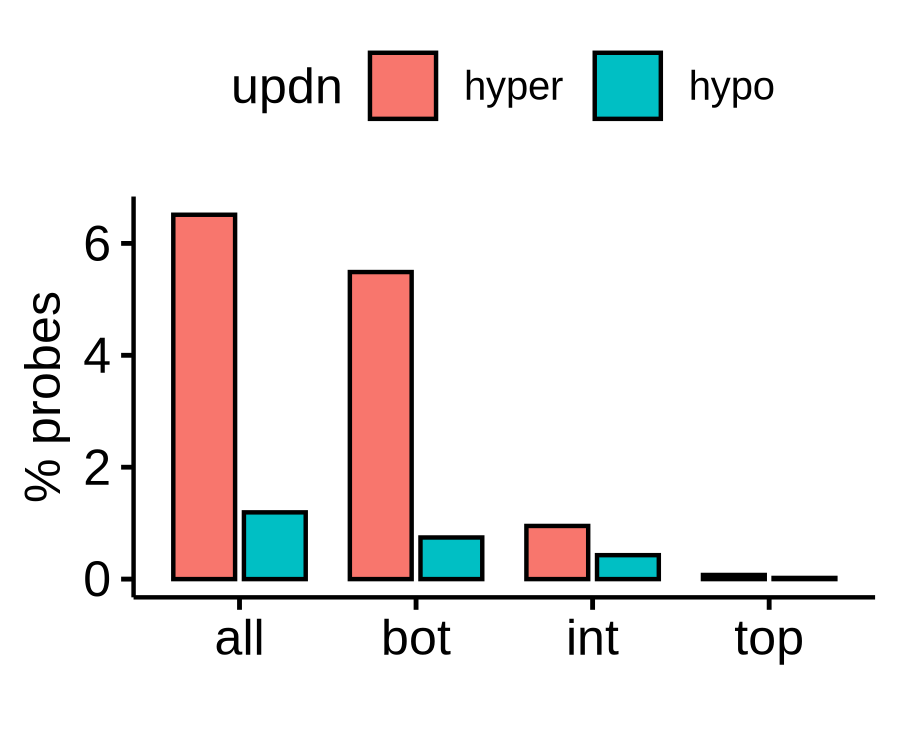

In [103]:
plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(melt(table(sign(plotdat$logFC), plotdat$probe_grp2)))
plotdat[, updn := 'hyper' ]
plotdat[Var1 == -1, updn := 'hypo' ]
plotdat[, val := value / 1000 ]
plotdat[, per := 100 * value / all_probes]

gg = ggbarplot(plotdat, x = 'Var2', y = 'val', fill = 'updn', color = 'black', position = position_dodge(.8)) +
ylab('% probes') + xlab('')
ggsave(gg, file = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_B1KO_percentageBar.pdf', width = 3, height = 2.5)
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
gg

## DKO vs WT

[1] 42906    65

[1] 88984    65

Warning message:
“Removed 8 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 8 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the 

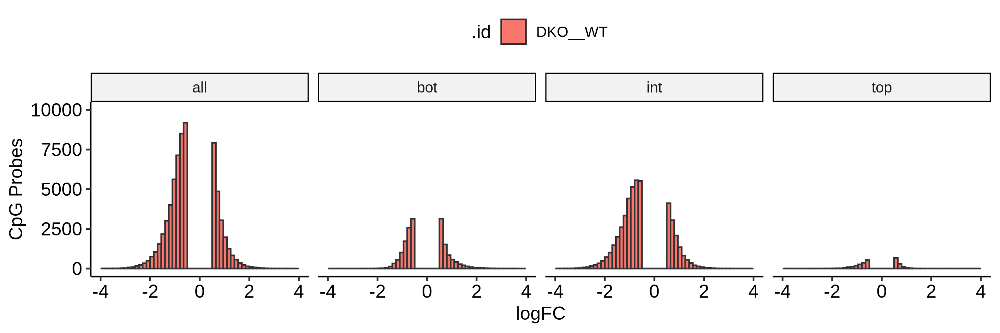

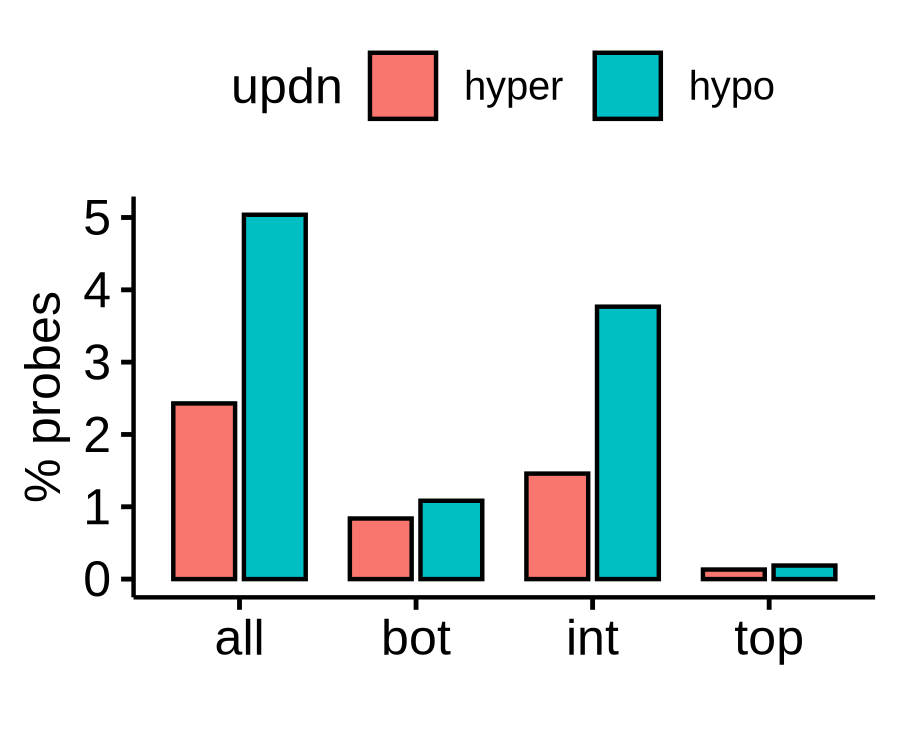

In [97]:
# based on m value
cut = .5
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
#hsa_dmp_dt[, .id := factor(.id, levels = colnames(contMatrix)) ]
plotdat1 = hsa_dmp_dt[ logFC > cut  & adj.P.Val < 0.05 & !is.na(probe_grp2) & .id == 'DKO__WT', ]
plotdat2 = hsa_dmp_dt[ logFC < -cut & adj.P.Val < 0.05 & !is.na(probe_grp2) & .id == 'DKO__WT', ]
plotdat11 = copy(plotdat1)
plotdat22 = copy(plotdat2)
plotdat11$probe_grp2 = 'all'
plotdat22$probe_grp2 = 'all'
plotdat1 = rbind(plotdat1, plotdat11)
plotdat2 = rbind(plotdat2, plotdat22)

dim(plotdat1) 
dim(plotdat2) 
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1)  + ylim(0, 10000) + ylab('CpG Probes')
fname = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_B1DKO.pdf'
ggsave(gg, file = fname, width = 9, height = 3)
gg

plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(melt(table(sign(plotdat$logFC), plotdat$probe_grp2)))
plotdat[, updn := 'hyper' ]
plotdat[Var1 == -1, updn := 'hypo' ]
plotdat[, val := value / 1000 ]
plotdat[, per := 100 * value / all_probes]

gg = ggbarplot(plotdat, x = 'Var2', y = 'per', fill = 'updn', color = 'black', position = position_dodge(.8)) +
ylab('% probes') + xlab('')
ggsave(gg, file = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_B1DKO_percentageBar.pdf', width = 3, height = 2.5)
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
gg

In [211]:
table(hsa_dmp_dt$.id)


         DKO__WT      DKO_B1__DKO       DKO_B1__WT DKO_B1K222A__DKO  DKO_B1K222A__WT     DKO_B1M__DKO      DKO_B1M__WT  DKO_B1SXXS__DKO   DKO_B1SXXS__WT 
          930075           930075           930075           930075           930075           930075           930075           930075           930075 
         KO__DKO           KO__WT 
          930075           930075 

## DKO B1 vs KO mar12

In [ ]:
##### mar

# based on m value
cut = .5
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
#hsa_dmp_dt[, .id := factor(.id, levels = colnames(contMatrix)) ]
plotdat1 = hsa_dmp_dt[ logFC > cut  & adj.P.Val < 0.05 & !is.na(probe_grp2) & .id == 'DKO_B1M__DKO', ]
plotdat2 = hsa_dmp_dt[ logFC < -cut & adj.P.Val < 0.05 & !is.na(probe_grp2) & .id == 'DKO_B1M__DKO', ]
plotdat11 = copy(plotdat1)
plotdat22 = copy(plotdat2)
plotdat11$probe_grp2 = 'all'
plotdat22$probe_grp2 = 'all'
plotdat1 = rbind(plotdat1, plotdat11)
plotdat2 = rbind(plotdat2, plotdat22)

dim(plotdat1) 
dim(plotdat2) 
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1) + ylim(0, 10000)
fname = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_DKO_B1M__DKO.pdf'
ggsave(gg, file = fname, width = 9, height = 3)
gg

plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(melt(table(sign(plotdat$logFC), plotdat$probe_grp2)))
plotdat[, updn := 'hyper' ]
plotdat[Var1 == -1, updn := 'hypo' ]
plotdat[, val := value / 1000 ]
plotdat[, val := value / 1000 ]
plotdat[, per := 100 * value / all_probes]

gg = ggbarplot(plotdat, x = 'Var2', y = 'per', fill = 'updn', color = 'black', position = position_dodge(.8)) +
ylab('% probes') + xlab('')
ggsave(gg, file = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_DKO_B1M__DKO_percentageBar.pdf', width = 3, height = 2.5)
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
gg

## DKO B1M vs KO

[1] 139804     65

[1] 94936    65

Warning message:
“Removed 88 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 8 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 6 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 88 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 8 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 6 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend th

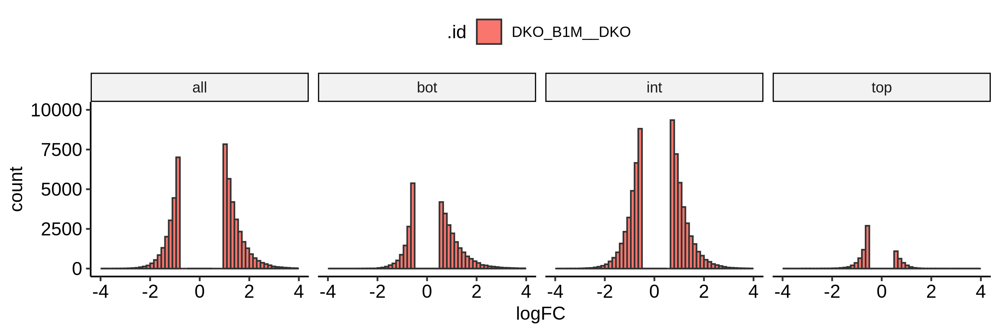

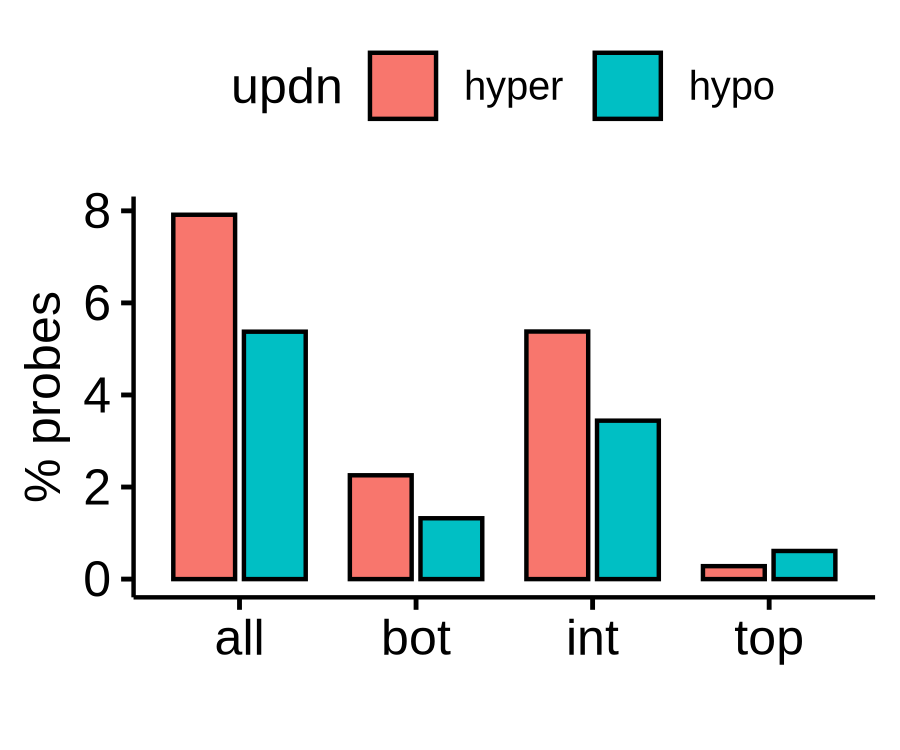

In [104]:
##### mar

# based on m value
cut = .5
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
#hsa_dmp_dt[, .id := factor(.id, levels = colnames(contMatrix)) ]
plotdat1 = hsa_dmp_dt[ logFC > cut  & adj.P.Val < 0.05 & !is.na(probe_grp2) & .id == 'DKO_B1M__DKO', ]
plotdat2 = hsa_dmp_dt[ logFC < -cut & adj.P.Val < 0.05 & !is.na(probe_grp2) & .id == 'DKO_B1M__DKO', ]
plotdat11 = copy(plotdat1)
plotdat22 = copy(plotdat2)
plotdat11$probe_grp2 = 'all'
plotdat22$probe_grp2 = 'all'
plotdat1 = rbind(plotdat1, plotdat11)
plotdat2 = rbind(plotdat2, plotdat22)

dim(plotdat1) 
dim(plotdat2) 
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1) + ylim(0, 10000)
fname = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_DKO_B1M__DKO.pdf'
ggsave(gg, file = fname, width = 9, height = 3)
gg

plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(melt(table(sign(plotdat$logFC), plotdat$probe_grp2)))
plotdat[, updn := 'hyper' ]
plotdat[Var1 == -1, updn := 'hypo' ]
plotdat[, val := value / 1000 ]
plotdat[, val := value / 1000 ]
plotdat[, per := 100 * value / all_probes]

gg = ggbarplot(plotdat, x = 'Var2', y = 'per', fill = 'updn', color = 'black', position = position_dodge(.8)) +
ylab('% probes') + xlab('')
ggsave(gg, file = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_DKO_B1M__DKO_percentageBar.pdf', width = 3, height = 2.5)
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
gg

## DKO_B1K222A__DKO

[1] 14390    65

[1] 1650   65

Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the 

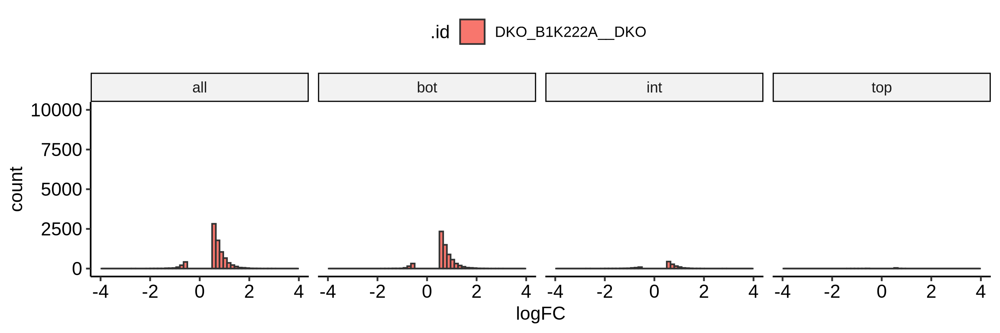

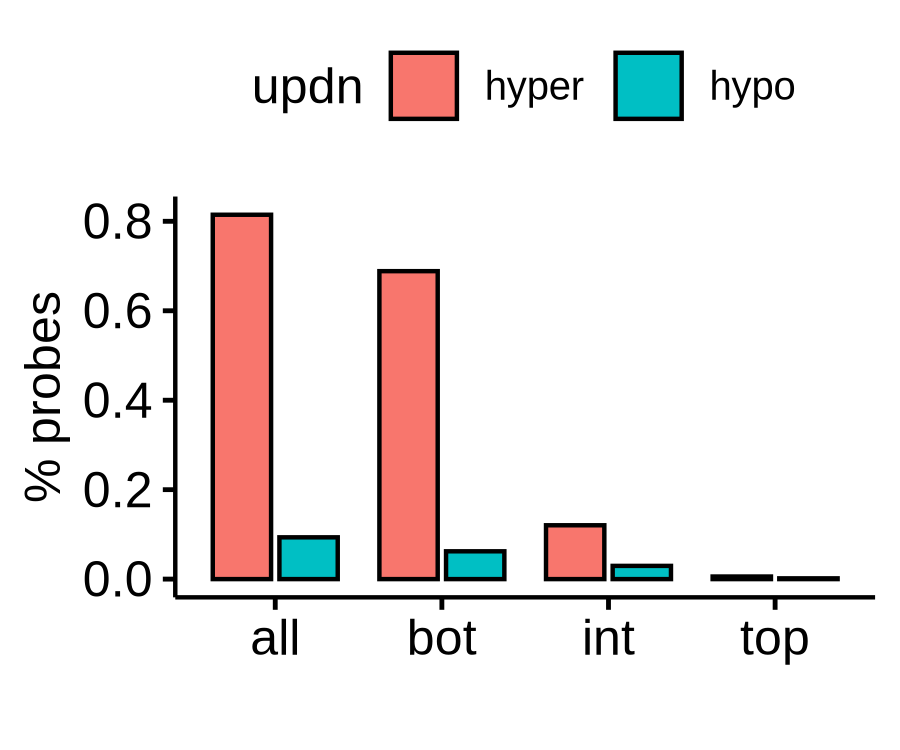

In [105]:
##### mar

# based on m value
cut = .5
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
#hsa_dmp_dt[, .id := factor(.id, levels = colnames(contMatrix)) ]
plotdat1 = hsa_dmp_dt[ logFC > cut  & adj.P.Val < 0.05 & !is.na(probe_grp2) & .id == 'DKO_B1K222A__DKO', ]
plotdat2 = hsa_dmp_dt[ logFC < -cut & adj.P.Val < 0.05 & !is.na(probe_grp2) & .id == 'DKO_B1K222A__DKO', ]
plotdat11 = copy(plotdat1)
plotdat22 = copy(plotdat2)
plotdat11$probe_grp2 = 'all'
plotdat22$probe_grp2 = 'all'
plotdat1 = rbind(plotdat1, plotdat11)
plotdat2 = rbind(plotdat2, plotdat22)

dim(plotdat1) 
dim(plotdat2) 
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1) + ylim(0, 10000)
fname = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_DKO_B1K222A__DKO.pdf'
ggsave(gg, file = fname, width = 9, height = 3)
gg

plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(melt(table(sign(plotdat$logFC), plotdat$probe_grp2)))
plotdat[, updn := 'hyper' ]
plotdat[Var1 == -1, updn := 'hypo' ]
plotdat[, val := value / 1000 ]
plotdat[, val := value / 1000 ]
plotdat[, per := 100 * value / all_probes]

gg = ggbarplot(plotdat, x = 'Var2', y = 'per', fill = 'updn', color = 'black', position = position_dodge(.8)) +
ylab('% probes') + xlab('')
fname = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_DKO_B1K222A__DKO_percentageBar.pdf'
ggsave(gg, file = fname, width = 3, height = 2.5)
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
gg


## cloneA23_DKO_B1K222A__cloneA23_DKO

[1] 19486    71

[1] 3758   71

Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the 

Var1,Var2,value,updn,val,per
<int>,<fct>,<int>,<chr>,<dbl>,<dbl>
-1,all,1879,hypo,1.879,0.21276186
1,all,9743,hyper,9.743,1.10321385
-1,bot,1097,hypo,1.097,0.12421488
1,bot,7358,hyper,7.358,0.83315688
-1,int,679,hypo,0.679,0.07688414
1,int,2209,hyper,2.209,0.25012823


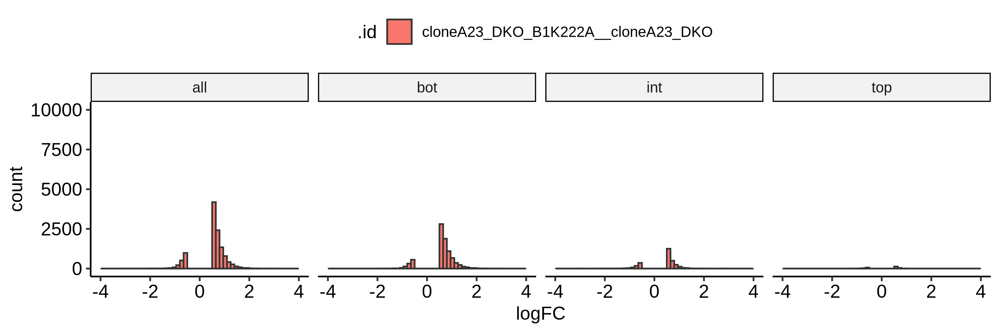

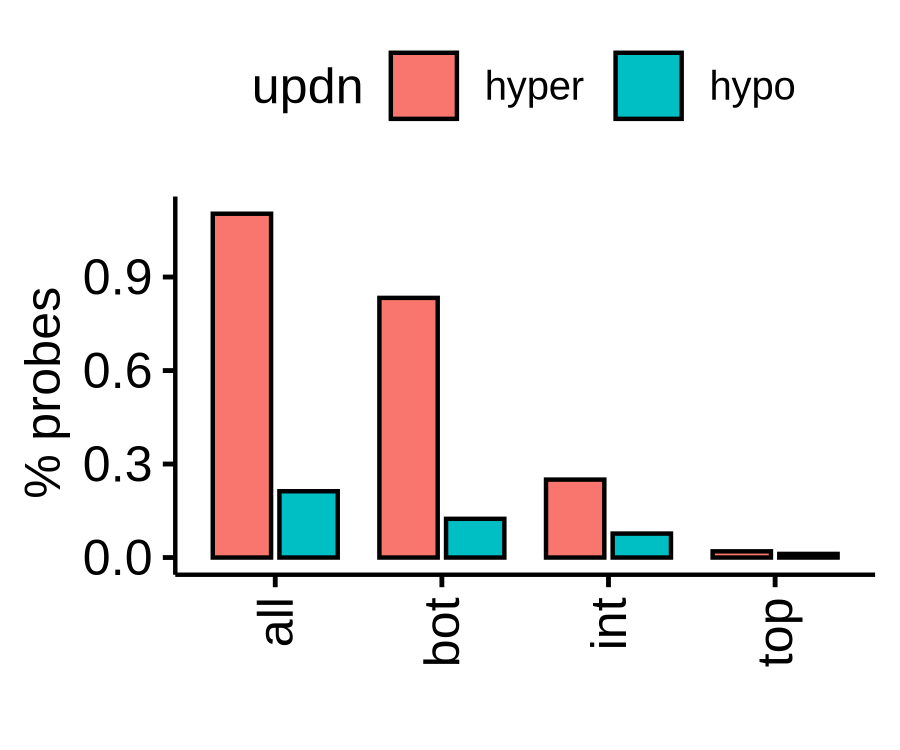

In [119]:
##### mar

# based on m value
cut = .5
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
#hsa_dmp_dt[, .id := factor(.id, levels = colnames(contMatrix)) ]
plotdat1 = hsa_dmp_dt4[ logFC > cut  & adj.P.Val < 0.05 & !is.na(probe_grp2) & .id == 'cloneA23_DKO_B1K222A__cloneA23_DKO', ]
plotdat2 = hsa_dmp_dt4[ logFC < -cut & adj.P.Val < 0.05 & !is.na(probe_grp2) & .id == 'cloneA23_DKO_B1K222A__cloneA23_DKO', ]
plotdat11 = copy(plotdat1)
plotdat22 = copy(plotdat2)
plotdat11$probe_grp2 = 'all'
plotdat22$probe_grp2 = 'all'
plotdat1 = rbind(plotdat1, plotdat11)
plotdat2 = rbind(plotdat2, plotdat22)
dim(plotdat1) 
dim(plotdat2) 
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1) + ylim(0, 10000)
fname = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_cloneA23_DKO_B1K222A__cloneA23_DKO.pdf'
ggsave(gg, file = fname, width = 9, height = 3)
gg

plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(melt(table(sign(plotdat$logFC), plotdat$probe_grp2)))
plotdat[, updn := 'hyper' ]
plotdat[Var1 == -1, updn := 'hypo' ]
plotdat[, val := value / 1000 ]
plotdat[, per := 100 * value / all_probes]

head(plotdat)
gg = ggbarplot(plotdat, x = 'Var2', y = 'per', fill = 'updn', color = 'black', position = position_dodge(.8)) +
ylab('% probes ') + xlab('') + rotate_x_text(90)
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
gg
fname = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_cloneA23_DKO_B1K222A__cloneA23_DKO_percentageBar.pdf'
ggsave(gg, file = fname, width = 3, height = 2.5) 


## cloneA23_DKO_B1K222A__cloneA23_DKO_B1

In [124]:
head(hsa_dmp_dt4[.id == 'cloneA23_DKO_B1K222A__cloneA23_DKO_B1', ])

ID,rn,.id,logFC,AveExpr,t,P.Value,adj.P.Val,B,probe_grp,⋯,start,end,name,tag,SYMBOL,distanceToTSS,ann,geneStart,geneEnd,geneChr
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,⋯,<int>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<chr>,<int>,<int>,<int>
cg00000029_TC21,cg00000029_TC21,cloneA23_DKO_B1K222A__cloneA23_DKO_B1,0.4101981,-0.409022,4.754405,5.313501e-05,2.359187e-04,0.6848354,NA,⋯,53434200,53434201,dmp_name_12,chr16_53434200_53434201,RBL2,-217,promoter,53434418,53491628,16
cg00000109_TC21,cg00000109_TC21,cloneA23_DKO_B1K222A__cloneA23_DKO_B1,0.5685688,2.430880,3.769119,7.689184e-04,2.820344e-03,-1.9495129,top,⋯,172198247,172198248,dmp_name_26,chr3_172198247_172198248,FNDC3B,71273,distal,172126974,172251456,3
cg00000155_BC21,cg00000155_BC21,cloneA23_DKO_B1K222A__cloneA23_DKO_B1,0.4950041,3.236468,1.893580,6.855818e-02,1.504090e-01,-6.1529012,NA,⋯,2550931,2550932,dmp_name_40,chr7_2550931_2550932,BRAT1,3515,distal,2537881,2554447,7
cg00000158_BC21,cg00000158_BC21,cloneA23_DKO_B1K222A__cloneA23_DKO_B1,0.2361263,3.905868,1.349191,1.879848e-01,3.322131e-01,-6.9860188,NA,⋯,92248273,92248274,dmp_name_54,chr9_92248273_92248274,IARS1,323,promoter,92240299,92248597,9
cg00000165_TC21,cg00000165_TC21,cloneA23_DKO_B1K222A__cloneA23_DKO_B1,-0.4885899,1.737122,-3.689901,9.486158e-04,3.421482e-03,-2.1541088,NA,⋯,90729117,90729118,dmp_name_68,chr1_90729117_90729118,BARHL2,-11815,distal,90711539,90717302,1
cg00000221_BC21,cg00000221_BC21,cloneA23_DKO_B1K222A__cloneA23_DKO_B1,-1.1727052,-3.000166,-11.053966,8.949112e-12,1.140731e-10,16.4832343,NA,⋯,56456887,56456888,dmp_name_82,chr17_56456887_56456888,ANKFN1,-59,promoter,56456947,56463906,17


[1] 233336     71

[1] 194438     71

Warning message:
“Removed 230 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 502 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 11 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 8 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 230 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 502 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 11 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 8 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is su

Var1,Var2,value,updn,val,per
<int>,<fct>,<int>,<chr>,<dbl>,<dbl>
-1,all,97219,hypo,97.219,11.008247
1,all,116668,hyper,116.668,13.210485
-1,bot,30482,hypo,30.482,3.451521
1,bot,30763,hyper,30.763,3.483339
-1,int,60232,hypo,60.232,6.820156
1,int,74133,hyper,74.133,8.394186


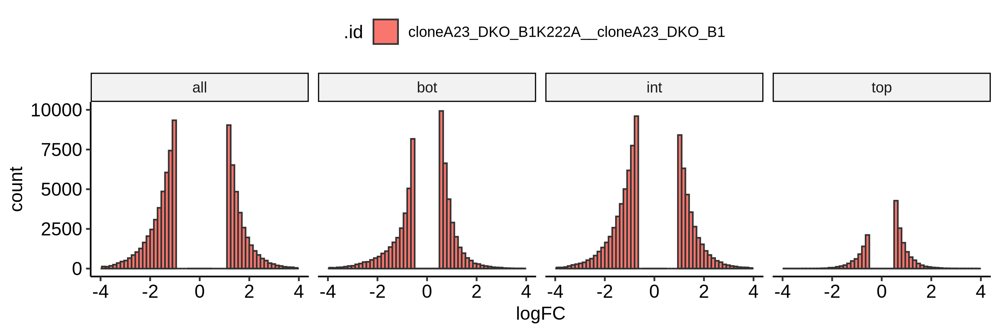

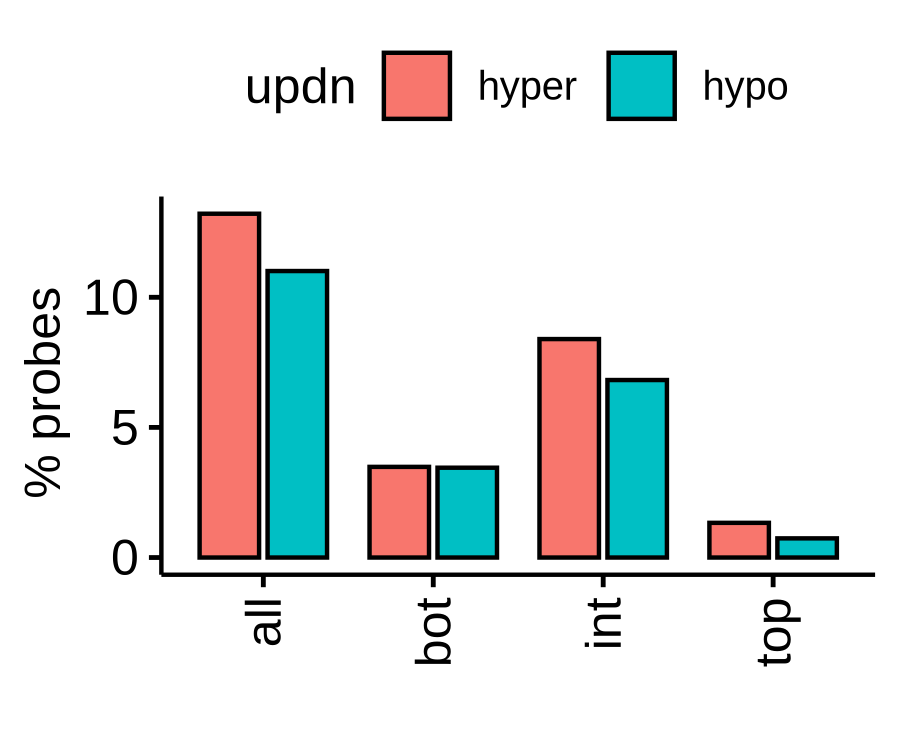

In [130]:
##### mar

# based on m value
cut = .5
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
#hsa_dmp_dt[, .id := factor(.id, levels = colnames(contMatrix)) ]
plotdat1 = hsa_dmp_dt4[ logFC > cut  & adj.P.Val < 0.05 & !is.na(probe_grp2) & .id == 'cloneA23_DKO_B1K222A__cloneA23_DKO_B1', ]
plotdat2 = hsa_dmp_dt4[ logFC < -cut & adj.P.Val < 0.05 & !is.na(probe_grp2) & .id == 'cloneA23_DKO_B1K222A__cloneA23_DKO_B1', ]
plotdat11 = copy(plotdat1)
plotdat22 = copy(plotdat2)
plotdat11$probe_grp2 = 'all'
plotdat22$probe_grp2 = 'all'
plotdat1 = rbind(plotdat1, plotdat11)
plotdat2 = rbind(plotdat2, plotdat22)
dim(plotdat1) 
dim(plotdat2) 
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1) + ylim(0, 10000)
fname = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_cloneA23_DKO_B1K222A__cloneA23_DKO_B1.pdf'
ggsave(gg, file = fname, width = 9, height = 3)
gg

plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(melt(table(sign(plotdat$logFC), plotdat$probe_grp2)))
plotdat[, updn := 'hyper' ]
plotdat[Var1 == -1, updn := 'hypo' ]
plotdat[, val := value / 1000 ]
plotdat[, per := 100 * value / all_probes]

head(plotdat)
gg = ggbarplot(plotdat, x = 'Var2', y = 'per', fill = 'updn', color = 'black', position = position_dodge(.8)) +
ylab('% probes ') + xlab('') + rotate_x_text(90)
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
gg
fname = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_cloneA23_DKO_B1K222A__cloneA23_DKO_B1_percentageBar.pdf'
ggsave(gg, file = fname, width = 3, height = 2.5) 


## cloneA9_DKO_B1K222A__cloneA9_DKO

[1] 17628    71

[1] 3912   71

Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the 

Var1,Var2,value,updn,val,per
<int>,<fct>,<int>,<chr>,<dbl>,<dbl>
-1,all,1956,hypo,1.956,0.22148068
1,all,8814,hyper,8.814,0.99802185
-1,bot,1228,hypo,1.228,0.13904820
1,bot,6583,hyper,6.583,0.74540252
-1,int,656,hypo,0.656,0.07427982
1,int,2011,hyper,2.011,0.22770841


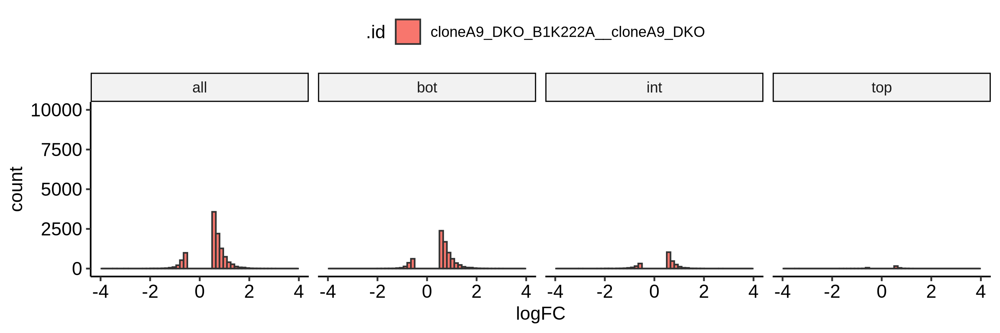

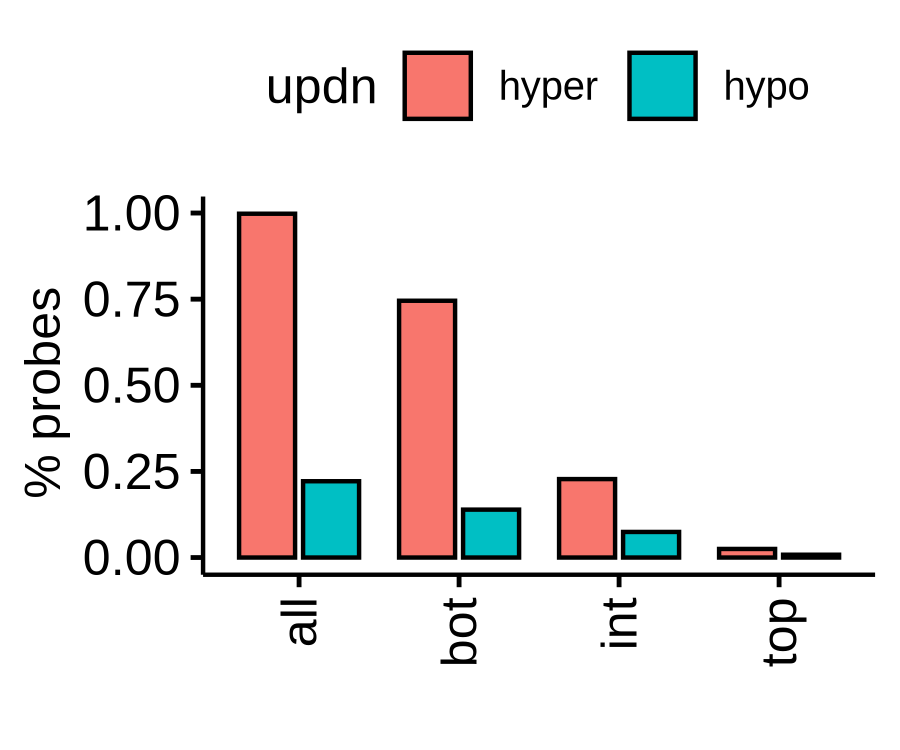

In [120]:
##### mar

# based on m value
cut = .5
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
#hsa_dmp_dt[, .id := factor(.id, levels = colnames(contMatrix)) ]
plotdat1 = hsa_dmp_dt4[ logFC > cut  & adj.P.Val < 0.05 & !is.na(probe_grp2) & .id == 'cloneA9_DKO_B1K222A__cloneA9_DKO', ]
plotdat2 = hsa_dmp_dt4[ logFC < -cut & adj.P.Val < 0.05 & !is.na(probe_grp2) & .id == 'cloneA9_DKO_B1K222A__cloneA9_DKO', ]
plotdat11 = copy(plotdat1)
plotdat22 = copy(plotdat2)
plotdat11$probe_grp2 = 'all'
plotdat22$probe_grp2 = 'all'
plotdat1 = rbind(plotdat1, plotdat11)
plotdat2 = rbind(plotdat2, plotdat22)
dim(plotdat1) 
dim(plotdat2) 
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1) + ylim(0, 10000)
fname = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_cloneA9_DKO_B1K222A__cloneA9_DKO.pdf'
ggsave(gg, file = fname, width = 9, height = 3)
gg

plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(melt(table(sign(plotdat$logFC), plotdat$probe_grp2)))
plotdat[, updn := 'hyper' ]
plotdat[Var1 == -1, updn := 'hypo' ]
plotdat[, val := value / 1000 ]
plotdat[, per := 100 * value / all_probes]

head(plotdat)
gg = ggbarplot(plotdat, x = 'Var2', y = 'per', fill = 'updn', color = 'black', position = position_dodge(.8)) +
ylab('% probes ') + xlab('') + rotate_x_text(90)
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
gg
fname = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_cloneA9_DKO_B1K222A__cloneA9_DKO_percentageBar.pdf'
ggsave(gg, file = fname, width = 3, height = 2.5) 


## cloneA9_DKO_B1K222A__cloneA9_DKO_B1

[1] 207736     71

[1] 162780     71

Warning message:
“Removed 40 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 268 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 11 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 8 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 40 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 268 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 11 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 8 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is supe

Var1,Var2,value,updn,val,per
<int>,<fct>,<int>,<chr>,<dbl>,<dbl>
-1,all,81390,hypo,81.390,9.215906
1,all,103868,hyper,103.868,11.761122
-1,bot,28931,hypo,28.931,3.275899
1,bot,25842,hyper,25.842,2.926127
-1,int,47858,hypo,47.858,5.419030
1,int,68190,hyper,68.190,7.721251


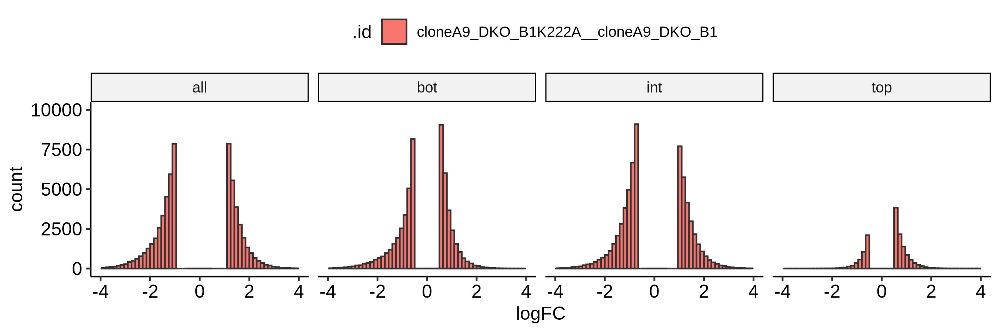

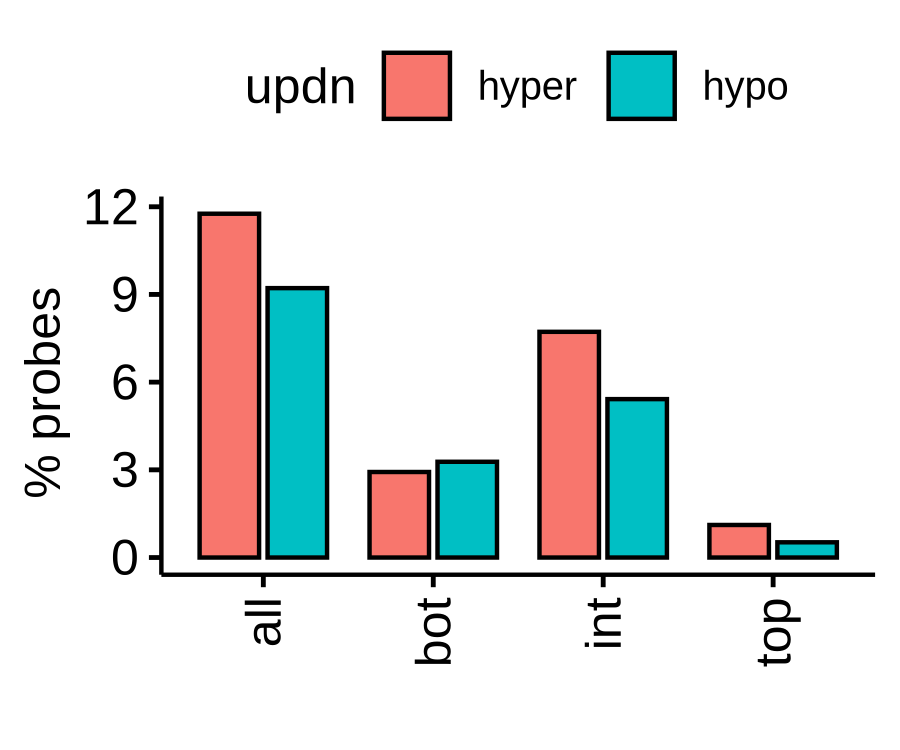

In [127]:
##### mar

# based on m value
cut = .5
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
#hsa_dmp_dt[, .id := factor(.id, levels = colnames(contMatrix)) ]
plotdat1 = hsa_dmp_dt4[ logFC > cut  & adj.P.Val < 0.05 & !is.na(probe_grp2) & .id == 'cloneA9_DKO_B1K222A__cloneA9_DKO_B1', ]
plotdat2 = hsa_dmp_dt4[ logFC < -cut & adj.P.Val < 0.05 & !is.na(probe_grp2) & .id == 'cloneA9_DKO_B1K222A__cloneA9_DKO_B1', ]
plotdat11 = copy(plotdat1)
plotdat22 = copy(plotdat2)
plotdat11$probe_grp2 = 'all'
plotdat22$probe_grp2 = 'all'
plotdat1 = rbind(plotdat1, plotdat11)
plotdat2 = rbind(plotdat2, plotdat22)
dim(plotdat1) 
dim(plotdat2) 
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1) + ylim(0, 10000)
fname = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_cloneA9_DKO_B1K222A__cloneA9_DKO_B1.pdf'
ggsave(gg, file = fname, width = 9, height = 3)
gg

plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(melt(table(sign(plotdat$logFC), plotdat$probe_grp2)))
plotdat[, updn := 'hyper' ]
plotdat[Var1 == -1, updn := 'hypo' ]
plotdat[, val := value / 1000 ]
plotdat[, per := 100 * value / all_probes]

head(plotdat)
gg = ggbarplot(plotdat, x = 'Var2', y = 'per', fill = 'updn', color = 'black', position = position_dodge(.8)) +
ylab('% probes ') + xlab('') + rotate_x_text(90)
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
gg
fname = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_cloneA9_DKO_B1K222A__cloneA9_DKO_B1_percentageBar.pdf'
ggsave(gg, file = fname, width = 3, height = 2.5) 


In [90]:
all_probes = length(c(bot_probes_k562,  int_probes_k562,  top_probes_k562) )
all_probes

[1] 883147

## DKO_B1SXXS__DKO

[1] 13024    65

[1] 2386   65

Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the 

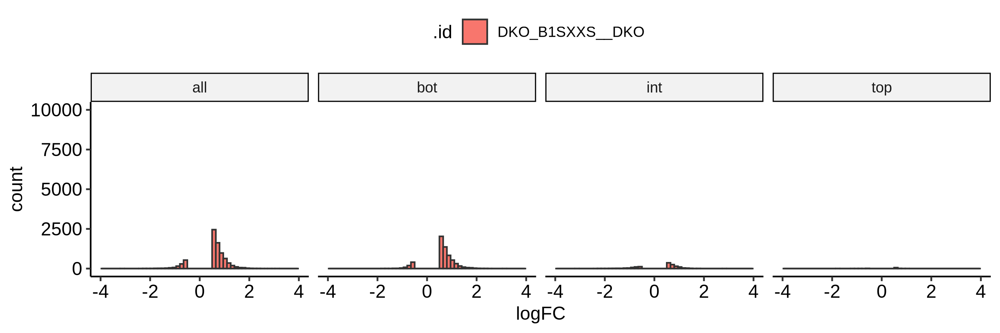

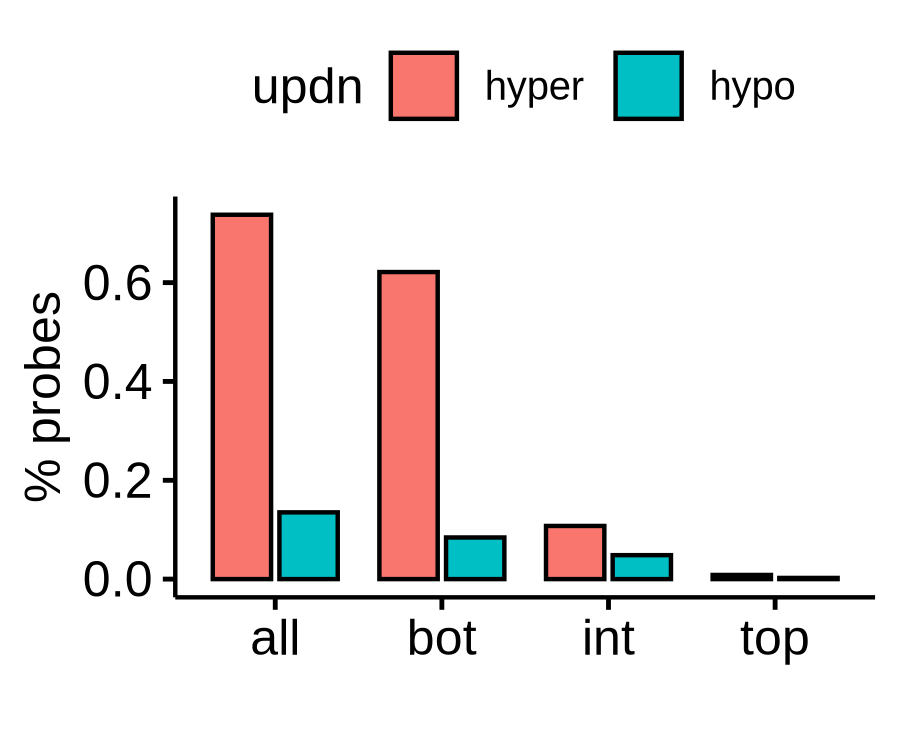

In [106]:
##### mar

# based on m value
cut = .5
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
#hsa_dmp_dt[, .id := factor(.id, levels = colnames(contMatrix)) ]
plotdat1 = hsa_dmp_dt[ logFC > cut  & adj.P.Val < 0.05 & !is.na(probe_grp2) & .id == 'DKO_B1SXXS__DKO', ]
plotdat2 = hsa_dmp_dt[ logFC < -cut & adj.P.Val < 0.05 & !is.na(probe_grp2) & .id == 'DKO_B1SXXS__DKO', ]
plotdat11 = copy(plotdat1)
plotdat22 = copy(plotdat2)
plotdat11$probe_grp2 = 'all'
plotdat22$probe_grp2 = 'all'
plotdat1 = rbind(plotdat1, plotdat11)
plotdat2 = rbind(plotdat2, plotdat22)

dim(plotdat1) 
dim(plotdat2) 
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1) + ylim(0, 10000)
fname = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_DKO_B1SXXS__DKO.pdf'
ggsave(gg, file = fname, width = 9, height = 3)
gg

plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(melt(table(sign(plotdat$logFC), plotdat$probe_grp2)))
plotdat[, updn := 'hyper' ]
plotdat[Var1 == -1, updn := 'hypo' ]
plotdat[, val := value / 1000 ]
plotdat[, val := value / 1000 ]
plotdat[, per := 100 * value / all_probes]

gg = ggbarplot(plotdat, x = 'Var2', y = 'per', fill = 'updn', color = 'black', position = position_dodge(.8)) +
ylab('% probes') + xlab('')
fname = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_DKO_B1SXXS__DKO_percentageBar.pdf'
ggsave(gg, file = fname, width = 3, height = 2.5)
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
gg


## cloneA23_DKO_B1SXXS__cloneA23_DKO

[1] 26038    71

[1] 6768   71

Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded a

Var1,Var2,value,updn,val,per
<int>,<fct>,<int>,<chr>,<dbl>,<dbl>
-1,all,3384,hypo,3.384,0.3831752
1,all,13019,hyper,13.019,1.4741600
-1,bot,1844,hypo,1.844,0.2087988
1,bot,7687,hyper,7.687,0.8704100
-1,int,1280,hypo,1.280,0.1449362
1,int,4963,hyper,4.963,0.5619676


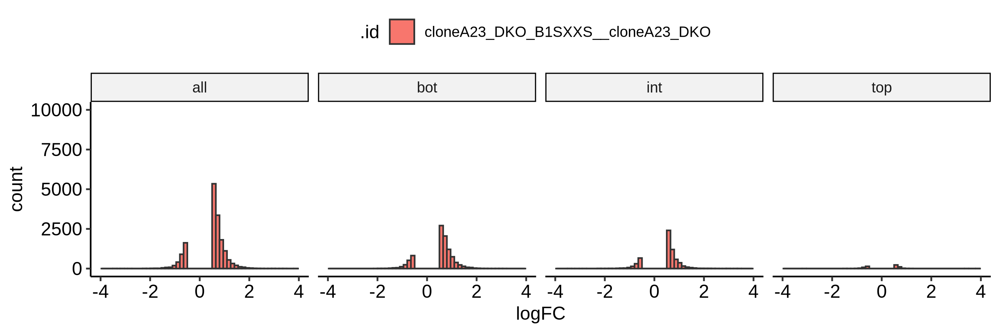

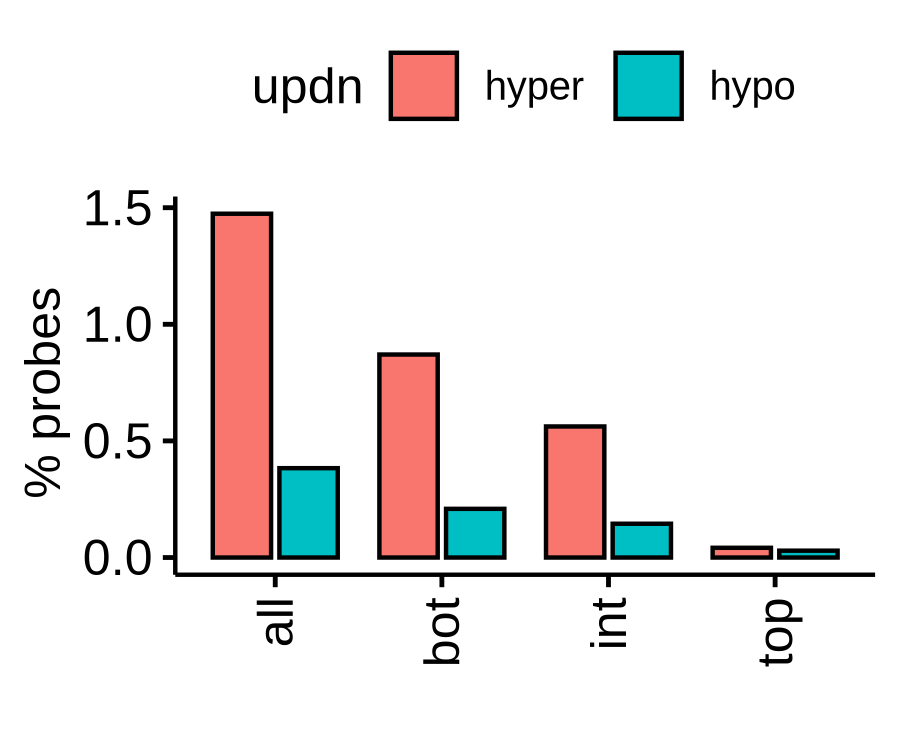

In [122]:
##### mar

# based on m value
cut = .5
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
#hsa_dmp_dt[, .id := factor(.id, levels = colnames(contMatrix)) ]
plotdat1 = hsa_dmp_dt4[ logFC > cut  & adj.P.Val < 0.05 & !is.na(probe_grp2) & .id == 'cloneA23_DKO_B1SXXS__cloneA23_DKO', ]
plotdat2 = hsa_dmp_dt4[ logFC < -cut & adj.P.Val < 0.05 & !is.na(probe_grp2) & .id == 'cloneA23_DKO_B1SXXS__cloneA23_DKO', ]
plotdat11 = copy(plotdat1)
plotdat22 = copy(plotdat2)
plotdat11$probe_grp2 = 'all'
plotdat22$probe_grp2 = 'all'
plotdat1 = rbind(plotdat1, plotdat11)
plotdat2 = rbind(plotdat2, plotdat22)
dim(plotdat1) 
dim(plotdat2) 
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1) + ylim(0, 10000)
fname = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_cloneA23_DKO_B1SXXS__cloneA23_DKO.pdf'
ggsave(gg, file = fname, width = 9, height = 3)
gg

plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(melt(table(sign(plotdat$logFC), plotdat$probe_grp2)))
plotdat[, updn := 'hyper' ]
plotdat[Var1 == -1, updn := 'hypo' ]
plotdat[, val := value / 1000 ]
plotdat[, per := 100 * value / all_probes]

head(plotdat)
gg = ggbarplot(plotdat, x = 'Var2', y = 'per', fill = 'updn', color = 'black', position = position_dodge(.8)) +
ylab('% probes ') + xlab('') + rotate_x_text(90)
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
gg
fname = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_cloneA23_DKO_B1SXXS__cloneA23_DKO_percentageBar.pdf'
ggsave(gg, file = fname, width = 3, height = 2.5) 


## cloneA23_DKO_B1SXXS__cloneA23_DKO_B1

[1] 224802     71

[1] 188558     71

Warning message:
“Removed 148 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 296 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 11 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 9 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 148 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 296 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 11 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 9 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is su

Var1,Var2,value,updn,val,per
<int>,<fct>,<int>,<chr>,<dbl>,<dbl>
-1,all,94279,hypo,94.279,10.675346
1,all,112401,hyper,112.401,12.727326
-1,bot,31375,hypo,31.375,3.552636
1,bot,28215,hyper,28.215,3.194825
-1,int,57276,hypo,57.276,6.485444
1,int,71598,hyper,71.598,8.107144


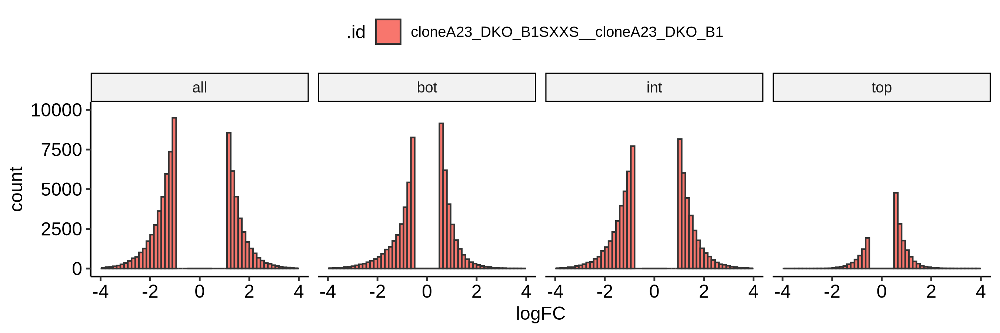

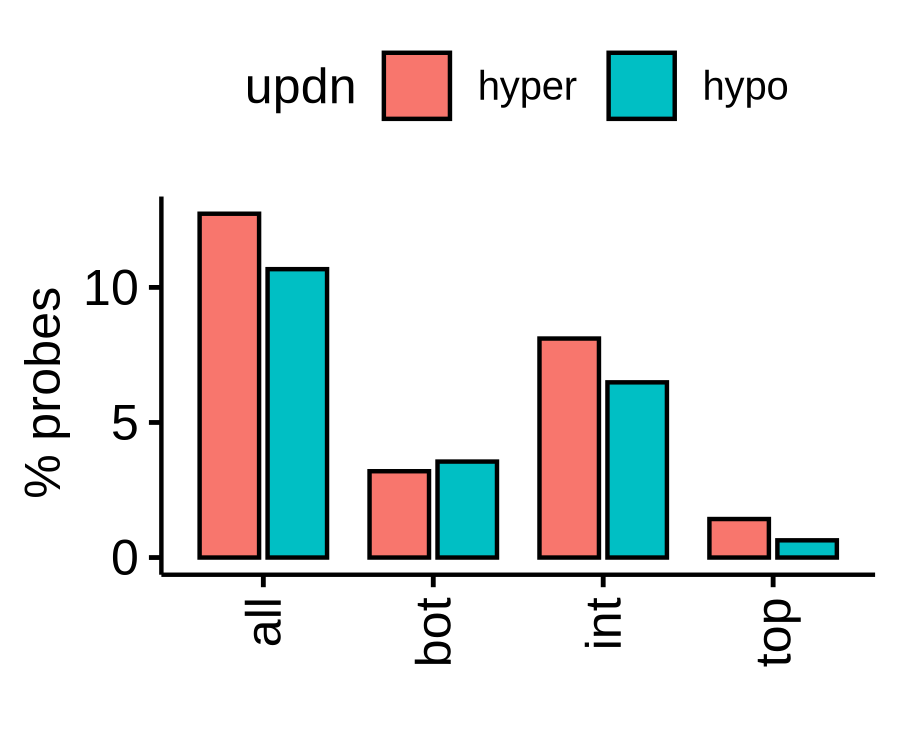

In [128]:
##### mar

# based on m value
cut = .5
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
#hsa_dmp_dt[, .id := factor(.id, levels = colnames(contMatrix)) ]
plotdat1 = hsa_dmp_dt4[ logFC > cut  & adj.P.Val < 0.05 & !is.na(probe_grp2) & .id == 'cloneA23_DKO_B1SXXS__cloneA23_DKO_B1', ]
plotdat2 = hsa_dmp_dt4[ logFC < -cut & adj.P.Val < 0.05 & !is.na(probe_grp2) & .id == 'cloneA23_DKO_B1SXXS__cloneA23_DKO_B1', ]
plotdat11 = copy(plotdat1)
plotdat22 = copy(plotdat2)
plotdat11$probe_grp2 = 'all'
plotdat22$probe_grp2 = 'all'
plotdat1 = rbind(plotdat1, plotdat11)
plotdat2 = rbind(plotdat2, plotdat22)
dim(plotdat1) 
dim(plotdat2) 
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1) + ylim(0, 10000)
fname = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_cloneA23_DKO_B1SXXS__cloneA23_DKO_B1.pdf'
ggsave(gg, file = fname, width = 9, height = 3)
gg

plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(melt(table(sign(plotdat$logFC), plotdat$probe_grp2)))
plotdat[, updn := 'hyper' ]
plotdat[Var1 == -1, updn := 'hypo' ]
plotdat[, val := value / 1000 ]
plotdat[, per := 100 * value / all_probes]

head(plotdat)
gg = ggbarplot(plotdat, x = 'Var2', y = 'per', fill = 'updn', color = 'black', position = position_dodge(.8)) +
ylab('% probes ') + xlab('') + rotate_x_text(90)
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
gg
fname = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_cloneA23_DKO_B1SXXS__cloneA23_DKO_B1_percentageBar.pdf'
ggsave(gg, file = fname, width = 3, height = 2.5) 


## cloneA9_DKO_B1SXXS__cloneA9_DKO

[1] 18474    71

[1] 4856   71

Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the 

Var1,Var2,value,updn,val,per
<int>,<fct>,<int>,<chr>,<dbl>,<dbl>
-1,all,2428,hypo,2.428,0.27492592
1,all,9237,hyper,9.237,1.04591874
-1,bot,1471,hypo,1.471,0.16656344
1,bot,6833,hyper,6.833,0.77371038
-1,int,870,hypo,0.870,0.09851135
1,int,2143,hyper,2.143,0.24265496


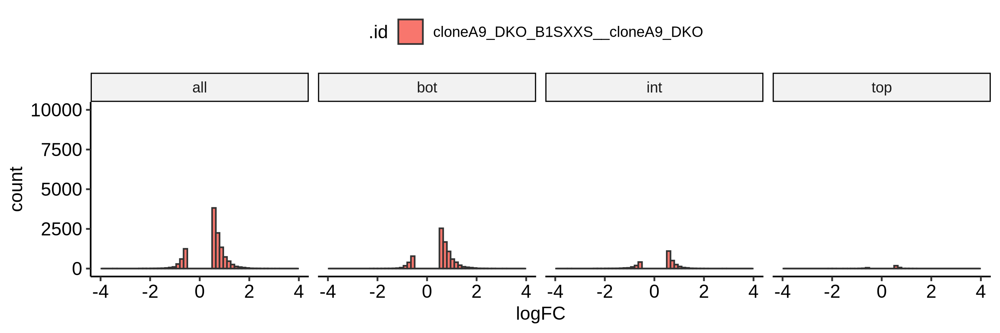

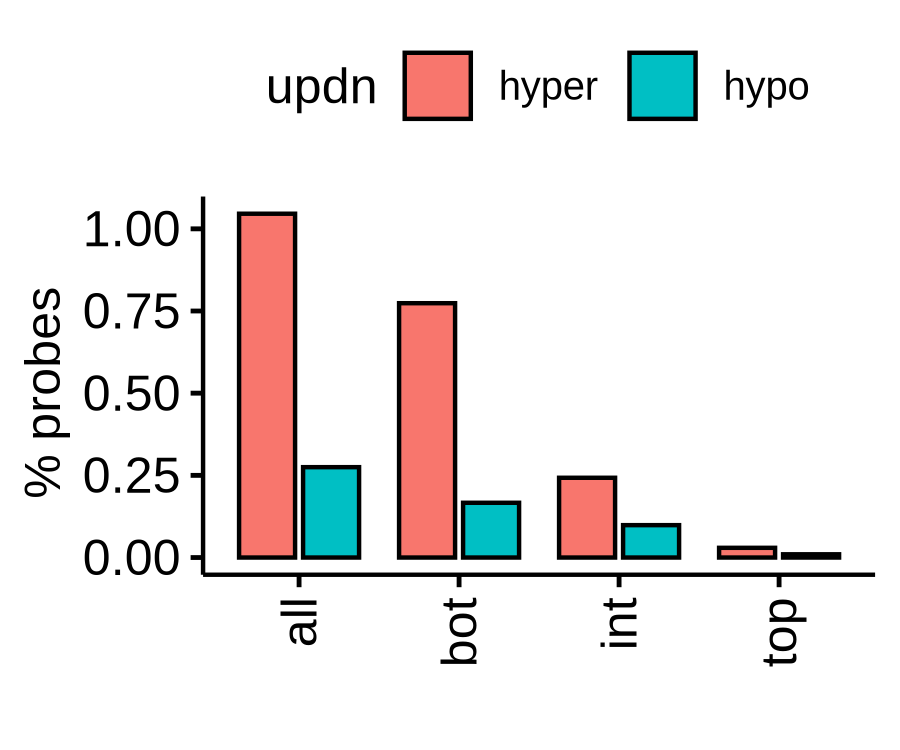

In [132]:
##### mar

# based on m value
cut = .5
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
#hsa_dmp_dt[, .id := factor(.id, levels = colnames(contMatrix)) ]
plotdat1 = hsa_dmp_dt4[ logFC > cut  & adj.P.Val < 0.05 & !is.na(probe_grp2) & .id == 'cloneA9_DKO_B1SXXS__cloneA9_DKO', ]
plotdat2 = hsa_dmp_dt4[ logFC < -cut & adj.P.Val < 0.05 & !is.na(probe_grp2) & .id == 'cloneA9_DKO_B1SXXS__cloneA9_DKO', ]
plotdat11 = copy(plotdat1)
plotdat22 = copy(plotdat2)
plotdat11$probe_grp2 = 'all'
plotdat22$probe_grp2 = 'all'
plotdat1 = rbind(plotdat1, plotdat11)
plotdat2 = rbind(plotdat2, plotdat22)
dim(plotdat1) 
dim(plotdat2) 
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1) + ylim(0, 10000)
fname = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_cloneA9_DKO_B1SXXS__cloneA9_DKO.pdf'
ggsave(gg, file = fname, width = 9, height = 3)
gg

plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(melt(table(sign(plotdat$logFC), plotdat$probe_grp2)))
plotdat[, updn := 'hyper' ]
plotdat[Var1 == -1, updn := 'hypo' ]
plotdat[, val := value / 1000 ]
plotdat[, per := 100 * value / all_probes]

head(plotdat)
gg = ggbarplot(plotdat, x = 'Var2', y = 'per', fill = 'updn', color = 'black', position = position_dodge(.8)) +
ylab('% probes ') + xlab('') + rotate_x_text(90)
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
gg
fname = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_cloneA9_DKO_B1SXXS__cloneA9_DKO_percentageBar.pdf'
ggsave(gg, file = fname, width = 3, height = 2.5) 


## cloneA9_DKO_B1SXXS__cloneA9_DKO_B1

[1] 207852     71

[1] 163578     71

Warning message:
“Removed 46 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 276 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 11 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 8 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 46 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 276 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 11 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 8 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is supe

Var1,Var2,value,updn,val,per
<int>,<fct>,<int>,<chr>,<dbl>,<dbl>
-1,all,81789,hypo,81.789,9.261086
1,all,103926,hyper,103.926,11.767690
-1,bot,29014,hypo,29.014,3.285297
1,bot,25616,hyper,25.616,2.900536
-1,int,48217,hypo,48.217,5.459680
1,int,68327,hyper,68.327,7.736764


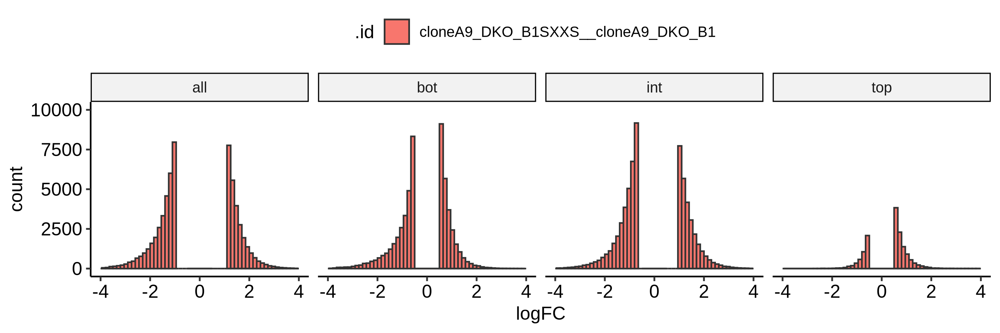

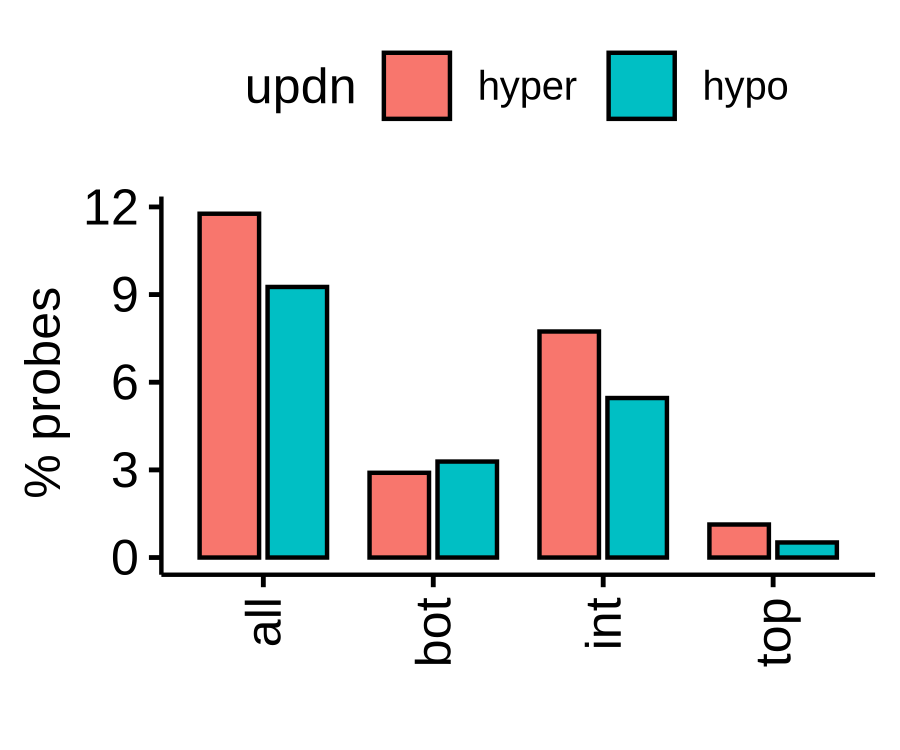

In [131]:
##### mar

# based on m value
cut = .5
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
#hsa_dmp_dt[, .id := factor(.id, levels = colnames(contMatrix)) ]
plotdat1 = hsa_dmp_dt4[ logFC > cut  & adj.P.Val < 0.05 & !is.na(probe_grp2) & .id == 'cloneA9_DKO_B1SXXS__cloneA9_DKO_B1', ]
plotdat2 = hsa_dmp_dt4[ logFC < -cut & adj.P.Val < 0.05 & !is.na(probe_grp2) & .id == 'cloneA9_DKO_B1SXXS__cloneA9_DKO_B1', ]
plotdat11 = copy(plotdat1)
plotdat22 = copy(plotdat2)
plotdat11$probe_grp2 = 'all'
plotdat22$probe_grp2 = 'all'
plotdat1 = rbind(plotdat1, plotdat11)
plotdat2 = rbind(plotdat2, plotdat22)
dim(plotdat1) 
dim(plotdat2) 
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1) + ylim(0, 10000)
fname = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_cloneA9_DKO_B1SXXS__cloneA9_DKO_B1.pdf'
ggsave(gg, file = fname, width = 9, height = 3)
gg

plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(melt(table(sign(plotdat$logFC), plotdat$probe_grp2)))
plotdat[, updn := 'hyper' ]
plotdat[Var1 == -1, updn := 'hypo' ]
plotdat[, val := value / 1000 ]
plotdat[, per := 100 * value / all_probes]

head(plotdat)
gg = ggbarplot(plotdat, x = 'Var2', y = 'per', fill = 'updn', color = 'black', position = position_dodge(.8)) +
ylab('% probes ') + xlab('') + rotate_x_text(90)
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
gg
fname = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_cloneA9_DKO_B1SXXS__cloneA9_DKO_B1_percentageBar.pdf'
ggsave(gg, file = fname, width = 3, height = 2.5) 


## all probes together with all genotype

[1] 459614     65

[1] 559978     65

Warning message:
“Removed 401 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 154 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 11 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 11 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 401 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 154 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 11 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 11 rows containing missing values or values outside the scale range
(`geom_bar()`).”


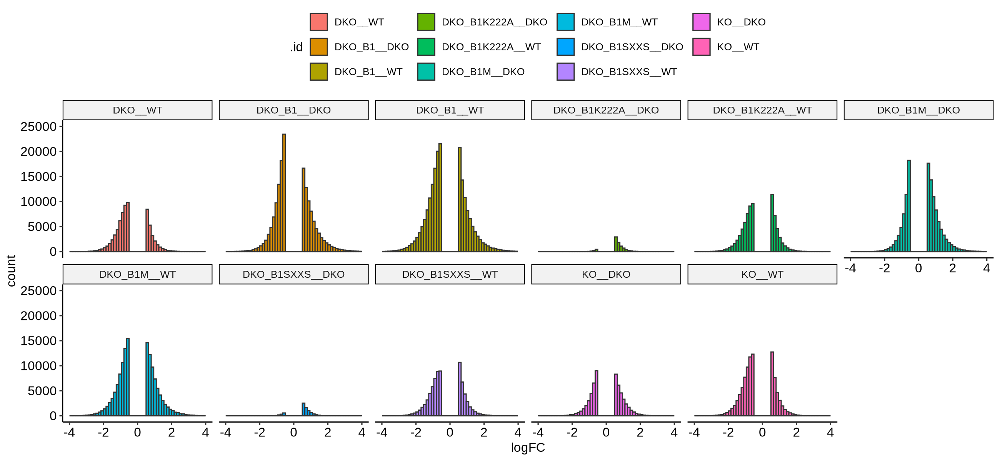

In [117]:
##### mar

# based on m value
cut = .5
options(repr.plot.width = 13, repr.plot.height = 6, repr.plot.res = 200)
#hsa_dmp_dt[, .id := factor(.id, levels = colnames(contMatrix)) ]
plotdat1 = hsa_dmp_dt[ logFC > cut  & adj.P.Val < 0.05, ]
plotdat2 = hsa_dmp_dt[ logFC < -cut & adj.P.Val < 0.05, ]
dim(plotdat1) 
dim(plotdat2) 
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('.id', nrow = 2) + ylim(0, 25000)
fname = '~/WenhuoHu/plot/mar/k562_dmp_all_probes.pdf'
ggsave(gg, file = fname, width = 13, height = 6)
gg


Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(table(sign(plotdat$logFC), plotdat$.id)). In the next version, this warning will become an error.”


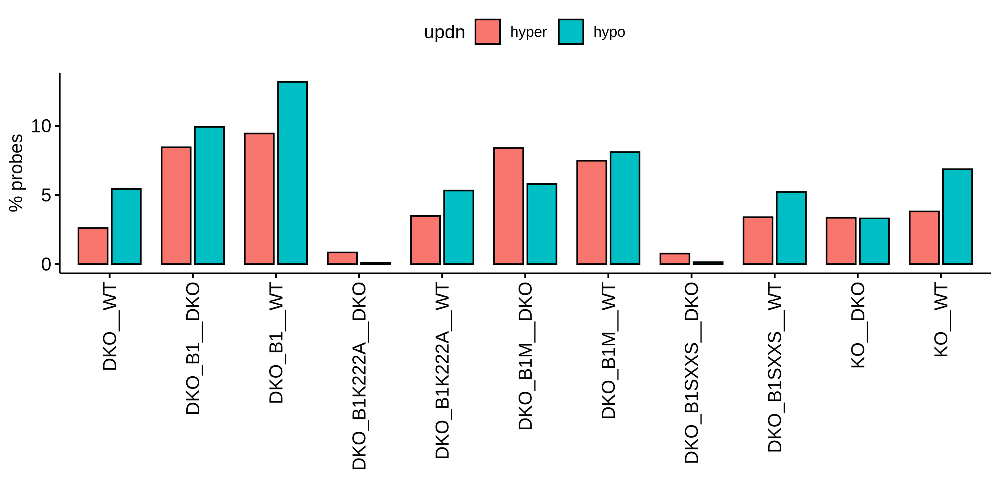

In [118]:
##### mar
plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(melt(table(sign(plotdat$logFC), plotdat$.id)))
plotdat[, updn := 'hyper' ]
plotdat[Var1 == -1, updn := 'hypo' ]
plotdat[, val := value / 1000 ]
plotdat[, per := 100 * value / all_probes]

gg = ggbarplot(plotdat, x = 'Var2', y = 'per', fill = 'updn', color = 'black', position = position_dodge(.8)) +
ylab('% probes') + xlab('') + rotate_x_text(90)
options(repr.plot.width = 9, repr.plot.height = 4.5, repr.plot.res = 300)
gg
fname = '~/WenhuoHu/plot/mar/k562_dmp_all_probes_percentageBar.pdf'
ggsave(gg, file = fname, width = 9, height = 4.5)


## int probe all genotype

[1] 247802     65

[1] 374944     65

Warning message:
“Removed 85 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 108 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 11 rows containing missing values or values outside the scale range (`geom_bar()`).”
Warning message:
“Removed 11 rows containing missing values or values outside the scale range (`geom_bar()`).”
Warning message:
“Removed 85 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 108 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 11 rows containing missing values or values outside the scale range (`geom_bar()`).”
Warning message:
“Removed 11 rows containing missing values or values outside the scale range (`geom_bar()`).”


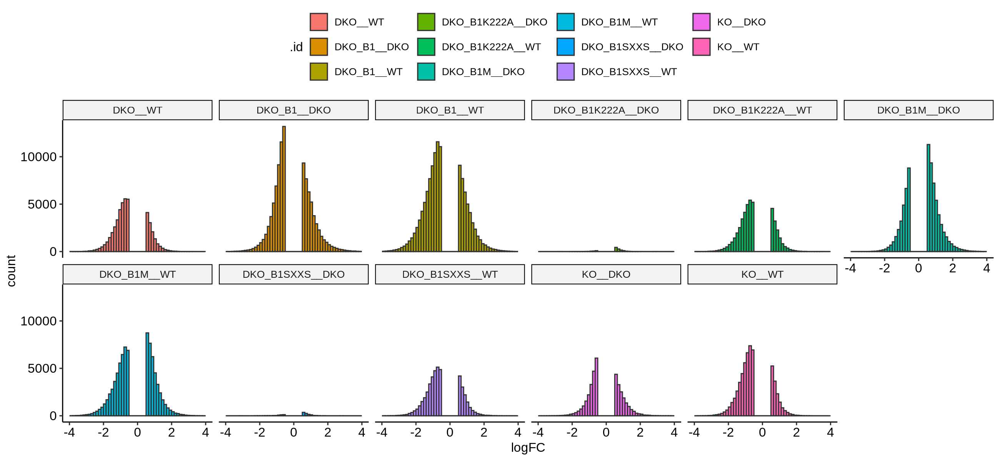

In [278]:
##### mar

# based on m value
cut = .5
options(repr.plot.width = 13, repr.plot.height = 6, repr.plot.res = 200)
#hsa_dmp_dt[, .id := factor(.id, levels = colnames(contMatrix)) ]
plotdat1 = hsa_dmp_dt[ logFC > cut  & adj.P.Val < 0.05 & !is.na(probe_grp2) & probe_grp2 == 'int', ]
plotdat2 = hsa_dmp_dt[ logFC < -cut & adj.P.Val < 0.05 & !is.na(probe_grp2) & probe_grp2 == 'int', ]
dim(plotdat1) 
dim(plotdat2) 
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('.id', nrow = 2)
fname = '~/WenhuoHu/plot/mar/k562_dmp_int_probes.pdf'
ggsave(gg, file = fname, width = 13, height = 6)
gg


## top probes all genotype

[1] 5144   65

[1] 9857   65

Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 10 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 11 rows containing missing values or values outside the scale range (`geom_bar()`).”
Warning message:
“Removed 11 rows containing missing values or values outside the scale range (`geom_bar()`).”


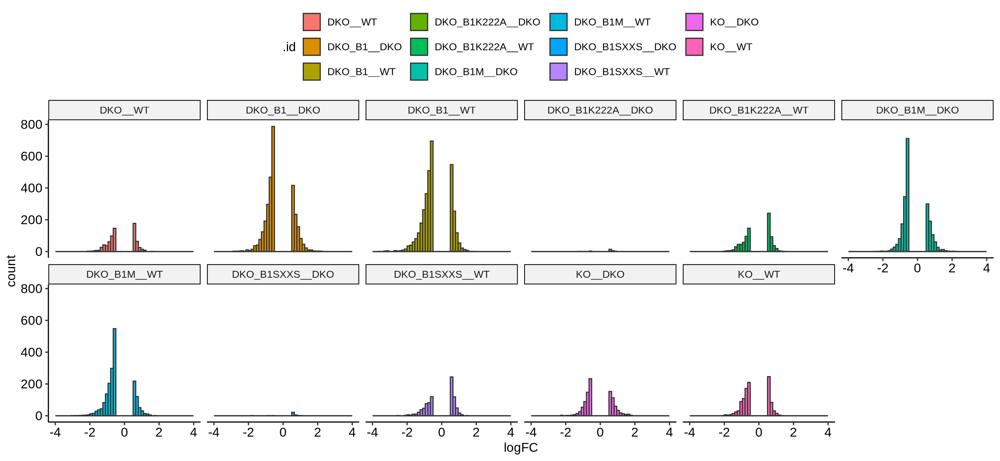

In [280]:
# based on m value
cut = .5
options(repr.plot.width = 13, repr.plot.height = 6, repr.plot.res = 200)
#hsa_dmp_dt[, .id := factor(.id, levels = colnames(contMatrix)) ]
plotdat1 = hsa_dmp_dt[ logFC > cut  & adj.P.Val < 0.05 & !is.na(probe_grp) & probe_grp == 'top', ]
plotdat2 = hsa_dmp_dt[ logFC < -cut & adj.P.Val < 0.05 & !is.na(probe_grp) & probe_grp == 'top', ]
dim(plotdat1) 
dim(plotdat2) 
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('.id', nrow = 2)
#fname = '~/WenhuoHu/plot/human_dmp.pdf'
#ggsave(gg, file = fname, width = 13, height = 6)
gg


[1] 3679    9

[1] 6203    9

Warning message:
"Removed 11 rows containing missing values or values outside the scale range (`geom_bar()`)."
Warning message:
"Removed 11 rows containing missing values or values outside the scale range (`geom_bar()`)."


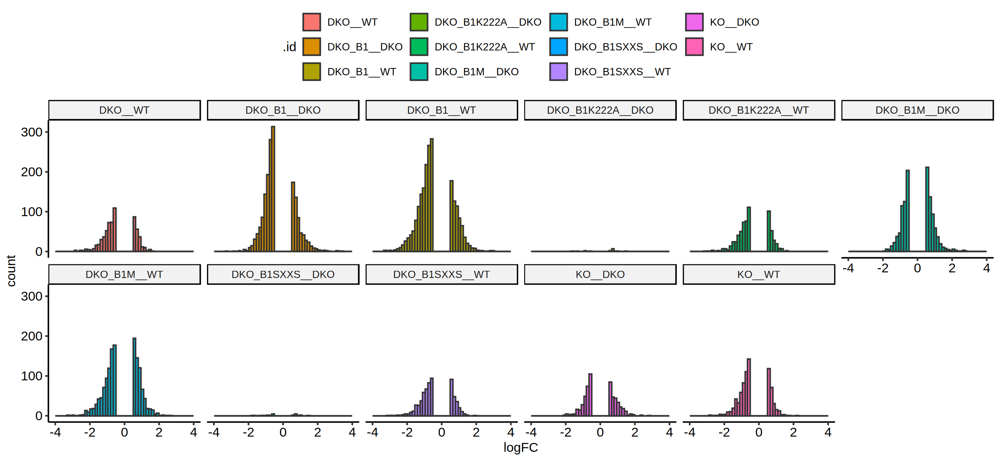

In [183]:
# based on m value
cut = .5
options(repr.plot.width = 13, repr.plot.height = 6, repr.plot.res = 200)
#hsa_dmp_dt[, .id := factor(.id, levels = colnames(contMatrix)) ]
plotdat1 = hsa_dmp_dt[ logFC > cut  & adj.P.Val < 0.05 & !is.na(probe_grp) & probe_grp == 'int', ]
plotdat2 = hsa_dmp_dt[ logFC < -cut & adj.P.Val < 0.05 & !is.na(probe_grp) & probe_grp == 'int', ]
dim(plotdat1) 
dim(plotdat2) 
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('.id', nrow = 2)
#fname = '~/WenhuoHu/plot/human_dmp.pdf'
#ggsave(gg, file = fname, width = 13, height = 6)
gg


[1] 15070     9

[1] 8400    9

Warning message:
"Removed 11 rows containing non-finite outside the scale range (`stat_bin()`)."
Warning message:
"Removed 11 rows containing missing values or values outside the scale range (`geom_bar()`)."
Warning message:
"Removed 11 rows containing missing values or values outside the scale range (`geom_bar()`)."


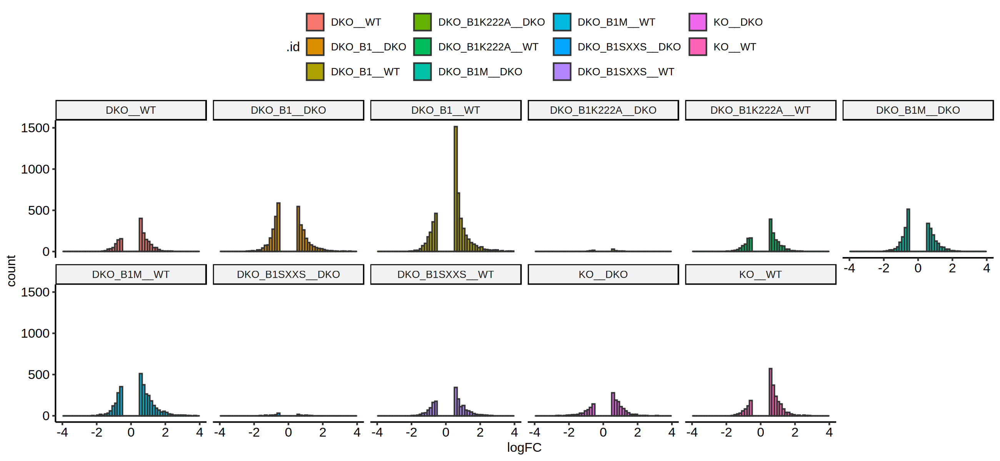

In [184]:
# based on m value
cut = .5
options(repr.plot.width = 13, repr.plot.height = 6, repr.plot.res = 200)
#hsa_dmp_dt[, .id := factor(.id, levels = colnames(contMatrix)) ]
plotdat1 = hsa_dmp_dt[ logFC > cut  & adj.P.Val < 0.05 & !is.na(probe_grp) & probe_grp == 'bot', ]
plotdat2 = hsa_dmp_dt[ logFC < -cut & adj.P.Val < 0.05 & !is.na(probe_grp) & probe_grp == 'bot', ]
dim(plotdat1) 
dim(plotdat2) 
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('.id', nrow = 2)
#fname = '~/WenhuoHu/plot/human_dmp.pdf'
#ggsave(gg, file = fname, width = 13, height = 6)
gg


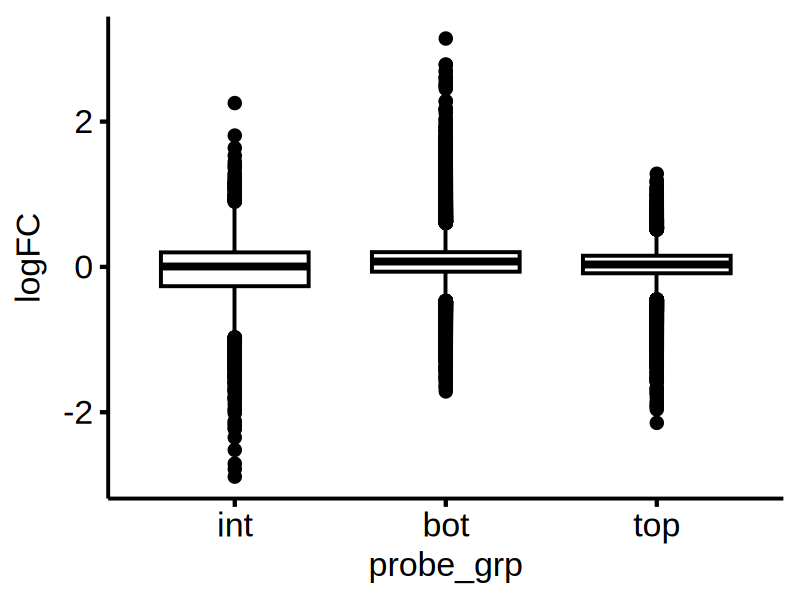

In [178]:
# how these probe group changes the methylation levels with b1 ko
plotdat = hsa_dmp_dt[!is.na(probe_grp) & .id == 'KO__WT', ]
ggboxplot(plotdat, x = 'probe_grp', y = 'logFC')

In [227]:
head(hsa_dmp_dt) 
head(gpl33022_dt)

.id,rn,logFC,AveExpr,t,P.Value,adj.P.Val,B,probe_grp,probe_grp2
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
KO__WT,cg26524256_TC11,-3.377215,-0.8469927,-31.35870,4.764440e-27,4.431286e-21,48.64726,NA,int
KO__WT,cg15701979_BC21,2.572078,-0.4105545,28.75086,8.690863e-26,4.041577e-20,46.34768,NA,bot
KO__WT,cg07235511_BC21,-3.523661,-2.7785288,-28.17089,1.713389e-25,5.311934e-20,45.79775,NA,int
KO__WT,cg14648688_TC21,-2.595118,-2.8165511,-27.66353,3.135804e-25,7.291332e-20,45.30430,NA,int
KO__WT,cg18477666_TC21,-2.066124,-2.4339522,-26.92760,7.674296e-25,1.427534e-19,44.56727,NA,int
KO__WT,cg17763682_BC21,-3.438624,-3.1611567,-26.77115,9.309292e-25,1.443057e-19,44.40725,NA,int


ID,SPOT_ID,Name,AddressA_ID,AlleleA_ProbeSeq,AddressB_ID,AlleleB_ProbeSeq,Next_Base,Color_Channel,col,⋯,Encode_CisReg_Site_Evid,OpenChromatin_NAME,OpenChromatin_Evidence_Count,Methyl450_Loci,Methyl27_Loci,EPICv1_Loci,Manifest_probe_match,SNP_ID,SNP_DISTANCE,SNP_MinorAlleleFrequency
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
cg25324105_BC11,cg25324105_BC11,cg25324105,1754126,ATTTATAAACTAATAACCCAAAATACATTTCCCAAAAACCTTCACAACCA,99753217,GTTTATAAACTAATAACCCGAAATACATTTCCCAAAAACCTTCGCGACCG,A,Red,R,⋯,1;18;46;22,Het;Quies;TssA;TxWk;TssFlnkU;ZNF/Rpts;TssFlnk;Tx;TssBiv;EnhA2;TssFlnkD,261;34;540;408;120;186;50;42;12;3;7,cg25324105,,cg25324105,TRUE,,,
cg25383568_TC11,cg25383568_TC11,cg25383568,79792482,AAACCAAAAAAATAACAAACTACTCACCTTATCAAAATAATTAAAAAACA,69667133,AAACCGAAAAAATAACAAACTACTCACCTTATCGAAATAATTAAAAAACG,C,Grn,G,⋯,5;1;81,Quies;EnhG1;Tx;TxWk;ReprPCWk;EnhG2;ReprPC;EnhA1;EnhA2,689;198;536;49;138;49;1;1;2,cg25383568,,cg25383568,TRUE,rs1394936871;rs1415497516;rs1488301961;rs192382222;rs374240053;rs377626307;rs539072997;rs760946329;rs765587455;rs768749756;rs777566567;rs949297283,39;44;27;1;48;45;16;0;40;38;51;37,0;0;0;0;0;0;0;0;0;0;0;0
cg25455143_BC11,cg25455143_BC11,cg25455143,80699190,ATAAAAAAAAATATACAACTAATCCCCCTTTTTCCCACAACTCAAAATCA,7659147,ATAAAAAAAAATATACGACTAATCCCCCTTTTTCCCACAACTCGAAATCG,T,Red,R,⋯,,TssFlnkU;TssFlnkD;TssA;TssFlnk;EnhWk;EnhA1;EnhG2;TxWk,1215;124;240;40;16;14;10;4,cg25455143,,cg25455143,TRUE,rs1047130013;rs1051458573;rs1235675713;rs1330158019;rs1372890585;rs181027148;rs35919258;rs563928941;rs72618597;rs745973733;rs899683679;rs913579702;rs920397045;rs926523552;rs941159426;rs982469986,51;34;25;31;29;41;1;33;8;28;26;4;39;24;9;23,0;0;0;0;0;0;0;0.002;0.041;0;0;0;0;0;0;0
cg25459778_BC11,cg25459778_BC11,cg25459778,60797262,AAAAATTTAAAACAAACAACAACAACCATATTAAAAACACATCAAAACCA,65710482,AAAAATTTAAAACAAACAACGACGACCATATTAAAAACGCGTCGAAACCG,C,Grn,G,⋯,67;20,TxWk;ReprPCWk;TssA;Quies;TssBiv;TssFlnk;EnhA2;EnhWk;Tx;EnhBiv;ReprPC,510;3;323;268;18;457;31;4;41;4;4,cg25459778,cg25459778,cg25459778,TRUE,rs1028295962;rs1042852826;rs1054305051;rs1163979757;rs1198001812;rs1272891563;rs1286657226;rs1299033407;rs1326019391;rs1332148215;rs1337457517;rs1360222555;rs1421713513;rs1423183448;rs1487797917;rs533763932;rs891630084;rs901281519;rs998695726,1;34;48;46;29;27;5;19;3;2;8;15;32;39;28;6;45;5;0,0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0
cg25487775_BC11,cg25487775_BC11,cg25487775,5799427,AAAAACAACCTAAAAAACAACCCCCTACCCTACTCTACAAAAAAAACACA,89606481,AAAAACAACCTAAAAAACAACCCCCTACCCTACTCTACAAAAAAAACGCG,A,Red,R,⋯,,EnhWk;Quies;TssFlnkU;TssBiv;TxWk;TssFlnkD;EnhA1;TssA;TssFlnk;EnhA2;ReprPCWk;EnhBiv;ReprPC;Tx;ZNF/Rpts;EnhG1;EnhG2;Het,356;89;254;75;188;325;186;6;25;133;3;9;3;2;1;4;3;1,cg25487775,,cg25487775,TRUE,rs1026366085;rs1044940275;rs1229309650;rs1257308158;rs1284032264;rs1286589749;rs1354547188;rs1473120976;rs558558303;rs889057000;rs907409584;rs949027946,12;31;1;40;9;2;0;51;41;18;22;38,0;0;0;0;0;0;0;0;0;0;0;0
cg25595446_BC11,cg25595446_BC11,cg25595446,65640459,AATAAAAATAACAACAACCAAAACCACAAACTACATCATAAAAATAAACA,39619855,AATAAAAATAACGACAACCGAAACCGCGAACTACATCATAAAAATAAACG,C,Grn,G,⋯,2;65;20,Quies;TxWk;TssA;EnhA2;Tx;ReprPCWk;TssFlnk;TssFlnkU;ReprPC,424;241;820;1;144;19;9;3;2,cg25595446,cg25595446,cg25595446,TRUE,rs1010805679;rs1033981140;rs1190261920;rs1330249664;rs1339967373;rs1376247430;rs1379324397;rs1428461806;rs368170311;rs371508595;rs374334189;rs539647606;rs543913812;rs557979749;rs576649607;rs745946763;rs754139419;rs757408833;rs758492716;rs769181104;rs779115593,48;0;15;44;51;16;49;27;42;29;26;50;21;40;24;31;39;36;30;22;32,0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0;0


In [351]:
hsa_dmp_dt[logFC > 0, updn := 'up'] 
hsa_dmp_dt[logFC < 0, updn := 'dn'] 
hsa_dmp_dt[, updn := factor(updn, levels = c('up', 'dn'))]
hsa_dmp_dt = hsa_dmp_dt[order(P.Value), ]
dim(hsa_dmp_dt) 
head(hsa_dmp_dt) 

#saved dmpt_dt


[1] 1260259      59

rn,.id,logFC,AveExpr,t,P.Value,adj.P.Val,B,ID,SPOT_ID,⋯,OpenChromatin_Evidence_Count,Methyl450_Loci,Methyl27_Loci,EPICv1_Loci,Manifest_probe_match,SNP_ID,SNP_DISTANCE,SNP_MinorAlleleFrequency,name,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<fct>
cg11418112,KO__DKO,3.287126,-1.78329326,40.82326,8.400113e-32,9.576381e-27,55.29182,cg11418112_TC21,cg11418112_TC21,⋯,1400;80;129;26;6;8;4;3;1;1;3;1;1,cg11418112,,cg11418112,TRUE,rs1039214762;rs1057303439;rs113864012;rs1243693977;rs1254753237;rs1436793199;rs1481449611;rs527493974;rs768879058;rs888184317;rs900632836;rs994964088,20;6;12;34;45;10;29;9;44;48;23;39,0;0;0.004;0;0;0;0;0.004;0;0;0;0,dmp_name_558791,up
cg16634661,DKO_B1K222A__DKO,-4.789178,0.04008265,-37.23801,2.149478e-30,2.450470e-25,48.95547,cg16634661_BC21,cg16634661_BC21,⋯,649;558;112;197;21;31;2;85;6;1;1,cg16634661,,cg16634661,TRUE,rs1018056446;rs1256452865;rs1481974086;rs575008128;rs61783061;rs760877755;rs941224101;rs957082965,1;6;28;23;29;36;21;1,0;0;0;0;0.020;0;0;0,dmp_name_805140,dn
cg16634661,DKO_B1SXXS__DKO,-4.713494,0.04008265,-36.64953,3.764597e-30,4.291754e-25,48.56911,cg16634661_BC21,cg16634661_BC21,⋯,649;558;112;197;21;31;2;85;6;1;1,cg16634661,,cg16634661,TRUE,rs1018056446;rs1256452865;rs1481974086;rs575008128;rs61783061;rs760877755;rs941224101;rs957082965,1;6;28;23;29;36;21;1,0;0;0;0;0.020;0;0;0,dmp_name_805141,dn
cg21833338,DKO_B1__DKO,3.221634,-1.00634146,32.38304,2.880943e-28,3.284361e-23,52.75194,cg21833338_TC21,cg21833338_TC21,⋯,65;298;281;330;385;137;40;102;21;1;1;2,,,cg21833338,FALSE,rs1003863856;rs1014807102;rs1023444483;rs1023871831;rs1171470399;rs1195090995;rs1250538412;rs1365477197;rs1438542286;rs1453608507;rs1454188574;rs1568331318;rs185052609;rs539953099;rs960621782;rs991926739,34;45;2;44;12;1;50;21;46;1;21;39;0;30;40;38,0;0;0;0;0;0;0;0;0;0;0;0;0.008;0;0;0,dmp_name_1017284,up
cg21833338,DKO_B1M__DKO,3.201605,-1.00634146,32.18172,3.581691e-28,4.083235e-23,52.11564,cg21833338_TC21,cg21833338_TC21,⋯,65;298;281;330;385;137;40;102;21;1;1;2,,,cg21833338,FALSE,rs1003863856;rs1014807102;rs1023444483;rs1023871831;rs1171470399;rs1195090995;rs1250538412;rs1365477197;rs1438542286;rs1453608507;rs1454188574;rs1568331318;rs185052609;rs539953099;rs960621782;rs991926739,34;45;2;44;12;1;50;21;46;1;21;39;0;30;40;38,0;0;0;0;0;0;0;0;0;0;0;0;0.008;0;0;0,dmp_name_1017285,up
cg16634661,DKO_B1K222A__WT,-4.907053,0.04008265,-31.15305,1.111710e-27,1.267383e-22,48.99729,cg16634661_BC21,cg16634661_BC21,⋯,649;558;112;197;21;31;2;85;6;1;1,cg16634661,,cg16634661,TRUE,rs1018056446;rs1256452865;rs1481974086;rs575008128;rs61783061;rs760877755;rs941224101;rs957082965,1;6;28;23;29;36;21;1,0;0;0;0;0.020;0;0;0,dmp_name_805144,dn


In [215]:
bb = c(seq(-5, -0.5, by = .12), seq(.5, 5, by = .12))

Warning message:
“Removed 35 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 14 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 11 rows containing missing values or values outside the scale range (`geom_bar()`).”
Warning message:
“Removed 11 rows containing missing values or values outside the scale range (`geom_bar()`).”
Warning message:
“Removed 35 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 14 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 11 rows containing missing values or values outside the scale range (`geom_bar()`).”
Warning message:
“Removed 11 rows containing missing values or values outside the scale range (`geom_bar()`).”


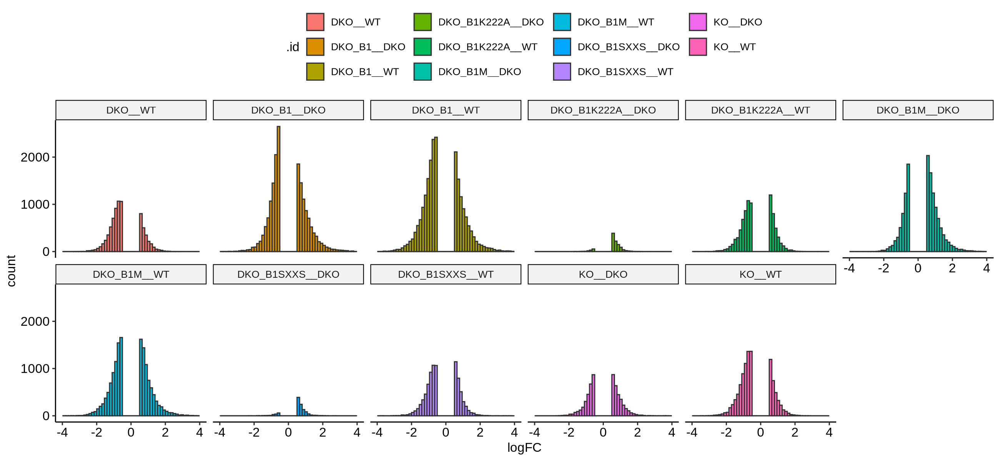

In [378]:
# based on m value
cut = .5
options(repr.plot.width = 13, repr.plot.height = 6, repr.plot.res = 200)
#hsa_dmp_dt[, .id := factor(.id, levels = colnames(contMatrix)) ]
plotdat1 = hsa_dmp_dt[ logFC > cut & adj.P.Val < 0.05, ]
plotdat2 = hsa_dmp_dt[ logFC < -cut & adj.P.Val < 0.05, ]
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('.id', nrow = 2)
fname = '~/WenhuoHu/plot/human_dmp.pdf'
ggsave(gg, file = fname, width = 13, height = 6)
gg


In [327]:
head(hsa_dmp_dt)

rn,.id,logFC,AveExpr,t,P.Value,adj.P.Val,B,probe_grp,probe_grp2,⋯,Manifest_probe_match,SNP_ID,SNP_DISTANCE,SNP_MinorAlleleFrequency,name,chr,start,end,tag,ID
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>
cg00000029_TC21,KO__WT,0.1630494,-0.409022,1.098651,2.794860e-01,5.427374e-01,-6.250833,NA,int,⋯,TRUE,rs1165080583;rs1172760128;rs1291251601;rs1365862490;rs1374911865;rs1379389793;rs1417637028,29;13;12;16;8;50;32,0;0;0;0;0;0;0,dmp_name_1,chr16,53434200,53434201,chr16_53434200_53434201,cg00000029_TC21
cg00000029_TC21,KO__DKO,-0.8222275,-0.409022,-6.785441,7.566745e-08,8.246591e-06,7.989594,NA,int,⋯,TRUE,rs1165080583;rs1172760128;rs1291251601;rs1365862490;rs1374911865;rs1379389793;rs1417637028,29;13;12;16;8;50;32,0;0;0;0;0;0;0,dmp_name_2,chr16,53434200,53434201,chr16_53434200_53434201,cg00000029_TC21
cg00000029_TC21,DKO__WT,0.9852769,-0.409022,6.638940,1.170745e-07,9.512364e-06,7.557799,NA,int,⋯,TRUE,rs1165080583;rs1172760128;rs1291251601;rs1365862490;rs1374911865;rs1379389793;rs1417637028,29;13;12;16;8;50;32,0;0;0;0;0;0;0,dmp_name_3,chr16,53434200,53434201,chr16_53434200_53434201,cg00000029_TC21
cg00000029_TC21,DKO_B1__DKO,-0.6392472,-0.409022,-5.275394,7.136332e-06,8.435632e-05,3.264589,NA,int,⋯,TRUE,rs1165080583;rs1172760128;rs1291251601;rs1365862490;rs1374911865;rs1379389793;rs1417637028,29;13;12;16;8;50;32,0;0;0;0;0;0;0,dmp_name_4,chr16,53434200,53434201,chr16_53434200_53434201,cg00000029_TC21
cg00000029_TC21,DKO_B1M__DKO,-0.8636409,-0.409022,-7.127205,2.751927e-08,1.155686e-06,8.846267,NA,int,⋯,TRUE,rs1165080583;rs1172760128;rs1291251601;rs1365862490;rs1374911865;rs1379389793;rs1417637028,29;13;12;16;8;50;32,0;0;0;0;0;0;0,dmp_name_5,chr16,53434200,53434201,chr16_53434200_53434201,cg00000029_TC21
cg00000029_TC21,DKO_B1K222A__DKO,-0.1533536,-0.409022,-1.265552,2.141066e-01,9.377295e-01,-5.703338,NA,int,⋯,TRUE,rs1165080583;rs1172760128;rs1291251601;rs1365862490;rs1374911865;rs1379389793;rs1417637028,29;13;12;16;8;50;32,0;0;0;0;0;0;0,dmp_name_6,chr16,53434200,53434201,chr16_53434200_53434201,cg00000029_TC21


In [326]:
# based on m value
cut = .5
options(repr.plot.width = 13, repr.plot.height = 6, repr.plot.res = 200)
#hsa_dmp_dt[, .id := factor(.id, levels = colnames(contMatrix)) ]
plotdat1 = hsa_dmp_dt[ logFC > cut  & adj.P.Val < 0.05 & .id == 'DKO_B1__DKO', ]
plotdat2 = hsa_dmp_dt[ logFC < -cut & adj.P.Val < 0.05 & .id == 'DKO_B1__DKO', ]
dim(plotdat1) 
dim(plotdat2) 


[1] 74621    65

[1] 87671    65

In [226]:
dim(hsa_dmp_dt[.id == 'KO__WT' & logFC > cut, ])

[1] 6096   64

Warning message:
“Removed 1 row containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 3 rows containing missing values or values outside the scale range (`geom_bar()`).”
Warning message:
“Removed 3 rows containing missing values or values outside the scale range (`geom_bar()`).”
Warning message:
“Removed 1 row containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 3 rows containing missing values or values outside the scale range (`geom_bar()`).”
Warning message:
“Removed 3 rows containing missing values or values outside the scale range (`geom_bar()`).”


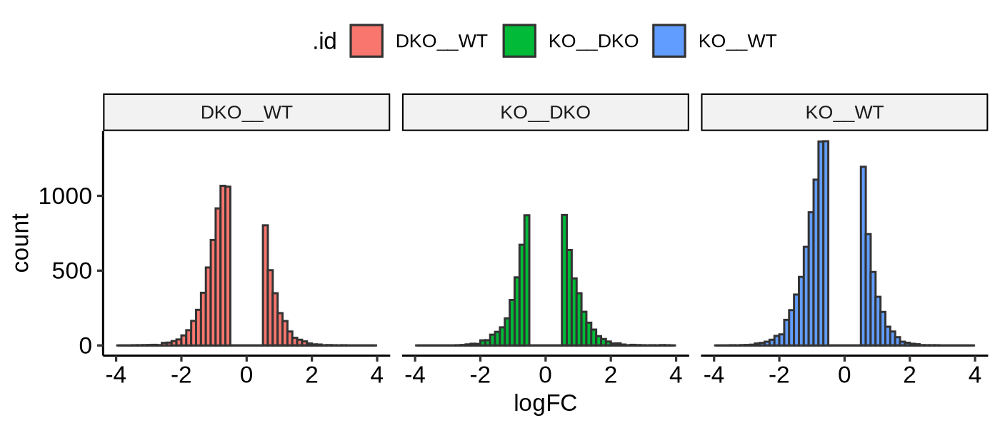

In [379]:
options(repr.plot.width = 7, repr.plot.height = 3, repr.plot.res = 200)
plotdat = hsa_dmp_dt[.id %in% c('KO__WT', 'DKO__WT', 'KO__DKO') & abs(logFC) > .5 & adj.P.Val < 0.05, ]
plotdat1 = plotdat[ logFC > cut & adj.P.Val < 0.05, ]
plotdat2 = plotdat[ logFC < -cut & adj.P.Val < 0.05, ]
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), col = 'grey20', binwidth = .15, boundary = cut) +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), col = 'grey20', binwidth = .15, boundary = -cut) +
theme_pubr() + xlim(-4, 4) + facet_wrap('.id', nrow = 1)
fname = '~/WenhuoHu/plot/human_dmp_selected_comb.pdf'
ggsave(gg, file = fname, width = 9, height = 3)
gg


Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


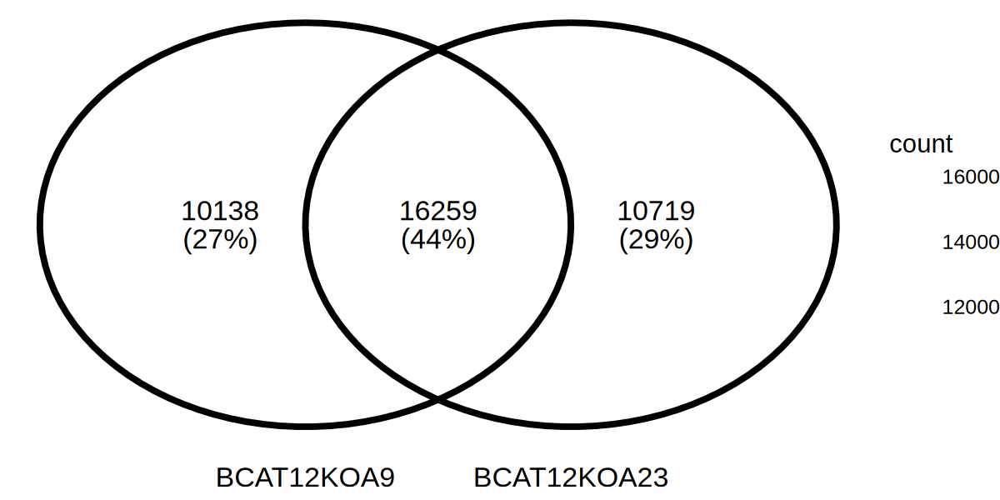

In [183]:
options(repr.plot.width = 6, repr.plot.height = 3, repr.plot.res = 200)
set.seed(20231214)
x <- list(BCAT12KOA9 = dmp_dt[.id == 'BCAT12KOA9' & abs(logFC) > 0 & adj.P.Val < 0.05, rn],
          BCAT12KOA23 = dmp_dt[.id == 'BCAT12KOA23' & abs(logFC) > 0 & adj.P.Val < 0.05, rn])
ggVennDiagram(x) + coord_flip() + scale_fill_gradient(low = "white", high = "white")


Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


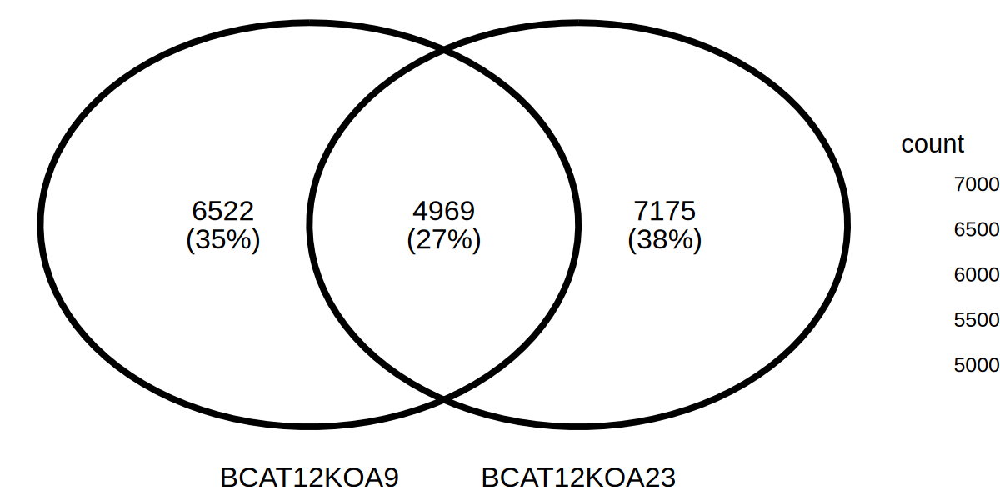

In [185]:
options(repr.plot.width = 6, repr.plot.height = 3, repr.plot.res = 200)
set.seed(20231214)
x <- list(BCAT12KOA9 = dmp_dt[.id == 'BCAT12KOA9' & logFC > 0 & adj.P.Val < 0.05, rn],
          BCAT12KOA23 = dmp_dt[.id == 'BCAT12KOA23' & logFC > 0 & adj.P.Val < 0.05, rn])
ggVennDiagram(x) + coord_flip() + scale_fill_gradient(low = "white", high = "white")


Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


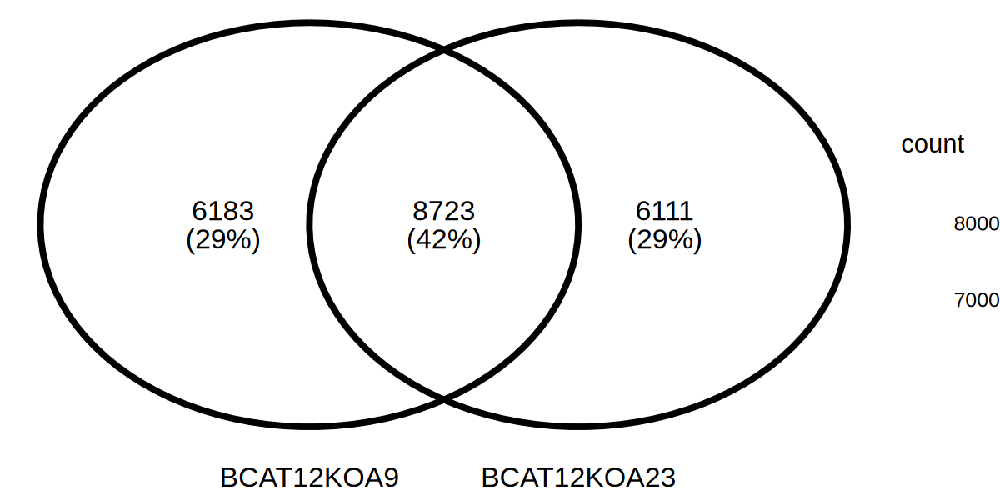

In [186]:
options(repr.plot.width = 6, repr.plot.height = 3, repr.plot.res = 200)
set.seed(20231214)
x <- list(BCAT12KOA9 = dmp_dt[.id == 'BCAT12KOA9' & logFC < 0 & adj.P.Val < 0.05, rn],
          BCAT12KOA23 = dmp_dt[.id == 'BCAT12KOA23' & logFC < 0 & adj.P.Val < 0.05, rn])
ggVennDiagram(x) + coord_flip() + scale_fill_gradient(low = "white", high = "white")


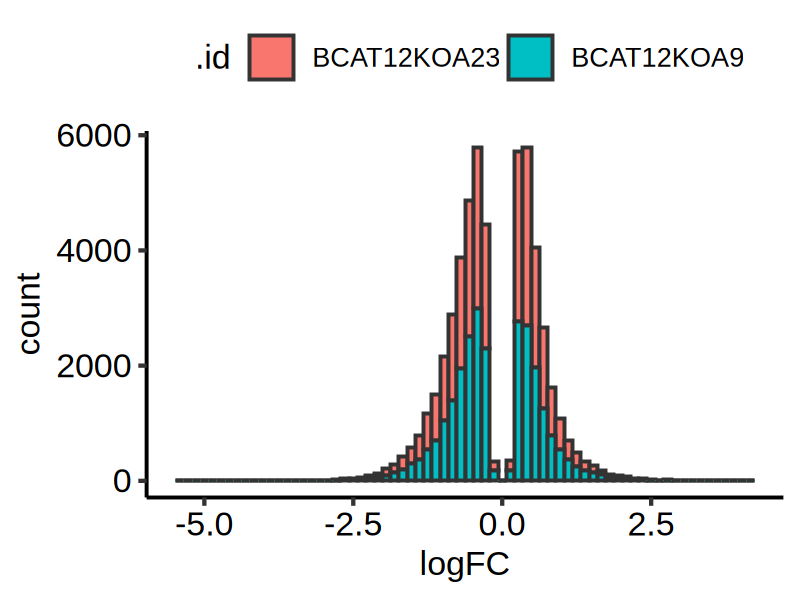

In [190]:
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 200)
ggplot(dmp_dt[.id %in% c('BCAT12KOA9', 'BCAT12KOA23') & adj.P.Val < 0.05, ], aes(x = logFC, fill = .id)) + geom_histogram(bins = 70, color = 'grey20') + theme_pubr()

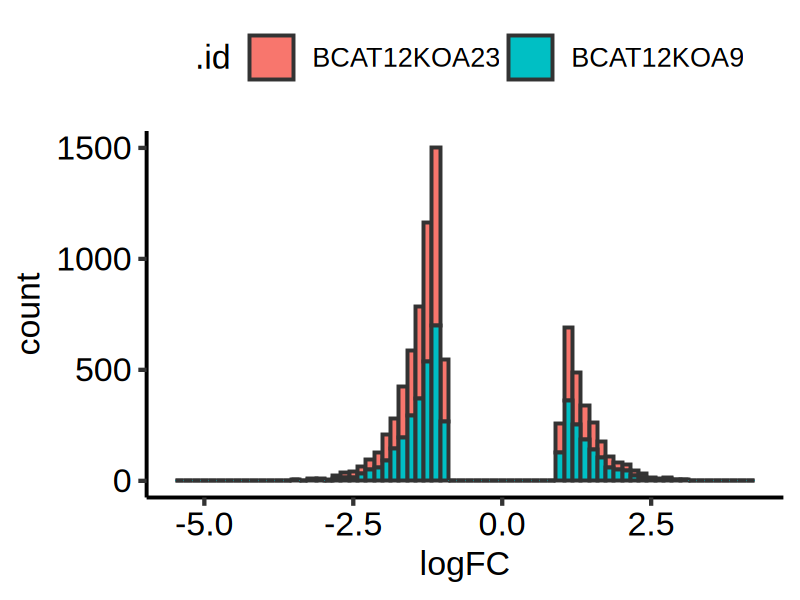

In [211]:
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 200)
ggplot(dmp_dt[.id %in% c('BCAT12KOA9', 'BCAT12KOA23') & adj.P.Val < 0.05 & abs(logFC) > 1, ], aes(x = logFC, fill = .id)) + geom_histogram(bins = 70, color = 'grey20') + theme_pubr()

Warning message:
"Removed 4 rows containing non-finite outside the scale range (`stat_bin()`)."


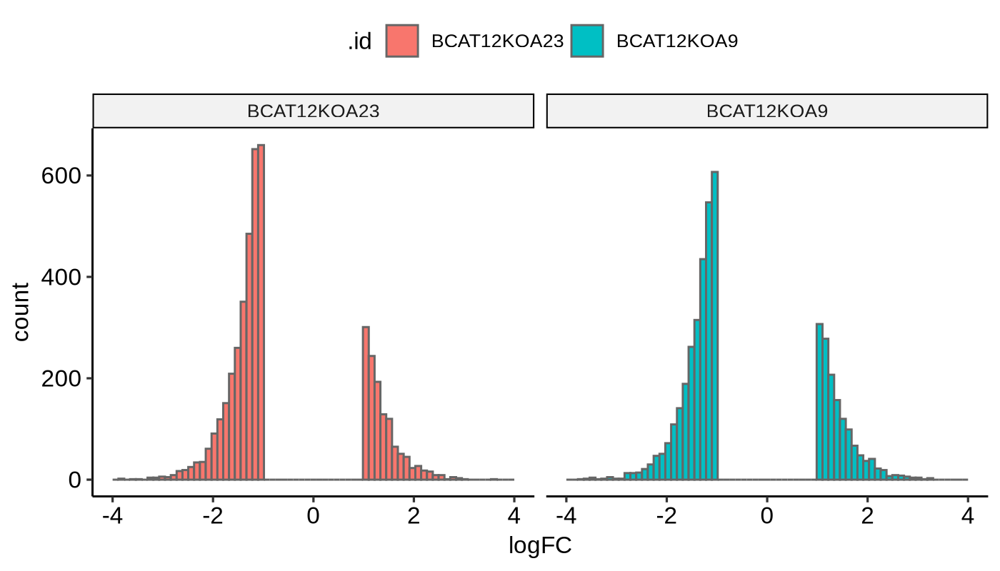

In [224]:
options(repr.plot.width = 7, repr.plot.height = 4, repr.plot.res = 200)
ggplot(dmp_dt[.id %in% c('BCAT12KOA9', 'BCAT12KOA23') & abs(logFC) > 1 & adj.P.Val < 0.05, ], aes(x = logFC, fill = .id)) + 
geom_histogram(bins = 70, color = 'grey40') + theme_pubr() + xlim(-4, 4) + facet_wrap('.id', nrow = 1)

In [204]:
head(dmp_dt)

.id,rn,logFC,AveExpr,t,P.Value,adj.P.Val,B
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
BCAT1KOC3,cg13458651,-2.724006,0.04630088,-48.65800,1.644672e-29,1.831030e-24,56.39472
BCAT1KOC3,cg08865423,-3.361116,0.14724307,-46.40452,6.457955e-29,3.594853e-24,55.19267
BCAT1KOC3,cg24623368,-3.365667,-0.08589684,-44.75082,1.837244e-28,6.818073e-24,54.26277
BCAT1KOC3,cg02695726,-3.065975,0.03459286,-43.32571,4.663989e-28,1.298116e-23,53.42660
BCAT1KOC3,cg00114159,-2.540433,-0.45438770,-42.53751,7.908853e-28,1.761001e-23,52.94952
BCAT1KOC3,cg09333631,-3.714187,-0.19751928,-41.75323,1.350369e-27,2.505633e-23,52.46407


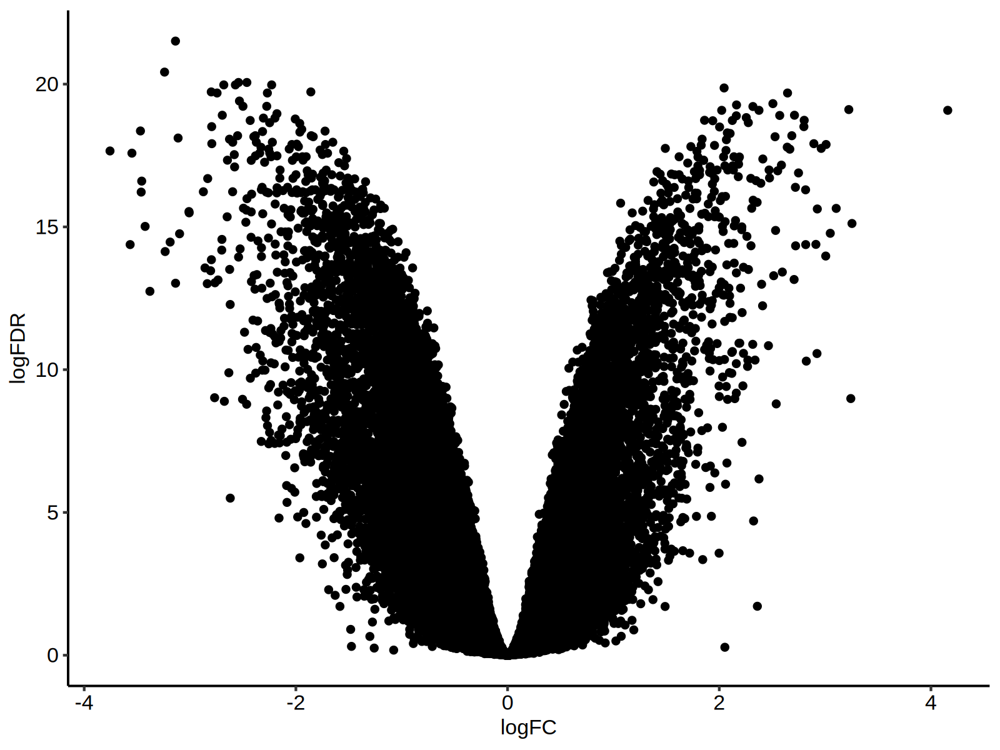

In [207]:
options(repr.plot.width = 8, repr.plot.height = 6, repr.plot.res = 200)
plotdat = dmp_dt[.id == 'BCAT12KOA9' & logFC > -5, ]
plotdat[, logFDR := -log(adj.P.Val, 10) ]
ggplot(plotdat, aes(logFC, logFDR)) + geom_point() + theme_pubr() 


In [201]:
dim(mVals2)

[1] 111331     39

In [235]:
tmp1 = dmp_dt[.id == 'BCAT12KOA9' & adj.P.Val < 0.05 & abs(logFC) > 1, rn]
tmp2 = dmp_dt[.id == 'BCAT12KOA23' & adj.P.Val < 0.05 & abs(logFC) > 1, rn]
tmp3 = dmp_dt[.id == 'BCAT1KOC3' & adj.P.Val < 0.05 & abs(logFC) > 1, rn]
tmp4 = dmp_dt[.id == 'BCAT1KOC11' & adj.P.Val < 0.05 & abs(logFC) > 1, rn]

In [236]:
length(intersect(tmp1, tmp2))
length(intersect(tmp3, tmp4))
length(intersect(intersect(tmp1, tmp2), intersect(tmp3, tmp4)))

[1] 1680

[1] 1969

[1] 699

In [244]:
tmp1 = dmp_dt[.id == 'BCAT12KOA9' & adj.P.Val < 0.05 & logFC < -1, rn]
tmp2 = dmp_dt[.id == 'BCAT12KOA23' & adj.P.Val < 0.05 & logFC< -1, rn]
tmp3 = dmp_dt[.id == 'BCAT1KOC3' & adj.P.Val < 0.05 & logFC  < -1, rn]
tmp4 = dmp_dt[.id == 'BCAT1KOC11' & adj.P.Val < 0.05 & logFC < -1, rn]

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
-1.53019 -0.26786 -0.10269 -0.10801  0.04768  1.76837 

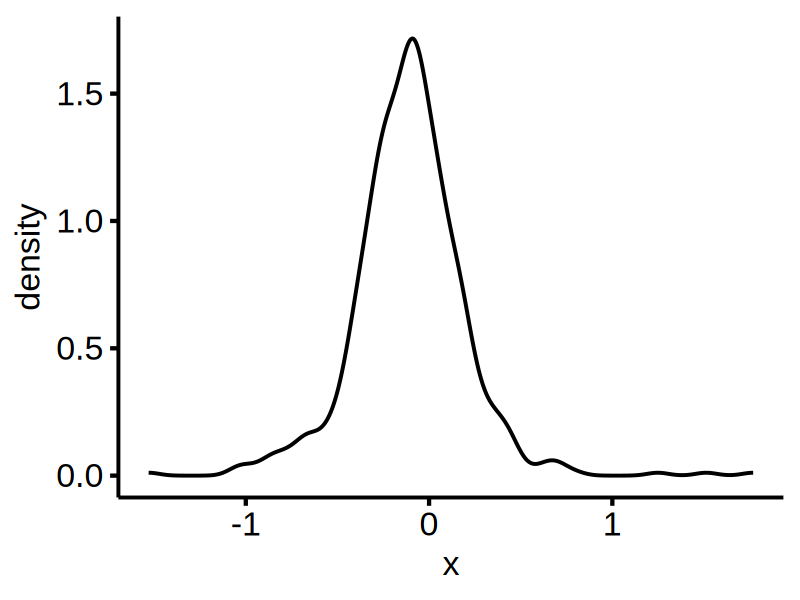

In [245]:
rn_sel = intersect(intersect(tmp1, tmp2), intersect(tmp3, tmp4))
plotdat = dmp_dt[rn %in% rn_sel & .id %in% c('BCAT1KOC3', 'BCAT1KOC11', 'BCAT12KOA9', 'BCAT12KOA23'), ]
plotdat[.id %in% c('BCAT1KOC3', 'BCAT1KOC11'), ko := 'SO']
plotdat[.id %in% c('BCAT12KOA9', 'BCAT12KOA23'), ko := 'DO']
plotdat[, tag := paste0(rn, '_', ko) ]
plotdat[, mean_logFC := mean(logFC), by = 'tag']
plotdat = plotdat[!duplicated(tag), ][order(rn), ]
plotdat2 = dcast(plotdat, rn ~ ko, value.var = 'mean_logFC')
plotdat2[, so_do := SO - DO ]
summary(plotdat2$so_do)
ggdensity(plotdat2$so_do) 


Warning message:
"Removed 7 rows containing non-finite values (`stat_boxplot()`)."


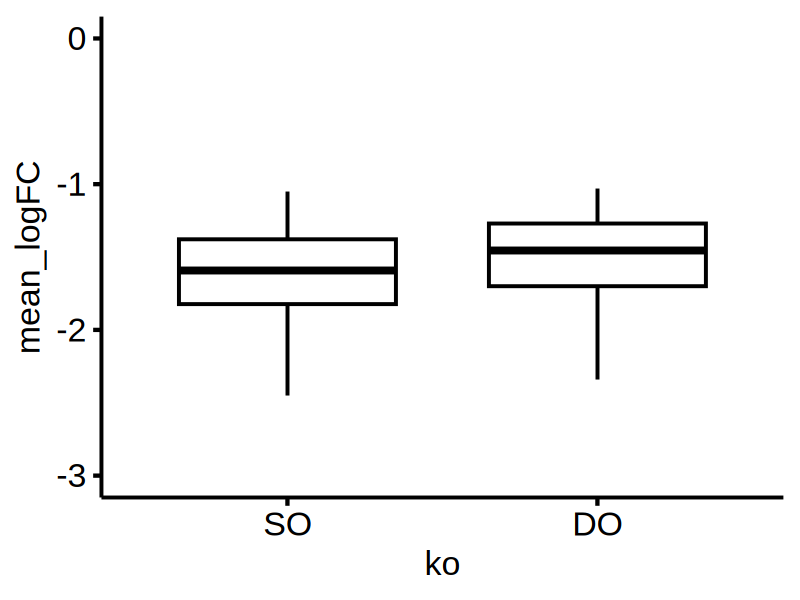

In [246]:
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 200)
ggboxplot(plotdat, x = 'ko', y = 'mean_logFC', outlier.shape = NA) + ylim(-3, 0)

In [248]:
t.test(plotdat2$DO, plotdat2$SO, paired = TRUE, alternative = "two.sided")



	Paired t-test

data:  plotdat2$DO and plotdat2$SO
t = 8.7705, df = 596, p-value < 2.2e-16
alternative hypothesis: true mean difference is not equal to 0
95 percent confidence interval:
 0.08382703 0.13220201
sample estimates:
mean difference 
      0.1080145 


In [254]:
id_sel = c('BCAT12KOA23', 'BCAT12KOA23_BCAT1', 'BCAT12KOA23_BCAT1Mito', 'BCAT12KOA23_BCAT1K222A', 'BCAT12KOA23_BCAT1SXXS')
id_sel = c('BCAT12KOA9', 'BCAT12KOA9_BCAT1', 'BCAT12KOA9_BCAT1Mito', 'BCAT12KOA9_BCAT1K222A', 'BCAT12KOA9_BCAT1SXXS')
id_sel
lapply(id_sel, function(xx){nrow(dmp_dt[.id == xx & abs(logFC) > 1 & adj.P.Val < 0.05, ])})
lapply(id_sel, function(xx){nrow(dmp_dt[.id == xx & logFC > 1 & adj.P.Val < 0.05, ])})
lapply(id_sel, function(xx){nrow(dmp_dt[.id == xx & logFC < -1 & adj.P.Val < 0.05, ])})


[1] "BCAT12KOA9"            "BCAT12KOA9_BCAT1"      "BCAT12KOA9_BCAT1Mito" 
[4] "BCAT12KOA9_BCAT1K222A" "BCAT12KOA9_BCAT1SXXS"

[[1]]
[1] 4222

[[2]]
[1] 6810

[[3]]
[1] 4166

[[4]]
[1] 189

[[5]]
[1] 217

[[1]]
[1] 1412

[[2]]
[1] 3441

[[3]]
[1] 3277

[[4]]
[1] 161

[[5]]
[1] 173

[[1]]
[1] 2810

[[2]]
[1] 3369

[[3]]
[1] 889

[[4]]
[1] 28

[[5]]
[1] 44

Warning message:
"Removed 2 rows containing non-finite values (`stat_bin()`)."


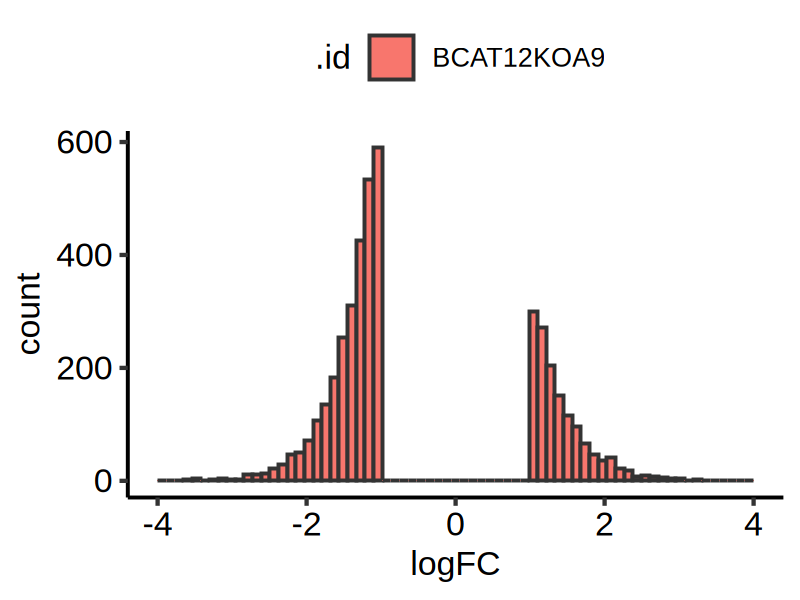

In [264]:
plotdat = dmp_dt[.id %in% id_sel[1] & adj.P.Val < 0.05 & abs(logFC) > 1, ]
ggplot(plotdat, aes(x = logFC, fill = .id)) + geom_histogram(bins = 70, color = 'grey20') + theme_pubr() + xlim(-4, 4)

Warning message:
"Removed 3 rows containing non-finite values (`stat_bin()`)."


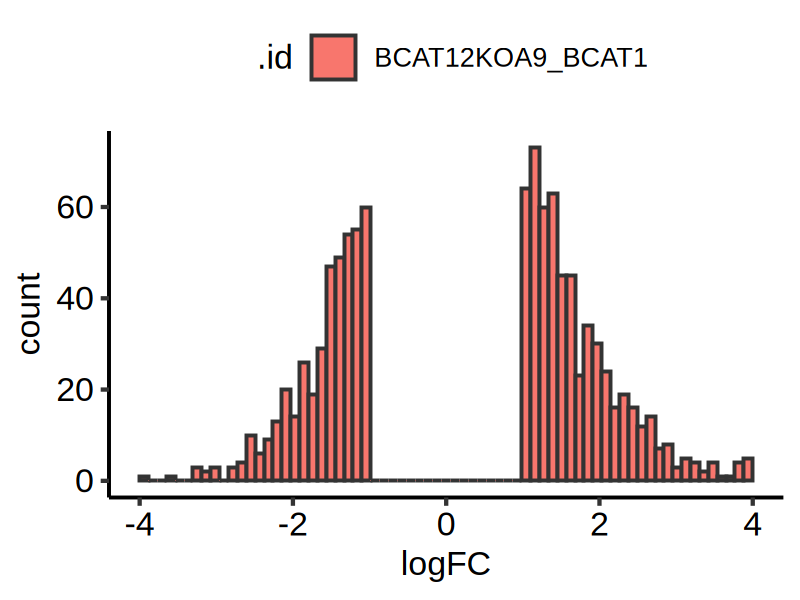

In [265]:
plotdat2 = dmp_dt[.id %in% id_sel[2] & rn %in% plotdat$rn & adj.P.Val < 0.05 & abs(logFC) > 1, ]
ggplot(plotdat2, aes(x = logFC, fill = .id)) + geom_histogram(bins = 70, color = 'grey20') + theme_pubr() + xlim(-4, 4)

In [261]:
plotdat3 = dmp_dt[.id %in% id_sel[1:2] & rn %in% plotdat$rn, ][order(rn), ]
head(plotdat3)


.id,rn,logFC,AveExpr,t,P.Value,adj.P.Val,B
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
BCAT12KOA9,cg00002660,1.81926251,-1.470843,15.6973461,8.974559e-16,1.135394e-13,26.020392
BCAT12KOA9_BCAT1,cg00002660,0.07351668,-1.470843,0.6343322,5.308019e-01,7.393585e-01,-7.534536
BCAT12KOA9,cg00006735,-1.56701879,-1.686172,-13.4625555,4.692070e-14,3.473224e-12,22.043364
BCAT12KOA9_BCAT1,cg00006735,-1.66644908,-1.686172,-14.3167799,9.784083e-15,4.207307e-13,23.503576
BCAT12KOA9,cg00012386,-1.19777007,-1.625246,-16.4421744,2.647932e-16,3.990258e-14,27.242738
BCAT12KOA9_BCAT1,cg00012386,-0.14440427,-1.625246,-1.9822838,5.692615e-02,1.622084e-01,-5.838128


Warning message:
"Removed 1 rows containing non-finite values (`stat_bin()`)."
Warning message:
"Removed 13 rows containing non-finite values (`stat_bin()`)."


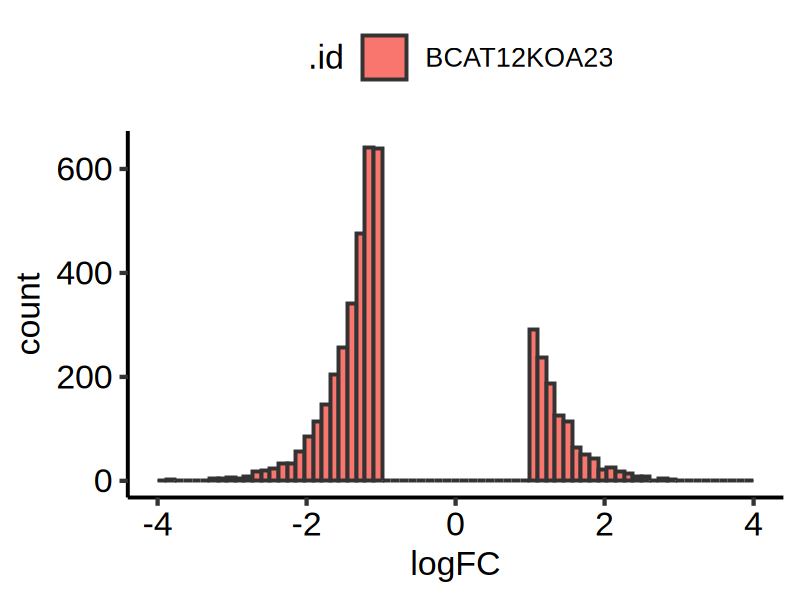

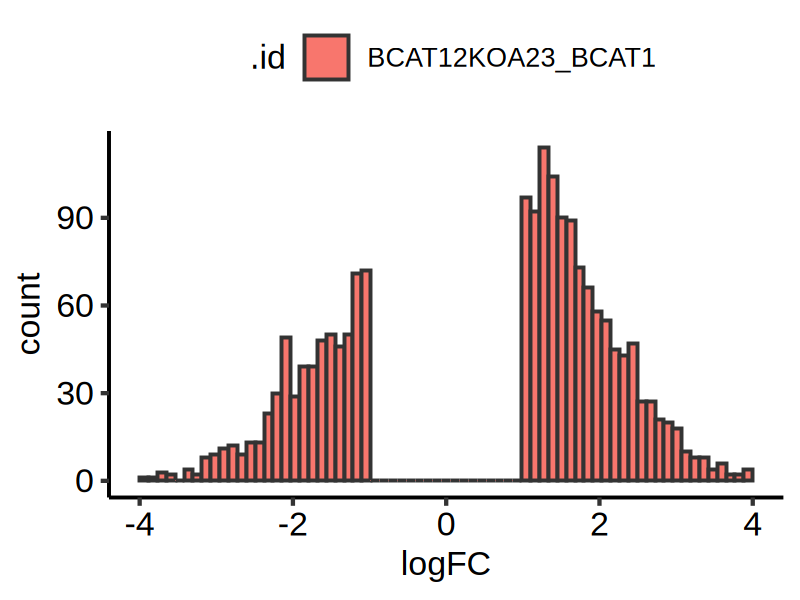

In [266]:
id_sel = c('BCAT12KOA9', 'BCAT12KOA9_BCAT1', 'BCAT12KOA9_BCAT1Mito', 'BCAT12KOA9_BCAT1K222A', 'BCAT12KOA9_BCAT1SXXS')
id_sel = c('BCAT12KOA23', 'BCAT12KOA23_BCAT1', 'BCAT12KOA23_BCAT1Mito', 'BCAT12KOA23_BCAT1K222A', 'BCAT12KOA23_BCAT1SXXS')
plotdat = dmp_dt[.id %in% id_sel[1] & adj.P.Val < 0.05 & abs(logFC) > 1, ]
ggplot(plotdat, aes(x = logFC, fill = .id)) + geom_histogram(bins = 70, color = 'grey20') + theme_pubr() + xlim(-4, 4)
plotdat2 = dmp_dt[.id %in% id_sel[2] & rn %in% plotdat$rn & adj.P.Val < 0.05 & abs(logFC) > 1, ]
ggplot(plotdat2, aes(x = logFC, fill = .id)) + geom_histogram(bins = 70, color = 'grey20') + theme_pubr() + xlim(-4, 4)

Warning message:
"Removed 52 rows containing non-finite outside the scale range (`stat_bin()`)."


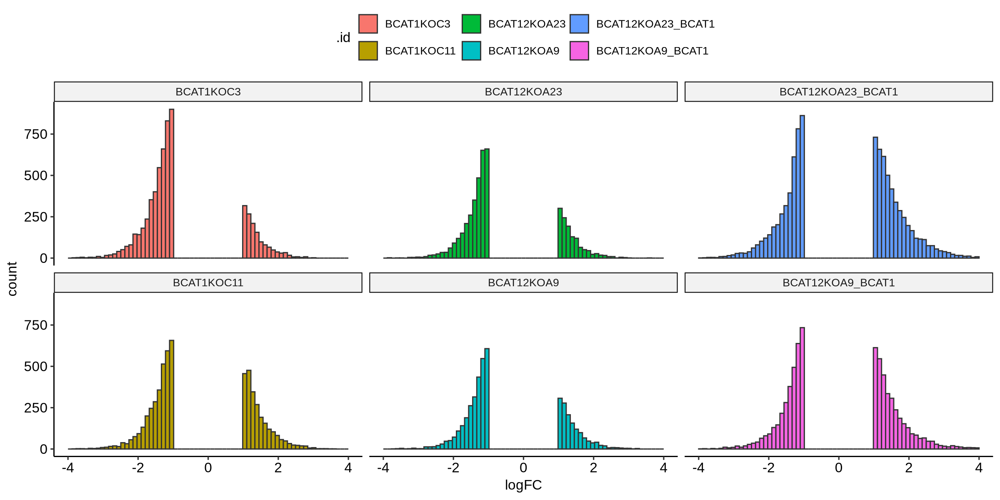

In [217]:
id_sel = c('BCAT1KOC3', 'BCAT1KOC11', 'BCAT12KOA23', 'BCAT12KOA9', 'BCAT12KOA23_BCAT1', 'BCAT12KOA9_BCAT1')
plotdat = dmp_dt[.id %in% id_sel & adj.P.Val < 0.05 & abs(logFC) > 1, ]
plotdat[, .id := factor(.id, levels = id_sel)]
options(repr.plot.width = 12, repr.plot.height = 6, repr.plot.res = 200)
ggplot(plotdat, aes(x = logFC, fill = .id)) + geom_histogram(bins = 70, color = 'grey20') + theme_pubr() + xlim(-4, 4) + facet_wrap(~ .id, nrow = 2, dir = 'v')

In [234]:
colnames(contMatrix)

[1] "BCAT1KOC3"                  "BCAT1KOC11"                 "BCAT12KOA9"                 "BCAT12KOA23"                "BCAT12KOA9_BCAT1"          
 [6] "BCAT12KOA9_BCAT1Mito"       "BCAT12KOA9_BCAT1K222A"      "BCAT12KOA9_BCAT1SXXS"       "BCAT12KOA23_BCAT1"          "BCAT12KOA23_BCAT1Mito"     
[11] "BCAT12KOA23_BCAT1K222A"     "BCAT12KOA23_BCAT1SXXS"      "BCAT12KOA9_BCAT1__WT"       "BCAT12KOA9_BCAT1Mito__WT"   "BCAT12KOA9_BCAT1K222A__WT" 
[16] "BCAT12KOA9_BCAT1SXXS__WT"   "BCAT12KOA23_BCAT1__WT"      "BCAT12KOA23_BCAT1Mito__WT"  "BCAT12KOA23_BCAT1K222A__WT" "BCAT12KOA23_BCAT1SXXS__WT"

In [ ]:
id_sel = c('BCAT1KOC3', 'BCAT1KOC11', 'BCAT12KOA23', 'BCAT12KOA9', 'BCAT12KOA23_BCAT1', 'BCAT12KOA9_BCAT1')
plotdat = dmp_dt[.id %in% id_sel & adj.P.Val < 0.05 & abs(logFC) > 1, ]
plotdat[, .id := factor(.id, levels = id_sel)]
options(repr.plot.width = 12, repr.plot.height = 6, repr.plot.res = 200)
ggplot(plotdat, aes(x = logFC, fill = .id)) + geom_histogram(bins = 70, color = 'grey20') + theme_pubr() + xlim(-4, 4) + facet_wrap(~ .id, nrow = 2, dir = 'v')


Warning message:
"Removed 80 rows containing non-finite values (`stat_bin()`)."
Warning message:
"Removed 80 rows containing non-finite values (`stat_bin()`)."


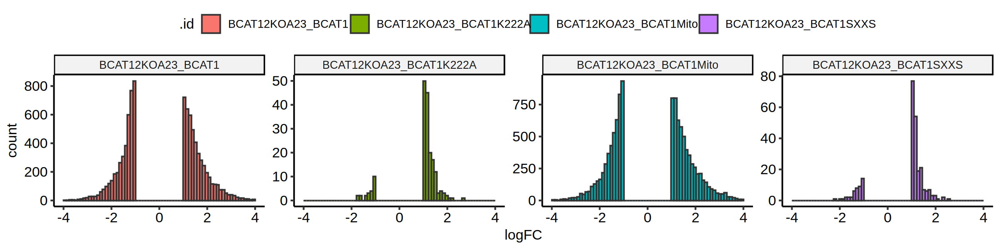

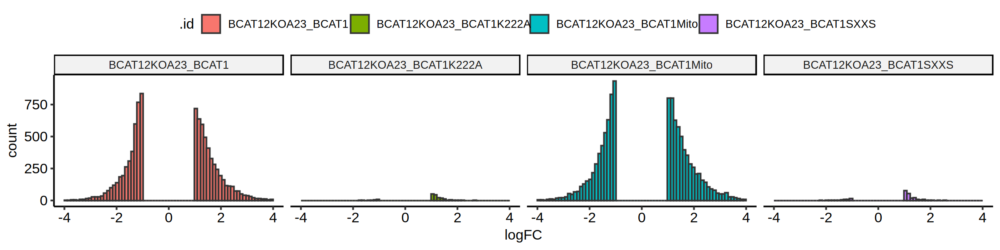

In [272]:
id_sel = c('BCAT12KOA9_BCAT1', 'BCAT12KOA9_BCAT1Mito', 'BCAT12KOA9_BCAT1K222A', 'BCAT12KOA9_BCAT1SXXS')
id_sel = c('BCAT12KOA23_BCAT1', 'BCAT12KOA23_BCAT1Mito', 'BCAT12KOA23_BCAT1K222A', 'BCAT12KOA23_BCAT1SXXS')
options(repr.plot.width = 12, repr.plot.height = 3, repr.plot.res = 200)
plotdat = dmp_dt[.id %in% id_sel & adj.P.Val < 0.05 & abs(logFC) > 1, ]
ggplot(plotdat, aes(x = logFC, fill = .id)) + geom_histogram(bins = 70, color = 'grey20') + theme_pubr() + xlim(-4, 4) + facet_wrap(~ .id, scale = 'free', nrow = 1)
ggplot(plotdat, aes(x = logFC, fill = .id)) + geom_histogram(bins = 70, color = 'grey20') + theme_pubr() + xlim(-4, 4) + facet_wrap(~ .id, nrow = 1)


In [ ]:
id_sel = c('BCAT12KOA23_BCAT1', 'BCAT12KOA23_BCAT1Mito', 'BCAT12KOA23_BCAT1K222A', 'BCAT12KOA23_BCAT1SXXS')
id_sel = c('BCAT12KOA9_BCAT1', 'BCAT12KOA9_BCAT1Mito', 'BCAT12KOA9_BCAT1K222A', 'BCAT12KOA9_BCAT1SXXS')
options(repr.plot.width = 12, repr.plot.height = 3, repr.plot.res = 200)
plotdat = dmp_dt[.id %in% id_sel & adj.P.Val < 0.05 & abs(logFC) > 1, ]
ggplot(plotdat, aes(x = logFC, fill = .id)) + geom_histogram(bins = 70, color = 'grey20') + theme_pubr() + xlim(-4, 4) + facet_wrap(~ .id, scale = 'free', nrow = 1)
ggplot(plotdat, aes(x = logFC, fill = .id)) + geom_histogram(bins = 70, color = 'grey20') + theme_pubr() + xlim(-4, 4) + facet_wrap(~ .id, nrow = 1)


Warning message:
"Removed 19 rows containing non-finite outside the scale range (`stat_bin()`)."


# mVals/bVals by genotype

In [328]:
dim(mVals)
head2(mVals)

[1] 930075     39

,208356090086_R01C01,208356090086_R02C01,208356090086_R03C01,208356090086_R04C01,208356090086_R05C01
cg00381604_BC11,-3.47235600,-3.3293972,-3.4841030,-3.83961687,-4.12811954
cg21870274_BC21,0.07926122,0.4255028,0.5797056,0.02345981,0.03387918
cg00002271_BC21,0.89110046,1.2301173,1.0661012,1.06135914,0.80747609


In [329]:
dim(mVals2)
head2(mVals2)

[1] 930075     38

,208356090086_R01C01,208356090086_R02C01,208356090086_R03C01,208356090086_R04C01,208356090086_R05C01
cg00381604_BC11,-3.47235600,-3.3293972,-3.4841030,-3.83961687,-4.12811954
cg21870274_BC21,0.07926122,0.4255028,0.5797056,0.02345981,0.03387918
cg00002271_BC21,0.89110046,1.2301173,1.0661012,1.06135914,0.80747609


In [332]:
dim(bVals2)
head2(bVals2)

[1] 930075     38

,208356090086_R01C01,208356090086_R02C01,208356090086_R03C01,208356090086_R04C01,208356090086_R05C01
cg00381604_BC11,0.08265155,0.09048213,0.08203629,0.06528865,0.05409531
cg21870274_BC21,0.51373147,0.57320413,0.59912517,0.50406519,0.50587055
cg00002271_BC21,0.64968702,0.70112323,0.67676949,0.67605005,0.63638307


In [333]:
head(targets)
dim(targets)

Sample_Name,Sample_Well,Sample_Plate,Sample_Group,Pool_ID,Sentrix_ID,Sentrix_Position,Sample Name,genotype,replication,sample_name,clone
<chr>,<chr>,<chr>,<chr>,<lgl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>
WT-1_3174159__methylepicv2,A01,Plate 01_08-13-24,Xu_832573,NA,208356090086,R01C01,WT-1,WT,1,208356090086_R01C01,wt
B1-C3-1_3174160__methylepicv2,B01,Plate 01_08-13-24,Xu_832573,NA,208356090086,R02C01,B1-C3-1,KO,1,208356090086_R02C01,C3
B1-C11-1_3174161__methylepicv2,C01,Plate 01_08-13-24,Xu_832573,NA,208356090086,R03C01,B1-C11-1,KO,1,208356090086_R03C01,C11
DKO-A9-1_3174162__methylepicv2,D01,Plate 01_08-13-24,Xu_832573,NA,208356090086,R04C01,DKO-A9-1,DKO,1,208356090086_R04C01,A9
A9-B1-1_3174163__methylepicv2,E01,Plate 01_08-13-24,Xu_832573,NA,208356090086,R05C01,A9-B1-1,DKO_B1,1,208356090086_R05C01,A9
A9-B1M-1_3174164__methylepicv2,F01,Plate 01_08-13-24,Xu_832573,NA,208356090086,R06C01,A9-B1M-1,DKO_B1M,1,208356090086_R06C01,A9


[1] 38 12

Bin width defaults to 1/30 of the range of the data. Pick better value with `binwidth`.
Bin width defaults to 1/30 of the range of the data. Pick better value with `binwidth`.


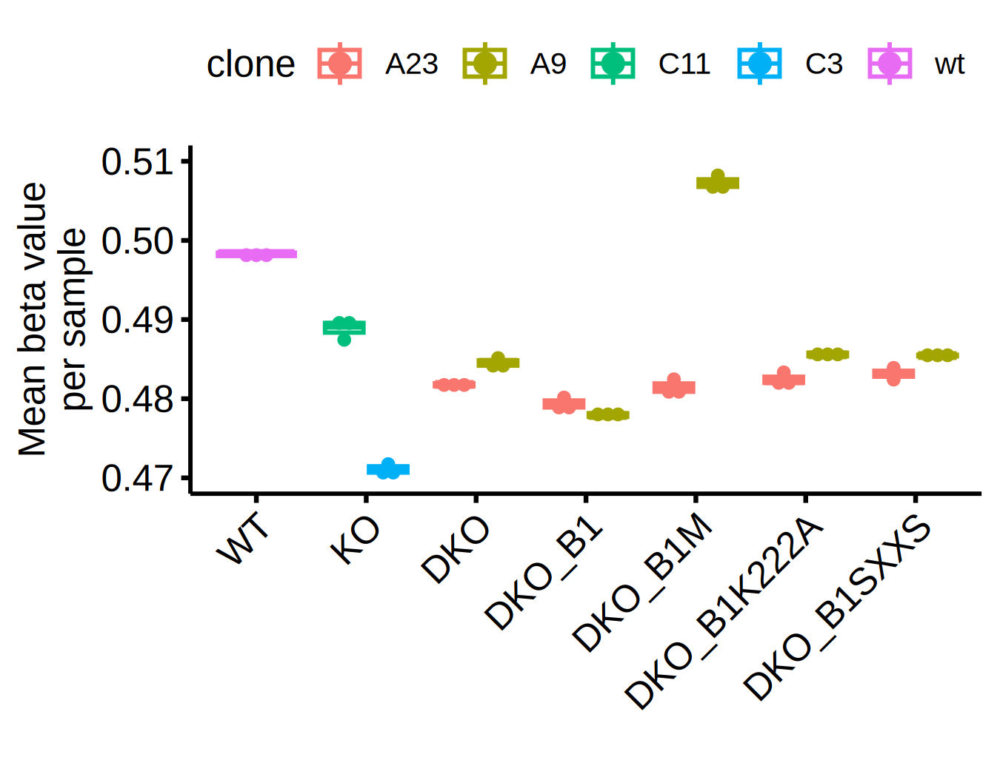

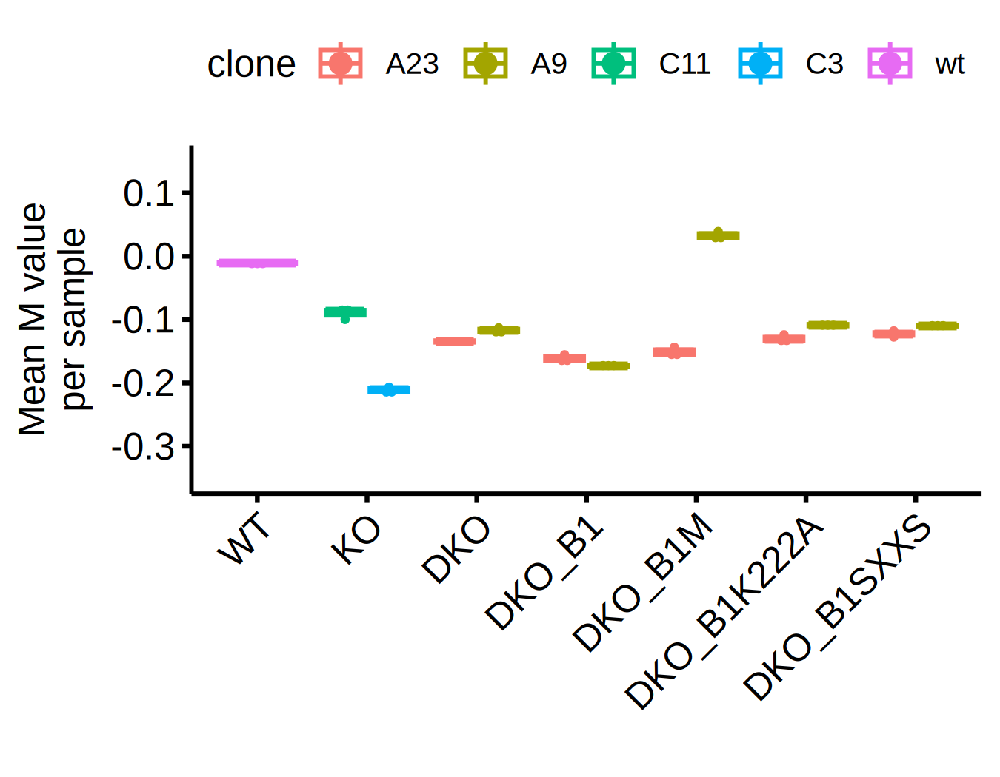

In [371]:
probe_sel = hsa_dmp_dt[!is.na(probe_grp2) & probe_grp2 == 'int', rn]
tmp = apply(bVals2[probe_sel, ], 2, mean)
targets$mean_bval = tmp[targets$sample_name]
tmp = apply(mVals2[probe_sel, ], 2, mean)
targets$mean_mval = tmp[targets$sample_name]
options(repr.plot.width = 4.5, repr.plot.height = 3.5, repr.plot.res = 300)
ggboxplot(targets, x = 'genotype', y = 'mean_bval', add = "dotplot", col = 'clone', xlab = '', ylab = 'Mean beta value\nper sample', ylim = c(0.47, 0.51)) + rotate_x_text(angle = 45) 
ggboxplot(targets, x = 'genotype', y = 'mean_mval', add = "dotplot", col = 'clone', xlab = '', ylab = 'Mean M value\nper sample', ylim = c(-0.35, 0.15)) + rotate_x_text(angle = 45) 

Bin width defaults to 1/30 of the range of the data. Pick better value with `binwidth`.
Bin width defaults to 1/30 of the range of the data. Pick better value with `binwidth`.


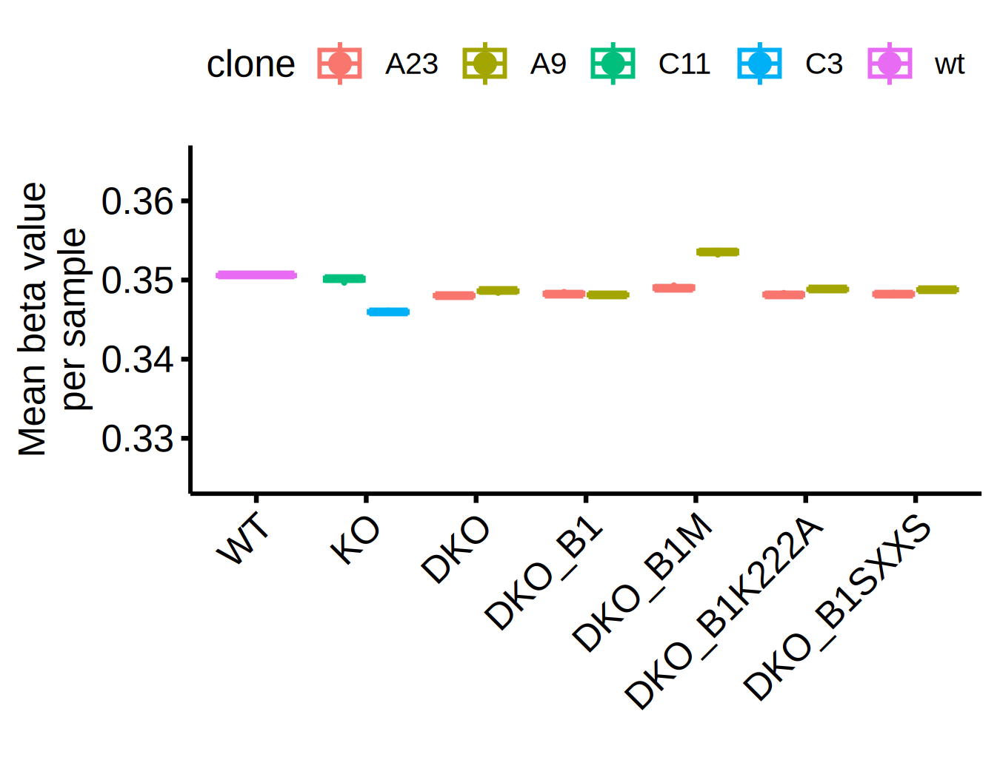

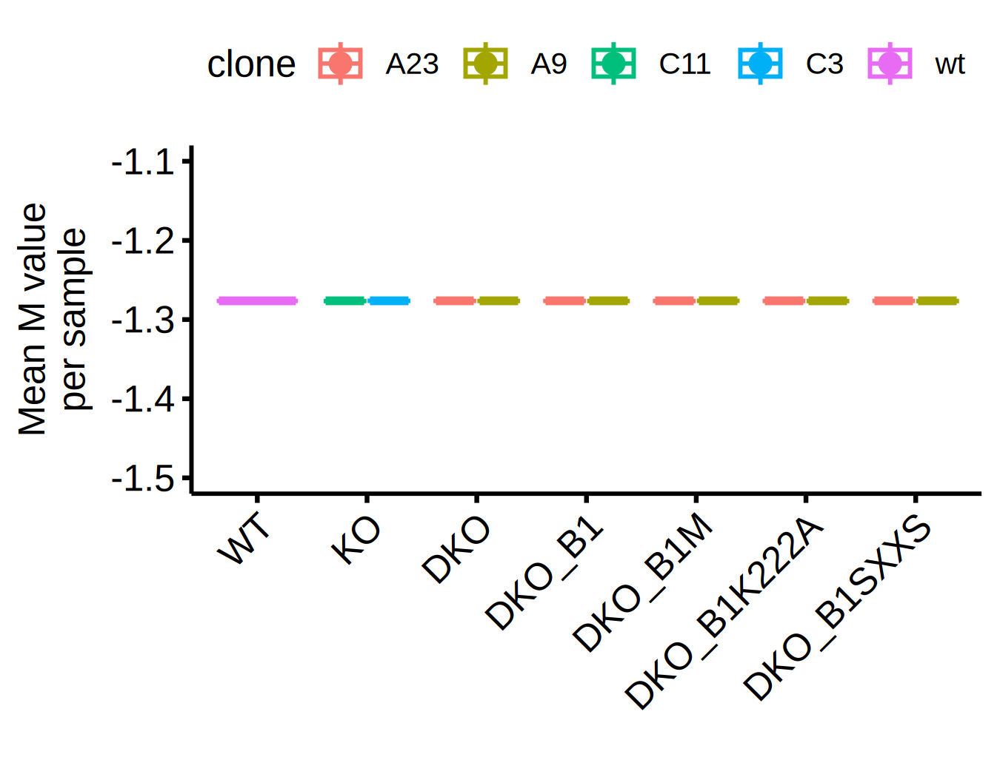

In [373]:
tmp = apply(bVals2, 2, mean)
targets$mean_bval = tmp[targets$sample_name]
tmp = apply(mVals2, 2, mean)
targets$mean_mval = tmp[targets$sample_name]
options(repr.plot.width = 4.5, repr.plot.height = 3.5, repr.plot.res = 300)
ggboxplot(targets, x = 'genotype', y = 'mean_bval', add = "dotplot", col = 'clone', xlab = '', ylab = 'Mean beta value\nper sample', ylim = c(0.325, 0.365)) + rotate_x_text(angle = 45) 
ggboxplot(targets, x = 'genotype', y = 'mean_mval', add = "dotplot", col = 'clone', xlab = '', ylab = 'Mean M value\nper sample', ylim = c(-1.5, -1.1)) + rotate_x_text(angle = 45) 

In [ ]:
dim(bV)

# RNASeq & DMC, based on Junhua

In [ ]:
# cloneA9_DKO_B1 vs cloneA9_DKO  : cloneA9_DKO_B1__cloneA9_DKO
# cloneA23_DKO_B1 vs cloneA23_DKO vs  : cloneA23_DKO_B1__cloneA23_DKO
# cloneA9_DKO_B1M vs cloneA9_DKO : cloneA9_DKO_B1M__cloneA9_DKO
# cloneA23_DKO_B1M vs cloneA23_DKO :  cloneA23_DKO_B1M__cloneA23_DKO 
# these comparisons all included
#comb[V1 == 'cloneA9_DKO' & V2 == 'cloneA9_DKO_B1', ]
#comb[V1 == 'cloneA23_DKO' & V2 == 'cloneA23_DKO_B1', ]
#comb[V1 == 'cloneA9_DKO' & V2 == 'cloneA9_DKO_B1M', ]
#comb[V1 == 'cloneA23_DKO' & V2 == 'cloneA23_DKO_B1M', ]

In [366]:
ex = 10000


In [426]:
deg_sel = 'cloneA9_DKO__cloneA9_DKO_B1'
gene_sel = deg_dt3[.id == deg_sel & padj < .1 & log2FoldChange < 0, ][!duplicated(rn), .(chr, start, end, strand)]
gene_sel[, tag := paste0(chr, '_', start, '_', end) ]
gene_sel[, start := start - ex ]
gene_sel[, end := end + ex ]
dim(gene_sel)


[1] 4289    5

In [ ]:
int_probes_gr = as.data.table(bead450[top_probes, .(chr, start, end)])

head(int_probes_gr)
int_probes_gr = makeGRangesFromDataFrame(int_probes_gr)
int_probes_ann = annotatePeak(peak = int_probes_gr, tssRegion = c(-3000, 3000),  TxDb = txdb, annoDb = "org.Hs.eg.db")
#plotAnnoPie(int_probes_ann)
#plotAnnoBar(int_probes_ann)
#plotDistToTSS(int_probes_ann)

# Perform GO enrichment analysis
goEnrichment <- enrichGO( gene =int_probes_ann@anno[abs(int_probes_ann@anno$distanceToTSS) < 3000,]$geneId, 
                         OrgDb = org.Hs.eg.db,  keyType = "ENTREZID", ont = "BP",  pvalueCutoff = 0.05 )

# Plot the enrichment results
options(repr.plot.width = 10, repr.plot.height = 5, repr.plot.res = 300)
dotplot(goEnrichment, showCategory = 10)



In [501]:
# validate gene expression 
deg_dt3[rn == 'BCAT1' & .id == 'cloneA9_DKO__cloneA9_DKO_B1', ]

rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,chr,start,end,strand,updn,batch
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>,<chr>,<fct>,<chr>
BCAT1,cloneA9_DKO__cloneA9_DKO_B1,41533.23,-7.250048,0.09866134,-73.48418,0,0,chr12,24810023,24949459,-,dn,batch2


In [543]:
plotdat = hsa_dmp_dt4[SYMBOL %in% gene_sel$rn & .id == 'cloneA9_DKO_B1__cloneA9_DKO' & !is.na(probe_grp2), ]
head(plotdat[order(P.Value), ], 2) 

ID,rn,.id,logFC,AveExpr,t,P.Value,adj.P.Val,B,probe_grp,⋯,start,end,tag,probe_grp2,SYMBOL,distanceToTSS,ann,geneStart,geneEnd,geneChr
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,⋯,<int>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<chr>,<int>,<int>,<int>
cg24450814_TC21,cg24450814_TC21,cloneA9_DKO_B1__cloneA9_DKO,4.519896,-0.04782976,56.86810,1.067672e-30,1.986030e-25,59.21657,NA,⋯,179260162,179260163,chr3_179260162_179260163,int,KCNMB3,-271,promoter,179239821,179259891,3
cg27647559_BC21,cg27647559_BC21,cloneA9_DKO_B1__cloneA9_DKO,-3.370210,-0.85457095,-49.91559,4.110626e-29,1.482605e-24,55.96581,NA,⋯,58653207,58653208,chr11_58653207_58653208,int,CNTF,30542,distal,58622665,58625733,11


In [545]:
hsa_dmp_dt4[ID == 'cg24450814_TC21', ]

ID,rn,.id,logFC,AveExpr,t,P.Value,adj.P.Val,B,probe_grp,⋯,start,end,tag,probe_grp2,SYMBOL,distanceToTSS,ann,geneStart,geneEnd,geneChr
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,⋯,<int>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<chr>,<int>,<int>,<int>
cg24450814_TC21,cg24450814_TC21,cloneA9_DKO_B1__cloneA9_DKO,4.51989624,-0.04782976,56.8680985,1.067672e-30,1.986030e-25,59.2165745,NA,⋯,179260162,179260163,chr3_179260162_179260163,int,KCNMB3,-271,promoter,179239821,179259891,3
cg24450814_TC21,cg24450814_TC21,cloneA23_DKO_B1__cloneA23_DKO,4.29420578,-0.04782976,54.0285228,4.484218e-30,1.489521e-25,58.2089943,NA,⋯,179260162,179260163,chr3_179260162_179260163,int,KCNMB3,-271,promoter,179239821,179259891,3
cg24450814_TC21,cg24450814_TC21,cloneA9_DKO_B1M__cloneA9_DKO,-1.61387720,-0.04782976,-20.3053616,2.131580e-18,2.549549e-16,32.0580104,NA,⋯,179260162,179260163,chr3_179260162_179260163,int,KCNMB3,-271,promoter,179239821,179259891,3
cg24450814_TC21,cg24450814_TC21,cloneA23_DKO_B1M__cloneA23_DKO,4.45011588,-0.04782976,55.9901411,1.651239e-30,3.490400e-26,59.2584752,NA,⋯,179260162,179260163,chr3_179260162_179260163,int,KCNMB3,-271,promoter,179239821,179259891,3
cg24450814_TC21,cg24450814_TC21,KO__WT,-1.57409227,-0.04782976,-5.7238986,1.837938e-06,7.683132e-05,4.8297509,NA,⋯,179260162,179260163,chr3_179260162_179260163,int,KCNMB3,-271,promoter,179239821,179259891,3
cg24450814_TC21,cg24450814_TC21,KO__DKO,-0.28525397,-0.04782976,-1.2703959,2.123970e-01,5.485185e-01,-5.9960213,NA,⋯,179260162,179260163,chr3_179260162_179260163,int,KCNMB3,-271,promoter,179239821,179259891,3
cg24450814_TC21,cg24450814_TC21,DKO__WT,-1.28883829,-0.04782976,-4.6866247,4.190239e-05,1.244011e-03,1.8125459,NA,⋯,179260162,179260163,chr3_179260162_179260163,int,KCNMB3,-271,promoter,179239821,179259891,3
cg24450814_TC21,cg24450814_TC21,DKO_B1__DKO,4.40705101,-0.04782976,19.6270690,2.294429e-20,4.293745e-17,36.2101265,NA,⋯,179260162,179260163,chr3_179260162_179260163,int,KCNMB3,-271,promoter,179239821,179259891,3
cg24450814_TC21,cg24450814_TC21,DKO_B1M__DKO,3.67806746,-0.04782976,16.3804966,6.699285e-18,7.417664e-15,30.6501226,NA,⋯,179260162,179260163,chr3_179260162_179260163,int,KCNMB3,-271,promoter,179239821,179259891,3


Bin width defaults to 1/30 of the range of the data. Pick better value with `binwidth`.


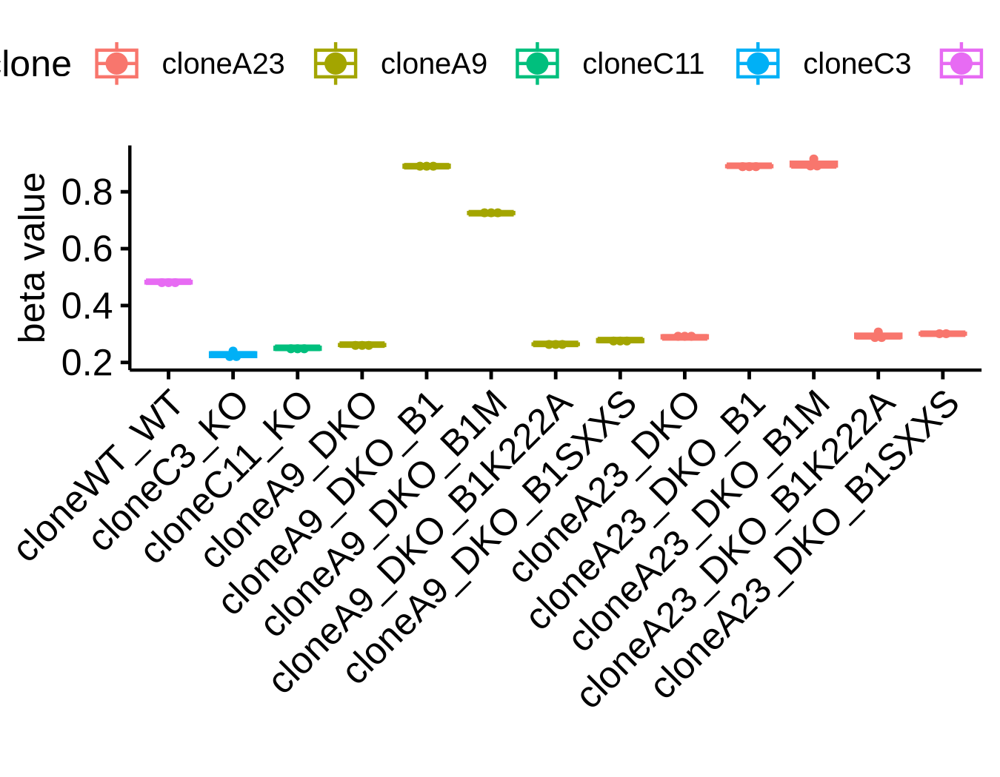

In [517]:
plotdat = as.data.table(bVals2['cg24450814_TC21',], keep.rownames = T)
plotdat = merge(plotdat, targets, by.x = 'V1', by.y = 'sample_name', all.x = T)
options(repr.plot.width = 4.5, repr.plot.height = 3.5, repr.plot.res = 300)
ggboxplot(plotdat, x = 'group2', y = 'V2', add = "dotplot", col = 'clone', xlab = '', ylab = 'beta value') + rotate_x_text(angle = 45) 
#cloneA9_DKO_B1__cloneA9_DKO

In [530]:
table(hsa_dmp_dt4$ann)


    distal downstream       exon   promoter        UTR 
   6134730      10635     421020    7041675     343065 

In [ ]:
## up

## up-regulated genes in cloneA23_DKO_B1M  vs cloneA23_DKO_B1

[1] 493998     71

Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(table(sign(plotdat$logFC), plotdat$probe_grp2)). In the next version, this warning will become an error.”


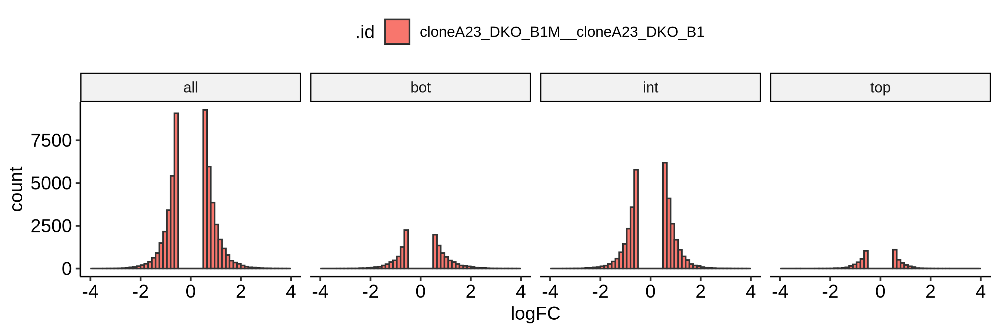

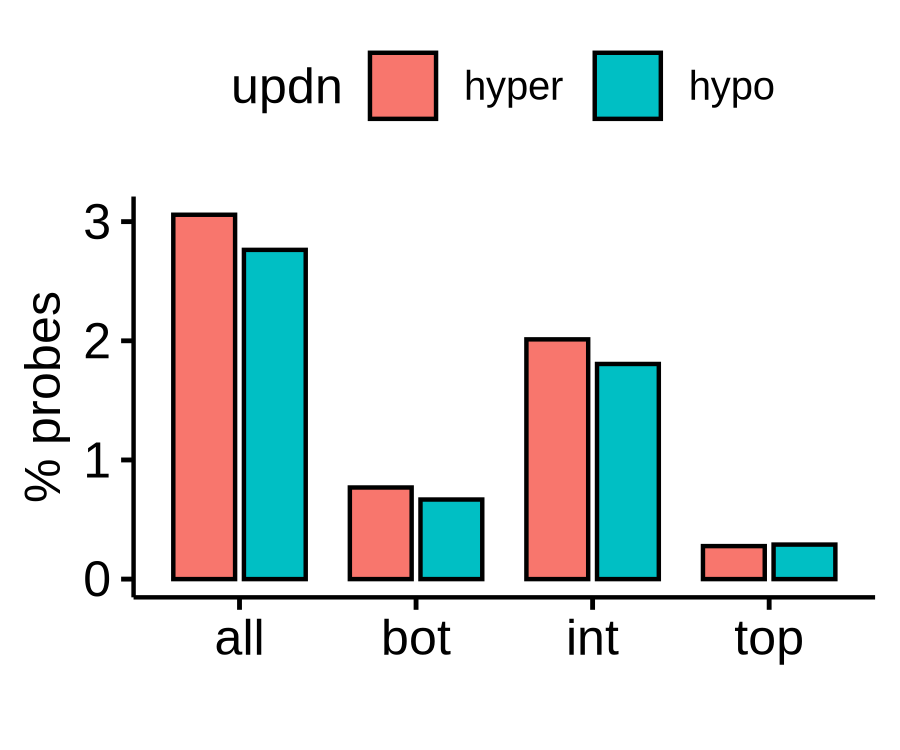

In [107]:
# all probes
dmp_sel = 'cloneA23_DKO_B1M__cloneA23_DKO_B1'

plotdat = hsa_dmp_dt4[.id == dmp_sel & !is.na(probe_grp2) & ann != 'distal', ]
dim(plotdat) 

# based on m value
cut = .5
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
plotdat1 = plotdat[ logFC > cut & adj.P.Val < 0.05, ]
plotdat2 = plotdat[ logFC < -cut & adj.P.Val < 0.05, ]
plotdat11 = copy(plotdat1)
plotdat22 = copy(plotdat2)
plotdat11$probe_grp2 = 'all'
plotdat22$probe_grp2 = 'all'
plotdat1 = rbind(plotdat1, plotdat11)
plotdat2 = rbind(plotdat2, plotdat22)
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1)
gg

plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(melt(table(sign(plotdat$logFC), plotdat$probe_grp2)))
plotdat[, updn := 'hyper' ]
plotdat[Var1 == -1, updn := 'hypo' ]
plotdat[, val := value / 1000 ]
plotdat[, val := value / 1000 ]
plotdat[, per := 100 * value / all_probes]

gg = ggbarplot(plotdat, x = 'Var2', y = 'per', fill = 'updn', color = 'black', position = position_dodge(.8)) +
ylab('% probes') + xlab('')
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
gg



In [52]:
head(deg_dt3[.id == deg_sel, ])

rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,batch,chr,start,end,strand,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<int>,<chr>,<fct>,<fct>


rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,batch,chr,start,end,strand,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<int>,<chr>,<fct>,<fct>
BCAT1,cloneA23_DKO_B1M__cloneA23_DKO_B1,41533.23,2.042677,0.08814855,23.17312,8.500713e-119,1.165448e-115,chr12,24810023,24949459,-,up,batch2


[1] 2392   14

[1] 56455    71

Warning message:
“Removed 94 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 20 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(table(sign(plotdat$logFC), plotdat$probe_grp2)). In the next version, this warning will become an error.”


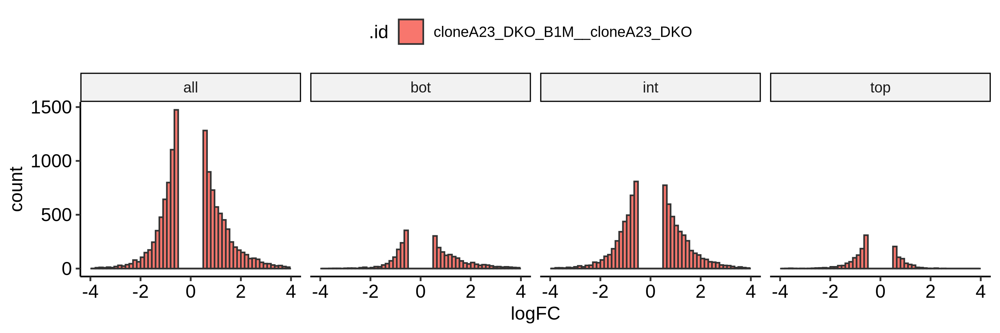

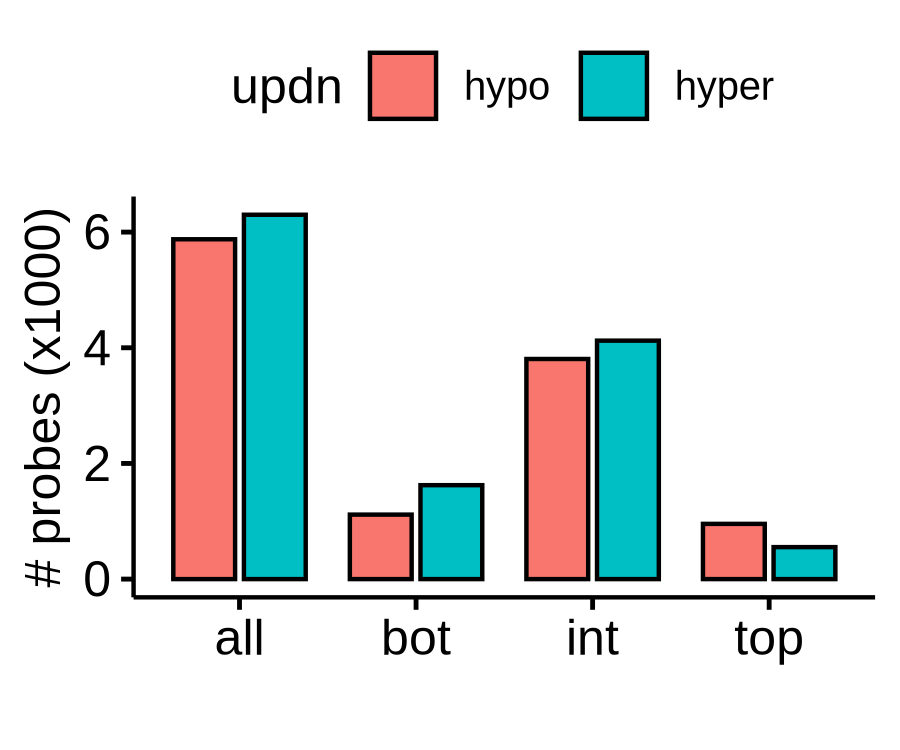

In [108]:
deg_sel = 'cloneA23_DKO_B1M__cloneA23_DKO_B1'
gene_sel = deg_dt3[.id == deg_sel & padj < .1 & log2FoldChange > 0, ]
gene_sel[rn == 'BCAT1', ]
dim(gene_sel)

dmp_sel = 'cloneA23_DKO_B1M__cloneA23_DKO'

plotdat = hsa_dmp_dt4[SYMBOL %in% gene_sel$rn & .id == dmp_sel & !is.na(probe_grp2) & ann != 'distal', ]
dim(plotdat) 

# based on m value
cut = .5
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
plotdat1 = plotdat[ logFC > cut & adj.P.Val < 0.05, ]
plotdat2 = plotdat[ logFC < -cut & adj.P.Val < 0.05, ]
plotdat11 = copy(plotdat1)
plotdat22 = copy(plotdat2)
plotdat11$probe_grp2 = 'all'
plotdat22$probe_grp2 = 'all'
plotdat1 = rbind(plotdat1, plotdat11)
plotdat2 = rbind(plotdat2, plotdat22)
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1)
#fname = '~/WenhuoHu/plot/mar/k562_cloneA23_DKO__cloneA23_DKO_B1M_UpGene_DMP.pdf'
#ggsave(gg, file = fname, width = 9, height = 3)
gg

plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(melt(table(sign(plotdat$logFC), plotdat$probe_grp2)))
plotdat[, updn := 'hyper' ]
plotdat[Var1 == -1, updn := 'hypo' ]
plotdat[, updn := factor(updn, levels = c('hypo', 'hyper') ) ]
plotdat[, val := value / 1000 ]
gg = ggbarplot(plotdat, x = 'Var2', y = 'val', fill = 'updn', color = 'black', position = position_dodge(.8)) +
ylab('# probes (x1000)') + xlab('')
#ggsave(gg, file = '~/WenhuoHu/plot/mar/k562_cloneA23_DKO__cloneA23_DKO_B1M_UpGene_DMP_countbar.pdf', width = 3, height = 2.5)
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
gg


rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,batch,chr,start,end,strand,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<int>,<chr>,<fct>,<fct>


[1] 2234   14

[1] 47837    71

Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(table(sign(plotdat$logFC), plotdat$probe_grp2)). In the next version, this warning will become an error.”


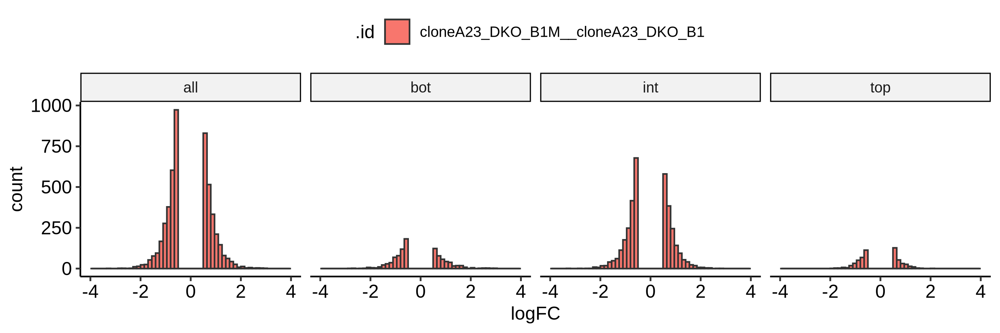

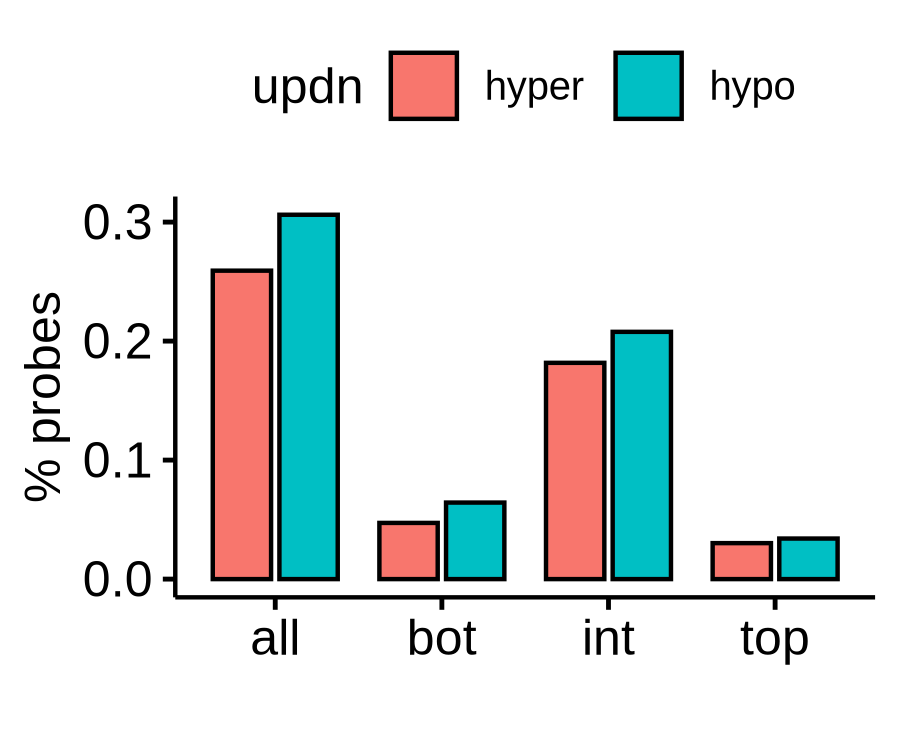

In [109]:
##### mar 

deg_sel = 'cloneA23_DKO_B1M__cloneA23_DKO_B1'
gene_sel = deg_dt3[.id == deg_sel & padj < .1 & log2FoldChange < 0, ]
gene_sel[rn == 'BCAT1', ]
dim(gene_sel)

dmp_sel = 'cloneA23_DKO_B1M__cloneA23_DKO_B1'

plotdat = hsa_dmp_dt4[SYMBOL %in% gene_sel$rn & .id == dmp_sel & !is.na(probe_grp2) & ann != 'distal', ]
dim(plotdat) 

# based on m value
cut = .5
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
plotdat1 = plotdat[ logFC > cut & adj.P.Val < 0.05, ]
plotdat2 = plotdat[ logFC < -cut & adj.P.Val < 0.05, ]
plotdat11 = copy(plotdat1)
plotdat22 = copy(plotdat2)
plotdat11$probe_grp2 = 'all'
plotdat22$probe_grp2 = 'all'
plotdat1 = rbind(plotdat1, plotdat11)
plotdat2 = rbind(plotdat2, plotdat22)
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1)
fname = '~/WenhuoHu/plot/mar/k562_cloneA23_DKO_B1M__cloneA23_DKO_B1_UpGene_DMP.pdf'
ggsave(gg, file = fname, width = 9, height = 3)
gg

plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(melt(table(sign(plotdat$logFC), plotdat$probe_grp2)))
plotdat[, updn := 'hyper' ]
plotdat[Var1 == -1, updn := 'hypo' ]
plotdat[, val := value / 1000 ]
plotdat[, val := value / 1000 ]
plotdat[, per := 100 * value / all_probes]

gg = ggbarplot(plotdat, x = 'Var2', y = 'per', fill = 'updn', color = 'black', position = position_dodge(.8)) +
ylab('% probes') + xlab('')
fname = '~/WenhuoHu/plot/mar/k562_cloneA23_DKO_B1M__cloneA23_DKO_B1_UpGene_DMP_percentageBar.pdf'
ggsave(gg, file = fname, width = 3, height = 2.5)
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
gg


## up-regulated genes in cloneA9_DKO_B1M  vs cloneA9_DKO_B1

[1] 493998     71

Warning message:
“Removed 30 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 6 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(table(sign(plotdat$logFC), plotdat$probe_grp2)). In the next version, this warning will become an error.”


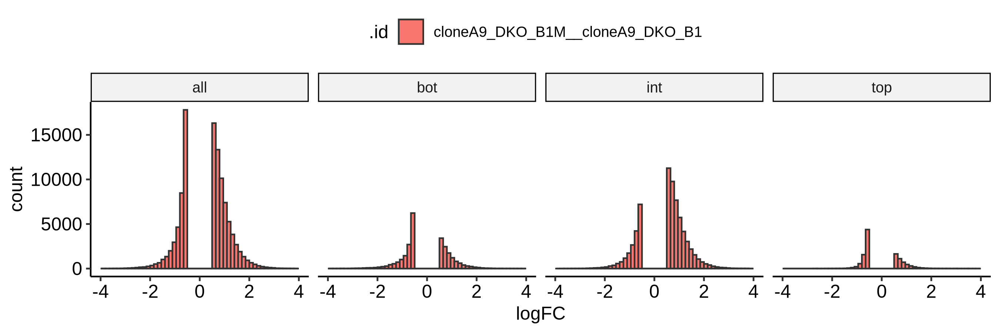

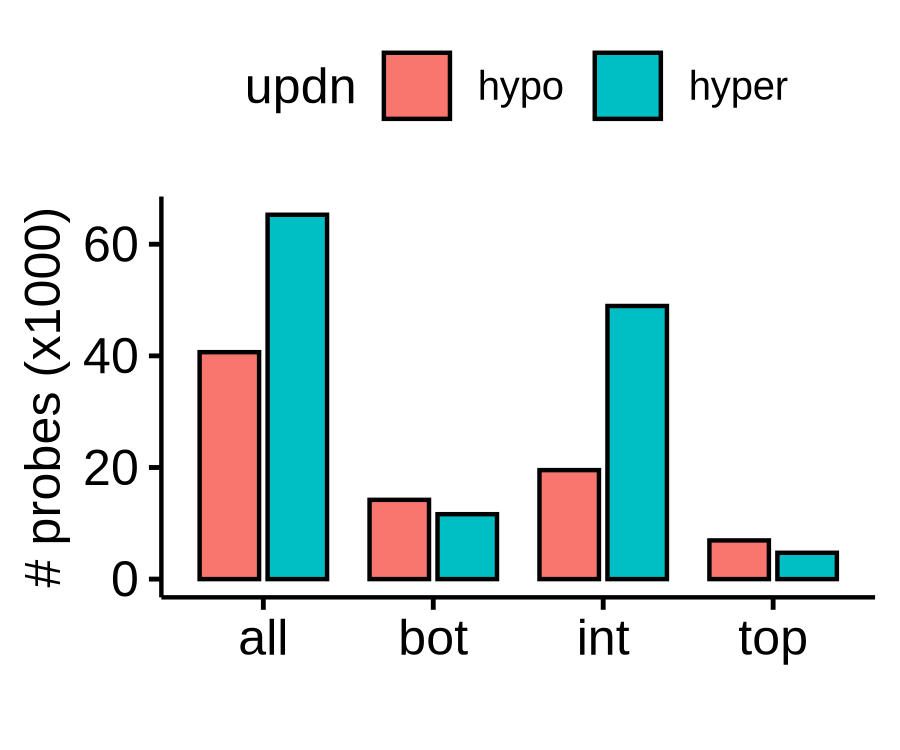

In [65]:
# all probes
dmp_sel = 'cloneA9_DKO_B1M__cloneA9_DKO_B1'

plotdat = hsa_dmp_dt4[.id == dmp_sel & !is.na(probe_grp2) & ann != 'distal', ]
dim(plotdat) 

# based on m value
cut = .5
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
plotdat1 = plotdat[ logFC > cut & adj.P.Val < 0.05, ]
plotdat2 = plotdat[ logFC < -cut & adj.P.Val < 0.05, ]
plotdat11 = copy(plotdat1)
plotdat22 = copy(plotdat2)
plotdat11$probe_grp2 = 'all'
plotdat22$probe_grp2 = 'all'
plotdat1 = rbind(plotdat1, plotdat11)
plotdat2 = rbind(plotdat2, plotdat22)
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1)
gg

plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(melt(table(sign(plotdat$logFC), plotdat$probe_grp2)))
plotdat[, updn := 'hyper' ]
plotdat[Var1 == -1, updn := 'hypo' ]
plotdat[, updn := factor(updn, levels = c('hypo', 'hyper') ) ]
plotdat[, val := value / 1000 ]
gg = ggbarplot(plotdat, x = 'Var2', y = 'val', fill = 'updn', color = 'black', position = position_dodge(.8)) +
ylab('# probes (x1000)') + xlab('')
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
gg


rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,batch,chr,start,end,strand,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<int>,<chr>,<fct>,<fct>
BCAT1,cloneA9_DKO_B1M__cloneA9_DKO_B1,41533.23,1.276149,0.08799945,14.50178,1.18041e-47,2.313007e-45,chr12,24810023,24949459,-,up,batch2


[1] 2657   14

[1] 58946    71

Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(table(sign(plotdat$logFC), plotdat$probe_grp2)). In the next version, this warning will become an error.”


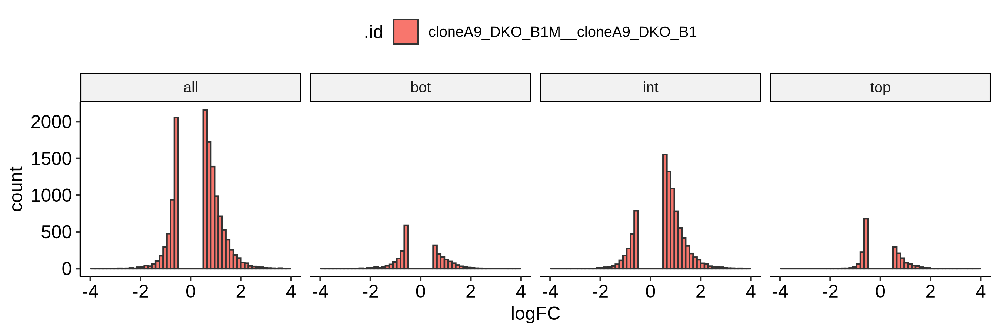

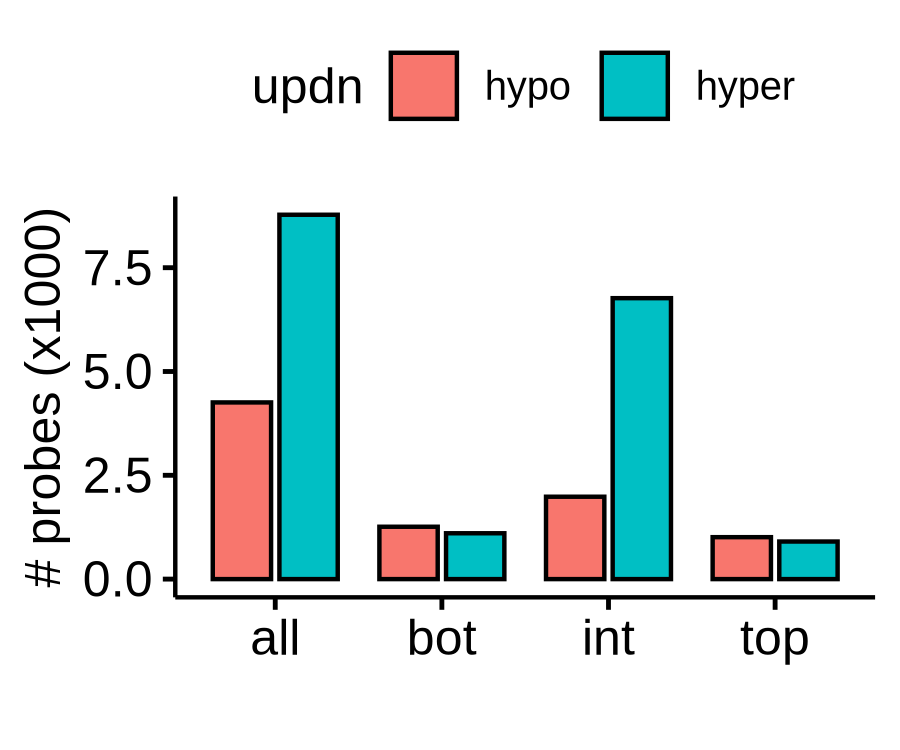

In [64]:
deg_sel = 'cloneA9_DKO_B1M__cloneA9_DKO_B1'
gene_sel = deg_dt3[.id == deg_sel & padj < .1 & log2FoldChange > 0, ]
gene_sel[rn == 'BCAT1', ]
dim(gene_sel)

dmp_sel = 'cloneA9_DKO_B1M__cloneA9_DKO_B1'

plotdat = hsa_dmp_dt4[SYMBOL %in% gene_sel$rn & .id == dmp_sel & !is.na(probe_grp2) & ann != 'distal', ]
dim(plotdat) 

# based on m value
cut = .5
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
plotdat1 = plotdat[ logFC > cut & adj.P.Val < 0.05, ]
plotdat2 = plotdat[ logFC < -cut & adj.P.Val < 0.05, ]
plotdat11 = copy(plotdat1)
plotdat22 = copy(plotdat2)
plotdat11$probe_grp2 = 'all'
plotdat22$probe_grp2 = 'all'
plotdat1 = rbind(plotdat1, plotdat11)
plotdat2 = rbind(plotdat2, plotdat22)
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1)
#fname = '~/WenhuoHu/plot/mar/k562_cloneA9_DKO__cloneA9_DKO_B1M_UpGene_DMP.pdf'
#ggsave(gg, file = fname, width = 9, height = 3)
gg

plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(melt(table(sign(plotdat$logFC), plotdat$probe_grp2)))
plotdat[, updn := 'hyper' ]
plotdat[Var1 == -1, updn := 'hypo' ]
plotdat[, updn := factor(updn, levels = c('hypo', 'hyper') ) ]
plotdat[, val := value / 1000 ]
gg = ggbarplot(plotdat, x = 'Var2', y = 'val', fill = 'updn', color = 'black', position = position_dodge(.8)) +
ylab('# probes (x1000)') + xlab('')
#ggsave(gg, file = '~/WenhuoHu/plot/mar/k562_cloneA9_DKO__cloneA9_DKO_B1M_UpGene_DMP_countbar.pdf', width = 3, height = 2.5)
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
gg


rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,batch,chr,start,end,strand,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<int>,<chr>,<fct>,<fct>


[1] 3030   14

[1] 67434    71

Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the 

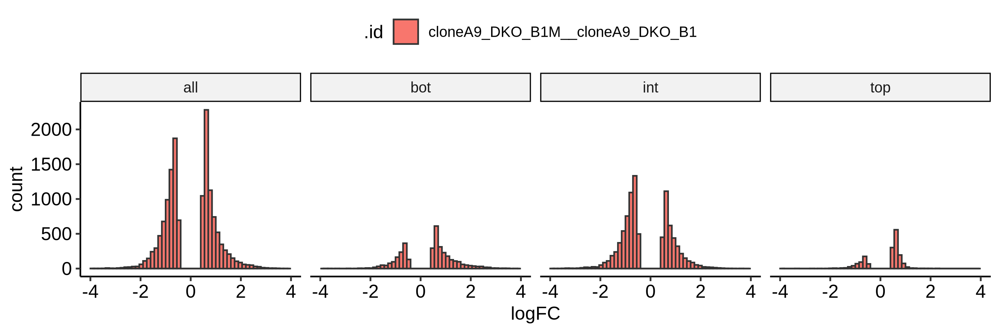

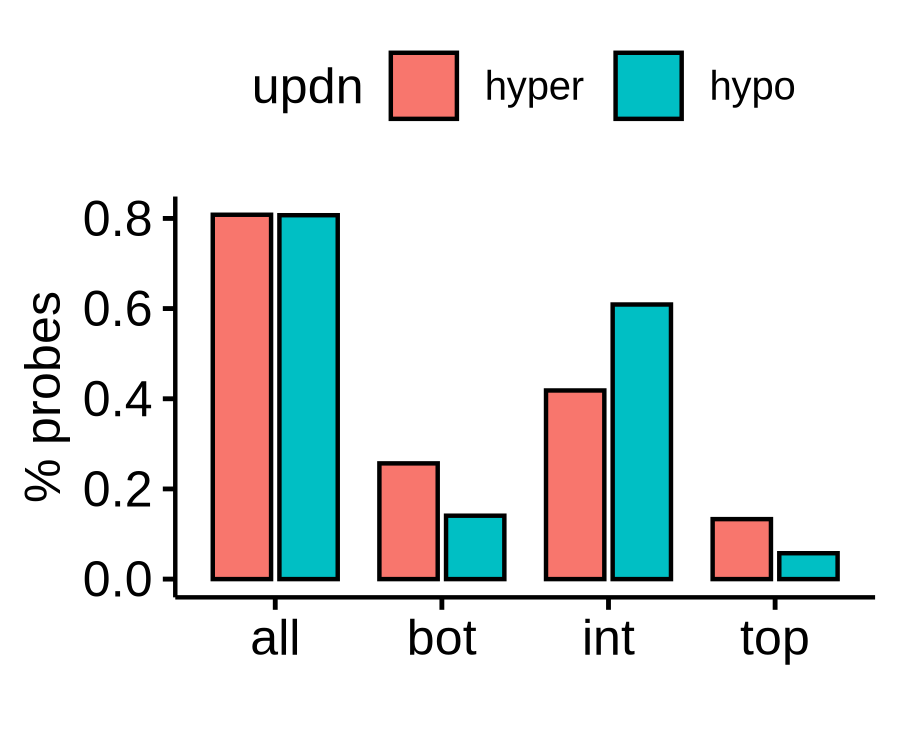

In [110]:
##### mar 
deg_sel = 'cloneA9_DKO_B1M__cloneA9_DKO_B1'
gene_sel = deg_dt3[.id == deg_sel & padj < .1 & log2FoldChange < 0, ]
gene_sel[rn == 'BCAT1', ]
dim(gene_sel)

dmp_sel = 'cloneA9_DKO_B1M__cloneA9_DKO_B1'

plotdat = hsa_dmp_dt4[SYMBOL %in% gene_sel$rn & .id == dmp_sel & !is.na(probe_grp2) & ann != 'distal', ]
dim(plotdat) 

# based on m value
cut = .5
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
plotdat1 = plotdat[ logFC > cut & adj.P.Val < 0.05, ]
plotdat2 = plotdat[ logFC < -cut & adj.P.Val < 0.05, ]
plotdat11 = copy(plotdat1)
plotdat22 = copy(plotdat2)
plotdat11$probe_grp2 = 'all'
plotdat22$probe_grp2 = 'all'
plotdat1 = rbind(plotdat1, plotdat11)
plotdat2 = rbind(plotdat2, plotdat22)
### mod
plotdat1[, logFC := -logFC]
plotdat2[, logFC := -logFC]
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1)
fname = '~/WenhuoHu/plot/mar/k562_cloneA9_DKO_B1M__cloneA9_DKO_B1_UpGene_DMP.pdf'
ggsave(gg, file = fname, width = 9, height = 3)
gg


plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(melt(table(sign(plotdat$logFC), plotdat$probe_grp2)))
plotdat[, updn := 'hyper' ]
plotdat[Var1 == -1, updn := 'hypo' ]
plotdat[, val := value / 1000 ]
plotdat[, val := value / 1000 ]
plotdat[, per := 100 * value / all_probes]

gg = ggbarplot(plotdat, x = 'Var2', y = 'per', fill = 'updn', color = 'black', position = position_dodge(.8)) +
ylab('% probes') + xlab('')
fname = '~/WenhuoHu/plot/mar/k562_cloneA9_DKO_B1M__cloneA9_DKO_B1_UpGene_DMP_percentageBar.pdf'
ggsave(gg, file = fname, width = 3, height = 2.5)
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
gg


## up-regulated genes in cloneA23_DKO_B1M  vs cloneA23_DKO 

[1] 493998     71

Warning message:
“Removed 490 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 152 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(table(sign(plotdat$logFC), plotdat$probe_grp2)). In the next version, this warning will become an error.”


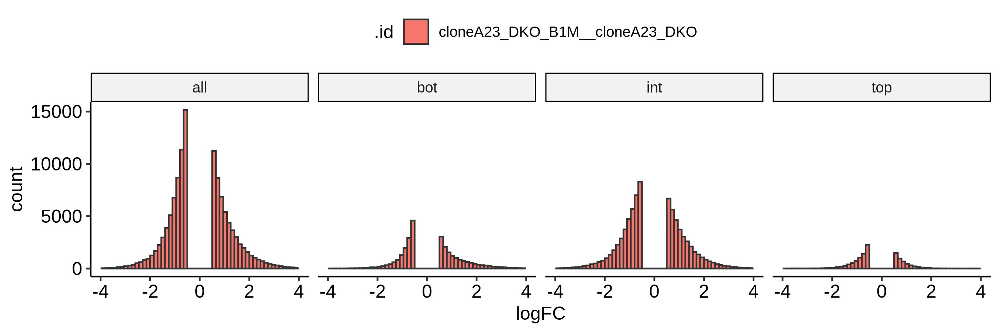

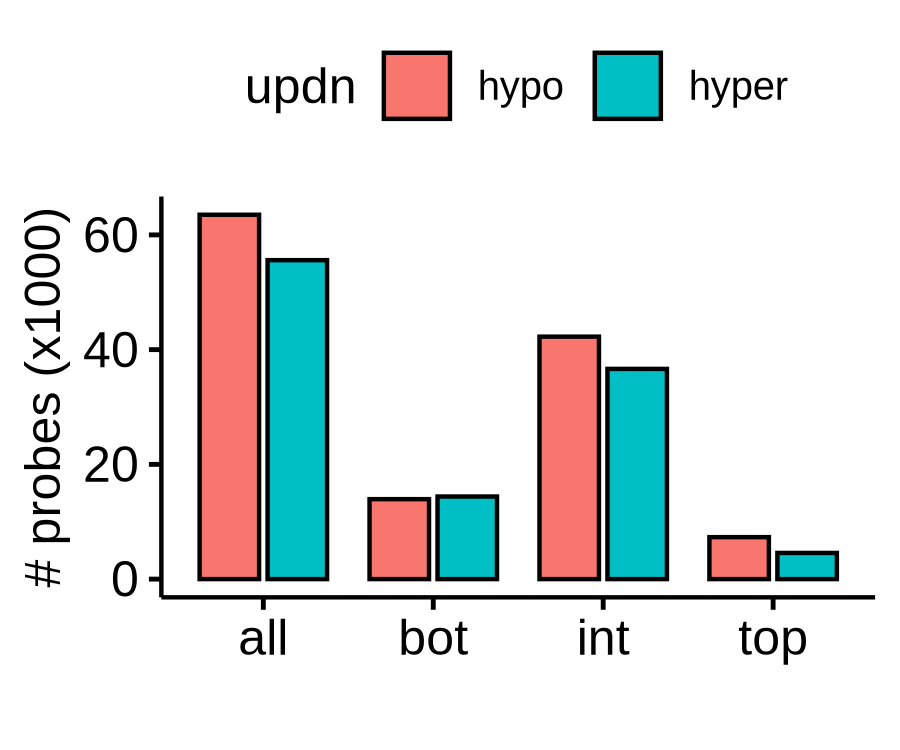

In [58]:
dmp_sel = 'cloneA23_DKO_B1M__cloneA23_DKO'

plotdat = hsa_dmp_dt4[.id == dmp_sel & !is.na(probe_grp2) & ann != 'distal', ]
dim(plotdat) 

# based on m value
cut = .5
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
plotdat1 = plotdat[ logFC > cut & adj.P.Val < 0.05, ]
plotdat2 = plotdat[ logFC < -cut & adj.P.Val < 0.05, ]
plotdat11 = copy(plotdat1)
plotdat22 = copy(plotdat2)
plotdat11$probe_grp2 = 'all'
plotdat22$probe_grp2 = 'all'
plotdat1 = rbind(plotdat1, plotdat11)
plotdat2 = rbind(plotdat2, plotdat22)
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1)
gg

plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(melt(table(sign(plotdat$logFC), plotdat$probe_grp2)))
plotdat[, updn := 'hyper' ]
plotdat[Var1 == -1, updn := 'hypo' ]
plotdat[, updn := factor(updn, levels = c('hypo', 'hyper') ) ]
plotdat[, val := value / 1000 ]
gg = ggbarplot(plotdat, x = 'Var2', y = 'val', fill = 'updn', color = 'black', position = position_dodge(.8)) +
ylab('# probes (x1000)') + xlab('')
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
gg


rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,batch,chr,start,end,strand,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<int>,<chr>,<fct>,<fct>


[1] 3502   14

[1] 76906    71

Warning message:
“Removed 34 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 42 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 34 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 42 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is supersed

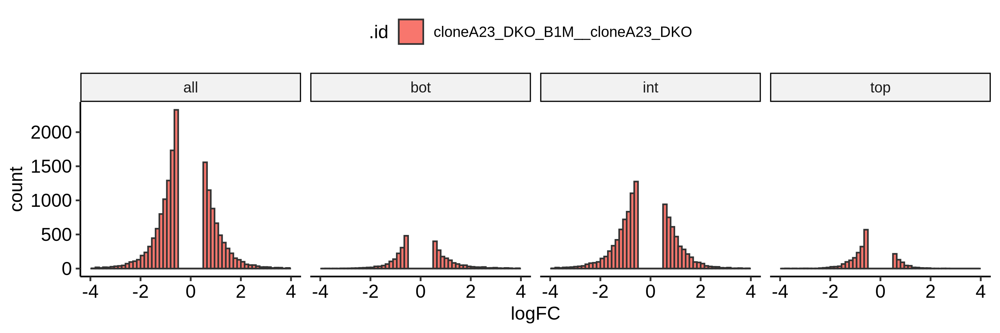

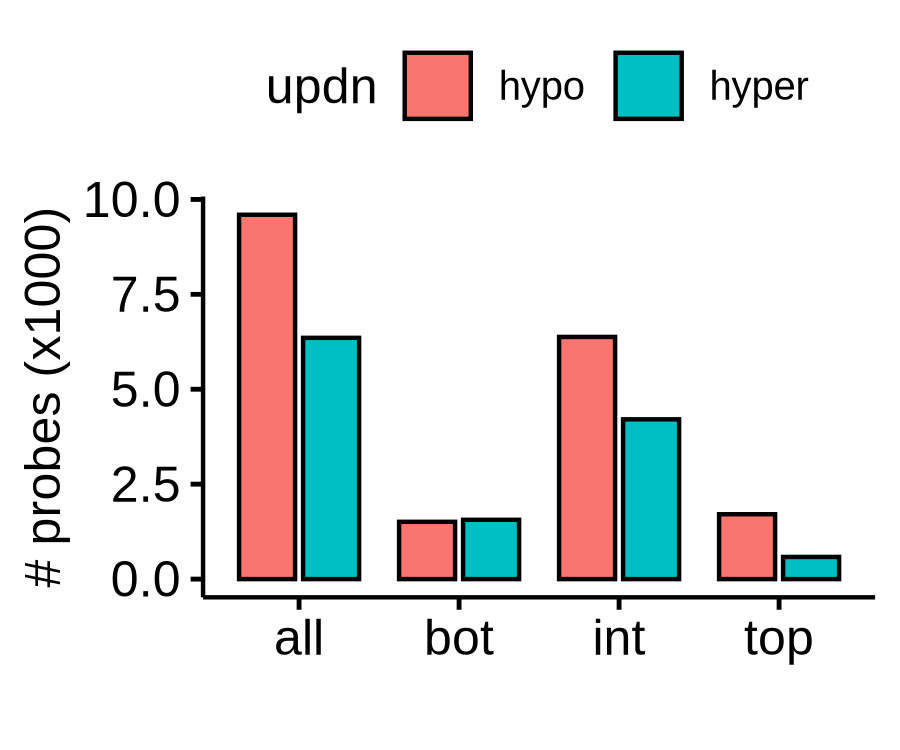

In [54]:
deg_sel = 'cloneA23_DKO__cloneA23_DKO_B1M'
gene_sel = deg_dt3[.id == deg_sel & padj < .1 & log2FoldChange > 0, ]
gene_sel[rn == 'BCAT1', ]
dim(gene_sel)

dmp_sel = 'cloneA23_DKO_B1M__cloneA23_DKO'

plotdat = hsa_dmp_dt4[SYMBOL %in% gene_sel$rn & .id == dmp_sel & !is.na(probe_grp2) & ann != 'distal', ]
dim(plotdat) 

# based on m value
cut = .5
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
plotdat1 = plotdat[ logFC > cut & adj.P.Val < 0.05, ]
plotdat2 = plotdat[ logFC < -cut & adj.P.Val < 0.05, ]
plotdat11 = copy(plotdat1)
plotdat22 = copy(plotdat2)
plotdat11$probe_grp2 = 'all'
plotdat22$probe_grp2 = 'all'
plotdat1 = rbind(plotdat1, plotdat11)
plotdat2 = rbind(plotdat2, plotdat22)
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1)
fname = '~/WenhuoHu/plot/mar/k562_cloneA23_DKO__cloneA23_DKO_B1M_UpGene_DMP.pdf'
ggsave(gg, file = fname, width = 9, height = 3)
gg

plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(melt(table(sign(plotdat$logFC), plotdat$probe_grp2)))
plotdat[, updn := 'hyper' ]
plotdat[Var1 == -1, updn := 'hypo' ]
plotdat[, updn := factor(updn, levels = c('hypo', 'hyper') ) ]
plotdat[, val := value / 1000 ]
gg = ggbarplot(plotdat, x = 'Var2', y = 'val', fill = 'updn', color = 'black', position = position_dodge(.8)) +
ylab('# probes (x1000)') + xlab('')
ggsave(gg, file = '~/WenhuoHu/plot/mar/k562_cloneA23_DKO__cloneA23_DKO_B1M_UpGene_DMP_countbar.pdf', width = 3, height = 2.5)
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
gg


## up-regulated genes in cloneA9_DKO_B1M  vs cloneA9_DKO 

[1] 493998     71

Warning message:
“Removed 30 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 6 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range (`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range (`geom_bar()`).”
Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(table(sign(plotdat$logFC), plotdat$probe_grp2)). In the next version, this warning will become an error.”


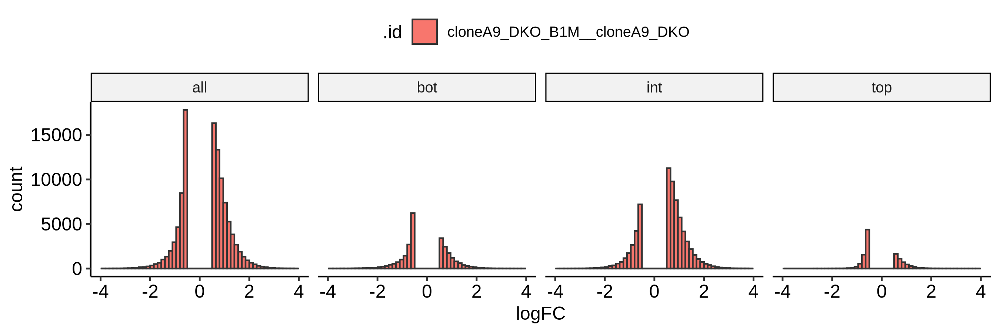

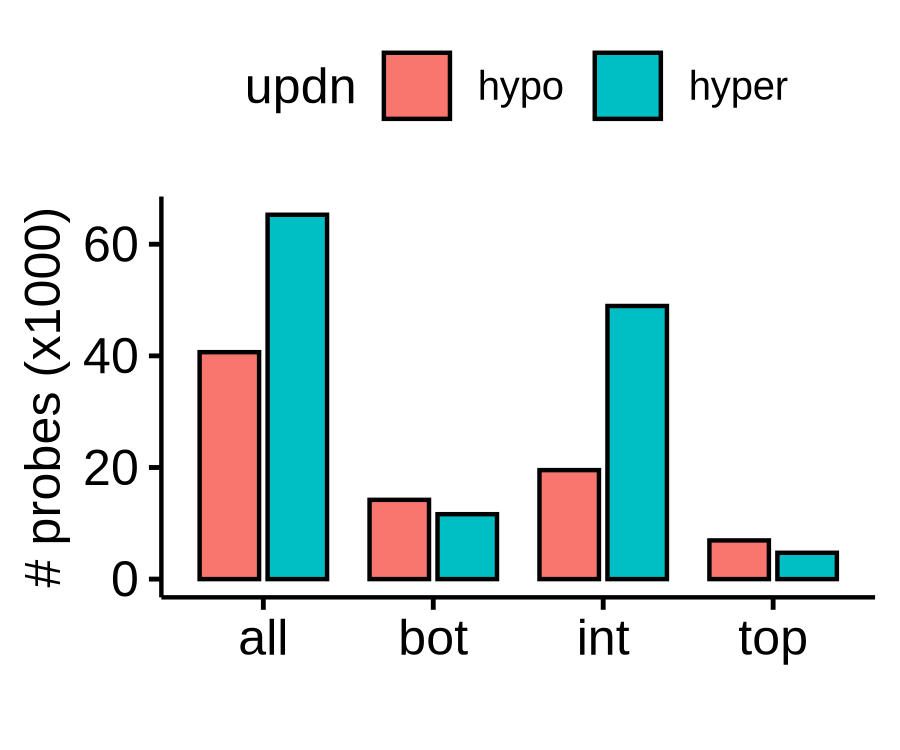

In [555]:
# overall probes
dmp_sel = 'cloneA9_DKO_B1M__cloneA9_DKO'

plotdat = hsa_dmp_dt4[.id == dmp_sel & !is.na(probe_grp2) & ann != 'distal', ]
dim(plotdat) 

# based on m value
cut = .5
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
plotdat1 = plotdat[ logFC > cut & adj.P.Val < 0.05, ]
plotdat2 = plotdat[ logFC < -cut & adj.P.Val < 0.05, ]
plotdat11 = copy(plotdat1)
plotdat22 = copy(plotdat2)
plotdat11$probe_grp2 = 'all'
plotdat22$probe_grp2 = 'all'
plotdat1 = rbind(plotdat1, plotdat11)
plotdat2 = rbind(plotdat2, plotdat22)
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1)
gg

plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(melt(table(sign(plotdat$logFC), plotdat$probe_grp2)))
plotdat[, updn := 'hyper' ]
plotdat[Var1 == -1, updn := 'hypo' ]
plotdat[, val := value / 1000 ]
plotdat[, val := value / 1000 ]
plotdat[, per := 100 * value / all_probes]

gg = ggbarplot(plotdat, x = 'Var2', y = 'per', fill = 'updn', color = 'black', position = position_dodge(.8)) +
ylab('% probes') + xlab('')
fname = '~/WenhuoHu/plot/mar/k562_dmp_3groups_probes_DKO_B1SXXS__DKO_percentageBar.pdf'
ggsave(gg, file = fname, width = 3, height = 2.5)
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
gg



rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,chr,start,end,strand,updn,batch
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>,<chr>,<fct>,<chr>


[1] 3668   14

[1] 72794    71

Warning message:
“Removed 4 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range (`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range (`geom_bar()`).”
Warning message:
“Removed 4 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range (`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range (`geom_bar()`).”
Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the 

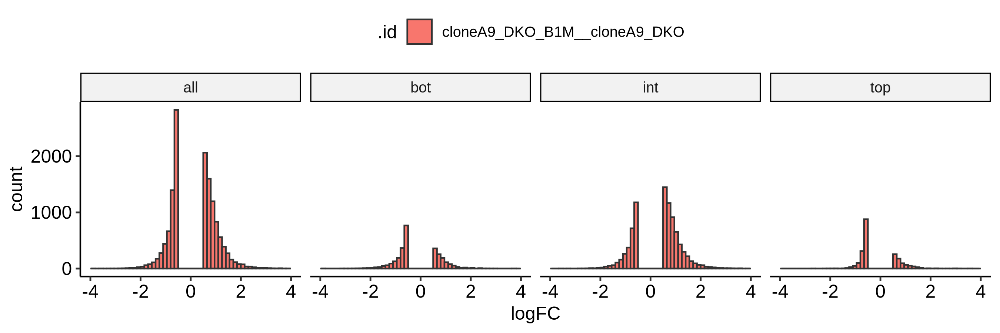

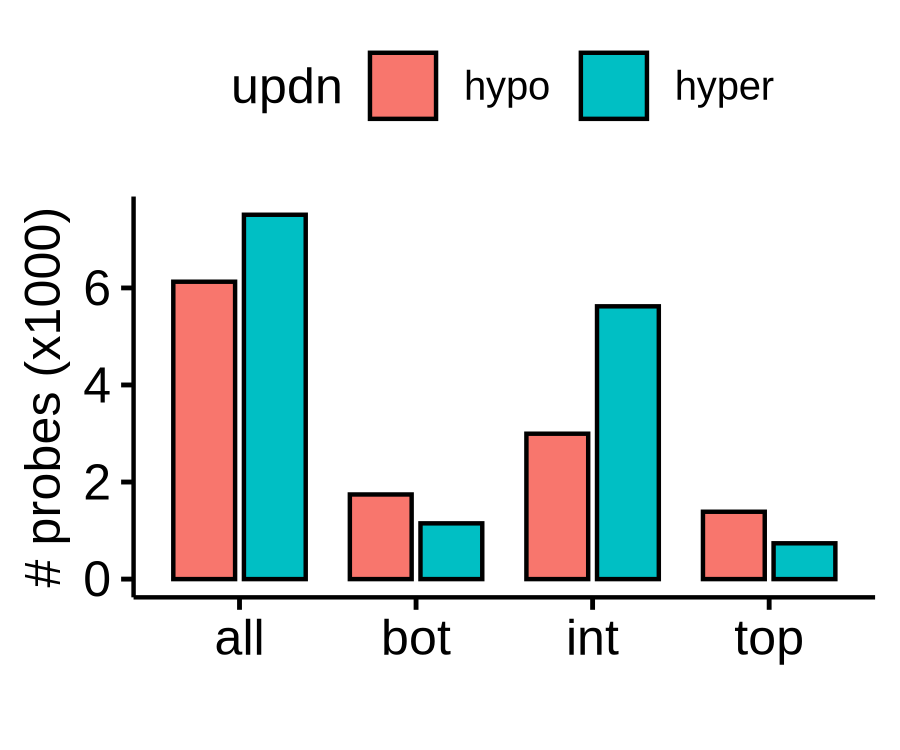

In [558]:
deg_sel = 'cloneA9_DKO__cloneA9_DKO_B1M'
gene_sel = deg_dt3[.id == deg_sel & padj < .1 & log2FoldChange > 0, ]
gene_sel[rn == 'BCAT1', ]
dim(gene_sel)

dmp_sel = 'cloneA9_DKO_B1M__cloneA9_DKO'

plotdat = hsa_dmp_dt4[SYMBOL %in% gene_sel$rn & .id == dmp_sel & !is.na(probe_grp2) & ann != 'distal', ]
dim(plotdat) 

# based on m value
cut = .5
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
plotdat1 = plotdat[ logFC > cut & adj.P.Val < 0.05, ]
plotdat2 = plotdat[ logFC < -cut & adj.P.Val < 0.05, ]
plotdat11 = copy(plotdat1)
plotdat22 = copy(plotdat2)
plotdat11$probe_grp2 = 'all'
plotdat22$probe_grp2 = 'all'
plotdat1 = rbind(plotdat1, plotdat11)
plotdat2 = rbind(plotdat2, plotdat22)
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1)
fname = '~/WenhuoHu/plot/mar/k562_cloneA9_DKO__cloneA9_DKO_B1M_UpGene_DMP.pdf'
ggsave(gg, file = fname, width = 9, height = 3)
gg

plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(melt(table(sign(plotdat$logFC), plotdat$probe_grp2)))
plotdat[, updn := 'hyper' ]
plotdat[Var1 == -1, updn := 'hypo' ]
plotdat[, updn := factor(updn, levels = c('hypo', 'hyper') ) ]
plotdat[, val := value / 1000 ]
gg = ggbarplot(plotdat, x = 'Var2', y = 'val', fill = 'updn', color = 'black', position = position_dodge(.8)) +
ylab('# probes (x1000)') + xlab('')
ggsave(gg, file = '~/WenhuoHu/plot/mar/k562_cloneA9_DKO__cloneA9_DKO_B1M_UpnGene_DMP_countbar.pdf', width = 3, height = 2.5)
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
gg


## down-regulated genes in cloneA9_DKO_B1  vs cloneA_DKO 

[1] 883147     71

Warning message:
“Removed 356 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 50 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range (`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range (`geom_bar()`).”
Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(table(sign(plotdat$logFC), plotdat$probe_grp2)). In the next version, this warning will become an error.”


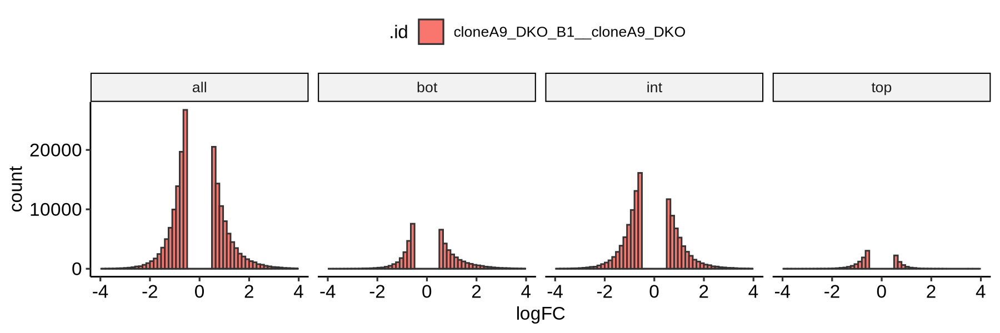

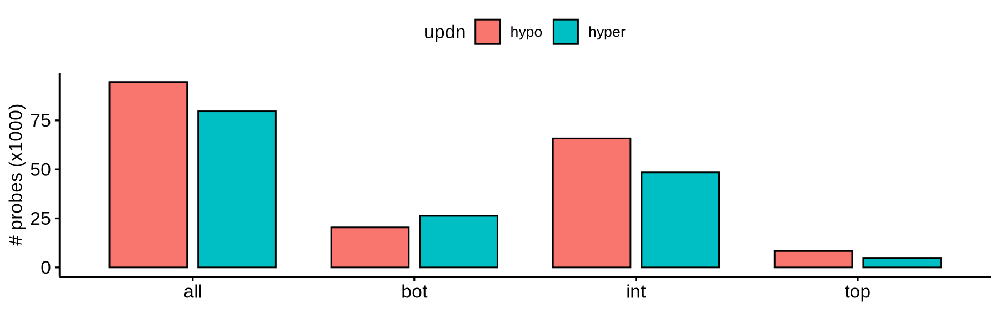

In [542]:
# all probes without considering gene expression 
dmp_sel = 'cloneA9_DKO_B1__cloneA9_DKO'
plotdat = hsa_dmp_dt4[.id == dmp_sel & !is.na(probe_grp2), ]
dim(plotdat) 

# based on m value
cut = .5
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
plotdat1 = plotdat[ logFC > cut & adj.P.Val < 0.05, ]
plotdat2 = plotdat[ logFC < -cut & adj.P.Val < 0.05, ]
plotdat11 = copy(plotdat1)
plotdat22 = copy(plotdat2)
plotdat11$probe_grp2 = 'all'
plotdat22$probe_grp2 = 'all'
plotdat1 = rbind(plotdat1, plotdat11)
plotdat2 = rbind(plotdat2, plotdat22)
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1)
gg

plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(melt(table(sign(plotdat$logFC), plotdat$probe_grp2)))
plotdat[, updn := 'hyper' ]
plotdat[Var1 == -1, updn := 'hypo' ]
plotdat[, updn := factor(updn, levels = c('hypo', 'hyper') ) ]
plotdat[, val := value / 1000 ]
gg = ggbarplot(plotdat, x = 'Var2', y = 'val', fill = 'updn', color = 'black', position = position_dodge(.8)) +
ylab('# probes (x1000)') + xlab('')
gg


rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,batch,chr,start,end,strand,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<int>,<chr>,<fct>,<fct>
BCAT1,cloneA9_DKO__cloneA9_DKO_B1,41533.23,-7.250048,0.09866134,-73.48418,0,0,chr12,24810023,24949459,-,dn,batch2


[1] 4289   14

[1] 98447    71

Warning message:
“Removed 92 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 10 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 92 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 10 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is supersed

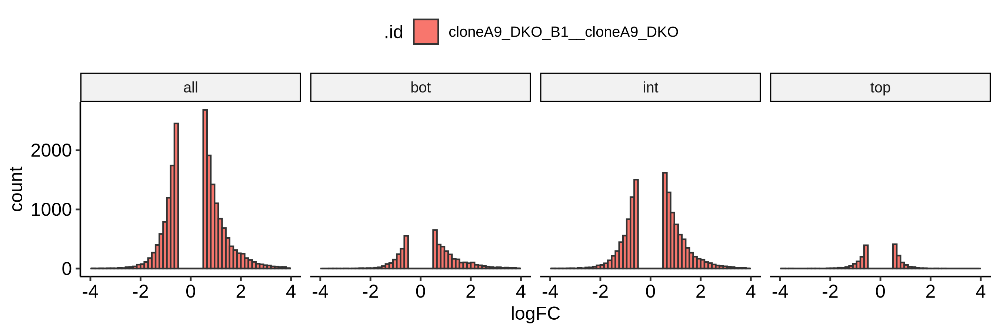

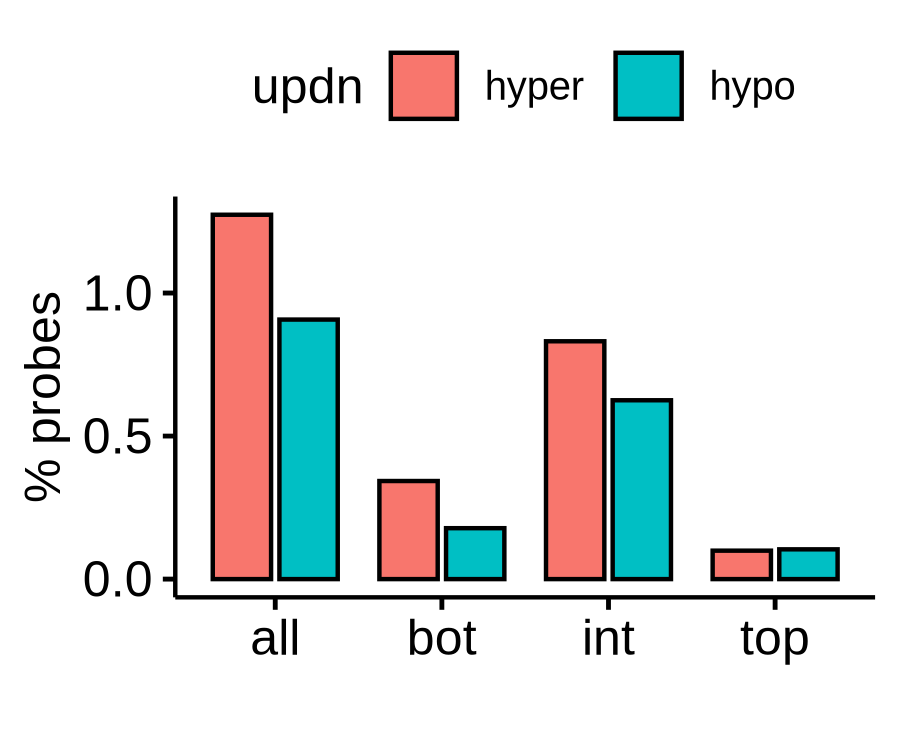

In [111]:
##### mar
deg_sel = 'cloneA9_DKO__cloneA9_DKO_B1'
gene_sel = deg_dt3[.id == deg_sel & padj < .1 & log2FoldChange < 0, ]
gene_sel[rn == 'BCAT1', ]
dim(gene_sel)

dmp_sel = 'cloneA9_DKO_B1__cloneA9_DKO'

plotdat = hsa_dmp_dt4[SYMBOL %in% gene_sel$rn & .id == dmp_sel & !is.na(probe_grp2) & ann != 'distal', ]
dim(plotdat) 

# based on m value
cut = .5
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
plotdat1 = plotdat[ logFC > cut & adj.P.Val < 0.05, ]
plotdat2 = plotdat[ logFC < -cut & adj.P.Val < 0.05, ]
plotdat11 = copy(plotdat1)
plotdat22 = copy(plotdat2)
plotdat11$probe_grp2 = 'all'
plotdat22$probe_grp2 = 'all'
plotdat1 = rbind(plotdat1, plotdat11)
plotdat2 = rbind(plotdat2, plotdat22)
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1)
fname = '~/WenhuoHu/plot/mar/k562_cloneA9_DKO__cloneA9_DKO_B1_DnGene_DMP.pdf'
ggsave(gg, file = fname, width = 9, height = 3)
gg


plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(melt(table(sign(plotdat$logFC), plotdat$probe_grp2)))
plotdat[, updn := 'hyper' ]
plotdat[Var1 == -1, updn := 'hypo' ]
plotdat[, val := value / 1000 ]
plotdat[, val := value / 1000 ]
plotdat[, per := 100 * value / all_probes]

gg = ggbarplot(plotdat, x = 'Var2', y = 'per', fill = 'updn', color = 'black', position = position_dodge(.8)) +
ylab('% probes') + xlab('')
fname = '~/WenhuoHu/plot/mar/k562_cloneA9_DKO__cloneA9_DKO_B1_DnGene_DMP_percentageBar.pdf'
ggsave(gg, file = fname, width = 3, height = 2.5)
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
gg


## down-regulated genes in cloneA23_DKO_B1 vs cloneA23_DKO 

rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,batch,chr,start,end,strand,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<int>,<chr>,<fct>,<fct>
BCAT1,cloneA23_DKO__cloneA23_DKO_B1,41533.23,-5.259685,0.09535743,-55.15758,0,0,chr12,24810023,24949459,-,dn,batch2


[1] 3994   14

[1] 133238     71

Warning message:
“Removed 244 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 34 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 244 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 34 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“Removed 4 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Warning message:
“The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is supers

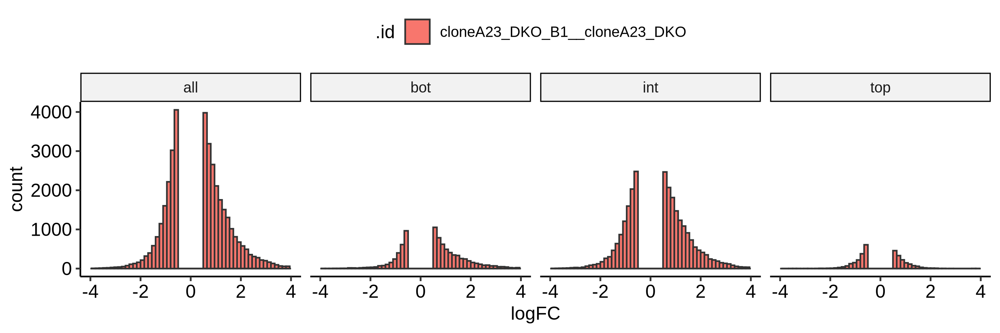

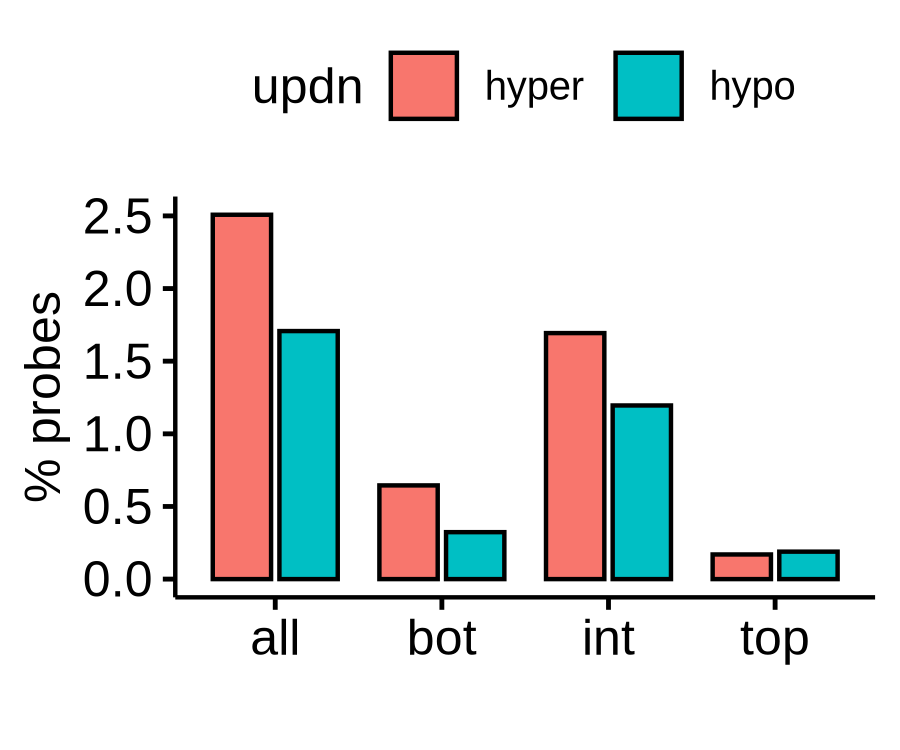

In [112]:
##### mar
deg_sel = 'cloneA23_DKO__cloneA23_DKO_B1'
gene_sel = deg_dt3[.id == deg_sel & padj < .1 & log2FoldChange < 0, ]
gene_sel[rn == 'BCAT1', ]
dim(gene_sel)

dmp_sel = 'cloneA23_DKO_B1__cloneA23_DKO'

plotdat = hsa_dmp_dt4[SYMBOL %in% gene_sel$rn & .id == dmp_sel & !is.na(probe_grp2), ]
dim(plotdat) 

# based on m value
cut = .5
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 200)
plotdat1 = plotdat[ logFC > cut & adj.P.Val < 0.05, ]
plotdat2 = plotdat[ logFC < -cut & adj.P.Val < 0.05, ]
plotdat11 = copy(plotdat1)
plotdat22 = copy(plotdat2)
plotdat11$probe_grp2 = 'all'
plotdat22$probe_grp2 = 'all'
plotdat1 = rbind(plotdat1, plotdat11)
plotdat2 = rbind(plotdat2, plotdat22)
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1)
fname = '~/WenhuoHu/plot/mar/k562_cloneA23_DKO__cloneA23_DKO_B1_DnGene_DMP.pdf'
ggsave(gg, file = fname, width = 9, height = 3)
gg

plotdat = rbind(plotdat1, plotdat2)
plotdat = as.data.table(melt(table(sign(plotdat$logFC), plotdat$probe_grp2)))
plotdat[, updn := 'hyper' ]
plotdat[Var1 == -1, updn := 'hypo' ]
plotdat[, val := value / 1000 ]
plotdat[, val := value / 1000 ]
plotdat[, per := 100 * value / all_probes]

gg = ggbarplot(plotdat, x = 'Var2', y = 'per', fill = 'updn', color = 'black', position = position_dodge(.8)) +
ylab('% probes') + xlab('')
fname = '~/WenhuoHu/plot/mar/k562_cloneA23_DKO__cloneA23_DKO_B1_DnGene_DMP_percentageBar.pdf'
ggsave(gg, file = fname, width = 3, height = 2.5)
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
gg


## others

In [429]:
datatable(head(gpl33022_dt))

HTML widgets cannot be represented in plain text (need html)

In [442]:
gpl33022_dt[, gene := unlist(strsplit(UCSC_RefGene_Name, ';'))[1], by = 1:nrow(gpl33022_dt) ]
gpl33022_dt[is.na(gene), gene := 'None' ]


[1] "ZNF781" "ACTN4"  NA       NA       NA       NA


    distal downstream       exon   promoter        UTR 
    409039        709      28068     469453      22871 

In [482]:
dim(gpl33022_ann)

[1] 930140     19

In [ ]:
ex = 10000

gene_sel = hsa_deg_dt[.id == 'cloneA9_DKO__cloneA9_DKO_B1' & padj < .1 & log2FoldChange < 0, ][!duplicated(rn), .(chr, start, end, strand)]
gene_sel[, tag := paste0(chr, '_', start, '_', end) ]
gene_sel[, start := start - ex ]
gene_sel[, end := end + ex ]
dim(gene_sel)

gene_gr = makeGRangesFromDataFrame(gene_sel[!duplicated(tag), ], keep.extra.columns = T)
length(gene_gr) 
meth_gr = makeGRangesFromDataFrame(hsa_dmp_dt[!is.na(chr) & !duplicated(tag), .(chr, start, end, logFC, adj.P.Val, rn, ID, .id, probe_grp2, tag)], 
                                   keep.extra.columns = T, seqnames.field = 'chr', start.field = 'start', end.field = 'end', ignore.strand = T)
length(meth_gr)

ov = findOverlapsOfPeaks(meth_gr, gene_gr) 

plotdat = as.data.table(ov$overlappingPeaks$meth_gr[, 1:13])
tag_sel = plotdat$tag
length(tag_sel)

plotdat = hsa_dmp_dt[tag %in% tag_sel & .id == 'KO__WT' & !is.na(probe_grp2), ]

# based on m value
cut = .5
options(repr.plot.width = 7, repr.plot.height = 3, repr.plot.res = 200)
plotdat1 = plotdat[ logFC > cut & adj.P.Val < 0.05, ]
plotdat2 = plotdat[ logFC < -cut & adj.P.Val < 0.05, ]
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1)
fname = '~/WenhuoHu/plot/k562_DnGene_DMP_KO_WT.pdf'
ggsave(gg, file = fname, width = 7, height = 3)
gg


# RNASEQ & DMC

In [112]:
options(width = 168)

In [251]:
hsa_dmp_dt = merge(hsa_dmp_dt, gpl33022_dt[!duplicated(ID), ], by.x = 'rn', by.y = 'ID', all.x = T) 
hsa_dmp_dt[, name := paste0('dmp_name_', 1:nrow(hsa_dmp_dt)) ]


In [252]:
head(hsa_dmp_dt[, .(rn, Name, CHR, MAPINFO)])

rn,Name,CHR,MAPINFO
<chr>,<chr>,<chr>,<int>
cg00000029_TC21,cg00000029,chr16,53434200
cg00000029_TC21,cg00000029,chr16,53434200
cg00000029_TC21,cg00000029,chr16,53434200
cg00000029_TC21,cg00000029,chr16,53434200
cg00000029_TC21,cg00000029,chr16,53434200
cg00000029_TC21,cg00000029,chr16,53434200


In [256]:
hsa_dmp_dt[, ID := rn ]

In [253]:
hsa_dmp_dt[, chr := CHR ]
hsa_dmp_dt[, start := MAPINFO ]
hsa_dmp_dt[, end := start + 1 ]
hsa_dmp_dt[, tag := paste0(chr, '_', start, '_', end) ]


[1] 4285    5

[1] 4284

[1] 923384

duplicated or NA names found. 
                Rename all the names by numbers.

duplicated or NA names found. 
                Rename all the names by numbers.

Warning message in .merge_two_Seqinfo_objects(x, y):
"Each of the 2 combined objects has sequence levels not in the other:
  - in 'x': chrY
  - in 'y': chr3_GL000221v1_random, chr11_KI270721v1_random, chr22_KI270734v1_random, chrUn_GL000214v1, chrUn_GL000220v1, chrUn_KI270751v1
  Make sure to always combine/compare objects based on the same reference
  genome (use suppressWarnings() to suppress this warning)."


[1] 212790

Warning message:
"Removed 3 rows containing missing values or values outside the scale range (`geom_bar()`)."
Warning message:
"Removed 3 rows containing missing values or values outside the scale range (`geom_bar()`)."
Warning message:
"Removed 3 rows containing missing values or values outside the scale range (`geom_bar()`)."
Warning message:
"Removed 3 rows containing missing values or values outside the scale range (`geom_bar()`)."


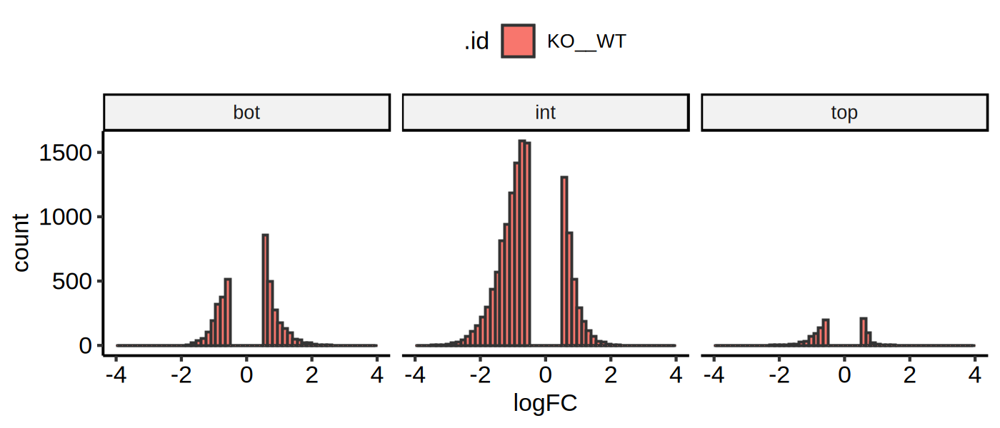

In [394]:
ex = 10000

gene_sel = hsa_deg_dt[.id == 'KO__WT' & padj < .1 & log2FoldChange < 0, ][!duplicated(rn), .(chr, start, end, strand)]
gene_sel[, tag := paste0(chr, '_', start, '_', end) ]
gene_sel[, start := start - ex ]
gene_sel[, end := end + ex ]
dim(gene_sel)

gene_gr = makeGRangesFromDataFrame(gene_sel[!duplicated(tag), ], keep.extra.columns = T)
length(gene_gr) 
meth_gr = makeGRangesFromDataFrame(hsa_dmp_dt[!is.na(chr) & !duplicated(tag), .(chr, start, end, logFC, adj.P.Val, rn, ID, .id, probe_grp2, tag)], 
                                   keep.extra.columns = T, seqnames.field = 'chr', start.field = 'start', end.field = 'end', ignore.strand = T)
length(meth_gr)

ov = findOverlapsOfPeaks(meth_gr, gene_gr) 

plotdat = as.data.table(ov$overlappingPeaks$meth_gr[, 1:13])
tag_sel = plotdat$tag
length(tag_sel)

plotdat = hsa_dmp_dt[tag %in% tag_sel & .id == 'KO__WT' & !is.na(probe_grp2), ]

# based on m value
cut = .5
options(repr.plot.width = 7, repr.plot.height = 3, repr.plot.res = 200)
plotdat1 = plotdat[ logFC > cut & adj.P.Val < 0.05, ]
plotdat2 = plotdat[ logFC < -cut & adj.P.Val < 0.05, ]
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1)
fname = '~/WenhuoHu/plot/k562_DnGene_DMP_KO_WT.pdf'
ggsave(gg, file = fname, width = 7, height = 3)
gg


In [384]:
head(hsa_deg_dt)

rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,chr,start,end,strand,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>,<chr>,<chr>
LOC102724908,KO__WT,5491.416,5.775858,0.1751951,32.96814,2.325567e-238,3.785558e-234,chr19,28606687,28615229,+,up
LOC102724908,DKO__WT,5491.416,5.691842,0.1752001,32.48767,1.592226e-231,2.591826e-227,chr19,28606687,28615229,+,up
LOC102724908,DKO_B1SxxS__WT,5491.416,5.587917,0.1752265,31.88969,3.711288e-223,5.745073e-219,chr19,28606687,28615229,+,up
LOC102724908,DKO_B1K222A__WT,5491.416,5.368348,0.1752416,30.63398,4.319204e-206,6.858464e-202,chr19,28606687,28615229,+,up
LOC102724908,DKO_B1__WT,5491.416,5.168412,0.1752678,29.48866,4.024318e-191,6.550785e-187,chr19,28606687,28615229,+,up
LOC102724908,DKO_B1M__WT,5491.416,5.013759,0.1753017,28.60074,6.577697e-180,9.920482e-176,chr19,28606687,28615229,+,up


In [385]:
cmp = 'DKO__DKO_B1'

head(hsa_deg_dt[.id == cmp & padj < .1 & log2FoldChange < 0, ])

rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,chr,start,end,strand,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>,<chr>,<chr>
BCAT1,DKO__DKO_B1,41533.2332,-6.3994897,0.28487943,-22.46385,9.369946e-112,1.487854e-107,chr12,24810023,24949459,-,dn
PPIC,DKO__DKO_B1,152.4513,-2.3606689,0.12915467,-18.27784,1.242419e-74,6.576122e-71,chr5,123023382,123036730,-,dn
ASAP2,DKO__DKO_B1,224.3072,-2.4019486,0.13382119,-17.94894,4.891492e-72,1.553440e-68,chr2,9206764,9405683,+,dn
COTL1,DKO__DKO_B1,3265.2064,-1.1479049,0.06539057,-17.55459,5.485780e-69,1.451812e-65,chr16,84565595,84618096,-,dn
LAPTM5,DKO__DKO_B1,281.0407,-2.3040674,0.14407355,-15.99230,1.445943e-57,3.280019e-54,chr1,30732467,30757836,-,dn
TRAK1,DKO__DKO_B1,875.3180,-0.8990575,0.06114200,-14.70442,6.038783e-49,1.065443e-45,chr3,42091253,42225890,+,dn


[1] 3289    5

[1] 3287

[1] 923384

duplicated or NA names found. 
                Rename all the names by numbers.

duplicated or NA names found. 
                Rename all the names by numbers.

Warning message in .merge_two_Seqinfo_objects(x, y):
"Each of the 2 combined objects has sequence levels not in the other:
  - in 'x': chrY
  - in 'y': chrM, chr1_KI270711v1_random, chr1_KI270713v1_random, chr3_GL000221v1_random, chr17_GL000205v2_random, chrUn_GL000220v1, chrUn_KI270742v1, chrUn_KI270745v1, chrUn_KI270754v1
  Make sure to always combine/compare objects based on the same reference
  genome (use suppressWarnings() to suppress this warning)."


[1] 157727

Warning message:
"Removed 4 rows containing non-finite outside the scale range (`stat_bin()`)."
Warning message:
"Removed 3 rows containing non-finite outside the scale range (`stat_bin()`)."
Warning message:
"Removed 3 rows containing missing values or values outside the scale range (`geom_bar()`)."
Warning message:
"Removed 3 rows containing missing values or values outside the scale range (`geom_bar()`)."
Warning message:
"Removed 4 rows containing non-finite outside the scale range (`stat_bin()`)."
Warning message:
"Removed 3 rows containing non-finite outside the scale range (`stat_bin()`)."
Warning message:
"Removed 3 rows containing missing values or values outside the scale range (`geom_bar()`)."
Warning message:
"Removed 3 rows containing missing values or values outside the scale range (`geom_bar()`)."


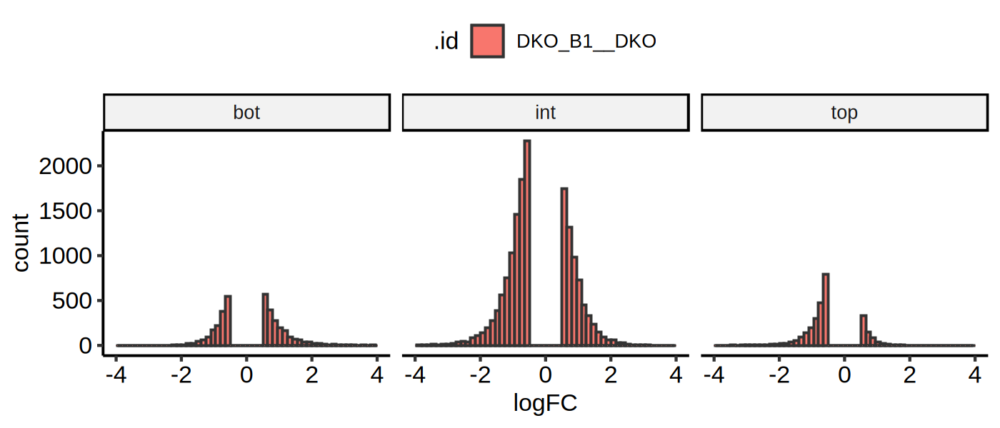

In [395]:
ex = 10000
cmp = 'DKO__DKO_B1'
gene_sel = hsa_deg_dt[.id == cmp & padj < .1 & log2FoldChange > 0, ][!duplicated(rn), .(chr, start, end, strand)]
gene_sel[, tag := paste0(chr, '_', start, '_', end) ]
gene_sel[, start := start - ex ]
gene_sel[, end := end + ex ]
dim(gene_sel)

gene_gr = makeGRangesFromDataFrame(gene_sel[!duplicated(tag), ], keep.extra.columns = T)
length(gene_gr) 
meth_gr = makeGRangesFromDataFrame(hsa_dmp_dt[!is.na(chr) & !duplicated(tag), .(chr, start, end, logFC, adj.P.Val, rn, ID, .id, probe_grp2, tag)], 
                                   keep.extra.columns = T, seqnames.field = 'chr', start.field = 'start', end.field = 'end', ignore.strand = T)
length(meth_gr)

ov = findOverlapsOfPeaks(meth_gr, gene_gr) 

plotdat = as.data.table(ov$overlappingPeaks$meth_gr[, 1:13])
tag_sel = plotdat$tag
length(tag_sel)

cmp = 'DKO_B1__DKO'
plotdat = hsa_dmp_dt[tag %in% tag_sel & .id == cmp & !is.na(probe_grp2), ]

# based on m value
cut = .5
options(repr.plot.width = 7, repr.plot.height = 3, repr.plot.res = 200)
plotdat1 = plotdat[ logFC > cut & adj.P.Val < 0.05, ]
plotdat2 = plotdat[ logFC < -cut & adj.P.Val < 0.05, ]
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1)
fname = '~/WenhuoHu/plot/k562_DnGene_DMP_DKO_B1__DKO.pdf'
ggsave(gg, file = fname, width = 7, height = 3)
gg


In [323]:
nrow(plotdat1) 
nrow(plotdat2) 

[1] 3169

[1] 4531

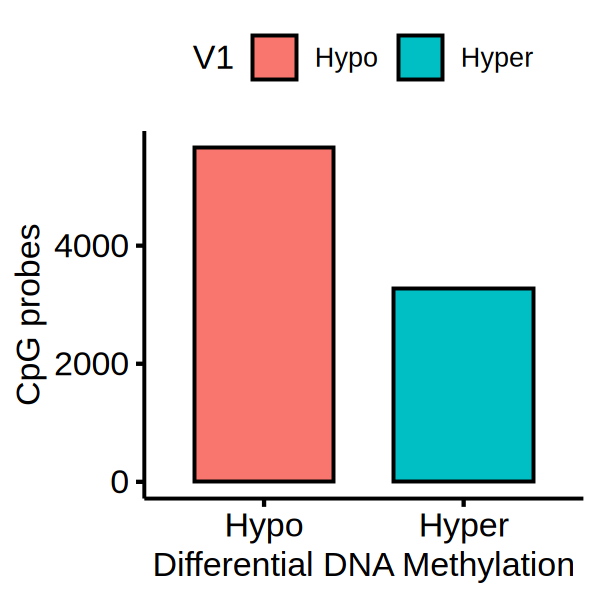

In [318]:
plotdat = rbind(plotdat1, plotdat2)
plotdat[logFC > 0, dmp := 'Hyper' ]
plotdat[logFC < 0, dmp := 'Hypo' ]
plotdat = as.data.table(table(plotdat$dmp))
plotdat[, V1 := factor(V1, levels = c('Hypo', 'Hyper') ) ]
options(repr.plot.width = 3, repr.plot.height = 3, repr.plot.res = 200)
gg = ggbarplot(plotdat, x = 'V1', y = 'N', fill = 'V1') + xlab('Differential DNA Methylation') + ylab('CpG probes')
gg
fname = '~/WenhuoHu/plot/k562_barplot_UpGene_DMP_DKO_WT.pdf'
ggsave(gg, file = fname, width = 7, height = 3)


In [286]:
options(width =130)

In [389]:
table(hsa_deg_dt$.id)


            DKO__DKO_B1        DKO__DKO_B1K222A            DKO__DKO_B1M         DKO__DKO_B1SxxS                 DKO__KO                 DKO__WT 
                  29972                   29972                   29972                   29972                   29972                   29972 
    DKO_B1__DKO_B1K222A      DKO_B1__DKO_B1SxxS              DKO_B1__KO              DKO_B1__WT DKO_B1K222A__DKO_B1SxxS         DKO_B1K222A__KO 
                  29972                   29972                   29972                   29972                   29972                   29972 
        DKO_B1K222A__WT         DKO_B1M__DKO_B1    DKO_B1M__DKO_B1K222A     DKO_B1M__DKO_B1SxxS             DKO_B1M__KO             DKO_B1M__WT 
                  29972                   29972                   29972                   29972                   29972                   29972 
         DKO_B1SxxS__KO          DKO_B1SxxS__WT                  KO__WT 
                  29972                   29972         

In [393]:
ex = 10000
cmp = 'DKO__DKO_B1SxxS'
gene_sel = hsa_deg_dt[.id == cmp & padj < .1 & log2FoldChange > 0, ][!duplicated(rn), .(chr, start, end, strand)]
gene_sel[, tag := paste0(chr, '_', start, '_', end) ]
gene_sel[, start := start - ex ]
gene_sel[, end := end + ex ]
dim(gene_sel)

gene_gr = makeGRangesFromDataFrame(gene_sel[!duplicated(tag), ], keep.extra.columns = T)
length(gene_gr) 
meth_gr = makeGRangesFromDataFrame(hsa_dmp_dt[!is.na(chr) & !duplicated(tag), .(chr, start, end, logFC, adj.P.Val, rn, ID, .id, probe_grp2, tag)], 
                                   keep.extra.columns = T, seqnames.field = 'chr', start.field = 'start', end.field = 'end', ignore.strand = T)
length(meth_gr)

ov = findOverlapsOfPeaks(meth_gr, gene_gr) 

plotdat = as.data.table(ov$overlappingPeaks$meth_gr[, 1:13])
tag_sel = plotdat$tag
length(tag_sel)

cmp = 'DKO_B1SxxS__DKO'
plotdat = hsa_dmp_dt[tag %in% tag_sel & .id == cmp & !is.na(probe_grp2), ]

# based on m value
cut = .5
options(repr.plot.width = 7, repr.plot.height = 3, repr.plot.res = 200)
plotdat1 = plotdat[ logFC > cut & adj.P.Val < 0.05, ]
plotdat2 = plotdat[ logFC < -cut & adj.P.Val < 0.05, ]
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1)
fname = '~/WenhuoHu/plot/k562_UpGene_DMP_DKO_B1SxxS__DKO.pdf'
ggsave(gg, file = fname, width = 7, height = 3)
gg


[1] 3522    5

[1] 3521

[1] 923384

duplicated or NA names found. 
                Rename all the names by numbers.

duplicated or NA names found. 
                Rename all the names by numbers.

Warning message in .merge_two_Seqinfo_objects(x, y):
"Each of the 2 combined objects has sequence levels not in the other:
  - in 'x': chrY
  - in 'y': chrM, chr3_GL000221v1_random, chr4_GL000008v2_random, chr11_KI270721v1_random, chr16_KI270728v1_random, chrUn_GL000219v1, chrUn_GL000224v1, chrUn_KI270745v1, chrUn_KI270750v1, chrUn_KI270754v1
  Make sure to always combine/compare objects based on the same reference
  genome (use suppressWarnings() to suppress this warning)."


[1] 166627

ERROR: [1m[33mError[39m in `combine_vars()`:[22m
[1m[22m[33m![39m Faceting variables must have at least one value.


In [397]:
1:3

[1] 1 2 3

[1] 1802    5

[1] 1801

[1] 923384

duplicated or NA names found. 
                Rename all the names by numbers.

duplicated or NA names found. 
                Rename all the names by numbers.

Warning message in .merge_two_Seqinfo_objects(x, y):
"Each of the 2 combined objects has sequence levels not in the other:
  - in 'x': chrY
  - in 'y': chrM, chrUn_GL000219v1, chrUn_KI270745v1, chrUn_KI270754v1
  Make sure to always combine/compare objects based on the same reference
  genome (use suppressWarnings() to suppress this warning)."


[1] 94217

Warning message:
"Removed 3 rows containing missing values or values outside the scale range (`geom_bar()`)."
Warning message:
"Removed 3 rows containing missing values or values outside the scale range (`geom_bar()`)."
Warning message:
"Removed 3 rows containing missing values or values outside the scale range (`geom_bar()`)."
Warning message:
"Removed 3 rows containing missing values or values outside the scale range (`geom_bar()`)."


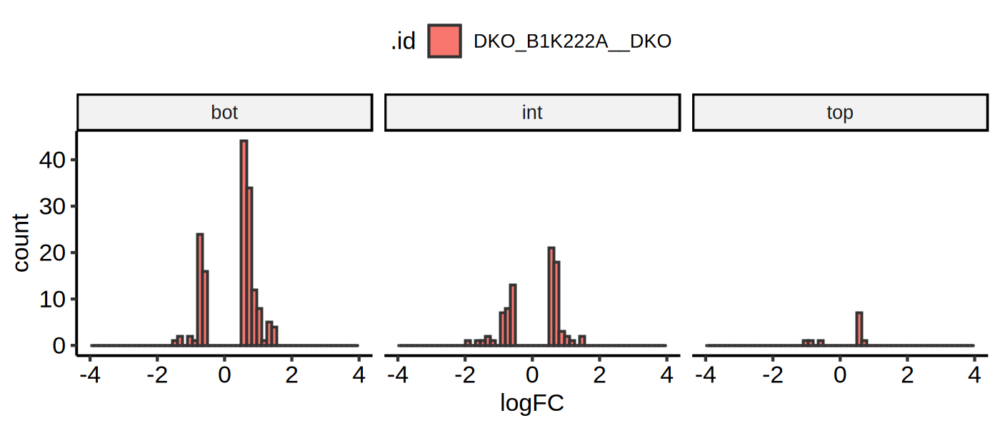

In [396]:
ex = 10000
cmp = 'DKO__DKO_B1K222A'
gene_sel = hsa_deg_dt[.id == cmp & padj < .1 & log2FoldChange > 0, ][!duplicated(rn), .(chr, start, end, strand)]
gene_sel[, tag := paste0(chr, '_', start, '_', end) ]
gene_sel[, start := start - ex ]
gene_sel[, end := end + ex ]
dim(gene_sel)

gene_gr = makeGRangesFromDataFrame(gene_sel[!duplicated(tag), ], keep.extra.columns = T)
length(gene_gr) 
meth_gr = makeGRangesFromDataFrame(hsa_dmp_dt[!is.na(chr) & !duplicated(tag), .(chr, start, end, logFC, adj.P.Val, rn, ID, .id, probe_grp2, tag)], 
                                   keep.extra.columns = T, seqnames.field = 'chr', start.field = 'start', end.field = 'end', ignore.strand = T)
length(meth_gr)

ov = findOverlapsOfPeaks(meth_gr, gene_gr) 

plotdat = as.data.table(ov$overlappingPeaks$meth_gr[, 1:13])
tag_sel = plotdat$tag
length(tag_sel)

cmp = 'DKO_B1K222A__DKO'
plotdat = hsa_dmp_dt[tag %in% tag_sel & .id == cmp & !is.na(probe_grp2), ]

# based on m value
cut = .5
options(repr.plot.width = 7, repr.plot.height = 3, repr.plot.res = 200)
plotdat1 = plotdat[ logFC > cut & adj.P.Val < 0.05, ]
plotdat2 = plotdat[ logFC < -cut & adj.P.Val < 0.05, ]
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('probe_grp2', nrow = 1)
fname = '~/WenhuoHu/plot/k562_UpGene_DMP_DKO_B1K222A__DKO.pdf'
ggsave(gg, file = fname, width = 7, height = 3)
gg


[1] 4213    5

[1] 4211

[1] 923384

duplicated or NA names found. 
                Rename all the names by numbers.

duplicated or NA names found. 
                Rename all the names by numbers.

Warning message in .merge_two_Seqinfo_objects(x, y):
"Each of the 2 combined objects has sequence levels not in the other:
  - in 'x': chrY
  - in 'y': chrM, chr1_KI270711v1_random, chr1_KI270713v1_random, chr4_GL000008v2_random, chr11_KI270721v1_random, chr14_GL000194v1_random, chr16_KI270728v1_random, chr17_GL000205v2_random, chrUn_GL000218v1, chrUn_KI270742v1, chrUn_KI270745v1, chrUn_KI270750v1, chrUn_KI270754v1
  Make sure to always combine/compare objects based on the same reference
  genome (use suppressWarnings() to suppress this warning)."


[1] 204519

Warning message:
"Removed 9 rows containing non-finite outside the scale range (`stat_bin()`)."
Warning message:
"Removed 32 rows containing non-finite outside the scale range (`stat_bin()`)."
Warning message:
"Removed 11 rows containing missing values or values outside the scale range (`geom_bar()`)."
Warning message:
"Removed 11 rows containing missing values or values outside the scale range (`geom_bar()`)."


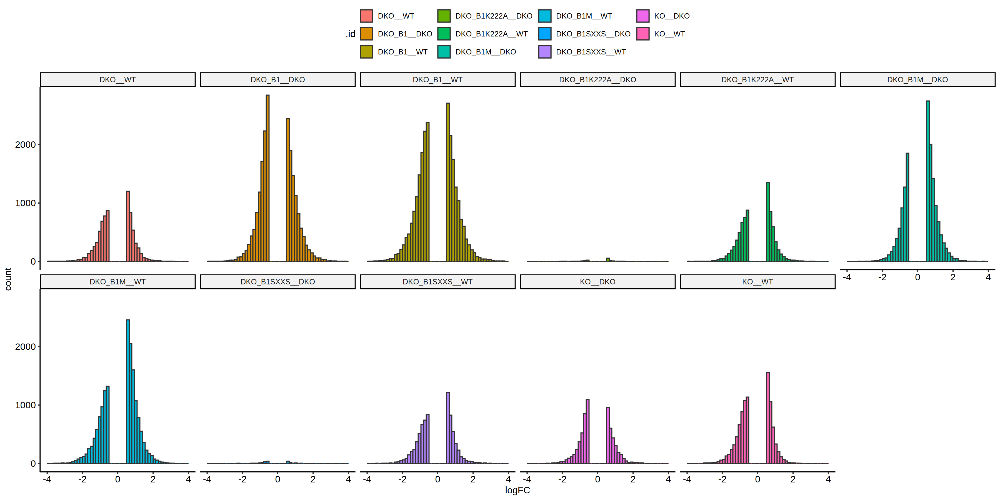

In [374]:
ex = 10000

gene_sel = hsa_deg_dt[.id == 'KO__WT' & padj < .1 & log2FoldChange > 0, ][!duplicated(rn), .(chr, start, end, strand)]
gene_sel[, tag := paste0(chr, '_', start, '_', end) ]
gene_sel[, start := start - ex ]
gene_sel[, end := end + ex ]
dim(gene_sel)

gene_gr = makeGRangesFromDataFrame(gene_sel[!duplicated(tag), ], keep.extra.columns = T)
length(gene_gr) 
meth_gr = makeGRangesFromDataFrame(hsa_dmp_dt[!is.na(chr) & !duplicated(tag), .(chr, start, end, logFC, adj.P.Val, rn, ID, .id, probe_grp2, tag)], 
                                   keep.extra.columns = T, seqnames.field = 'chr', start.field = 'start', end.field = 'end', ignore.strand = T)
length(meth_gr)

ov = findOverlapsOfPeaks(meth_gr, gene_gr) 

plotdat = as.data.table(ov$overlappingPeaks$meth_gr[, 1:13])
tag_sel = plotdat$tag
length(tag_sel)

plotdat = hsa_dmp_dt[tag %in% tag_sel & probe_grp2 == 'int', ]
plotdat = plotdat[!is.na(probe_grp2) & probe_grp2 == 'int', ]

# based on m value
cut = .5
options(repr.plot.width = 18, repr.plot.height = 9, repr.plot.res = 200)
plotdat1 = plotdat[ logFC > cut & adj.P.Val < 0.05, ]
plotdat2 = plotdat[ logFC < -cut & adj.P.Val < 0.05, ]
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('.id', nrow = 2)
#fname = '~/WenhuoHu/plot/human_dmp_p1.pdf'
#ggsave(gg, file = fname, width = 13, height = 6)
gg


In [285]:
length(tag_sel)


[1] 595792

[1] 3328    5

[1] 3328

[1] 95991

duplicated or NA names found. 
                Rename all the names by numbers.

duplicated or NA names found. 
                Rename all the names by numbers.

Warning message in .merge_two_Seqinfo_objects(x, y):
“Each of the 2 combined objects has sequence levels not in the other:
  - in 'x': chrY, chr0
  - in 'y': chr4_GL000008v2_random, chr11_KI270721v1_random, chr14_GL000194v1_random, chr16_KI270728v1_random, chrUn_GL000218v1, chrUn_GL000219v1, chrUn_GL000224v1, chrUn_KI270741v1, chrUn_KI270750v1, chrUn_KI270754v1
  Make sure to always combine/compare objects based on the same reference
  genome (use suppressWarnings() to suppress this warning).”
Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 11 rows containing missing values or values outside the scale range (`geom_bar()`).”
Warning message:
“Removed 11 rows containing missing values or values outside the scale range (`geom_bar()`).”
Warning message:
“Rem

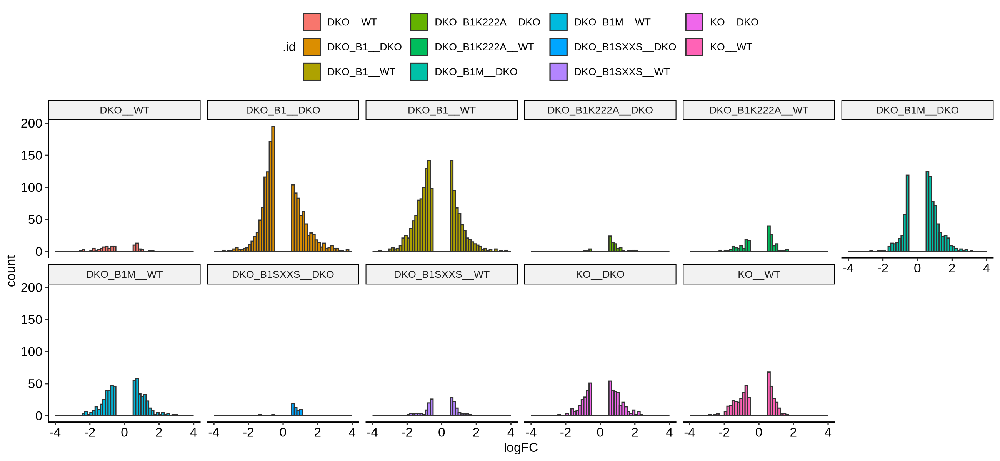

In [383]:
gene_sel = hsa_deg_dt[.id == 'DKO_B1__WT' & padj < .1 & log2FoldChange > 0, ][!duplicated(rn), .(chr, start, end, strand)]
gene_sel[, tag := paste0(chr, '_', start, '_', end) ]
gene_sel[, start := start - ex ]
gene_sel[, end := end + ex ]

dim(gene_sel)

gene_gr = makeGRangesFromDataFrame(gene_sel[!duplicated(tag), ], keep.extra.columns = T)
length(gene_gr) 
meth_gr = makeGRangesFromDataFrame(hsa_dmp_dt[!is.na(chr) & !duplicated(tag), .(chr, start, end, logFC, adj.P.Val, rn, ID, .id)], keep.extra.columns = T, seqnames.field = 'chr', start.field = 'start', end.field = 'end', ignore.strand = T)
length(meth_gr)

ov = findOverlapsOfPeaks(meth_gr, gene_gr) 

plotdat = as.data.table(ov$overlappingPeaks$meth_gr[, 1:11])

# based on m value
cut = .5
options(repr.plot.width = 13, repr.plot.height = 6, repr.plot.res = 200)
plotdat1 = plotdat[ logFC > cut & adj.P.Val < 0.05, ]
plotdat2 = plotdat[ logFC < -cut & adj.P.Val < 0.05, ]
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .15, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .15, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-4, 4) + facet_wrap('.id', nrow = 2)
fname = '~/WenhuoHu/plot/human_dmp_p2.pdf'
ggsave(gg, file = fname, width = 13, height = 6)
gg


[1] 2859    5

[1] 2859

[1] 95991

duplicated or NA names found. 
                Rename all the names by numbers.

duplicated or NA names found. 
                Rename all the names by numbers.

Warning message in .merge_two_Seqinfo_objects(x, y):
“Each of the 2 combined objects has sequence levels not in the other:
  - in 'x': chrY, chr0
  - in 'y': chr4_GL000008v2_random, chr11_KI270721v1_random, chr14_GL000194v1_random, chrUn_GL000218v1, chrUn_GL000219v1, chrUn_GL000224v1, chrUn_KI270741v1, chrUn_KI270750v1, chrUn_KI270754v1
  Make sure to always combine/compare objects based on the same reference
  genome (use suppressWarnings() to suppress this warning).”
Warning message:
“Removed 35 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 14 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 22 rows containing missing values or values outside the scale range (`geom_bar()`).”
Warning message:
“Removed 22 rows containing missing values

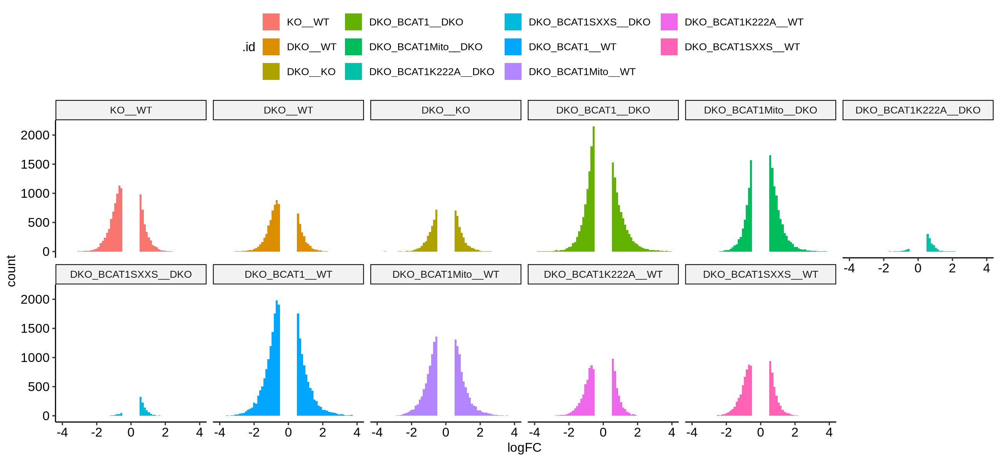

In [270]:
gene_sel = hsa_deg_dt[.id == 'DKO_B1__WT' & padj < .05 & log2FoldChange > 0, ][!duplicated(rn), .(chr, start, end, strand)]
gene_sel[, tag := paste0(chr, '_', start, '_', end) ]
dim(gene_sel)

gene_gr = makeGRangesFromDataFrame(gene_sel[!duplicated(tag), ], keep.extra.columns = T)
length(gene_gr) 
meth_gr = makeGRangesFromDataFrame(hsa_dmp_dt[!is.na(chr) & !duplicated(tag), .(chr, start, end, id, logFC, adj.P.Val, rn, ID, .id)], keep.extra.columns = T, seqnames.field = 'chr', start.field = 'start', end.field = 'end', ignore.strand = T)
length(meth_gr)

ov = findOverlapsOfPeaks(meth_gr, gene_gr) 

plotdat = as.data.table(ov$overlappingPeaks$meth_gr)

# based on m value
cut = .5
options(repr.plot.width = 13, repr.plot.height = 6, repr.plot.res = 200)
hsa_dmp_dt[, .id := factor(.id, levels = colnames(contMatrix)) ]
plotdat1 = hsa_dmp_dt[ logFC > cut & adj.P.Val < 0.05, ]
plotdat2 = hsa_dmp_dt[ logFC < -cut & adj.P.Val < 0.05, ]
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = logFC, fill = .id), binwidth = .12, boundary = cut) +
geom_histogram(data = plotdat2, aes(x = logFC, fill = .id), binwidth = .12, boundary = -cut) +
theme_pubr() + xlim(-4, 4) + facet_wrap('.id', nrow = 2)
fname = '~/WenhuoHu/plot/human_dmp.pdf'
ggsave(gg, file = fname, width = 13, height = 6)
gg


Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_bin()`).”


pdf 
  2

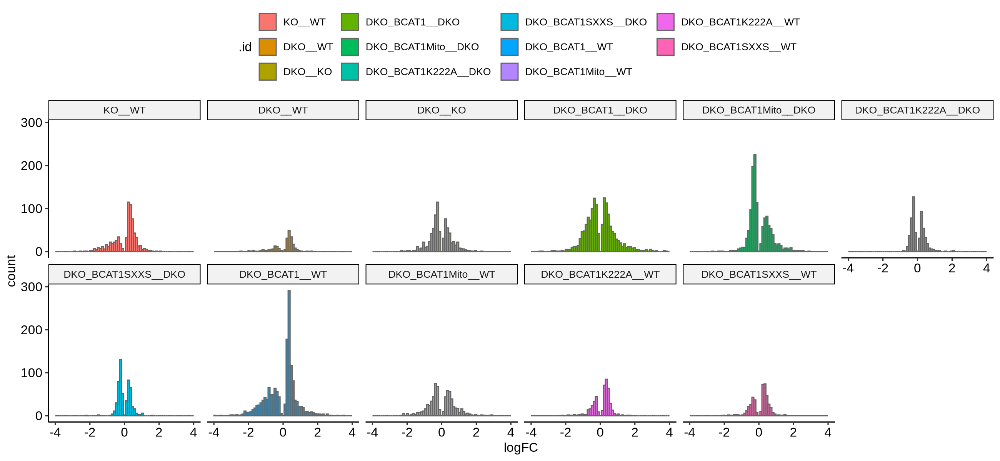

In [269]:
# based on m value
options(repr.plot.width = 13, repr.plot.height = 6, repr.plot.res = 200)
plotdat[, .id := factor(.id, levels = colnames(contMatrix)) ]
ggplot(plotdat[, .(logFC, .id)], aes(x = logFC, fill = .id)) + 
geom_histogram(bins = 70, color = 'grey40') + theme_pubr() + xlim(-4, 4) + facet_wrap('.id', nrow = 2)
fname = 'plot/human_dmp.pdf'
pdf(file = fname, width = 13, height = 6)
ggplot(plotdat[, .(logFC, .id)], aes(x = logFC, fill = .id)) + 
geom_histogram(bins = 70, color = 'grey40') + theme_pubr() + xlim(-4, 4) + facet_wrap('.id', nrow = 2)
dev.off()


Warning message:
“Removed 7 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 7 rows containing non-finite outside the scale range (`stat_bin()`).”


pdf 
  2

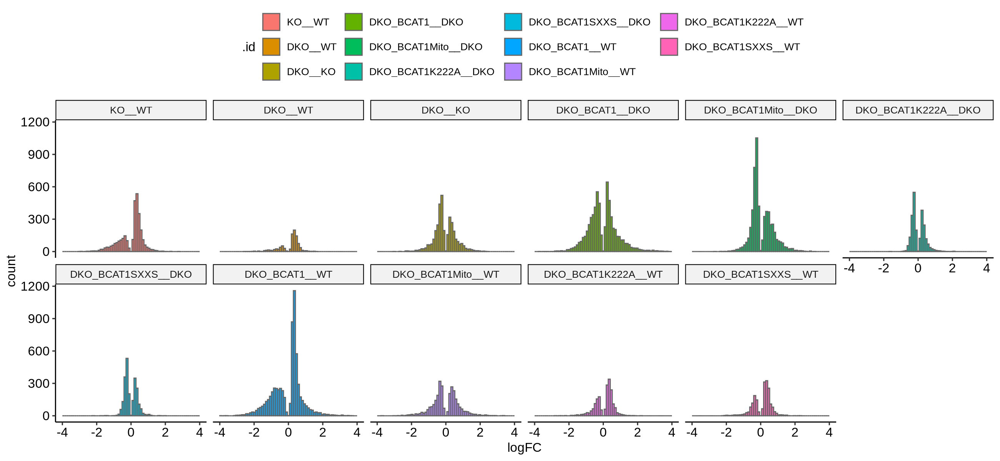

In [202]:
# based on m value
options(repr.plot.width = 13, repr.plot.height = 6, repr.plot.res = 200)
plotdat[, .id := factor(.id, levels = colnames(contMatrix)) ]
ggplot(plotdat[, .(logFC, .id)], aes(x = logFC, fill = .id)) + 
geom_histogram(bins = 70, color = 'grey40') + theme_pubr() + xlim(-4, 4) + facet_wrap('.id', nrow = 2)
fname = 'plot/human_dmp.pdf'
pdf(file = fname, width = 13, height = 6)
ggplot(plotdat[, .(logFC, .id)], aes(x = logFC, fill = .id)) + 
geom_histogram(bins = 70, color = 'grey40') + theme_pubr() + xlim(-4, 4) + facet_wrap('.id', nrow = 2)
dev.off()


In [175]:
ov$peaklist$`meth_gr///gene_gr`

GRanges object with 10123 ranges and 1 metadata column:
          seqnames              ranges strand |
             <Rle>           <IRanges>  <Rle> |
      [1]     chr1       911422-914782      * |
      [2]     chr1       921279-923745      * |
      [3]     chr1       925740-959299      * |
      [4]     chr1       960586-965719      * |
      [5]     chr1       966496-975108      * |
      ...      ...                 ...    ... .
  [10119]     chrX 154835787-155022723      * |
  [10120]     chrX 155026788-155056916      * |
  [10121]     chrX 155061621-155071272      * |
  [10122]     chrX 155071419-155123074      * |
  [10123]     chrX 155492534-155612961      * |
                                                 peakNames
                                           <CharacterList>
      [1]     gene_gr__06991,meth_gr__57627,meth_gr__11365
      [2]                    gene_gr__06704,meth_gr__29372
      [3] gene_gr__10895,meth_gr__09283,meth_gr__29405,...
      [4]                

In [ ]:
# gene expression reuslts
comb_ii = 'ITD_B1__ITD_MIGR'
deg_dt_sig = hsa_deg_dt[.id == comb_ii & padj < 0.1, .(rn, .id, log2FoldChange, pvalue, padj, chr, start, end, updn)]
deg_dt_sig[, tag := paste0(.id, '_', chr, '_', start, '_', end) ]
deg_dt_sig = deg_dt_sig[!duplicated(tag), ]
deg_dt_sig[, name := paste0('deg_name_', 1:nrow(deg_dt_sig)) ]
deg_dt_sig_gr = makeGRangesFromDataFrame(deg_dt_sig, keep.extra.columns = T)

# DNA methylation results
comb_ii = 'ITD_MIGR__ITD_B1'
plotdat = dmp_dt[.id == comb_ii, .(.id, rn, logFC, adj.P.Val, CHR, MAPINFO, name)]
plotdat[, chr := paste0('chr', CHR) ]
plotdat[, start := MAPINFO]
plotdat[, end := MAPINFO]
plotdat[, tag := paste0(chr, '_', start) ]
plotdat = plotdat[!duplicated(tag), ]
plotdat[, tag := paste0(chr, '_', start, '_', end) ]
plotdat = plotdat[, .(chr, start, end,  name, logFC, adj.P.Val, .id, tag)]
plotdat = makeGRangesFromDataFrame(plotdat, keep.extra.columns = T)

ov = findOverlapsOfPeaks(Peaks1 = deg_dt_sig_gr, Peaks2 = plotdat, maxgap = 10000) 
ov_dt = as.data.table(ov$overlappingPeaks$`deg_dt_sig_gr///plotdat`)

# based on m value
options(repr.plot.width = 8, repr.plot.height = 3, repr.plot.res = 200)
plotdat = ov_dt[abs(logFC) > .55, c(12, 15:ncol(ov_dt)), with = F]
dim(plotdat)
head(plotdat)

gg = ggplot(plotdat, aes(x = -logFC, fill = .id)) + 
geom_histogram(bins = 70, color = 'grey40') + theme_pubr() + xlim(-4, 4) + facet_wrap('updn', nrow = 1)
gg

#fname = 'plot/mouse_itd_b1_migr.pdf'
#pdf(file = fname, width = 8, height = 3)
#gg
#dev.off()


# up-regulated genes & methylation

In [ ]:
hsa_deg_dt_sig = hsa_deg_dt[.id == 'ITD_B1__ITD_MIGR' & log2FoldChange > 1 & padj < 0.05, .(rn, .id, log2FoldChange, pvalue, padj, chr, start, end)]
hsa_deg_dt_sig[, tag := paste0(chr, '_', start, '_', end) ]
hsa_deg_dt_sig = deg_dt_sig[!duplicated(tag), ]
hsa_deg_dt_sig[, name := paste0('deg_name_', 1:nrow(hsa_deg_dt_sig)) ]
hsa_deg_dt_sig_gr = makeGRangesFromDataFrame(hsa_deg_dt_sig, keep.extra.columns = T)
hsa_deg_dt_sig_gr


In [ ]:
hsa_dmp_dt[, .(chr, start, end,  name, logFC, adj.P.Val, .id)]

In [ ]:
#plotdat = hsa_dmp_dt[(logFC) > 0 & adj.P.Val < 0.05 & .id == 'BCAT1KOC3', .(.id, rn, logFC, adj.P.Val, CHR, MAPINFO, name)]
plotdat = hsa_dmp_dt[logFC  > 0 & adj.P.Val < 0.05 & .id == 'DKO__WT', ]
plotdat[, chr := paste0('chr', CHR) ]
plotdat[, start := MAPINFO]
plotdat[, end := MAPINFO]
plotdat[, tag := paste0(chr, '_', start, '_', end) ]
plotdat = plotdat[!duplicated(tag), ]
plotdat = plotdat[, .(chr, start, end,  name, logFC, adj.P.Val, .id)]
plotdat = makeGRangesFromDataFrame(plotdat, keep.extra.columns = T, seqnames.field = 'chr', start.field = 'start')
head(plotdat)


# regional DMR analysis

In [ ]:
# above is based on :
# https://www.bioconductor.org/packages/release/workflows/vignettes/methylationArrayAnalysis/inst/doc/methylationArrayAnalysis.html#probe-wise-differential-methylation-analysis

# regional analysis is based on :
# https://bioconductor.org/packages/release/bioc/vignettes/DMRcate/inst/doc/EPICv2.pdf


In [276]:
library(DMRcate)

In [279]:
getwd()

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Junhua"

In [273]:
mVals3 <- minfi::logit2(mVals2)

Warning message in minfi::logit2(mVals2):
"NaNs produced"
Warning message in minfi::logit2(mVals2):
"NaNs produced"


In [29]:
mVals3 <- rmSNPandCH(mVals3, rmcrosshyb = FALSE)
#mVals3 <- rmPosReps(mVals3, filter.strategy="mean")

Probe IDs from EPICv1 or earlier detected. Proceeding...

see ?DMRcatedata and browseVignettes('DMRcatedata') for documentation

loading from cache



In [274]:
contMatrix


,KO__WT,DKO__WT,DKO__KO,DKO_BCAT1__DKO,DKO_BCAT1Mito__DKO,DKO_BCAT1K222A__DKO,DKO_BCAT1SXXS__DKO,DKO_BCAT1__WT,DKO_BCAT1Mito__WT,DKO_BCAT1K222A__WT,DKO_BCAT1SXXS__WT
DKO,0,1,1,-1,-1,-1,-1,0,0,0,0
DKO_BCAT1,0,0,0,1,0,0,0,1,0,0,0
DKO_BCAT1K222A,0,0,0,0,0,1,0,0,0,1,0
DKO_BCAT1Mito,0,0,0,0,1,0,0,0,1,0,0
DKO_BCAT1SXXS,0,0,0,0,0,0,1,0,0,0,1
KO,1,0,-1,0,0,0,0,0,0,0,0
WT,-1,-1,0,0,0,0,0,-1,-1,-1,-1


In [320]:
#grset <- makeGenomicRatioSetFromMatrix(mat = mVals2, array = "IlluminaHumanMethylationEPIC", annotation = "ilm10b5.hg38",  what = 'M')


In [275]:
dmr_list = lapply(1:11, function(ii){
    fit = lmFit(mVals2, design) 
    fit = contrasts.fit(fit, contMatrix)
    fit = eBayes(fit)
    tt = topTable(fit, coef = ii, number = nrow(mVals2))
    nsig = sum(tt$adj.P.Val < 0.05)
    betafit = lmFit(ilogit2(mVals2), design)
    betafit = contrasts.fit(betafit, contMatrix)
    betafit = eBayes(betafit)
    betatt = topTable(betafit, coef = ii, number = nrow(mVals2))
    m = match(rownames(tt), rownames(betatt))
    tt$diff = betatt$logFC[m]
    m = match(rownames(mVals2), rownames(tt))
    tt = tt[m, ]
    anno = getAnnotation(IlluminaHumanMethylationEPICanno.ilm10b5.hg38)
    stat = tt$t
    tt = cbind(tt, anno[rownames(tt), ])
    annotated = GRanges(as.character(tt$chr), IRanges(tt$pos, tt$pos), stat = stat, diff = tt$diff, ind.fdr = tt$adj.P.Val,  is.sig = tt$adj.P.Val < 0.05)
    names(annotated) = rownames(tt)
    annotated = sort(annotated)
    annotated = new("CpGannotated", ranges = annotated)
    annotated
})


In [ ]:
dmr_list2 = lapply(1:11, function(ii){dmrcate(dmr_list[[ii]], lambda=1000, C=2)})


In [ ]:
dmr_list3 = lapply(1:11, function(ii){
    res = dmr_list2[[ii]]
    as.data.table(as.data.frame(extractRanges(res)))
})


In [279]:
names(dmr_list3) = colnames(contMatrix)
dmr_dt = rbindlist(dmr_list3, idcol = T)
head(dmr_dt)

.id,seqnames,start,end,width,strand,no.cpgs,min_smoothed_fdr,Stouffer,HMFDR,Fisher,maxdiff,meandiff,overlapping.genes
<chr>,<fct>,<int>,<int>,<int>,<fct>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
KO__WT,chr16,49317262,49317767,506,*,2,4.300384e-180,2.497371e-08,4.321072e-20,9.306452e-19,0.3522825,0.17734087,NA
KO__WT,chr4,120133382,120134582,1201,*,3,2.005574e-76,5.279068e-12,1.530333e-14,1.990768e-17,-0.2734587,-0.03334540,"USP53, RP11-455G16.1"
KO__WT,chr10,104372682,104373849,1168,*,3,1.499500e-55,4.451717e-13,1.663522e-10,2.820868e-17,-0.1557026,-0.10099251,SUFU
KO__WT,chr3,196728589,196728969,381,*,2,3.452951e-118,1.033399e-11,1.166105e-17,4.415802e-17,-0.3848249,-0.23862166,"MFI2-AS1, MFI2"
KO__WT,chr3,30792902,30793799,898,*,2,4.708530e-94,9.798980e-07,4.891579e-16,8.306981e-15,-0.1965554,-0.09927880,GADL1
KO__WT,chr2,16409618,16410143,526,*,2,1.908090e-33,1.764609e-14,2.239867e-09,4.304344e-14,-0.2072880,-0.07215543,AC010745.2


In [280]:
saveRDS(dmr_dt, file = 'nb_methylation_dmr_dt_Aug24.rds')

# summary for DMR

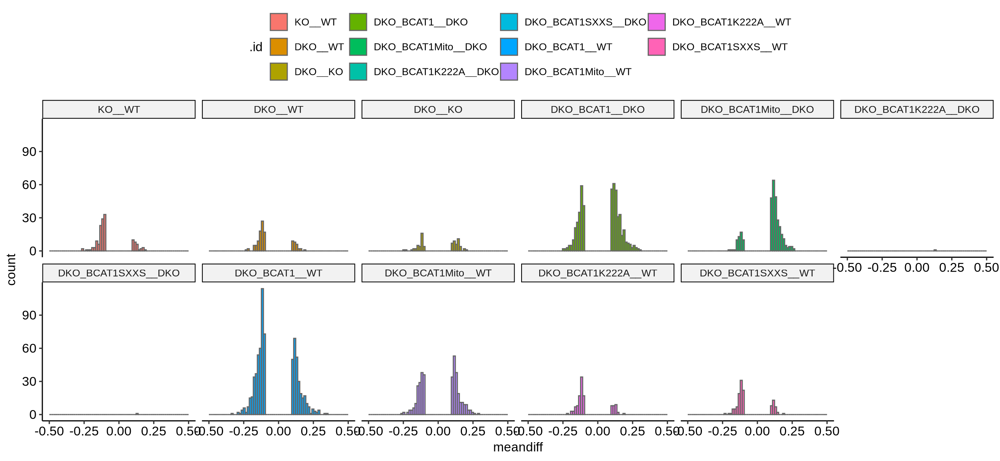

In [282]:
options(repr.plot.width = 13, repr.plot.height = 6, repr.plot.res = 200)
plotdat = dmr_dt[HMFDR < 0.001 & abs(meandiff) > .1, ]
plotdat[, .id := factor(.id, levels = colnames(contMatrix)) ]
ggplot(plotdat, aes(x = meandiff, fill = .id)) + 
geom_histogram(bins = 70, color = 'grey40') + theme_pubr() + xlim(-0.5, 0.5) + facet_wrap('.id', nrow = 2)


# QC 2

In [292]:
dim(bVals)
dim(targets2)

[1] 114003     42

[1] 39 13

In [299]:
bVals2 = bVals[, targets2$sample_name]

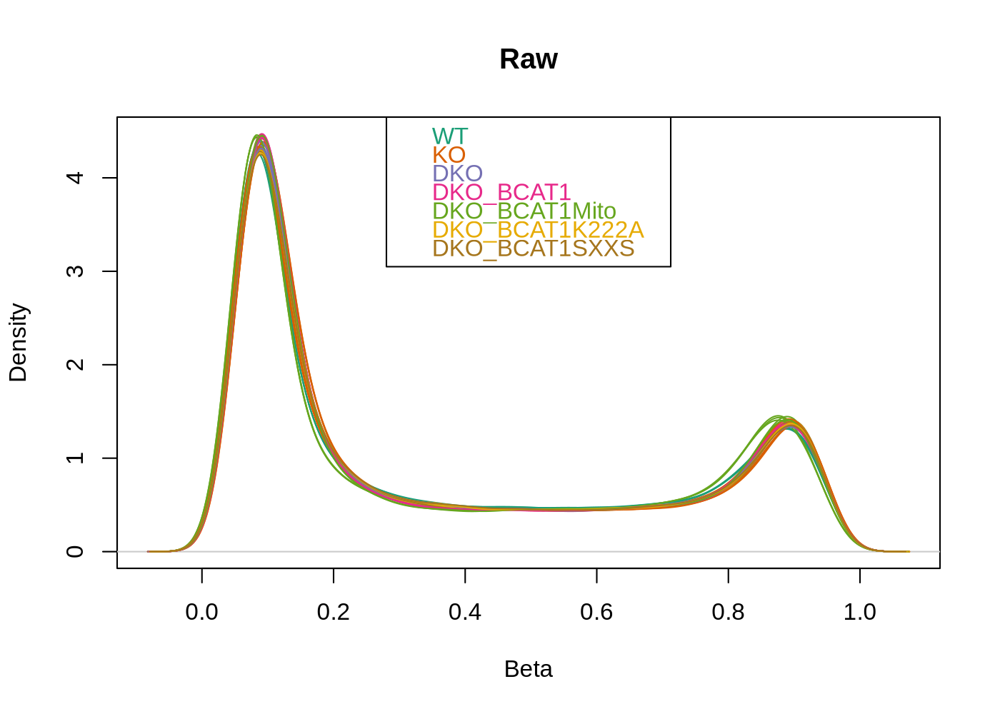

In [309]:
options(repr.plot.width = 7, repr.plot.height = 5, repr.plot.res = 200)
densityPlot(bVals2, sampGroups=targets2$cellType,main="Raw", legend=FALSE)
legend("top", legend = levels(factor(targets2$cellType)),  text.col=brewer.pal(8,"Dark2"))


In [316]:
pal <- brewer.pal(8,"Dark2")


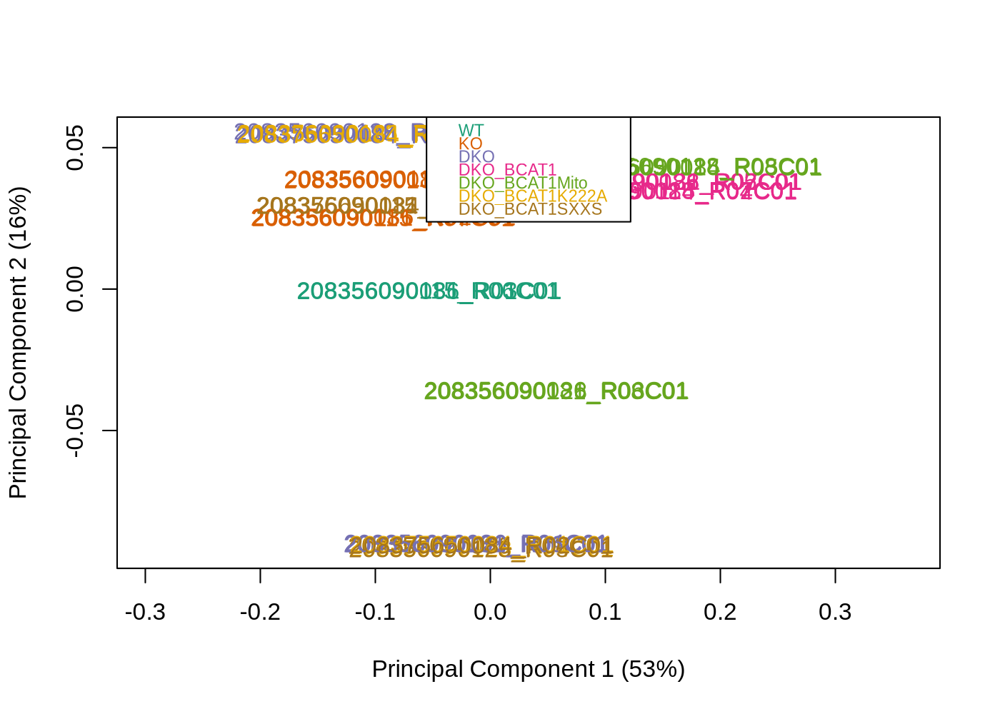

In [337]:
options(repr.plot.width = 7, repr.plot.height = 5, repr.plot.res = 200)

xx = plotMDS(bVals2, top=4000, gene.selection="common",  col=pal[factor(targets2$cellType)], labels = )
legend("top", legend=levels(factor(targets2$cellType)), text.col=pal, bg="white", cex=0.7)


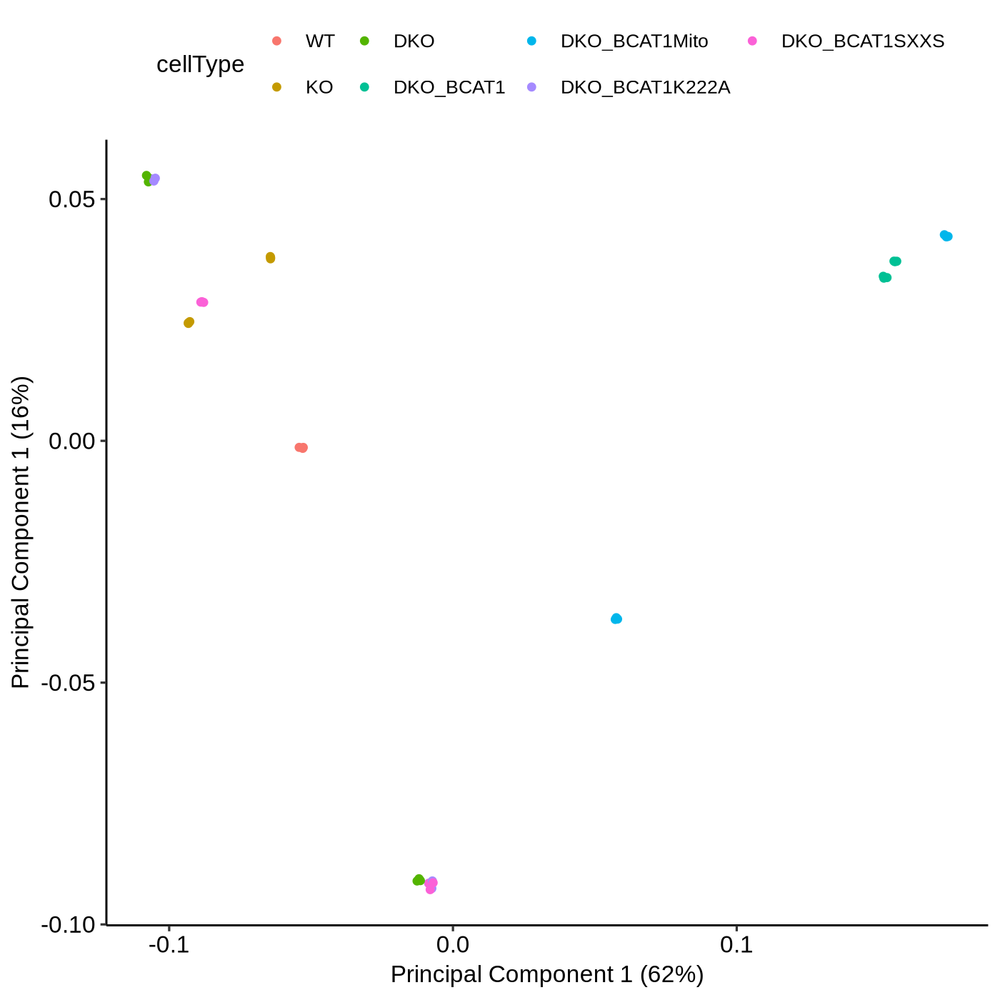

In [340]:
options(repr.plot.width = 7, repr.plot.height = 7, repr.plot.res = 200)
targets2$x = xx$x
targets2$y = xx$y
ggplot(targets2, aes(x, y, color = cellType)) + geom_point() + theme_pubr() + 
xlab('Principal Component 1 (62%)') + ylab('Principal Component 1 (16%)')

# methylation levels responding

In [341]:
head(bVals2)

,208356090086_R01C01,208356090086_R02C01,208356090086_R03C01,208356090086_R04C01,208356090086_R05C01,208356090086_R06C01,208356090086_R07C01,208356090086_R08C01,208356090115_R01C01,208356090115_R02C01,⋯,208356090131_R06C01,208356090131_R07C01,208356090131_R08C01,208375650084_R01C01,208375650084_R02C01,208375650084_R03C01,208375650084_R04C01,208375650084_R05C01,208375650084_R06C01,208375650084_R07C01
cg14817997,0.58053995,0.5952878,0.50323842,0.66416312,0.53722827,0.62309217,0.63468141,0.65820076,0.47761091,0.5392100,⋯,0.63504997,0.54451492,0.59413290,0.63010808,0.61269119,0.48159658,0.5495567,0.53285477,0.49907257,0.53608139
cg01803908,0.86325423,0.8956900,0.87571791,0.89498250,0.88815169,0.86620425,0.90504706,0.87884102,0.90000071,0.8911727,⋯,0.90474320,0.88176206,0.88605282,0.90179195,0.90420110,0.90285151,0.8634666,0.88504272,0.87434294,0.90500028
cg15174812,0.86659176,0.8771695,0.86539567,0.85225935,0.87767454,0.84575556,0.90106191,0.89181173,0.90188623,0.8826851,⋯,0.87023968,0.88720453,0.84911678,0.87970958,0.88056934,0.86696803,0.8752262,0.85271432,0.87932162,0.89215182
cg05001044,0.16046240,0.1473014,0.18007322,0.13858528,0.13229634,0.13202773,0.12977363,0.14078286,0.14253078,0.1209620,⋯,0.14692757,0.11881978,0.12351765,0.13340829,0.11481840,0.14622374,0.1373881,0.13584319,0.11779043,0.15379330
cg17501828,0.07783401,0.1052236,0.07784738,0.08158618,0.08666302,0.07325923,0.07223814,0.08268699,0.08810865,0.0877876,⋯,0.08174426,0.08074092,0.07976716,0.07520276,0.06863003,0.08309484,0.0838547,0.08777394,0.08459277,0.05579347
cg18263059,0.90779523,0.9329955,0.88452635,0.90258390,0.93210906,0.90157439,0.87529620,0.92640842,0.87845230,0.9549501,⋯,0.97533822,0.89445666,0.87881148,0.90573738,0.84489220,0.88735472,0.9105447,0.95483362,0.93120513,0.88472382


In [344]:
dmp_sel = dmp_dt[.id == 'KO__WT',]
head(dmp_sel) 
dim(dmp_sel) 

.id,rn,logFC,AveExpr,t,P.Value,adj.P.Val,B
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
KO__WT,cg04399289,2.291157,-0.2375542,26.85689,1.895157e-25,2.160536e-20,45.60951
KO__WT,cg18732252,-2.468068,1.0004378,-22.33018,1.022872e-22,5.830525e-18,40.30901
KO__WT,cg02921266,-1.697106,-2.3962468,-19.66939,7.094355e-21,2.445790e-16,36.56945
KO__WT,cg20414753,-2.135340,-2.2870066,-19.55653,8.581492e-21,2.445790e-16,36.39884
KO__WT,cg22494876,-1.843048,-0.5117567,-18.98598,2.278031e-20,5.194048e-16,35.52019
KO__WT,cg02799565,-1.716870,-1.7742804,-18.58649,4.578586e-20,8.699543e-16,34.88852


[1] 114003      8

# export import data

fwrite(gene_bed, file = 'rnaseq/human/output/gene_bed.tsv', sep = '\t')
#fwrite(deg_dt, file = 'rnaseq/human/output/deg_dt.tsv')
fwrite(deg_dt, file = 'rnaseq/human/output/deg_dt_nov14.tsv')
saveRDS(gpl33022_dt, file = 'rnaseq/human/gpl33022_human_dna_methylation.rds') 


In [325]:
#saveRDS(hsa_dmp_dt, file = 'nb_methylation_dmp_dt_nov14.rds') # based on m value
saveRDS(hsa_dmp_dt, file = 'nb_methylation_dmp_dt_Jan21.rds') # based on m value


In [463]:
saveRDS(hsa_dmp_dt3, file = 'nb_methylation_dmp_dt_mar11.rds') # based on m value


In [23]:
fwrite(deg_dt, file = 'rnaseq/human/output/deg_dt_nov14.tsv')


In [ ]:
saveRDS(gpl33022_dt, file = 'gpl33022_human_dna_methylation.rds') 

In [ ]:
saveRDS(gpl33022_dt, file = 'rnaseq/human/gpl33022_human_dna_methylation.rds') 

In [224]:
getwd()

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Junhua"

In [15]:
#gpl33022_dt = readRDS('rnaseq/human/gpl33022_human_dna_methylation.rds')
gpl33022_dt = readRDS('gpl33022_human_dna_methylation.rds')


Warning message in gzfile(file, "rb"):
“cannot open compressed file 'gpl33022_human_dna_methylation.rds', probable reason 'No such file or directory'”


ERROR: Error in gzfile(file, "rb"): cannot open the connection


In [3]:
hsa_gene_bed = fread(file = 'rnaseq/human/output/gene_bed.tsv', sep = '\t')
hsa_deg_dt = fread('rnaseq/human/output/deg_dt_nov14.tsv')
hsa_dmp_dt = readRDS('nb_methylation_dmp_dt_nov14.rds')


In [ ]:
getwd()

In [ ]:
save.image(file = 'Mar11.rdata')

In [4]:
load('Mar10.rdata')

In [8]:
getwd()

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Junhua"